# pre-processing and cleaning

## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
#from sklearn.metrics import confusion_matrix #bugged because confusion_matrix([1,1],[1,1]) = [[2]], not [[2,0],[0,0]]. Also confusion_matrix([0,0],[0,0]) = [[2]]
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import KFold
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import copy
from sklearn import tree as sktree
from sklearn.metrics import accuracy_score
from scipy.optimize import curve_fit
from scipy.stats import norm
import seaborn as sns
from sklearn.linear_model import LogisticRegression
#from sklearn.metrics import r2_score I make my own
from scipy.stats import rankdata
import warnings
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import svm, datasets
from sklearn import linear_model
import random
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier
from tqdm.auto import tqdm
from sklearn.metrics import roc_auc_score
from matplotlib.lines import Line2D
import operator as op
from functools import reduce

import torch
from torch import nn
from torch.autograd import Variable
from torch.optim import LBFGS
from torch.utils.data import Dataset, DataLoader

def confusion_matrix(y_true,y_predicted):
  true_positives = np.sum([i*j for i,j in zip(y_true,y_predicted)])
  false_negatives = np.sum([int((i==1)&(j==0)) for i,j in zip(y_true,y_predicted)])
  true_negatives = np.sum([(1-i)*(1-j) for i,j in zip(y_true,y_predicted)])
  false_positives = np.sum([int((i==0)&(j==1)) for i,j in zip(y_true,y_predicted)])
  return [[true_positives,false_positives],[false_negatives,true_negatives]]

def sensitivity_score(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  for i in y_predicted:
    assert((i == 1) | (i == 0))
  true_positives = np.sum([i*j for i,j in zip(y_true,y_predicted)])
  false_negatives = np.sum([int((i==1)&(j==0)) for i,j in zip(y_true,y_predicted)])
  if (true_positives+false_negatives) == 0:
    return np.nan
  return true_positives/(true_positives+false_negatives)

def specificity_score(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  for i in y_predicted:
    assert((i == 1) | (i == 0))
  true_negatives = np.sum([(1-i)*(1-j) for i,j in zip(y_true,y_predicted)])
  false_positives = np.sum([int((i==0)&(j==1)) for i,j in zip(y_true,y_predicted)])
  if (true_negatives+false_positives) == 0:
    return np.nan
  return true_negatives/(true_negatives+false_positives)

def r2_variance(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  return [(i-j)**2 for i,j in zip(y_true,y_predicted)]

def r2_score(y_true,y_predicted):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))  
  a = -3.25
  return np.mean([np.log(1+np.exp(a*(1-2*np.abs(i-j)))) for i,j in zip(y_true,y_predicted)])

def abs_differences(y_true,y_predicted,index = None):
  assert(len(y_true)==len(y_predicted))
  for i in y_true:
    assert((i == 1) | (i == 0))
  return pd.Series([np.abs(i-j) for i,j in zip(y_true,y_predicted)],index=index)

plt.rcParams['figure.figsize'] = [16,8]

def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

def binomial(size,rate):
  error = np.sqrt(rate*(1-rate)/size)
  return error
  
def out_of_data_z_score(size,rate,new_rate):
  return (new_rate-rate)/binomial(size,rate)

def comb(n, r):
    r = min(r, n-r)
    numer = reduce(op.mul, range(n, n-r, -1), 1)
    denom = reduce(op.mul, range(1, r+1), 1)
    return numer // denom  # or / in Python 2comb(10,2)

## Plots

In [2]:
#deprecated
def tau_plots(model_X,model_y,features_premade = [],show_features = [],random_features = True,features_each = []): #premade is always included, show_features are which part of premade you want to see (usually it won't show premade), features_each includes each feature you want to be a part of premade but you're not sure which and random_features adds other random features
  did_appear = {}
  for tau in tqdm(np.arange(0.5,7.0,0.1)):
    for i in range(10):
      random_features_list = []
      if random_features:
        random_features_list = [feature for feature in model_X.columns.drop(features_premade+features_each) if random.random() > 0.5]
      abc = random_features_list+features_premade
      if len(features_each) != 0:
        for each_feature in features_each:
          temp = hard_function(tau = tau, X = model_X[np.append(abc,each_feature)], y=model_y, estimator = estimator_models)
          if each_feature in temp:
            if each_feature not in did_appear.keys():
              did_appear[each_feature] = [tau]
            else:
              did_appear[each_feature].append(tau)
          else:
            if each_feature not in did_appear.keys():
              did_appear[each_feature] = [None]
            else:
              did_appear[each_feature].append(None)          
      else:
        temp = hard_function(tau = tau, X = model_X[abc], y=model_y, estimator = estimator_models)
      for feature in show_features+random_features_list:
        if feature in temp:
          if feature not in did_appear.keys():
            did_appear[feature] = [tau]
          else:
            did_appear[feature].append(tau)
        else:
          if feature not in did_appear.keys():
            did_appear[feature] = [None]
          else:
            did_appear[feature].append(None)        
  for i in did_appear.keys():
    fig = plt.figure(i)
    plt.plot(np.arange(len(did_appear[i])),did_appear[i])
    plt.title(i)
    plt.xlim([0,len(did_appear[i])])
    plt.ylim([0,7])
    plt.grid()
  return did_appear

def confidence_plot(y,y_low=-0.2,y_high = 1.2, y_step = 0.07, edge = 0.5, flip = True,**models):
  warnings.filterwarnings('ignore')
  for j,model in models.items():
    temp = [np.average(y[(model > i) & (model < i + y_step)]) for i in np.arange(y_low,y_high,y_step)]
    if flip:
      for k in range(len(np.arange(y_low,y_high,y_step))):
        if round(y_low + (k+1/2)*y_step,1) <= edge:
          temp[k] = 1-temp[k]
    fig1 = plt.figure(figsize=(24,8))

    plt.errorbar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp,yerr = [1/np.sqrt(model[(model > i) & (model < i + y_step)].count()) for i in np.arange(y_low,y_high,y_step)],label=i)
    plt.ylim([0,1])

  if flip:
    plt.title(f'Confidence in result versus y_predicted value, edge = {edge}')
  else:
    plt.title(f'Average of y versus y_predicted value, edge = {edge}')
  plt.legend()
  plt.grid()
  plt.show()
  warnings.resetwarnings()

def population_y_predicted(y_low=-0.2,y_high = 1.2, y_step = 0.07,**models):
  warnings.filterwarnings('ignore')
  for i,model in models.items():
    print(i)
    temp = [model[(model > i) & (model < i + y_step)].count() for i in np.arange(y_low,y_high,y_step)]
    plt.figure(figsize=(24,8))
    plt.bar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp,label=i)
    plt.legend()
    plt.grid()
    plt.show()
  warnings.resetwarnings()

def delta_accuracy(model1,model2,step = 0.01,ymin=0.0,ymax=1.0):
  accuracy_deltas = []
  accuracy_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,estimator=estimator_models)
    accuracy_delta = numbers["Delta_Accuracy"]
    accuracy_delta_err = numbers["Delta_Accuracy_Error"]
    accuracy_deltas.append(accuracy_delta)
    accuracy_deltas_err.append(accuracy_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,accuracy_deltas,yerr=accuracy_deltas_err)
  plt.title(f"Accuracy difference vs Edge, first_model_accuracy - second_model_accuracy") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.grid()
  plt.show()
  plt.close()

def delta_sensitivity(model1,model2,step = 0.01,ymin=0.1,ymax=0.5):
  sensitivity_deltas = []
  sensitivity_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,estimator=estimator_models)
    sensitivity_delta = numbers['Delta_Sensitivity']
    sensitivity_delta_err = numbers['Delta_Sensitivity_Error']
    sensitivity_deltas.append(sensitivity_delta)
    sensitivity_deltas_err.append(sensitivity_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,sensitivity_deltas,yerr=sensitivity_deltas_err)
  plt.title(f"Sensitivity difference vs Edge, first_model_sensitivity - second_model_sensitivity") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.grid()
  plt.show()
  plt.close()
  return sensitivity_deltas,sensitivity_deltas_err

def delta_specificity(model1,model2,step = 0.01,ymin=0.1,ymax=0.5):
  specificity_deltas = []
  specificity_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    _,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,estimator=estimator_models)
    specificity_delta = numbers['Delta_Specificity']
    specificity_delta_err = numbers['Delta_Specificity_Error']
    specificity_deltas.append(specificity_delta)
    specificity_deltas_err.append(specificity_delta_err)
  fig = plt.figure()
  x_range = [i for i in np.arange(ymin,ymax+step,step)]
  plt.errorbar(x_range,specificity_deltas,yerr=specificity_deltas_err)
  plt.title(f"Specificity difference vs Edge, first_model_specificity - second_model_specificity") 
  plt.plot(x_range,0*np.ones_like(x_range))
  plt.grid()
  plt.show()
  plt.close()
  return specificity_deltas,specificity_deltas_err

def sensitivity_specificity_edge(model,step = 0.01,ymin=0.0,ymax=1.0,show=False,one_point_one_Sample=False):
  sensitivitys_specificitys = []
  if one_point_one_Sample:
    abc = sorted(model)
    _,numbers = loading_scores(model,y,pad=False,edge=abc[0]/2,show=False,estimator=estimator_models)
    sensitivity = numbers["Sensitivity"]
    specificity = numbers["Specificity"]
    sensitivitys_specificitys.append([sensitivity,specificity,abc[0]/2])
    for i in range(len(abc)-1):
      _,numbers = loading_scores(model,y,pad=False,edge=(abc[i]+abc[i+1])/2,show=False,estimator=estimator_models)
      sensitivity = numbers["Sensitivity"]
      specificity = numbers["Specificity"]
      sensitivitys_specificitys.append([sensitivity,specificity,abc[i]])
    _,numbers = loading_scores(model,y,pad=False,edge=(1.0+abc[-1])/2,show=False,estimator=estimator_models)
    sensitivity = numbers["Sensitivity"]
    specificity = numbers["Specificity"]
    sensitivitys_specificitys.append([sensitivity,specificity,(1.0+abc[-1])/2])
  else:
    for i in np.arange(ymin,ymax + step,step):
      _,numbers = loading_scores(model,y,pad=False,edge=i,show=False,estimator=estimator_models)
      sensitivity = numbers["Sensitivity"]
      specificity = numbers["Specificity"]
      sensitivitys_specificitys.append([sensitivity,specificity,i])
  return sensitivitys_specificitys

def sensitivity_accuracy(step = 0.0025,ymin=0.1,ymax=0.7,sensitivity_range=[0.75,0.95],accuracy_range=[0.70,0.90],xerr=False,yerr=False,**models):
  fig = plt.figure()
  all_sensitivitys = {}
  all_sensitivitys_err = {}
  all_accuracies = {}
  all_accuracies_err = {}
  all_edges = {}
  out = {}
  for i,model in models.items():
    edges = []
    sensitivitys = []
    sensitivitys_err = []
    accuracies = []
    accuracies_err = []
    for edge in np.arange(ymin,ymax + step,step):
      _,numbers = loading_scores(model,y,pad=False,edge=edge,show=False,estimator=estimator_models)
      accuracy = numbers["Accuracy"]
      accuracy_err = numbers["Accuracy_Error"]
      sensitivity = numbers["Sensitivity"]
      sensitivity_err = numbers["Sensitivity_Error"]
      accuracies.append(accuracy)
      accuracies_err.append(accuracy_err)
      sensitivitys.append(sensitivity)
      sensitivitys_err.append(sensitivity_err)
      edges.append(edge)
    all_sensitivitys[i] = sensitivitys
    all_sensitivitys_err[i] = sensitivitys_err
    all_accuracies[i] = accuracies
    all_accuracies_err[i] = accuracies_err
    all_edges[i] = edges
    out[i] = [[a,b,c] for a,b,c in zip(sensitivitys,accuracies,edges)]
    if xerr:
      if yerr:
        #plt.errorbar(sensitivitys,accuracies,label = i)
        plt.errorbar(sensitivitys,accuracies,xerr = sensitivitys_err,yerr=accuracies_err,label = i)
        #plt.fill_between(np.array(sensitivitys) - np.array(accuracies_err), np.array(accuracies)-np.array(accuracies_err), np.array(accuracies)+np.array(accuracies_err),color='tab:cyan')
        #plt.fill_between(np.array(sensitivitys) - 0.5*np.array(accuracies_err), np.array(accuracies)-np.array(accuracies_err), np.array(accuracies)+np.array(accuracies_err),color='tab:cyan')
        #plt.fill_between(np.array(sensitivitys), np.array(accuracies)-np.array(accuracies_err), np.array(accuracies)+np.array(accuracies_err),color='tab:cyan')
        #plt.fill_between(np.array(sensitivitys) + 0.5*np.array(accuracies_err), np.array(accuracies)-np.array(accuracies_err), np.array(accuracies)+np.array(accuracies_err),color='tab:cyan')
        #plt.fill_between(np.array(sensitivitys) + np.array(accuracies_err), np.array(accuracies)-np.array(accuracies_err), np.array(accuracies)+np.array(accuracies_err),color='tab:cyan')
      else:
        plt.errorbar(sensitivitys,accuracies,xerr = sensitivitys_err,label = i)
    else:
      if yerr:
        plt.errorbar(sensitivitys,accuracies,yerr=accuracies_err,label = i)
      else:
        plt.errorbar(sensitivitys,accuracies,label = i)
    #plt.plot(sensitivitys,accuracies,label = i)
  plt.title(f"Accuracy vs Sensitivity")
  plt.xlim(sensitivity_range)
  plt.ylim(accuracy_range)
  plt.xlabel("Sensitivity")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.grid()
  plt.show()
  plt.close()
  return out

def sensitivity_delta_accuracy(model1,model2,step = 0.0025,ymin=0.0,ymax=1.0,sensitivity_range=[0.0,1.0],accuracy_delta_range=[-0.10,0.10],xerr=False,yerr=False):
  sensitivitys1 = sensitivity_specificity_edge(model1,step=step,ymin=ymin,ymax=ymax)
  sensitivitys2 = sensitivity_specificity_edge(model2,step=step,ymin=ymin,ymax=ymax)
  sensitivitys = []
  sensitivitys_err = []
  accuracy_deltas = []
  accuracy_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    epsilon = 1.0
    for sensitivity1,_,edge1 in sensitivitys1:
      if np.abs(edge1 - i) < epsilon:
        closest_sensitivity1 = sensitivity1
        epsilon = np.abs(edge1 - i)
    epsilon = 1.0
    for sensitivity2,_,edge2 in sensitivitys2:
      if np.abs(sensitivity2 - closest_sensitivity1) < epsilon:
        closest_edge = edge2
        epsilon = np.abs(sensitivity2 - closest_sensitivity1)
    edge2 = closest_edge
    _,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,edge2=edge2,estimator=estimator_models)
    sensitivity = numbers["Sensitivity"]
    sensitivity_err = numbers["Sensitivity_Error"]
    accuracy_delta = numbers["Delta_Accuracy"]
    accuracy_delta_err = numbers["Delta_Accuracy_Error"]
    accuracy_deltas.append(accuracy_delta)
    accuracy_deltas_err.append(accuracy_delta_err)
    sensitivitys.append(sensitivity)
    sensitivitys_err.append(sensitivity_err)
  fig = plt.figure()
  if xerr:
    if yerr:
      plt.errorbar(sensitivitys,accuracy_deltas,xerr = sensitivitys_err,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,accuracy_deltas,xerr = sensitivitys_err)
  else:
    if yerr:
      plt.errorbar(sensitivitys,accuracy_deltas,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,accuracy_deltas)
  plt.title(f"Accuracy difference vs Sensitivity, first_model_accuracy - second_model_accuracy") 
  plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
  plt.xlim(sensitivity_range)
  plt.ylim(accuracy_delta_range)
  plt.grid()
  plt.show()
  plt.close()
  return sensitivitys,sensitivitys_err,accuracy_deltas,accuracy_deltas_err

#this one tries not to have 'correlations'. Delta here means edge - edge', delta means model1 - model2.
def Delta_sensitivity_delta_specificity(model1,model2,step = 0.0025,ymin=0.0,ymax=1.0,sensitivity_range=[0.0,1.0],specificity_delta_range=None,xerr=False,yerr=False):
  specificity_delta = 0.0
  sensitivitys1 = sensitivity_specificity_edge(model1,step=step,ymin=ymin,ymax=ymax)
  sensitivitys2 = sensitivity_specificity_edge(model2,step=step,ymin=ymin,ymax=ymax)
  sensitivitys = []
  sensitivitys_err = []
  specificity_deltas = []
  specificity_deltas_err = []
  for i in np.arange(ymin,ymax + step,step):
    epsilon = 1.0
    for sensitivity1,_,edge1 in sensitivitys1:
      if np.abs(edge1 - i) < epsilon:
        closest_sensitivity1 = sensitivity1
        epsilon = np.abs(edge1 - i)
    epsilon = 1.0
    for sensitivity2,_,edge2 in sensitivitys2:
      if np.abs(sensitivity2 - closest_sensitivity1) < epsilon:
        closest_edge = edge2
        epsilon = np.abs(sensitivity2 - closest_sensitivity1)
    edge2 = closest_edge
    _,numbers = loading_scores(model1,y,pad=False,edge=i,b_compare=model2,show=False,edge2=edge2,estimator=estimator_models)
    temp1 = specificity_delta
    sensitivity = numbers["Sensitivity"]
    sensitivity_err = numbers["Sensitivity_Error"]
    specificity_delta = numbers["Delta_Specificity"]
    specificity_delta_err = numbers["Delta_Specificity_Error"]
    specificity_deltas.append(specificity_delta-temp1)
    #accuracy_deltas_err.append(accuracy_delta_err)
    sensitivitys.append(sensitivity)
    #sensitivitys_err.append(sensitivity_err)
  fig = plt.figure()
  if xerr:
    if yerr:
      plt.errorbar(sensitivitys,specificity_deltas,xerr = sensitivitys_err,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,specificity_deltas,xerr = sensitivitys_err)
  else:
    if yerr:
      plt.errorbar(sensitivitys,specificity_deltas,yerr=accuracy_deltas_err)
    else:
      plt.errorbar(sensitivitys,specificity_deltas)
  plt.title(f"Delta Specificity difference vs Sensitivity, first_model - second_model") 
  plt.plot(sensitivitys,0*np.ones_like(sensitivitys))
  plt.xlim(sensitivity_range)
  if specificity_delta_range:
    plt.ylim(specificity_delta_range)
  plt.grid()
  plt.show()
  plt.close()
  return sensitivitys,sensitivitys_err,specificity_deltas,specificity_deltas_err

def delta_r2(model1,model2):
  _,numbers = loading_scores(model1,y,pad=False,b_compare=model2,show=False,estimator=estimator_models)
  r2_delta = numbers[8]
  r2_delta_err = numbers[9]
  return f"R^2 of model 1 - R^2 of model 2 = {r2_delta}+-{r2_delta_err}"

def ROC(step = 0.0025,ymin=0.0,ymax=1.0,specificity_range=None,sensitivity_range=None,**models):
  fig = plt.figure(figsize=[8,8])
  all_sensitivitys = {}
  all_sensitivitys_err = {}
  all_specificitys = {}
  all_specificitys_err = {}
  all_edges = {}
  for i,model in models.items():
    edges = []
    sensitivitys = []
    sensitivitys_err = []
    specificitys = []
    specificitys_err = []
    for edge in np.arange(ymin,ymax + step,step):
      _,numbers = loading_scores(model,y,pad=False,edge=edge,show=False,estimator=estimator_models)
      specificity = numbers["Specificity"]
      specificity_err = numbers["Specificity_Error"]
      sensitivity = numbers["Sensitivity"]
      sensitivity_err = numbers["Sensitivity_Error"]
      specificitys.append(specificity)
      specificitys_err.append(specificity_err)
      sensitivitys.append(sensitivity)
      sensitivitys_err.append(sensitivity_err)
      edges.append(edge)
    all_sensitivitys[i] = sensitivitys
    all_sensitivitys_err[i] = sensitivitys_err
    all_specificitys[i] = specificitys
    all_specificitys_err[i] = specificitys_err
    all_edges[i] = edges
    plt.plot(sensitivitys,specificitys,label = i)
  plt.title(f"Specificity vs Sensitivity")
  if sensitivity_range:
    plt.xlim(sensitivity_range)
  if specificity_range:
    plt.ylim(specificity_range)
  plt.xlabel("Sensitivity")
  plt.ylabel("Specificitys")
  plt.legend()
  plt.grid()
  plt.show()
  plt.close()
  return all_sensitivitys,all_specificitys,all_edges

def radial_delta_accuracy(model1,model2, ymin=0.0,ymax=1.0, step = 0.0025, smooth = 0, yerr=True,sensitivitys_specificitys1=None,sensitivitys_specificitys2=None,adjust_p_values = False,sensitivity_x = True):
  print('When deciding which model is better, we give Sensitivity and Specificity equal "weight".')
  if sensitivitys_specificitys1 is None:
    sensitivitys_specificitys1 = sensitivity_specificity_edge(model1,step=step,ymin=ymin,ymax=ymax,one_point_one_Sample=True)
  if sensitivitys_specificitys2 is None:
    sensitivitys_specificitys2 = sensitivity_specificity_edge(model2,step=step,ymin=ymin,ymax=ymax,one_point_one_Sample=True)

  r_temp = (0,0)
  delta_rs = []
  edges1 = []
  edges2 = []
  rs = []
  rs_err = []
  angles = []
  xx = []
  for sensitivity1,specificity1,edge1 in sensitivitys_specificitys1:
    closest_sensitivity1 = sensitivity1
    closest_specificity1 = specificity1
    found_edge1 = edge1
    #not needed because of one_point_one_Sample
    # #make sure we don't have the same point twice
    # if len(xx) > 0:
    #   if (np.round(closest_sensitivity1,5) != np.round(temp2,5)) | (np.round(closest_specificity1,5) != np.round(temp,5)):
    #     if sensitivity_x:
    #       xx.append(closest_sensitivity1)
    #     else:
    #       xx.append(found_edge1)
    #   else:
    #     continue
    # else:
    if sensitivity_x:
      xx.append(closest_sensitivity1)
    else:
      xx.append(found_edge1)
    temp = closest_specificity1
    temp2 = closest_sensitivity1
    edges1.append(found_edge1)
    epsilon = 1.0
    for sensitivity2,specificity2,edge2 in sensitivitys_specificitys2:
      if np.sqrt((sensitivity2 - closest_sensitivity1)**2 + (specificity2 - closest_specificity1)**2) < epsilon: #if the sensitivity and specificity have 'equal error bars', then we just find the closest one
        closest_edge = edge2
        epsilon = np.sqrt((sensitivity2 - closest_sensitivity1)**2 + (specificity2 - closest_specificity1)**2)
    edge2 = closest_edge
    edges2.append(edge2)
    _,numbers = loading_scores(model1,y,pad=False,edge=edge1,b_compare=model2,show=False,edge2=edge2,estimator=estimator_models)
    delta_sensitivity = -numbers["Delta_Sensitivity"] # don't ask me why this is -
    delta_sensitivity_err = numbers["Delta_Sensitivity_Error"]
    delta_specificity = numbers["Delta_Specificity"]
    delta_specificity_err = numbers["Delta_Specificity_Error"]
    r = np.sqrt(delta_sensitivity**2 + delta_specificity**2)
    delta_r = (delta_sensitivity - r_temp[0],delta_specificity - r_temp[1])
    delta_r = np.sqrt(np.abs(np.sign(delta_r[0])*delta_r[0]**2 + np.sign(delta_r[1])*delta_r[1]**2)) # here when 'positive' Sensitivity becomes 'positive' Specificity, we don't count it.
    delta_rs.append(delta_r)
    r_temp = (delta_sensitivity,delta_specificity)
    if r != 0.0:
      df_1 = delta_sensitivity/r
      df_2 = delta_specificity/r
      r_err = np.sqrt(df_1**2*delta_sensitivity_err**2 + df_2**2*delta_specificity_err**2)
    else:
      r_err = np.sqrt(1/2*delta_sensitivity_err**2 + 1/2*delta_specificity_err**2) # here it depends on the direction that r=0 is achieved. We use 45 degrees.
    rs.append(r)
    rs_err.append(r_err)
    if (delta_specificity == 0.0) & (delta_sensitivity > 0.0):
      angle = 0.0
    elif (delta_specificity == 0.0) & (delta_sensitivity < 0.0):
      angle = 180.0
    else: 
      if r != 0.0:
        angle = 180.0/np.pi*2.0*np.arctan(delta_specificity/(delta_sensitivity+r)) #this goes from -180 to 180
      else:
        angle = np.nan
    angles.append(angle)

  if smooth > 0:
    print(f"'smooth' {2*smooth + 1} points: We think about angles in two opposite buckets: model 1 better and model 2 better. Really these have to be added as Vectors.")
    print("'smooth': Use only for points with the same direction.")
    rs_err = [i**2 for i in rs_err]
    # i_max = len(rs) - 2*two_smooth - 1
    # j_max = 2*two_smooth - 1
    # i_max + j_max + 1 = len(rs) - 1
    for i in range(len(rs)-2*smooth):
      for j in range(2*smooth):
        rs[i] += rs[i+j+1]
        rs_err[i] += rs_err[i+j+1] # these need to be added like x**2
        xx[i] += xx[i+j+1]
    rs = rs[:-2*smooth]
    rs_err = rs_err[:-2*smooth]
    xx = xx[:-2*smooth]
    rs = [i/(2*smooth + 1) for i in rs]
    rs_err = [np.sqrt(i/(2*smooth + 1)) for i in rs_err]
    xx = [i/(2*smooth + 1) for i in xx]
    edges1 = edges1[smooth:-smooth]
    edges2 = edges2[smooth:-smooth]
    angles = angles[smooth:-smooth]

  col = []
  for i in range(len(xx)):
    if (-180<=angles[i]<-45) or (135<angles[i]<=180): # we use Sensitivity == Specificity in our cost.
        col.append('blue')  
    elif -45<angles[i]<=135:
        col.append('orange') 
        rs[i] = -rs[i]
        delta_rs[i] = -delta_rs[i]
    else:
        col.append('green')  # this is np.nan for r=0 
  
  fig2 = plt.figure()
  plt.scatter(xx,angles,c=col)
  plt.plot(xx,angles)
  plt.title(f"Direction from first model to closest point on second model") 
  if sensitivity_x:
    plt.xlabel("Sensitivity1")
  else:
    plt.xlabel("Edge1")
  plt.ylabel("Angle(-180 to 180 degrees)")  
  plt.grid()
  legend_elements = [Line2D([0], [0], marker='o', color='w', label='first_better',
                          markerfacecolor='blue', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='second_better',
                          markerfacecolor='orange', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='unsure',
                          markerfacecolor='green', markersize=8)]
  plt.legend(handles=legend_elements, loc="upper left")  
  plt.show()

  fig = plt.figure()
  plt.scatter(xx,rs,c=col)
  if yerr:
    plt.errorbar(xx,rs,yerr=rs_err)
  else:
    plt.errorbar(xx,rs)
  if sensitivity_x:
    plt.xlabel("Sensitivity1")
    plt.title(f"Radial Delta Accuracy vs Sensitivity1, first_model - second_model") 
  else:
    plt.xlabel("Edge1")
    plt.title(f"Radial Delta Accuracy vs Edge1, first_model - second_model") 
  plt.ylabel("Radial Delta Accuracy")
  plt.grid()
  legend_elements = [Line2D([0], [0], marker='o', color='w', label='first_better',
                          markerfacecolor='blue', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='second_better',
                          markerfacecolor='orange', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='unsure',
                          markerfacecolor='green', markersize=8)]
  plt.legend(handles=legend_elements, loc="upper left")  
  plt.show()

  for i in range(len(rs_err)):
    if (np.isnan(rs_err[i])) & (rs[i]==0.0):
      rs_err[i] = 0.000001
  z_scores = [i/j for i,j in zip(rs,rs_err)]
  if adjust_p_values:
    z_scores = adjusted_p_values(z_scores)
  scatter = plt.scatter(xx,z_scores,c=col)
  plt.plot(xx,z_scores)
  legend_elements = [Line2D([0], [0], marker='o', color='w', label='first_better',
                          markerfacecolor='blue', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='second_better',
                          markerfacecolor='orange', markersize=8),
                     Line2D([0], [0], marker='o', color='w', label='unsure',
                          markerfacecolor='green', markersize=8)]
  plt.legend(handles=legend_elements, loc="upper left")
  plt.title(f"Z-scores") 
  if sensitivity_x:
    plt.xlabel("Sensitivity1")
  else:
    plt.xlabel("Edge1")
  plt.ylabel("Z-scores")
  plt.grid()
  plt.show()

  fig = plt.figure()
  # if sensitivity_x:
  #   if yerr:
  #     plt.scatter(xx,delta_rs,c=col)
  #     #plt.errorbar(xx,rs,yerr=rs_err)
  #   else:
  #     plt.scatter(xx,delta_rs,c=col)
  #     plt.errorbar(xx,delta_rs)
  #   plt.xlabel("Sensitivity1")
  #   plt.title(f"Delta Radial Delta Accuracy vs Sensitivity1, first_model - second_model") 
  # else:
  plt.scatter(range(len(delta_rs)),delta_rs,c=col)
  if sensitivity_x:
    plt.xlabel("Sensitivity1")
  else:
    plt.xlabel("Edge1")
  plt.xticks(np.arange(0, len(delta_rs), step=20), np.round(xx[::20],3))
  plt.title(f"Delta Radial Delta Accuracy, each point is a person, first_model - second_model") 
  plt.ylabel("Delta Radial Delta Accuracy")
  plt.grid()
  legend_elements = [Line2D([0], [0], marker='o', color='w', label='first_better',
                          markerfacecolor='blue', markersize=8),
                    Line2D([0], [0], marker='o', color='w', label='second_better',
                          markerfacecolor='orange', markersize=8),
                    Line2D([0], [0], marker='o', color='w', label='unsure',
                          markerfacecolor='green', markersize=8)]
  plt.legend(handles=legend_elements, loc="upper left")  
  plt.show()

  plt.close()

  result = {}
  result['delta_rs'] = delta_rs
  result['edges1'] = edges1
  result['edges2'] = edges2
  result['rs'] = rs
  result['rs_err'] = rs_err
  result['angles'] = angles
  result['sensitivitys_specificitys1'] = sensitivitys_specificitys1
  result['sensitivitys_specificitys2'] = sensitivitys_specificitys2

  return result

def fdr(p_vals):
  ranked_p_values = rankdata(p_vals)
  fdr = p_vals * len(p_vals) / ranked_p_values
  for i in range(len(fdr)-1):
    if fdr[i]>fdr[i+1]:
      fdr[i]=fdr[i+1]
  fdr[fdr > 1] = 1
  return fdr

def adjusted_p_values(z_scores):
  p_values = norm.sf(z_scores)*2 #twoside
  adjusted_p_values = fdr(p_values)
  adjusted_z_scores = norm.ppf(1-adjusted_p_values/2)
  return adjusted_z_scores

def log_likelihood(first_model,y,y_low=0.0,y_high = 1.0, y_step = 0.04, flip = True):
  warnings.filterwarnings('ignore')
  
  delta_y = np.abs(y - first_model)

  temp = [len([delta for delta in delta_y if ((delta > i) & (delta < i + y_step))]) for i in np.arange(y_low,y_high,y_step)]

  temp = [i/len(y) for i in temp]

  temp = np.log(temp)

  fig1 = plt.figure(figsize=(24,8))

  plt.errorbar([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],temp)
  
  regr = linear_model.LinearRegression()

  regr.fit(np.reshape([ i+y_step/2 for i in np.arange(y_low,y_high,y_step)],(-1, 1)), temp)

  line = regr.predict(np.reshape([ i+y_step/2 for i in np.arange(y_low,y_high,y_step)],(-1, 1)))

  plt.plot([np.str(round(i,2)) + "-" + np.str(round(i+y_step,2)) for i in np.arange(y_low,y_high,y_step)],line)

  plt.show()
  warnings.resetwarnings()

  return regr.coef_[0],regr.intercept_
  

## Estimators and Cross-correlation

In [3]:
def sigmoid(x):
  return 1/(1+np.exp(-x))

def log_odds_ratio(y):
  return np.log(y/(1-y))

def estimator_models(X,y,index,edge=0.5,b_compare=None,edge2=None):
  if edge2 is None:
    edge2 = edge
  b_predicted_2 = np.rint(X>edge)

  accuracy = accuracy_score(y,b_predicted_2)
  accuracy_err = np.sqrt(accuracy*(1-accuracy)/len(y)) #thinking of this as a binomial problem

  abs_differences_ = abs_differences(y,X,index)
  def likelihood_error(error,a):
    return 1/(1+np.exp(a*(1-2*error)))
  a = 3.3
  abs_differences_sum = np.sum([likelihood_error(i,a) for i in abs_differences_])
  abs_differences_err_sum = np.std([likelihood_error(i,a) for i in abs_differences_])*np.sqrt(len(abs_differences_))
  # this is really not the same likelihood function that you can use for y_abs_difference, but usually this is what people do
  y_abs_differences = [likelihood_error(np.abs(i-np.mean(y)),a) for i in y]
  y_abs_differences_sum = np.sum(y_abs_differences)
  y_abs_differences_err_sum = np.std(y_abs_differences)*np.sqrt(len(y_abs_differences))
  r2 = 1-abs_differences_sum/y_abs_differences_sum
  r2_err = np.sqrt(1.0/y_abs_differences_sum**2*abs_differences_err_sum**2+(abs_differences_sum/y_abs_differences_sum**2)**2*y_abs_differences_err_sum**2)

  sensitivity = sensitivity_score(y,b_predicted_2)
  sensitivity_sample = np.count_nonzero(y == 1)
  sensitivity_err = np.sqrt(sensitivity*(1-sensitivity)/sensitivity_sample)

  specificity = specificity_score(y,b_predicted_2)
  specificity_sample = np.count_nonzero(y == 0)
  specificity_err = np.sqrt(specificity*(1-specificity)/specificity_sample)

  confusion = np.array(confusion_matrix(y,b_predicted_2))

  auc = roc_auc_score(y,X)

  result = {}
  result['accuracy'] = accuracy
  result['accuracy_err'] = accuracy_err
  result['r2'] = r2
  result['r2_err'] = r2_err
  result['sensitivity'] = sensitivity
  result['sensitivity_err'] = sensitivity_err
  result['specificity'] = specificity
  result['specificity_err'] = specificity
  result['confusion'] = confusion
  result['auc'] = auc

  if b_compare is not None:
    b_compare_test = b_compare
    b_compare_test_2 = np.rint(b_compare > edge2)
    compare_accuracy = accuracy_score(y,b_compare_test_2)
    compare_r2 = r2_score(y,b_compare_test)
    sensitivity_0 = np.sum([np.rint((a==b) & (c == 1)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    sensitivity_neg_1 = np.sum([np.rint((a<b) & (c == 1)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    sensitivity_pos_1 = np.sum([np.rint((a>b) & (c == 1)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    specificity_0 = np.sum([np.rint((a==b) & (c == 0)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    specificity_neg_1 = np.sum([np.rint((a<b) & (c == 0)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    specificity_pos_1 = np.sum([np.rint((a>b) & (c == 0)) for a,b,c in zip(b_predicted_2,b_compare_test_2,y)])
    delta_r2 = r2 - compare_r2
#    delta_r2_err = np.std() who needs this
    delta_accuracy = accuracy - compare_accuracy
    #this doesn't work because it's a - b which is not binomial
    #delta_accuracy_err = np.sqrt(accuracy*(1-accuracy)/len(y))
    delta_accuracy_err = np.std(b_predicted_2-b_compare_test_2)/np.sqrt(len(y))
    result['delta_accuracy'] = delta_accuracy
    result['delta_accuracy_err'] = delta_accuracy_err
    result['delta_r^2'] = delta_r2
#    result['delta_r^2_err'] = delta_r2_err
    result['delta_sensitivitys'] = [sensitivity_0,sensitivity_neg_1,sensitivity_pos_1]
    result['delta_specificitys'] = [specificity_0,specificity_neg_1,specificity_pos_1] 
    result['specificity_sample'] = specificity_sample
    result['sensitivity_sample'] = sensitivity_sample
  return result

def estimator_SVD(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=1.0): #q,p are not used
  if len(A_train.shape) == 1:
    b_predicted_test = A_test
    b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
    b_predicted_train = A_train
    b_predicted_train_2 = [int(row > edge) for row in b_predicted_train]
    x_fit = 1
    S = 1
  else:
    U,S,VT = np.linalg.svd(A_train,full_matrices=False)
    if r != 0:
      U = U[:,:r+1]
      S = S[:r+1]
      VT = VT[:r+1,:]
    S = np.diag(S)
    A_train_inv = VT.T @ np.linalg.inv(S) @ U.T
    x_fit = A_train_inv @ b_train
    b_predicted_test = A_test @ x_fit
    b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
    b_predicted_train = A_train @ x_fit
    b_predicted_train_2 = [int(row > edge) for row in b_predicted_train]
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  #test_r2 = r2_score(b_test,b_predicted_test)
  test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
  train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  if np.isnan(test_accuracy):
    test_accuracy = 0 # this is if we have 0 'sample size'
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['S'] = S
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  result['b_predicted_train'] = b_predicted_train
  return result

def cross_correlate_with_two_features(X,y,features1,features2,pad,estimator,method,nr_folds = 30, edge=0.5,c=None,gamma=None,show=False,svd_fit = True,svm_dim=2):
  result = {}
  result['test_accuracy'] = []
  result['train_accuracy'] = []
  result['x_fit'] = []
  result['test_abs_differences'] = pd.Series(dtype='float64',index=X.index)
  result['train_abs_differences'] = pd.DataFrame(dtype='float64',index=X.index)
  result['test_sensitivity'] = []
  result['train_sensitivity'] = []
  result['test_specificity'] = []
  result['train_specificity'] = []
  result['confusion'] = []
  result['test_sensitivity_sample'] = []
  result['test_specificity_sample'] = []
  result['train_sensitivity_sample'] = []
  result['train_specificity_sample'] = []
  result['b_train'] = []
  result['b_predicted_test'] = pd.Series(dtype='float64',index=X.index)
  result['which_model'] = []
  kf = KFold(n_splits=nr_folds,shuffle=True)
  gen = kf.split(X)
  gens = []
  for generator in gen:
    gens.append(generator)
  i = 0
  for generator in gens:
    i+=1
    A_train_1, A_test_1 = X[features1].iloc[generator[0]].to_numpy(), X[features1].iloc[generator[1]].to_numpy()
    A_train_2, A_test_2 = X[features2].iloc[generator[0]].to_numpy(), X[features2].iloc[generator[1]].to_numpy()
    test_index = X.iloc[generator[1]].index
    train_index = X.iloc[generator[0]].index
    b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
    for i in b_train:
      assert((i == 1) | (i == 0))
    for i in b_test:
      assert((i == 1) | (i == 0))
    if pad:
      A_train_1 = np.pad(A_train_1,[(0,0),(0,1)],constant_values=1)
      A_test_1 = np.pad(A_test_1,[(0,0),(0,1)],constant_values=1)
      A_train_2 = np.pad(A_train_2,[(0,0),(0,1)],constant_values=1)
      A_test_2 = np.pad(A_test_2,[(0,0),(0,1)],constant_values=1)    
    out_1 = estimator(A_train_1,A_test_1,b_train,b_test,test_index,train_index,edge=edge)
    out_2 = estimator(A_train_2,A_test_2,b_train,b_test,test_index,train_index,edge=edge)
    b_train = pd.Series(b_train,index=train_index)
    b_test = pd.Series(b_test,index=test_index)
    b_predicted_test_1 = pd.Series(out_1['b_predicted_test'],index=test_index)
    b_predicted_train_1 = pd.Series(out_1['b_predicted_train'],index=train_index)
    b_predicted_test_2 = pd.Series(out_2['b_predicted_test'],index=test_index)
    b_predicted_train_2 = pd.Series(out_2['b_predicted_train'],index=train_index)

    if method == 'svm':
      if svm_dim == 2:
        X_k_neighbors_train = np.column_stack((b_predicted_train_1,b_predicted_train_2)) # using both models for svm
        X_k_neighbors_test = np.column_stack((b_predicted_test_1,b_predicted_test_2))
      else:
        X_k_neighbors_train = b_predicted_train_1.to_numpy().reshape(-1,1) # using just model1 for svm
        X_k_neighbors_test = b_predicted_test_1.to_numpy().reshape(-1,1)
      b_best_train = pd.Series(dtype='float64',index=train_index)
      for i in train_index:
        if np.abs(b_predicted_train_1[i] - b_train[i]) < np.abs(b_predicted_train_2[i] - b_train[i]):
          b_best_train.loc[i] = 1.0
        else:
          b_best_train.loc[i] = 0.0
      if gamma is None:
        gamma='scale'
      if c is None:
        c = 1.0
      clf = svm.SVC(kernel='rbf', gamma=gamma, C=c)
      #clf = svm.SVC(kernel='poly', gamma=gamma, C=c,degree=2) # this is really slow
      clf.fit(X_k_neighbors_train, b_best_train)
      which_model_train = pd.Series(clf.predict(X_k_neighbors_train),index=train_index)
      which_model_test = pd.Series(clf.predict(X_k_neighbors_test),index=test_index)
      
      def helper(a,b,c):
        assert ((a==1.0) | (a == 0.0))
        if a == 1.0:
          return b
        else:
          return c

      def divide(which_model,index):
        group1 = []
        group2 = []
        for i,j in zip(which_model,index):
          if i == 1.0:
            group1.append(j)
          else:
            group2.append(j)
        return group1,group2

      if svd_fit:    
        group1_train,group2_train = divide(which_model_train,train_index)
        group1_test,group2_test = divide(which_model_test,test_index)

        b_predicted_train_1_group_1 = b_predicted_train_1.loc[group1_train]
        b_predicted_train_2_group_1 = b_predicted_train_2.loc[group1_train]
        b_predicted_train_group_1 = np.column_stack((b_predicted_train_1_group_1.to_numpy(),b_predicted_train_2_group_1.to_numpy()))
        b_predicted_train_1_group_2 = b_predicted_train_1.loc[group2_train]
        b_predicted_train_2_group_2 = b_predicted_train_2.loc[group2_train]
        b_predicted_train_group_2 = np.column_stack((b_predicted_train_1_group_2.to_numpy(),b_predicted_train_2_group_2.to_numpy()))
        b_predicted_test_1_group_1 = b_predicted_test_1.loc[group1_test]
        b_predicted_test_2_group_1 = b_predicted_test_2.loc[group1_test]
        b_predicted_test_group_1 = np.column_stack((b_predicted_test_1_group_1.to_numpy(),b_predicted_test_2_group_1.to_numpy()))
        b_predicted_test_1_group_2 = b_predicted_test_1.loc[group2_test]
        b_predicted_test_2_group_2 = b_predicted_test_2.loc[group2_test]
        b_predicted_test_group_2 = np.column_stack((b_predicted_test_1_group_2.to_numpy(),b_predicted_test_2_group_2.to_numpy()))
        out_group_1 = estimator_SVD(b_predicted_train_group_1,b_predicted_test_group_1,b_train.loc[group1_train],b_test.loc[group1_test],group1_test,group1_train,edge=edge)
        out_group_2 = estimator_SVD(b_predicted_train_group_2,b_predicted_test_group_2,b_train.loc[group2_train],b_test.loc[group2_test],group2_test,group2_train,edge=edge)
        b_predicted_test_group_1 = pd.Series(out_group_1['b_predicted_test'],index=group1_test)
        b_predicted_train_group_1 = pd.Series(out_group_1['b_predicted_train'],index=group1_train)
        b_predicted_test_group_2 = pd.Series(out_group_2['b_predicted_test'],index=group2_test)
        b_predicted_train_group_2 = pd.Series(out_group_2['b_predicted_train'],index=group2_train)
        b_predict_train = pd.Series(index=train_index)
        b_predict_test = pd.Series(index=test_index)
        b_predict_train.loc[b_predicted_train_group_1.index] = b_predicted_train_group_1.values
        b_predict_train.loc[b_predicted_train_group_2.index] = b_predicted_train_group_2.values
        b_predict_test.loc[b_predicted_test_group_1.index] = b_predicted_test_group_1.values
        b_predict_test.loc[b_predicted_test_group_2.index] = b_predicted_test_group_2.values    

      # this is for when we want to use model1 or model2, and not model1+model2 for each group
      else:
        b_predict_train = pd.Series([helper(a,b,c) for a,b,c in zip(which_model_train,b_predicted_train_1,b_predicted_train_2)],index=train_index)
        b_predict_test = pd.Series([helper(a,b,c) for a,b,c in zip(which_model_test,b_predicted_test_1,b_predicted_test_2)],index=test_index)

      if show:
        if method == 'svm':
          X0, X1 = b_predicted_train_1, b_predicted_train_2
          xx, yy = make_meshgrid(b_predicted_train_1, b_predicted_train_2)
          fig, sub = plt.subplots(1, 1)
          plt.subplots_adjust(wspace=0.02, hspace=0.02)
          if svm_dim == 2:
            sub.contourf(xx, yy, clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape), cmap=plt.cm.coolwarm, alpha=0.8)
          else:
            sub.contourf(xx, yy, clf.predict(np.c_[xx.ravel()]).reshape(xx.shape), cmap=plt.cm.coolwarm, alpha=0.8)
          plt.scatter(X0, X1, c=b_best_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
          plt.xlim([xx.min(), xx.max()])
          plt.ylim([yy.min(), yy.max()])
          plt.xlabel('log_model1')
          plt.ylabel('log_model2')
          plt.xticks(())
          plt.yticks(())
          plt.show()

    elif method == 'lin':
      b_predicted_train = np.column_stack((b_predicted_train_1,b_predicted_train_2))
      b_predicted_test = np.column_stack((b_predicted_test_1,b_predicted_test_2))
      b_predicted_train = np.pad(b_predicted_train,[(0,0),(0,1)],constant_values=1)
      b_predicted_test = np.pad(b_predicted_test,[(0,0),(0,1)],constant_values=1)
      U,S,VT = np.linalg.svd(b_predicted_train,full_matrices=False)
      S = np.diag(S)
      b_predicted_train_inv = VT.T @ np.linalg.inv(S) @ U.T
      x_fit = b_predicted_train_inv @ b_train
      b_predict_test = pd.Series(b_predicted_test @ x_fit,index=test_index)
      b_predict_train = pd.Series(b_predicted_train @ x_fit,index=train_index)
      if show:
        print(f'Model1 loading score = {x_fit[0]}, model2 loading score = {x_fit[1]}, intercept {x_fit[2]}')


    elif method == 'log':
      b_predicted_train = np.column_stack((b_predicted_train_1,b_predicted_train_2))
      b_predicted_test = np.column_stack((b_predicted_test_1,b_predicted_test_2))
      model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear')
      model.fit(b_predicted_train,b_train)
      b_predict_train = pd.Series(model.predict_proba(b_predicted_train)[:, 1],index=train_index)
      b_predict_test = pd.Series(model.predict_proba(b_predicted_test)[:, 1],index=test_index)
      x_fit = np.append(model.coef_[0],model.intercept_[0])
      if show:
        print(f'Model1 loading score = {x_fit[0]}, model2 loading score = {x_fit[1]}, intercept {x_fit[2]}')

    else:
      assert False
      
    b_predict_test_int = b_predict_test.apply(lambda i: np.float(i > edge)) # these are 0 or 1
    b_predict_train_int = b_predict_train.apply(lambda i: np.float(i > edge)) # these are 0 or 1
    test_accuracy = accuracy_score(b_test,b_predict_test_int)
    train_accuracy = accuracy_score(b_train,b_predict_train_int)
    test_sensitivity = sensitivity_score(b_test,b_predict_test_int)
    train_sensitivity = sensitivity_score(b_train,b_predict_train_int)
    test_specificity = specificity_score(b_test,b_predict_test_int)
    train_specificity = specificity_score(b_train,b_predict_train_int) 
    if np.isnan(test_sensitivity):
      test_sensitivity = 0 # this is if we have 0 'sample size'
    if np.isnan(train_sensitivity):
      train_sensitivity = 0
    if np.isnan(test_specificity):
      test_specificity = 0 # this is if we have 0 'sample size'
    if np.isnan(train_specificity):
      train_specificity = 0
    test_abs_differences = abs_differences(b_test,b_predict_test,test_index)
    train_abs_differences = abs_differences(b_train,b_predict_train,train_index)
    confusion = confusion_matrix(b_test,b_predict_test_int)
    test_sensitivity_sample = np.count_nonzero(b_test == 1)
    test_specificity_sample = np.count_nonzero(b_test == 0)
    train_sensitivity_sample = np.count_nonzero(b_train == 1)
    train_specificity_sample = np.count_nonzero(b_train == 0)  
    result['test_accuracy'].append(test_accuracy)
    result['train_accuracy'].append(train_accuracy)
    result['test_abs_differences'].loc[test_abs_differences.index] = test_abs_differences.values
    result['train_abs_differences'].loc[train_abs_differences.index,i] = train_abs_differences.values
    result['test_sensitivity'].append(test_sensitivity)
    result['train_sensitivity'].append(train_sensitivity)
    result['test_specificity'].append(test_specificity)
    result['train_specificity'].append(train_specificity)
    result['test_sensitivity_sample'].append(test_sensitivity_sample)
    result['test_specificity_sample'].append(test_specificity_sample)
    result['train_sensitivity_sample'].append(train_sensitivity_sample)
    result['train_specificity_sample'].append(train_specificity_sample)
    result['confusion'].append(confusion)
    result['b_train'].append(b_train)
    result['b_predicted_test'].loc[b_predict_test.index] = b_predict_test.values
    result['x_fit'].append([out_1['x_fit'],out_2['x_fit']])
  return result

In [4]:
class NNet(nn.Module):
    def __init__(self, input_dim, hidden_layer_sizes, loss=nn.BCELoss(), sigmoid=False):
        super().__init__()
      
        self.input_dim = input_dim
        self.layer_sizes = hidden_layer_sizes
        self.iter = 0
        # The loss function could be MSE or BCELoss depending on the problem
        self.lossFct = loss

        # We leave the optimizer empty for now to assign flexibly
        self.optim = None

        hidden_layer_sizes = [input_dim] + hidden_layer_sizes
        last_layer = nn.Linear(hidden_layer_sizes[-1], 1)
        self.layers =\
            [nn.Sequential(nn.Linear(input_, output_), nn.ReLU())
            for input_, output_ in 
            zip(hidden_layer_sizes, hidden_layer_sizes[1:])] +\
            [last_layer]
        
        # The output activation depends on the problem
        if sigmoid:
            self.layers = self.layers + [nn.Sigmoid()]
            
        self.layers = nn.Sequential(*self.layers)

    def compute_l1_loss(self, w):
        return torch.abs(w).sum()

    def forward(self, x):
        x = self.layers(x)
        return x
    
    def train(self, data_loader, epochs, validation_data=None):

        for epoch in range(epochs):
            running_loss = self._train_iteration(data_loader)
            val_loss = None
            if validation_data is not None:
                y_hat = self(validation_data['X'])
                val_loss = self.lossFct(input=y_hat, target=validation_data['y']).detach().numpy()
            #     print('[%d] loss: %.3f | validation loss: %.3f' %
            #       (epoch + 1, running_loss, val_loss))
            # else:
            #     print('[%d] loss: %.3f' %
            #       (epoch + 1, running_loss))

    def _train_iteration(self,data_loader):
        running_loss = 0.0
        for i, (X,y) in enumerate(data_loader):
            
            X = X.float()
            y = y.unsqueeze(1).float()
            
            X_ = Variable(X, requires_grad=True)
            y_ = Variable(y)
              
            ### Comment out the typical gradient calculation
#             pred = self(X)
#             loss = self.lossFct(pred, y)
            
#             self.optim.zero_grad()
#             loss.backward()
            
            ### Add the closure function to calculate the gradient.
            def closure():
                if torch.is_grad_enabled():
                    self.optim.zero_grad()
                output = self(X_)
                
                loss = self.lossFct(output, y_)

                # Compute L1 loss component
                l1_weight = 0.0
                l1_parameters = []
                for parameter in self.parameters():
                    l1_parameters.append(parameter.view(-1))
                l1 = l1_weight * self.compute_l1_loss(torch.cat(l1_parameters))
                
                # Add L1 loss component
                loss += l1

                # all_linear1_params = self.layers[0].weight[0]
                # l1_regularization = 0.05 * torch.norm(all_linear1_params, 1)
                # #l2_regularization = lambda2 * torch.norm(all_linear2_params, 2)
                # loss += l1_regularization

                if loss.requires_grad:
                    loss.backward()
                return loss
            
            self.optim.step(closure)
            
            # calculate the loss again for monitoring
            output = self(X_)
            loss = closure()
            running_loss += loss.item()
              
        return running_loss
    
    # I like to include a sklearn like predict method for convenience
    def predict(self, X):
        X = torch.Tensor(X)
        return self(X).detach().numpy().squeeze()

def my_loss(output, target):
  a = -3.25
  loss = torch.log(1+torch.exp(a*(1-2*torch.abs(output-target))))
  return torch.mean(loss)

class ExperimentData(Dataset):
  def __init__(self, X, y):
      self.X = X
      self.y = y
      
  def __len__(self):
      return self.X.shape[0]
  
  def __getitem__(self, idx):
      return self.X[idx,:], self.y[idx]

def logistic_estimator_with_pytorch(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=0.0):
  data = ExperimentData(A_train,b_train)
  INPUT_SIZE = A_train.shape[1]
  EPOCHS=1 # Few epochs to avoid overfitting
  pred_train = {}
  HIDDEN_LAYER_SIZE = []
  data_loader = DataLoader(data, batch_size=A_train.shape[0])
  net = NNet(INPUT_SIZE, HIDDEN_LAYER_SIZE, sigmoid=True, loss = my_loss)
  net.optim = LBFGS(net.parameters(), history_size=10, max_iter=10)#,lr=1.5)
  net.train(data_loader, EPOCHS)
  if len(test_index)>0:
    b_predicted_test = net.predict(A_test) # these are float
  else:
    b_predicted_test = []
  if A_test.shape[0] == 1:
    b_predicted_test = [b_predicted_test]
  b_predicted_train = net.predict(A_train)
  b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
  b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  if np.isnan(test_accuracy):
    test_accuracy = 0 # this is if we have 0 'sample size'
  x_fit = np.append(net.layers[0].weight[0].detach().numpy(),net.layers[0].bias[0].detach().numpy()) #bias is always the last one
  test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
  train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
  #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  result['b_predicted_train'] = b_predicted_train
  return result

# def logistic_estimator_with_keras(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=1.0):
#   # Our vectorized labels
#   b_train = np.asarray(b_train).astype('float32').reshape((-1,1))
#   b_test = np.asarray(b_test).astype('float32').reshape((-1,1))

#   def custom_loss_function(y_true, y_pred):
#     a = -3.25
#     abc = tf.math.log(1+tf.math.exp(a*(1-2*tf.math.abs(y_true-y_pred))))
#     return tf.reduce_mean(abc, axis=-1)
#   model = keras.Sequential()
#   model.add(keras.layers.Dense(1, 
#                   #kernel_initializer='glorot_uniform',
#                   input_dim=A_train.shape[1], 
#                   #kernel_regularizer=L1L2(l1=0.0, l2=0.1),       
#                   #kernel_regularizer=keras.regularizers.l2(l2_reg),                
#                   activation='sigmoid'))

#   model.compile(optimizer='sgd',
#                 loss='binary_crossentropy',
#                 metrics=['binary_accuracy'])
  
#   model.fit(A_train, b_train, epochs=50, shuffle=True, validation_data=(A_test, b_test), verbose = 0)

#   if len(test_index)>0:
#     b_predicted_test = np.reshape(model.predict(A_test),(1, -1))[0] # these are float
#   else:
#     b_predicted_test = []
#   b_predicted_train = np.reshape(model.predict(A_train),(1, -1))[0]
#   b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
#   b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
#   test_accuracy = accuracy_score(b_test,b_predicted_test_2)
#   train_accuracy = accuracy_score(b_train,b_predicted_train_2)
#   test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
#   train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
#   test_specificity = specificity_score(b_test,b_predicted_test_2)
#   train_specificity = specificity_score(b_train,b_predicted_train_2) 
#   if np.isnan(test_sensitivity):
#     test_sensitivity = 0 # this is if we have 0 'sample size'
#   if np.isnan(train_sensitivity):
#     train_sensitivity = 0
#   if np.isnan(test_specificity):
#     test_specificity = 0 # this is if we have 0 'sample size'
#   if np.isnan(train_specificity):
#     train_specificity = 0
#   if np.isnan(test_accuracy):
#     test_accuracy = 0 # this is if we have 0 'sample size'
#   x_fit = np.append(model.layers[0].get_weights()[0],model.layers[0].get_weights()[1])
#   test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
#   train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
#   #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
#   confusion = confusion_matrix(b_test,b_predicted_test_2)
#   result = {}
#   result['test_accuracy'] = test_accuracy
#   result['train_accuracy'] = train_accuracy
#   result['x_fit'] = x_fit
#   #result['test_r^2'] = test_r2
#   result['test_abs_differences'] = test_abs_differences
#   result['train_abs_differences'] = train_abs_differences
#   result['test_sensitivity'] = test_sensitivity
#   result['train_sensitivity'] = train_sensitivity
#   result['b_predicted_test_2'] = b_predicted_test_2
#   result['confusion'] = confusion
#   result['test_specificity'] = test_specificity
#   result['train_specificity'] = train_specificity
#   result['b_predicted_test'] = b_predicted_test
#   result['b_predicted_train'] = b_predicted_train
#   return result

def logistic_estimator(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=1.0):
  model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=l2_reg)
  model.fit(A_train,b_train)
  if len(test_index)>0:
    b_predicted_test = model.predict_proba(A_test)[:, 1] # these are float
  else:
    b_predicted_test = []
  b_predicted_train = model.predict_proba(A_train)[:, 1]
  b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
  b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  if np.isnan(test_accuracy):
    test_accuracy = 0 # this is if we have 0 'sample size'
  x_fit = np.append(model.coef_[0],model.intercept_[0])
  test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
  train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
  #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  result['b_predicted_train'] = b_predicted_train
  return result

def random_forest_estimator(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=1.0):
  model = RandomForestClassifier(max_depth=4)
  model.fit(A_train,b_train)
  if len(test_index)>0:
    b_predicted_test = model.predict_proba(A_test)[:, 1] # these are float
  else:
    b_predicted_test = []
  b_predicted_train = model.predict_proba(A_train)[:, 1]
  b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
  b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  if np.isnan(test_accuracy):
    test_accuracy = 0 # this is if we have 0 'sample size'
  x_fit = 0#np.append(model.coef_[0],model.intercept_[0])
  test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
  train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
  #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  result['b_predicted_train'] = b_predicted_train
  return result

def cross_correlate(X,y, pad, estimator, r = 0,nr_folds = 10, p = 0, q = 0,edge = 0.5,b_compare = None,edge2=None,l2_reg=1.0):
  # be careful the default estimator is 'baked in' so best not to have one. If you change it, you have to 'restart the runtime'.
  if estimator == logistic_estimator:
    pad = False # it pads automatically, you can't turn it off
  if edge2 is None:
    edge2 = edge
#non-parallel
  result = {}
  if b_compare is not None:
    result['delta_accuracy'] = []
    result['delta_r^2'] = []
    result['delta_sensitivitys'] = []   
    result['delta_specificitys'] = []  
  result['test_accuracy'] = []
  result['train_accuracy'] = []
  result['x_fit'] = []
  result['test_abs_differences'] = pd.Series(dtype='float64',index=X.index)
  result['train_abs_differences'] = pd.DataFrame(dtype='float64',index=X.index)
  result['test_sensitivity'] = []
  result['train_sensitivity'] = []
  result['test_sensitivity_sample'] = []
  result['test_specificity_sample'] = []
  result['train_sensitivity_sample'] = []
  result['train_specificity_sample'] = []
  result['confusion'] = []
  result['test_specificity'] = []
  result['train_specificity'] = []
  result['b_train'] = []
  result['b_predicted_test'] = pd.Series(dtype='float64',index=X.index)
  if estimator == estimator_SVD:
    result['S'] = []
  if nr_folds == 1:
    assert False
    # A_train, A_test, b_train, b_test = train_test_split(X,y)
    # if pad:
    #   if len(A_train.shape) == 1:
    #     A_train = pd.DataFrame(A_train)
    #     list_of_ones = pd.Series(np.ones_like(b_train),name='pad',index=A_train.index)
    #     A_train = A_train.join(list_of_ones)
    #     A_train = A_train.values
    #     A_test = pd.DataFrame(A_test)
    #     list_of_ones = pd.Series(np.ones_like(b_test),name='pad',index=A_test.index)
    #     A_test = A_test.join(list_of_ones)
    #     A_test = A_test.values
    #   else:
    #     A_train = np.pad(A_train,[(0,0),(0,1)],constant_values=1)
    #     A_test = np.pad(A_test,[(0,0),(0,1)],constant_values=1)
    # test_accuracy,train_accuracy,x_fit,test_r2,train_r2,train_sensitivity,test_sensitivity,confusion,b_predicted_test_2 = estimator(A_train,A_test,b_train,b_test,r=r,p=p,q=q,edge=edge,l2_reg=l2_reg)
    # sensitivity_sample = np.count_nonzero(b_test == 1.0)
    # result.append([test_accuracy,train_accuracy,x_fit,test_r2,train_r2,test_sensitivity,train_sensitivity,confusion,sensitivity_sample])
  else:
    kf = KFold(n_splits=nr_folds,shuffle=True)
    gen = kf.split(X)
    gens = []
    for generator in gen:
      gens.append(generator)
    i = 0
    for generator in gens:
      i+=1
      A_train, A_test = X.iloc[generator[0]].to_numpy(), X.iloc[generator[1]].to_numpy()
      test_index = X.iloc[generator[1]].index
      train_index = X.iloc[generator[0]].index
      if len(A_train.shape) == 1:
        A_train = A_train.reshape(-1,1)
        A_test = A_test.reshape(-1,1)
      b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
      for i in b_train:
        assert((i == 1) | (i == 0))
      for i in b_test:
        assert((i == 1) | (i == 0))
      if pad:
        if len(A_train.shape) == 1:
          A_train = pd.DataFrame(A_train)
          list_of_ones = pd.Series(np.ones_like(b_train),name='pad',index=A_train.index)
          A_train = A_train.join(list_of_ones)
          A_train = A_train.values
          A_test = pd.DataFrame(A_test)
          list_of_ones = pd.Series(np.ones_like(b_test),name='pad',index=A_test.index)
          A_test = A_test.join(list_of_ones)
          A_test = A_test.values
        else:
          A_train = np.pad(A_train,[(0,0),(0,1)],constant_values=1)
          A_test = np.pad(A_test,[(0,0),(0,1)],constant_values=1)
      
      out = estimator(A_train,A_test,b_train,b_test,test_index,train_index,r=r,p=p,q=q,edge=edge,l2_reg=l2_reg)

      b_predicted_test = pd.Series(out['b_predicted_test'],index=test_index)
      test_sensitivity_sample = np.count_nonzero(b_test == 1)
      test_specificity_sample = np.count_nonzero(b_test == 0)
      train_sensitivity_sample = np.count_nonzero(b_train == 1)
      train_specificity_sample = np.count_nonzero(b_train == 0)      
      if b_compare is not None:
        _, b_compare_test = b_compare.iloc[generator[0]], b_compare.iloc[generator[1]]
        b_compare_test_2 = [int(row > edge2) for row in b_compare_test]
        compare_accuracy = accuracy_score(b_test,b_compare_test_2)
        compare_r2 = r2_score(b_test,b_compare_test)
        sensitivity_0 = np.sum([np.rint((a==b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        sensitivity_neg_1 = np.sum([np.rint((a>b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        sensitivity_pos_1 = np.sum([np.rint((a<b) & (c == 1)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_0 = np.sum([np.rint((a==b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_neg_1 = np.sum([np.rint((a<b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        specificity_pos_1 = np.sum([np.rint((a>b) & (c == 0)) for a,b,c in zip(b_compare_test_2,out['b_predicted_test_2'],b_test)])
        delta_r2 = out['test_r2'] - compare_r2
        delta_accuracy = out['test_accuracy'] - compare_accuracy
        result['delta_accuracy'].append(delta_accuracy)
        result['delta_r^2'].append(delta_r2)
        result['delta_sensitivitys'].append([sensitivity_0,sensitivity_neg_1,sensitivity_pos_1]) 
        result['delta_specificitys'].append([specificity_0,specificity_neg_1,specificity_pos_1]) 
      result['test_accuracy'].append(out['test_accuracy'])
      result['train_accuracy'].append(out['train_accuracy'])
      result['x_fit'].append(out['x_fit'])
      result['test_abs_differences'].loc[out['test_abs_differences'].index] = out['test_abs_differences'].values
      result['train_abs_differences'].loc[out['train_abs_differences'].index,i] = out['train_abs_differences'].values
      result['test_sensitivity'].append(out['test_sensitivity'])
      result['train_sensitivity'].append(out['train_sensitivity'])
      result['test_specificity'].append(out['test_specificity'])
      result['train_specificity'].append(out['train_specificity'])
      result['test_sensitivity_sample'].append(test_sensitivity_sample)
      result['test_specificity_sample'].append(test_specificity_sample)
      result['train_sensitivity_sample'].append(train_sensitivity_sample)
      result['train_specificity_sample'].append(train_specificity_sample)
      result['confusion'].append(out['confusion'])
      result['b_train'].append(b_train)
      result['b_predicted_test'].loc[b_predicted_test.index] = b_predicted_test.values
      if estimator == estimator_SVD:
        result['S'].append(out['S'])
  return result

def r_estimator(A_train,A_test,b_train,b_test,r,q,p,edge=0.5):
  ny = A_train.shape[1]
  P = np.random.randn(ny,r+p)
  Z = A_train @ P
  for k in range(q):
    Z = A_train @ (A_train.T @ Z)
  Q,R = np.linalg.qr(Z)
  Y = Q.T @ A_train
  UY,S,VT = np.linalg.svd(Y,full_matrices=False)
  U = Q @ UY
  S = np.diag(S)
  A_train_inv = VT.T @ np.linalg.inv(S) @ U.T
  x_fit = A_train_inv @ b_train
  b_predicted_test = A_test @ x_fit
  b_predicted_test_2 = [int(row > edge) for row in b_predicted_test]
  b_predicted_train = A_train @ x_fit
  b_predicted_train = [int(row > edge) for row in b_predicted_train]
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  test_abs_differences = abs_differences(b_test,b_predicted_test)
  train_abs_differences = abs_differences(b_train,b_predicted_train)
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2 this one only has 4 people in it and is no use
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['S'] = S
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  return result

def logistic_estimator_with_k_means(A_train,A_test,b_train,b_test,test_index,train_index,r = 0,q=0,p=0,edge=0.5,l2_reg=1.0):
  kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=1000, n_init=10)
  kmeans.fit(A_train)
  A_train_1 = [A_train[point] for point in range(len(A_train)) if kmeans.labels_[point] == 0]
  b_train_1 = [b_train[point] for point in range(len(b_train)) if kmeans.labels_[point] == 0]
  A_train_2 = [A_train[point] for point in range(len(A_train)) if kmeans.labels_[point] == 1]
  b_train_2 = [b_train[point] for point in range(len(b_train)) if kmeans.labels_[point] == 1]
  model1 = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=l2_reg)
  model1.fit(A_train_1,b_train_1)
  model2 = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=l2_reg)
  model2.fit(A_train_1,b_train_1)
  abc = kmeans.predict(A_test)
  A_test_1 = [A_test[point] for point in range(len(A_test)) if abc[point] == 0]
  b_test_1 = [b_test[point] for point in range(len(b_test)) if abc[point] == 0]
  A_test_2 = [A_test[point] for point in range(len(A_test)) if abc[point] == 1]
  b_test_2 = [b_test[point] for point in range(len(b_test)) if abc[point] == 1]  
  if len(test_index)>0:
    b_predicted_test_1 = model1.predict_proba(A_test_1)[:, 1] # these are float
  else:
    b_predicted_test = []
  if len(test_index)>0:
    b_predicted_test_2 = model2.predict_proba(A_test_2)[:, 1] # these are float
  else:
    b_predicted_test = []
  b_predicted_test = np.append(b_predicted_test_1,b_predicted_test_2)
  b_test = np.append(b_test_1,b_test_2)
  b_predicted_train1 = model1.predict_proba(A_train_1)[:, 1]
  b_predicted_train2 = model2.predict_proba(A_train_2)[:, 1]
  b_predicted_train = np.append(b_predicted_train1,b_predicted_train2)
  b_train = np.append(b_train_1,b_train_2)
  b_predicted_test_2 = np.array([np.float(i > edge) for i in b_predicted_test]) # these are 0 or 1
  b_predicted_train_2 = np.array([np.float(i > edge) for i in b_predicted_train]) # these are 0 or 1
  test_accuracy = accuracy_score(b_test,b_predicted_test_2)
  train_accuracy = accuracy_score(b_train,b_predicted_train_2)
  test_sensitivity = sensitivity_score(b_test,b_predicted_test_2)
  train_sensitivity = sensitivity_score(b_train,b_predicted_train_2)
  test_specificity = specificity_score(b_test,b_predicted_test_2)
  train_specificity = specificity_score(b_train,b_predicted_train_2) 
  if np.isnan(test_sensitivity):
    test_sensitivity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_sensitivity):
    train_sensitivity = 0
  if np.isnan(test_specificity):
    test_specificity = 0 # this is if we have 0 'sample size'
  if np.isnan(train_specificity):
    train_specificity = 0
  if np.isnan(test_accuracy):
    test_accuracy = 0 # this is if we have 0 'sample size'
  x_fit = 0#np.append(model.coef_[0],model.intercept_[0])
  test_abs_differences = abs_differences(b_test,b_predicted_test,test_index)
  train_abs_differences = abs_differences(b_train,b_predicted_train,train_index)
  #test_r2 = r2_score(b_test,b_predicted_test) this one only has 4 people in it and is no use
  confusion = confusion_matrix(b_test,b_predicted_test_2)
  result = {}
  result['test_accuracy'] = test_accuracy
  result['train_accuracy'] = train_accuracy
  result['x_fit'] = x_fit
  #result['test_r^2'] = test_r2
  result['test_abs_differences'] = test_abs_differences
  result['train_abs_differences'] = train_abs_differences
  result['test_sensitivity'] = test_sensitivity
  result['train_sensitivity'] = train_sensitivity
  result['b_predicted_test_2'] = b_predicted_test_2
  result['confusion'] = confusion
  result['test_specificity'] = test_specificity
  result['train_specificity'] = train_specificity
  result['b_predicted_test'] = b_predicted_test
  result['b_predicted_train'] = b_predicted_train
  return result

## Putting everything together and metrics

In [5]:
def loading_scores(X,y,pad,estimator,features1 = None, features2 = None,method = None, r=0,p=0,q=0,nr_folds=None,edge=0.5,b_compare = None, show = True, n_rep = 1,edge2=None,c=None,gamma=None,svd_fit=False,svm_dim=2,l2_reg=1.0,scores=True):
  temp = []
  temp2 = []
  temp3 = []
  temp4 = []
  temp5 = []
  temp6 = []
  temp7 = []
  temp8 = []
  temp9 = []
  temp10 = []
  temp11 = []
  temp12 = []
  temp13 = []
  temp14 =[]
  temp15 = []
  temp20 =[]
  temp21 = []
  temp24 = []
  temp25 = []
  temp26 = []
  temp27 = []
  temp28 = []
  temp29 = []
  temp32 = []
  if b_compare is not None:
    temp16 = []
    temp17 = []
    temp18 = []
    temp19 = []
    temp22 = []
    temp23 = []
    temp30 = []
    temp31 = []
  if (features1 is not None) and (features2 is None):
    X_copy = copy.deepcopy(X[features1])
  else:
    X_copy = copy.deepcopy(X)
    if (features1 is None) and estimator != estimator_models:
      features1 = X_copy.columns.to_list()
  if nr_folds is None:
    nr_folds = len(y)
  scaled_data = preprocessing.scale(X_copy)
  if estimator == estimator_models:
    X_copy = pd.Series(data=scaled_data, index = X_copy.index)
    assert(not pad)
    result = estimator_models(X,y,X.index,edge=edge,b_compare=b_compare,edge2=edge2)
    accuracy = result['accuracy']
    accuracy_err = result['accuracy_err']
    r2 = result['r2']
    r2_err = result['r2_err']
    sensitivity = result['sensitivity']
    sensitivity_err = result['sensitivity_err']
    specificity = result['specificity']
    specificity_err = result['specificity_err']
    confusion = result['confusion']
    auc = result['auc']
    #individual_std = result['individual_std'] #if we say 0.85, what is the std of that (maybe np.sqrt(0.85*0.15))
    if b_compare is not None:
      delta_accuracy = result['delta_accuracy']
      delta_accuracy_err = result['delta_accuracy_err']
      delta_r2 = result['delta_r^2']
      [delta_sensitivity_0,delta_sensitivity_neg_1,delta_sensitivity_pos_1] = result['delta_sensitivitys']
      [delta_specificity_0,delta_specificity_neg_1,delta_specificity_pos_1] = result['delta_specificitys']
      delta_sensitivity = (delta_sensitivity_pos_1 - delta_sensitivity_neg_1)/result['sensitivity_sample']
      delta_specificity = (delta_specificity_pos_1 - delta_specificity_neg_1)/result['specificity_sample']
      delta_sensitivity_err = np.sqrt(((-1-delta_sensitivity)**2*delta_sensitivity_neg_1+(delta_sensitivity)**2*delta_sensitivity_0+(1-delta_sensitivity)**2*delta_sensitivity_pos_1))/result['sensitivity_sample']
      delta_specificity_err = np.sqrt(((-1-delta_specificity)**2*delta_specificity_neg_1+(delta_specificity)**2*delta_specificity_0+(1-delta_specificity)**2*delta_specificity_pos_1))/result['specificity_sample']

    if show:
      print(f'Accuracy (test)= {np.round(accuracy,4)}+-{np.round(accuracy_err,4)}')
      print(f'R^2 (test)= {np.round(r2,4)}+-{np.round(r2_err,4)}')
      print(f'Sensitivity (test) = {np.round(sensitivity,4)}+-{np.round(sensitivity_err,4)}')
      print(f'Specificity (test) = {np.round(specificity,4)}+-{np.round(specificity_err,4)}')
      print(f'AUC = {np.round(auc,4)}')

      group_names = ["True Pos","False Pos","False Neg","True Neg"]
      group_counts = ["{0:0.0f}".format(value) for value in
                      confusion.flatten()]
      group_percentages = ["{0:.2%}".format(value) for value in
                          confusion.flatten()/np.sum(confusion)]
      group_errors = ["{0:.2%}".format(value) for value in
                          confusion.flatten()/np.sum(confusion)]
      labels = [f"{v1}\n{v2}+-{v3}" for v1, v2, v3 in
                zip(group_names,group_percentages,group_errors)]
      labels = np.asarray(labels).reshape(2,2)
      sns.heatmap(confusion, annot=labels, fmt="", cmap='Blues')
    numbers = {'Accuracy':accuracy,
             'Accuracy_Error':accuracy_err,
             'Sensitivity':sensitivity,
             'Sensitivity_Error':sensitivity_err,
             'Specificity':specificity,
             'Specificity_Error':specificity_err,
             'R^2':r2,
             'R^2_Error':r2_err,
             'AUC':auc
             }
    if b_compare is not None:
      temp = {'Delta_Accuracy': delta_accuracy,
              'Delta_Accuracy_Error': delta_accuracy_err,
              'Delta_R^2': delta_r2,
              'Delta_Sensitivity': delta_sensitivity,
              'Delta_Sensitivity_Error': delta_sensitivity_err,
              'Delta_Specificity': delta_specificity,
              'Delta_Specificity_Error': delta_specificity_err}
      numbers.update(temp)
    return _,numbers
  else:
    X_copy = pd.DataFrame(data=scaled_data, columns=X_copy.columns, index = X_copy.index)
    for i in range(n_rep):
      if features2 is None:
        result = cross_correlate(X_copy,y,pad,nr_folds=nr_folds,estimator=estimator,r=r,p=p,q=q,edge=edge,b_compare=b_compare,edge2=edge2,l2_reg=l2_reg)
      elif features1 is None:
        assert False
      else:
        result = cross_correlate_with_two_features(X=X_copy,y=y,features1=features1,features2=features2,pad=pad,estimator=estimator,method=method,nr_folds=nr_folds,edge=edge,c=c,gamma=gamma,svd_fit=svd_fit,svm_dim=svm_dim)
      predicted_test = result['b_predicted_test']
      test_mean = np.mean(result['test_accuracy'])
      test_err_mean = np.std(result['test_accuracy'])/np.sqrt(nr_folds)
      train_mean = np.mean(result['train_accuracy'])
      train_err_mean = np.std(result['train_accuracy'])/np.sqrt(nr_folds)

      def likelihood_error(error,a):
        return np.log(1+np.exp(a*(1-2*error)))
      def saturated_error(a):
        return likelihood_error(0,a)
      a = -3.25

      test_abs_differences_sum = np.sum([likelihood_error(i,a) for i in result['test_abs_differences']])
      test_abs_differences_err_sum = np.std([likelihood_error(i,a) for i in result['test_abs_differences']])*np.sqrt(len(result['test_abs_differences']))
      train_abs_differences_each = np.mean(result['train_abs_differences'],axis=1)
      train_abs_differences_each_err = np.std(result['train_abs_differences'],axis=1)/np.sqrt(nr_folds)
      train_abs_differences_sum = np.sum([likelihood_error(i,a) for i in train_abs_differences_each])

      def df(error,a):
        return -likelihood_error(error,a)**2*np.exp(a*(1-2*error))*a*(-2.0)

      train_abs_differences_err_sum = np.sqrt(np.sum([np.abs(i*df(j,a)) for i,j in zip(train_abs_differences_each_err,train_abs_differences_each)]))
      # this is really not the same likelihood function that you can use for y_abs_difference, but usually this is what people do. In other words, if the error for a line is Gaussian, the error for just y_pred = y_mean may not be Gaussian but you still do the 'Sum of Squares' for R^2.
      y_abs_differences = [likelihood_error(np.abs(i-np.mean(y)),a) for i in y]
      y_abs_differences_sum = np.sum(y_abs_differences)
      y_abs_differences_err_sum = np.std(y_abs_differences)*np.sqrt(len(y_abs_differences))
      saturated_model = [saturated_error(a) for i in y]
      test_r2 = (test_abs_differences_sum-y_abs_differences_sum)/(saturated_model-y_abs_differences_sum)
      test_r2_err = np.sqrt(1.0/(saturated_model-y_abs_differences_sum)**2*test_abs_differences_err_sum**2+((test_abs_differences_sum-saturated_model)/(saturated_model-y_abs_differences_sum)**2)**2*y_abs_differences_err_sum**2)
      train_r2 = (train_abs_differences_sum-y_abs_differences_sum)/(saturated_model-y_abs_differences_sum)
      train_r2_err = np.sqrt(1.0/(saturated_model-y_abs_differences_sum)**2*train_abs_differences_err_sum**2+((train_abs_differences_sum-saturated_model)/(saturated_model-y_abs_differences_sum)**2)**2*y_abs_differences_err_sum**2)
      true_positives_test = np.sum([i*j for i,j in zip(result['test_sensitivity'],result['test_sensitivity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
      false_negatives_test = np.sum([(1-i)*j for i,j in zip(result['test_sensitivity'],result['test_sensitivity_sample'])])
      test_sensitivity = true_positives_test/(false_negatives_test+true_positives_test) 
      test_sensitivity_err = np.sqrt(test_sensitivity*(1-test_sensitivity)/np.sum(result['test_sensitivity_sample']))
      true_positives_train = np.sum([i*j for i,j in zip(result['train_sensitivity'],result['train_sensitivity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
      false_negatives_train = np.sum([(1-i)*j for i,j in zip(result['train_sensitivity'],result['train_sensitivity_sample'])])
      train_sensitivity = true_positives_train/(false_negatives_train+true_positives_train) 
      train_sensitivity_err = np.sqrt(train_sensitivity*(1-train_sensitivity)/np.sum(result['train_sensitivity_sample']))
      true_negatives_test = np.sum([i*j for i,j in zip(result['test_specificity'],result['test_specificity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
      false_positives_test = np.sum([(1-i)*j for i,j in zip(result['test_specificity'],result['test_specificity_sample'])])
      test_specificity = true_negatives_test/(false_positives_test+true_negatives_test) 
      test_specificity_err = np.sqrt(test_specificity*(1-test_specificity)/np.sum(result['test_specificity_sample']))
      true_negatives_train = np.sum([i*j for i,j in zip(result['train_specificity'],result['train_specificity_sample'])]) # here we need to go back to 1's and 0's because for sensitivity, each fold has different 'sample size'
      false_positives_train = np.sum([(1-i)*j for i,j in zip(result['train_specificity'],result['train_specificity_sample'])])
      train_specificity = true_negatives_train/(false_positives_train+true_negatives_train) 
      train_specificity_err = np.sqrt(train_specificity*(1-train_specificity)/np.sum(result['train_specificity_sample']))
      confusion = np.mean(result['confusion'],axis=0)
      confusion_err = np.std(result['confusion'],axis=0)/np.sqrt(nr_folds)
      if b_compare is not None:
        delta_accuracy = np.mean(result['delta_accuracy'])
        delta_accuracy_err = np.std(result['delta_accuracy'])/np.sqrt(nr_folds)
        delta_r2 = np.mean(result['delta_r^2'])
        delta_r2_err = np.std(result['delta_r^2'])/np.sqrt(nr_folds)
        delta_sensitivity_0 = np.sum([i[0] for i in result['delta_sensitivitys']])
        delta_sensitivity_neg1 = np.sum([i[1] for i in result['delta_sensitivitys']])
        delta_sensitivity_pos1 = np.sum([i[2] for i in result['delta_sensitivitys']])
        delta_sensitivity = (delta_sensitivity_pos1 - delta_sensitivity_neg1)/(false_negatives_test+true_positives_test)
        delta_sensitivity_err = np.sqrt(((-1-delta_sensitivity)**2*delta_sensitivity_neg1+(delta_sensitivity)**2*delta_sensitivity_0+(1-delta_sensitivity)**2*delta_sensitivity_pos1))/(false_negatives_test+true_positives_test)
        delta_specificity_0 = np.sum([i[0] for i in result['delta_specificitys']])
        delta_specificity_neg1 = np.sum([i[1] for i in result['delta_specificitys']])
        delta_specificity_pos1 = np.sum([i[2] for i in result['delta_specificitys']])
        delta_specificity = (delta_specificity_pos1 - delta_specificity_neg1)/(false_positives_test+true_negatives_test)
        delta_specificity_err = np.sqrt(((-1-delta_specificity)**2*delta_specificity_neg1+(delta_specificity)**2*delta_specificity_0+(1-delta_specificity)**2*delta_specificity_pos1))/(false_positives_test+true_negatives_test)
      if (features2 is None) & (scores == True):
        if (len(X_copy.shape) == 1) and (estimator!=logistic_estimator) and (not pad):
          importance = [1.0]
          importance_stdev = [0.0]
          average = 0.0
        else:
          importance = np.mean(result['x_fit'],axis=0)
          importance_stdev = np.std(result['x_fit'],axis=0)[:-1]
          average = importance[-1]
          importance = importance[:-1]
        temp9.append(average)
        loading = [i*np.std(X[j]) for i,j in zip(importance,features1)]
        loading_stdev = [i*np.std(X[j]) for i,j in zip(importance_stdev,features1)]
        average_loading = average - np.sum([i*np.mean(X[j]) for i,j in zip(loading,features1)])
      else:
        loading,loading_stdev,importance,importance_stdev,average = [1.0],[0.0],[1.0],[0.0],0
      temp.append(test_mean)
      temp2.append(test_err_mean)
      temp3.append(train_mean)
      temp4.append(train_err_mean)
      temp5.append(loading)
      temp6.append(loading_stdev)
      temp7.append(importance)
      temp8.append(importance_stdev)
      temp10.append(test_r2)
      temp11.append(test_r2_err)
      temp12.append(train_r2)
      temp13.append(train_r2_err)
      temp14.append(confusion)
      temp15.append(confusion_err)
      temp20.append(test_sensitivity)
      temp21.append(test_sensitivity_err)
      temp24.append(train_sensitivity)
      temp25.append(train_sensitivity_err)
      temp26.append(test_specificity)
      temp27.append(test_specificity_err)
      temp28.append(train_specificity)
      temp29.append(train_specificity_err)
      temp32.append(predicted_test)    
      if b_compare is not None:
        temp16.append(delta_accuracy)
        temp17.append(delta_accuracy_err)
        temp18.append(delta_r2)
        temp19.append(delta_r2_err)
        temp22.append(delta_sensitivity)
        temp23.append(delta_sensitivity_err)
        temp30.append(delta_specificity)
        temp31.append(delta_specificity_err)
    predictions = pd.concat(temp32, axis=1, sort=False).mean(axis=1)
    auc = roc_auc_score(y,predictions)
    mean_test = (np.mean(temp))
    mean_err_test = (np.mean(temp2))
    mean_train = (np.mean(temp3))
    mean_err_train = (np.mean(temp4))
    r2_test = (np.mean(temp10))
    r2_err_test = (np.mean(temp11))
    r2_train = (np.mean(temp12))
    r2_err_train = (np.mean(temp13))
    cf_matrix = (np.mean(temp14,axis=0))
    cf_matrix_err = (np.mean(temp15,axis=0))
    sensitivity_test = (np.mean(temp20))
    sensitivity_err_test = (np.mean(temp21))
    sensitivity_train = (np.mean(temp24))
    sensitivity_err_train = (np.mean(temp25))
    specificity_test = (np.mean(temp26))
    specificity_err_test = (np.mean(temp27))
    specificity_train = (np.mean(temp28))
    specificity_err_train = (np.mean(temp29))
    if b_compare is not None:
      mean_delta_accuracy = (np.mean(temp16))
      mean_err_delta_accuracy = (np.mean(temp17))
      mean_delta_r2 = (np.mean(temp18))
      mean_err_delta_r2 = (np.mean(temp19))
      mean_delta_sensitivity = (np.mean(temp22))
      mean_err_delta_sensitivity = (np.mean(temp23))
      mean_delta_specificity = (np.mean(temp30))
      mean_err_delta_specificity = (np.mean(temp31))
    if (len(X_copy.shape) == 1) or features2 is not None:
      loading_scores = [np.mean([loading[0] for loading in temp5])]
      loading_stdev = [np.mean([loading_stdev[0] for loading_stdev in temp6])]
      importance_scores = [np.mean([importance[0] for importance in temp7])]
      importance_stdev = [np.mean([importance_stdev[0] for importance_stdev in temp8])]
    else:
      loading_scores = [np.mean([loading[i] for loading in temp5]) for i in range(len(X_copy.columns))]
      loading_stdev = [np.mean([loading_stdev[i] for loading_stdev in temp6]) for i in range(len(X_copy.columns))]
      importance_scores = [np.mean([importance[i] for importance in temp7]) for i in range(len(X_copy.columns))]
      importance_stdev = [np.mean([importance_stdev[i] for importance_stdev in temp8]) for i in range(len(X_copy.columns))]
    average = (np.mean(temp9))

    if show:
      print(f'Accuracy (test)= {np.round(mean_test,4)}+-{np.round(mean_err_test,4)}')
      print(f'Acuracy (train)= {np.round(mean_train,4)}+-{np.round(mean_err_train,4)}')
      print(f'R^2 (test)= {np.round(r2_test,4)}+-{np.round(r2_err_test,4)}')
      print(f'R^2 (train)= {np.round(r2_train,4)}+-{np.round(r2_err_train,4)}')
      print(f'Sensitivity (test) = {np.round(sensitivity_test,4)}+-{np.round(sensitivity_err_test,4)}')
      print(f'Sensitivity (train) = {np.round(sensitivity_train,4)}+-{np.round(sensitivity_err_train,4)}')
      print(f'Specificity (test) = {np.round(specificity_test,4)}+-{np.round(specificity_err_test,4)}')
      print(f'Specificity (train) = {np.round(specificity_train,4)}+-{np.round(specificity_err_train,4)}')    
      print(f'AUC = {np.round(auc,4)}')

      if b_compare is not None:
        print('###Delta_accuracy and Delta_R^2###')
        print("Delta = Original model minus b_compare model")
        print(f'Delta Accuracy (test)= {np.round(mean_delta_accuracy,4)}+-{np.round(mean_err_delta_accuracy,4)}')
        print(f'Delta R^2 (test) = {np.round(mean_delta_r2,4)}+-{np.round(mean_err_delta_r2,4)}')
        print(f'Delta Sensitivity (test) = {np.round(mean_delta_sensitivity,4)}+-{np.round(mean_err_delta_sensitivity,4)}')
        print(f'Delta Specificity (test) = {np.round(mean_delta_specificity,4)}+-{np.round(mean_err_delta_specificity,4)}')
      if (len(X_copy.shape) != 1) and (features2 is None):
        plt.rcParams['figure.figsize'] = [16,8]

        x_tick = X_copy.columns.to_list()
        fig = plt.figure()
        plt.bar(x_tick,importance_scores,yerr=importance_stdev)
        plt.ylabel("Significance")
        plt.show()

      group_names = ["True Pos","False Pos","False Neg","True Neg"]
      group_counts = ["{0:0.0f}".format(value) for value in
                      cf_matrix.flatten()]
      group_percentages = ["{0:.2%}".format(value) for value in
                          cf_matrix.flatten()/np.sum(cf_matrix)]
      group_errors = ["{0:.2%}".format(value) for value in
                          cf_matrix_err.flatten()/np.sum(cf_matrix)]
      labels = [f"{v1}\n{v2}+-{v3}" for v1, v2, v3 in
                zip(group_names,group_percentages,group_errors)]
      labels = np.asarray(labels).reshape(2,2)
      sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
    numbers = {'Accuracy':mean_test,
              'Accuracy_Error':mean_err_test,
              'Sensitivity':sensitivity_test,
              'Sensitivity_Error':sensitivity_err_test,
              'Specificity':specificity_test,
              'Specificity_Error':specificity_err_test,
              'R^2':r2_test,
              'R^2_Error':r2_err_test,
              'Importance_Scores':importance_scores,
              'Average':average,
              'AUC': auc
              }
    if b_compare is not None:
      temp = {'Delta_Accuracy':mean_delta_accuracy,
              'Delta_Accuracy_Error':mean_err_delta_accuracy,
              'Delta_R^2':mean_delta_r2,
              'Delta_R^2_Error':mean_err_delta_r2,
              'Delta_Sensitivity':mean_delta_sensitivity,
              'Delta_Sensitivity_Error':mean_err_delta_sensitivity,
              'Delta_Specificity':mean_delta_specificity,
              'Delta_Specificity_Error':mean_err_delta_specificity}
      numbers.update(temp)
    return predictions,numbers



## Feature selection

In [6]:
ca_list = ['ca_0.0','ca_1.0','ca_2.0','ca_3.0']
thal_list = ['thal_3.0','thal_6.0','thal_7.0']
slope_list = ['slope_1.0','slope_2.0','slope_3.0']
cp_list = ['cp_1.0','cp_2.0','cp_3.0','cp_4.0']
restecg_list = ['restecg_0.0','restecg_1.0','restecg_2.0']

#helper for feature_selection
def complete_cats(cat,dropped,complete,orthogonal_to,importance,importance_stdev,average,x_tick,df,X,debug):
  if complete == True:
    n = []
    pos=[]
    n_dropped = len(df.loc[df[cat] == dropped])
    for i in globals()[cat+'_list']:
      if i != cat + "_" + dropped: 
        n.append(len(df.loc[df[cat] == float(i.split("_")[1])]))
        pos.append(X.columns.get_loc(i))
    x = np.sum([n[i]*importance[pos[i]] for i in range(len(n))])/(np.sum(n)+n_dropped)
    dropped_error = np.sqrt(np.sum([n[i]*importance_stdev[pos[i]]**2 for i in range(len(n))])/len(n)*(len(n)+1)/(np.sum(n)+n_dropped))
    importance = np.append(importance,-x)
    importance_stdev = np.append(importance_stdev,dropped_error)
    for i in range(len(n)):
      importance[pos[i]] += -x
      importance_stdev[pos[i]] = np.sqrt((n[i]*importance_stdev[pos[i]]**2 + n_dropped*dropped_error**2)/(1/2*(n_dropped+n[i])))
    x_tick.append(cat+"_" + dropped)
    if debug:
      plt.figure(figsize=(22,11))
      plt.bar(x_tick,importance,yerr=importance_stdev)
      plt.ylabel("Significance")
      plt.show()
    average = average + x
  elif len(orthogonal_to) > 0:
    n = []
    pos=[]
    orthogonal = []
    for i in globals()[cat+'_list']:
      if i in X.columns.to_list(): 
        n.append(len(df.loc[df[cat] == float(i.split("_")[1])]))
        pos.append(X.columns.get_loc(i))
      elif i in orthogonal_to:
        orthogonal.append(i)
    assert (len(orthogonal) == len(globals()[cat+'_list']) - 1) and (len(n) == 1) == False
    if ((len(n) + len(orthogonal) == len(globals()[cat+'_list'])) and (len(n)>1)):
      x = np.sum([n[i]*importance[pos[i]] for i in range(len(n))])/np.sum(n)
      for i in range(len(n)):
        importance[pos[i]] += -x
      if debug:
        plt.figure(figsize=(22,11))
        plt.bar(x_tick,importance,yerr=importance_stdev)
        plt.ylabel("Significance")
        plt.show()
      average = average + x # this may need to be changed but is not used
  return importance, importance_stdev,average,x_tick

#feature-selection
not_categorical = ['age','chol','oldpeak','trestbps','thalach']
def automated_leave_k_out(X, y, target_features = False,method = 'forward_selection',metric = 'auc',usage_map=False,intermediate_n = False,gridsearch=False,size_test = 5,size_gridsearch_test=5,gridsearch_metric = 'auc', no_cv=False,keep_going = False,gridsearch_mode = False,or_features=False,decider_misses = 5,decider_type = 'history',decider_min_jumps = 5):
  assert (metric == 'auc') or (metric == 'accuracy')
  assert (gridsearch_metric == 'auc') or (gridsearch_metric == 'accuracy') or (gridsearch_metric == 'binomial_fraying')
  assert (method == 'forward_selection') or (method == 'backward_selection') or (method == 'step_forward_selection')
  assert (not (target_features and gridsearch))

  def find_next(chosen,feature,metric,generator,X,y):
    features = np.append(chosen,feature)
    assert len(features)>len(chosen)
    # For logistic regression, we don't need to take out one of every ohe feature.
    A_train, A_test = X[features].iloc[generator[0]].to_numpy(), X[features].iloc[generator[1]].to_numpy()
    b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
    for i in b_train:
      assert((i == 1) | (i == 0))
    for i in b_test:
      assert((i == 1) | (i == 0))
    model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=1000)
    model.fit(A_train,b_train)
    intercept = model.intercept_[0]
    x_fit = []
    coef_ = []
    for j in range(len(features)):
      coef_.append(model.coef_[0][j])
      x_fit.append(features[j])
    x_fit = [fit for _,fit in sorted(zip([abs(i) for i in coef_],x_fit),reverse=True)]
    if metric == 'accuracy':
      result = accuracy_score(b_train,np.rint(model.predict(A_train)))
    elif metric == 'auc':
      result = roc_auc_score(b_train,model.predict_proba(A_train)[:,1])
    test_accuracy = accuracy_score(b_test,np.rint(model.predict(A_test)))
    test_size = len(b_test)
    return result,x_fit[:len(chosen)+1],test_accuracy*test_size,model.predict_proba(A_test)[:, 1]

  def remove_next(chosen,metric,generator,X,y):
    features = chosen
    # For logistic regression, we don't need to take out one of every ohe feature.
    A_train, A_test = X[features].iloc[generator[0]].to_numpy(), X[features].iloc[generator[1]].to_numpy()
    b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
    for i in b_train:
      assert((i == 1) | (i == 0))
    for i in b_test:
      assert((i == 1) | (i == 0))
    model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=1000)
    model.fit(A_train,b_train)
    x_fit = []
    coef_ = []
    for j in range(len(features)):
      coef_.append(model.coef_[0][j])
      x_fit.append(features[j])
    x_fit = [fit for _,fit in sorted(zip([abs(i) for i in coef_],x_fit),reverse=True)]
    chosen = x_fit[:len(chosen)-1]
    features = chosen
    # For logistic regression, we don't need to take out one of every ohe feature.
    A_train, A_test = X[features].iloc[generator[0]].to_numpy(), X[features].iloc[generator[1]].to_numpy()
    b_train, b_test = np.rint(y.iloc[generator[0]].to_numpy()), np.rint(y.iloc[generator[1]].to_numpy())
    model.fit(A_train,b_train)
    intercept = model.intercept_[0]
    x_fit = []
    coef_ = []
    for j in range(len(features)):
      coef_.append(model.coef_[0][j])
      x_fit.append(features[j])
    if metric == 'accuracy':
      result = accuracy_score(b_train,np.rint(model.predict(A_train)))
    elif metric == 'auc':
      result = roc_auc_score(b_train,model.predict_proba(A_train)[:,1])
    test_accuracy = accuracy_score(b_test,np.rint(model.predict(A_test)))
    test_size = len(b_test)
    return result,x_fit,test_accuracy*test_size,model.predict_proba(A_test)[:, 1]

  #X_copy = copy.deepcopy(pd.DataFrame(preprocessing.scale(X),columns = X.columns,index = X.index))
  X_copy = copy.deepcopy(X)
  how_many = []
  chosen_all = []
  out = pd.Series(index = y.index,dtype='float64')
  test_rights = []
  if intermediate_n:
    chosen_all_intermediate = {}
    test_rights_intermediate = {}
    out_intermediate = pd.DataFrame(index = y.index,dtype='float64')
  kf = KFold(n_splits=int(np.rint(len(y)/size_test)),shuffle=True)
  gen = kf.split(X_copy)
  gens = []
  map_columns = X_copy.columns.to_list()
  if decider_type == 'history':
    histories = []
  elif decider_type == 'jump':
    feature_position_histories = []

  for generator in gen:
    gens.append(generator)
    if decider_type == 'history':
      histories.append([])
    
  generator_index = -1
  for generator in tqdm(gens):
    generator_index += 1
    if gridsearch and or_features:
      target_features,or_opportunities = automated_leave_k_out(X_copy.iloc[generator[0]], y.iloc[generator[0]], target_features = False,method = method,metric = metric,usage_map=False,intermediate_n = True,gridsearch=False,size_test = size_gridsearch_test,no_cv=no_cv,keep_going = keep_going,gridsearch_metric = gridsearch_metric,gridsearch_mode = True,or_features=True,decider_type=decider_type)
      local_X_copy = copy.deepcopy(X_copy)
      flatten_or_opportunities = set([i for abc in or_opportunities.values() for i in abc])
      print(flatten_or_opportunities)
      for opportunity in flatten_or_opportunities:
        iter_opportunity = iter(opportunity)
        opportunity_1 = next(iter_opportunity)
        opportunity_2 = next(iter_opportunity)
        local_X_copy[opportunity_1 + ' or ' + opportunity_2] = local_X_copy[opportunity_1] | local_X_copy[opportunity_2]
        if opportunity_1 + ' or ' + opportunity_2 not in map_columns:
          map_columns.append(opportunity_1 + ' or ' + opportunity_2)
      local_X_copy = pd.DataFrame(preprocessing.scale(local_X_copy),columns = local_X_copy.columns,index = local_X_copy.index)
      print(local_X_copy.columns)
    elif gridsearch and not or_features:
      target_features = automated_leave_k_out(X_copy.iloc[generator[0]], y.iloc[generator[0]], target_features = False,method = method,metric = metric,usage_map=False,intermediate_n = True,gridsearch=False,size_test = size_gridsearch_test,no_cv=no_cv,keep_going = keep_going,gridsearch_metric = gridsearch_metric,gridsearch_mode = True,or_features=False,decider_type=decider_type)
      local_X_copy = copy.deepcopy(pd.DataFrame(preprocessing.scale(X_copy),columns = X_copy.columns,index = X_copy.index))
    else:
      local_X_copy = copy.deepcopy(pd.DataFrame(preprocessing.scale(X_copy),columns = X_copy.columns,index = X_copy.index))
    #assert False #think about this a bit more
    if method == 'step_forward_selection':
      selection_counter = 0
      chosen = []
    elif method == 'forward_selection':
      chosen = []
    elif method == 'backward_selection':
      chosen = local_X_copy.columns.to_list()
    best_result = 0.0
    feature_positions = []
    while True:
      if method == 'step_forward_selection':
        selection_counter += 1
      if (method == 'forward_selection') or ((method =='step_forward_selection') and (selection_counter %3 != 0)):
        best_feature = ()
        results = []
        features_ = []
        for feature in [i for i in local_X_copy.columns if i not in chosen]:
          result,x_fit,test_right,model = find_next(chosen,feature,metric,generator,local_X_copy,y)
          results.append(result)
          features_.append(feature)
          if len(best_feature) == 0:
            best_feature = (feature,result,test_right,model)
          elif result > best_feature[1]:
            best_feature = (feature,result,test_right,model)
          if result > best_result:
            new_chosen = x_fit
            best_result = result
            best_test_right = test_right
            right_out = model
        if selection_counter %3 == 1:
          feature_positions.append([feature for _,feature in sorted(zip(results,features_),reverse=True)])
        if (target_features>0 and not keep_going) or (len(new_chosen) > len(chosen)) or (keep_going and (len(chosen) < len(local_X_copy.columns))): 
          if len(new_chosen) <= len(chosen): # first we try it the old way but if we keep_going, we still do the best we can.
            chosen = np.append(chosen,best_feature[0])
            best_test_right = best_feature[2]
            right_out = best_feature[3]
            new_chosen = chosen
          else:
            chosen = new_chosen
          if intermediate_n and ((not method == 'step_forward_selection') or len(chosen) == len(local_X_copy.columns)):
            if len(chosen) in test_rights_intermediate.keys():
              test_rights_intermediate[len(chosen)].append(best_test_right)
            else:
              test_rights_intermediate[len(chosen)] = [best_test_right]
            if len(chosen) in chosen_all_intermediate.keys():
              chosen_all_intermediate[len(chosen)].append(frozenset(chosen))
            else:
              chosen_all_intermediate[len(chosen)] = [frozenset(chosen)]
            if len(chosen) in out_intermediate.columns:
              out_intermediate.iloc[generator[1], out_intermediate.columns.get_loc(len(chosen))] = right_out
            else:
              out_intermediate[len(chosen)] = 0
              out_intermediate.iloc[generator[1], out_intermediate.columns.get_loc(len(chosen))] = right_out
          if (len(chosen) == target_features) and ((not method == 'step_forward_selection') or len(chosen) == len(local_X_copy.columns)):
            print(target_features)
            how_many.append(target_features)
            out.iloc[generator[1]] = right_out
            chosen_all.append(frozenset(chosen)) 
            test_rights.append(best_test_right)
            if not keep_going and (method == 'forward_selection'):
              break
        else:
          if not target_features:
            how_many.append(len(chosen))
            out.iloc[generator[1]] = right_out
            chosen_all.append(frozenset(chosen)) 
            test_rights.append(best_test_right)
          if (method != 'step_forward_selection') or (len(chosen) == len(local_X_copy.columns)):
            break
      if (method == 'backward_selection') or ((method =='step_forward_selection') and (selection_counter %3 == 0)):
        result,x_fit,test_right,model = remove_next(chosen,metric,generator,local_X_copy,y)
        new_chosen = x_fit
        best_result = result
        best_test_right = test_right
        right_out = model
        if not gridsearch_mode and or_features:
          print(new_chosen)
        if decider_type == 'history':
          histories[generator_index].append(new_chosen)
        if not len(new_chosen) == 0: 
          chosen = new_chosen
          if intermediate_n:
            if len(chosen) in test_rights_intermediate.keys():
              test_rights_intermediate[len(chosen)].append(best_test_right)
            else:
              test_rights_intermediate[len(chosen)] = [best_test_right]
            if len(chosen) in chosen_all_intermediate.keys():
              chosen_all_intermediate[len(chosen)].append(frozenset(chosen))
            else:
              chosen_all_intermediate[len(chosen)] = [frozenset(chosen)]
            if len(chosen) in out_intermediate.columns:
              out_intermediate.iloc[generator[1], out_intermediate.columns.get_loc(len(chosen))] = right_out
            else:
              out_intermediate[len(chosen)] = 0
              out_intermediate.iloc[generator[1], out_intermediate.columns.get_loc(len(chosen))] = right_out
          if len(chosen) == target_features:
            print(target_features)
            how_many.append(target_features)
            out.iloc[generator[1]] = right_out
            chosen_all.append(frozenset(chosen)) 
            test_rights.append(best_test_right)
            if not keep_going:
              break
          if len(chosen) == 0:
            break
          if ((method =='step_forward_selection') and (len(chosen) == len(local_X_copy.columns) - 1)):
            break
        else:
          if not target_features:
            how_many.append(len(chosen))
            out.iloc[generator[1]] = right_out
            chosen_all.append(frozenset(chosen)) 
            test_rights.append(best_test_right)
          break
    if or_features:
      feature_position_histories.append(feature_positions)
    if no_cv and not gridsearch_mode:
      break

  if gridsearch_mode:
    metrics = {}
    for i in np.arange(1,len(chosen_all_intermediate)+1,1):
      if np.sum(out_intermediate[i].isna()) > 0: # this is because if one of my Folds didn't go to that n_features, I don't want to look at it
        break # this should happen only once
      if gridsearch_metric == 'auc':
        metrics[i] = roc_auc_score(y,out_intermediate[i])
      elif gridsearch_metric == 'accuracy':
        metrics[i] = np.sum(test_rights_intermediate[i])/len(y)
      elif gridsearch_metric == 'binomial_fraying':
        fraying_set = set(chosen_all_intermediate[i])
        fraying_list = []
        for features in fraying_set:
          fraying_list.append(chosen_all_intermediate[i].count(features))
        fraying = np.sum([j**2/len(gens)**2 for j in fraying_list])
        if (i <= 6) or (i>=20):
          metrics[i] = 0.0
        else:
          metrics[i] = fraying
    n_best = max(metrics, key=metrics.get)
    if or_features:
      n_best_feature_set = set(chosen_all_intermediate[n_best])
      fraying_dicts = {}
      frayings = {}
      or_opportunities = {}
      and_opportunities = {}
      for i in np.arange(1,n_best,1):
        fraying_set = set(chosen_all_intermediate[i])
        fraying_dict = {}
        for features in fraying_set:
          fraying_dict[features] = chosen_all_intermediate[i].count(features)
        fraying = np.sum([j**2/len(gens)**2 for j in fraying_dict.values()])
        new_or_opportunities = []
        new_and_opportunities = []
        if decider_type == 'history':
          if len(frayings) > 0:
            if frayings[i-1] > fraying:
              abc = list(fraying_set)
              pair_gen = ((abc[x],abc[y]) for x in range(len(abc)) for y in range(len(abc)) if x<y)
              for pair in pair_gen:
                both = pair[0].intersection(pair[1])
                first_feature = next(iter(pair[0]-pair[1])) # next(iter()) just gets 'a' from frozenset({'a'})
                second_feature = next(iter(pair[1]-pair[0]))
                if both in fraying_dicts[i-1].keys() and first_feature not in not_categorical and second_feature not in not_categorical: # that means that len(xor(_,_)) = 2
                  print(first_feature,second_feature)
          #         # make sure they aren't put together in the end
          #         #n_best_targets = [n_best_features for n_best_features in set(chosen_all_intermediate[n_best]) if first_feature in n_best_features and second_feature in n_best_features]
          #         #decider = np.sum([chosen_all_intermediate[n_best].count(j) for j in n_best_targets]) >= fraying_dict[pair[0]] + fraying_dict[pair[1]] #here we don't think about the cases where a different branch develops both pair[0] and pair[1] later
          #         #decider = False # if we don't care if they come back together again afterwards because we didn't do it perfectly (see 311)
          #         #we could use history here to do decider:
                  decider = 0
                  for history in histories:
                    if first_feature in history[n_best-1] and second_feature in history[n_best-1] or first_feature not in history[n_best-1] and second_feature not in history[n_best-1]:
                      pass
                    else:
                      decider += 1
                  print(decider)
                  if decider >= decider_misses:
                    new_or_opportunities.append(frozenset([first_feature,second_feature]))
        #or we can see if a Feature position jumped more than decider_min_jumps backwards
        elif decider_type == 'jump':
          for feature_positions in feature_position_histories:
            for j in range(len(feature_positions)-1):
              if set(feature_positions[j+1]).issubset(set(feature_positions[j])): #otherwise two were taken and one was returned and we don't know what made the jump happen
                for feature_index in range(len(feature_positions[j+1])):
                  if feature_positions[j].index(feature_positions[j+1][feature_index]) + decider_min_jumps <= feature_index: #before position+decider_min_jumps <= now position #everything will jump one position because of the different length
                    print([feature_positions[j+1][feature_index],next(iter(set(feature_positions[j])-set(feature_positions[j+1])))])
                    new_or_opportunities.append(frozenset([feature_positions[j+1][feature_index],next(iter(set(feature_positions[j])-set(feature_positions[j+1])))]))
                  if feature_positions[j].index(feature_positions[j+1][feature_index]) - decider_min_jumps >= feature_index: #before position-decider_min_jumps >= now position #everything will jump one position because of the different length
                    new_and_opportunities.append(frozenset([feature_positions[j+1][feature_index],next(iter(set(feature_positions[j])-set(feature_positions[j+1])))]))         
        or_opportunities[i] = new_or_opportunities
        and_opportunities[i] = new_and_opportunities
        fraying_dicts[i] = fraying_dict
        frayings[i] = fraying
      print(or_opportunities)
      print(and_opportunities)
      return n_best,or_opportunities
    else:
      return n_best
  if no_cv:
    if intermediate_n:
      for i in np.arange(1,len(chosen_all_intermediate)+1,1):
        test_accuracy = np.sum(test_rights_intermediate[i])/len(y.iloc[gens[0][1]])
        try:
          auc = roc_auc_score(y.iloc[gens[0][1]],out_intermediate[i].iloc[gens[0][1]])
        except:
          auc = np.nan #here if test_size is too small and it's all 1 or all 0, the AUC won't work
        print(f'Length {i}')
        print(f'Accuracy = {test_accuracy}')
        print(f'AUC = {auc}')
    if usage_map:
      map = pd.Series(index = map_columns,dtype = 'float64')
      for feature in map_columns:
        map.loc[feature] = np.sum([1 for features in chosen_all if feature in features])/len(chosen_all)
      map.sort_values(ascending=False,inplace=True)    
      with pd.option_context('display.max_rows', None):
        print(map)
  else:
    print(decider_type)
    if intermediate_n:
      for i in np.arange(1,len(chosen_all_intermediate)+1,1):
        if np.sum(out_intermediate[i].isna()) > 0:
          break
        auc = roc_auc_score(y,out_intermediate[i])
        fraying_set = set(chosen_all_intermediate[i])
        fraying_list = []
        for features in fraying_set:
          fraying_list.append(chosen_all_intermediate[i].count(features))
        fraying = np.sum([i**2/len(gens)**2 for i in fraying_list])
        test_accuracy = np.sum(test_rights_intermediate[i])/len(y)
        print(f'Length {i}')
        if fraying == 1.0:
          print(fraying_set)
        print(f'Accuracy = {test_accuracy}')
        print(f'AUC = {auc}')
        print(f'"Fraying":{fraying}, {fraying_list}')
    aucs = []
    abc = pd.DataFrame(out,columns=['out'])
    abc['y'] = y
    for i in range(100):
      ddd = resample(abc)
      aucs.append(roc_auc_score(ddd['y'],ddd['out']))
    auc = np.mean(aucs)
    auc_error = np.std(aucs)
    test_accuracy = np.sum(test_rights)/len(y)
    fraying_set = set(chosen_all)
    fraying_list = []
    for features in fraying_set:
      fraying_list.append(chosen_all.count(features))
    fraying = np.sum([i**2/len(gens)**2 for i in fraying_list])
    if intermediate_n:
      print('Altogether:')
    if (np.sum(fraying_list) == i) and (fraying == 1.0):
      print(fraying_set)
    print(f'Accuracy = {test_accuracy}')
    print(f'AUC = {auc} +- {auc_error}')
    print(f'"Fraying":{fraying}, {fraying_list}')
    if usage_map:
      map = pd.Series(index = map_columns,dtype = 'float64')
      for feature in map_columns:
        map.loc[feature] = np.sum([1 for features in chosen_all if feature in features])/len(chosen_all)
      map.sort_values(ascending=False,inplace=True)    
      with pd.option_context('display.max_rows', None):
        print(map)
    plt.hist(how_many,bins=np.arange(np.min(how_many),np.max(how_many)+1,1)-0.5)
    plt.title('Chosen # Features for each Fold')
    plt.show()
    plt.close()
  return out

#we don't use these anymore
def hard_function(tau, X, y, orthogonal_to = [], show = False, debug = False, estimator = logistic_estimator_with_pytorch, pad = True):
  
  X_copy = copy.deepcopy(X)
  rows = X_copy.columns.to_list()
  ca_complete = all(x in rows for x in ca_list)
  thal_complete = all(x in rows for x in thal_list)
  cp_complete = all(x in rows for x in cp_list)
  slope_complete = all(x in rows for x in slope_list)
  restecg_complete = all(x in rows for x in restecg_list)

  if ca_complete == True:
    X_copy.drop(["ca_0.0"],axis = 1, inplace=True)
  if thal_complete == True:
    X_copy.drop(["thal_3.0"],axis = 1, inplace= True)
  if slope_complete == True:
    X_copy.drop(["slope_1.0"],axis = 1, inplace= True)
  if cp_complete == True:
    X_copy.drop(["cp_4.0"],axis = 1, inplace= True)
  if restecg_complete == True:
    X_copy.drop(["restecg_0.0"],axis = 1, inplace= True)
   
  X_copy['y'] = y

  x_fit = []
  for i in range(30):
    abc = resample(X_copy)
    abc_y = abc['y'].to_numpy()
    abc_x = abc.drop(['y'],axis=1)
    scaled_data = preprocessing.scale(abc_x)
    data = ExperimentData(scaled_data,abc_y)
    INPUT_SIZE = scaled_data.shape[1]
    EPOCHS=1 # Few epochs to avoid overfitting
    pred_train = {}
    HIDDEN_LAYER_SIZE = []
    data_loader = DataLoader(data, batch_size=scaled_data.shape[0])
    net = NNet(INPUT_SIZE, HIDDEN_LAYER_SIZE, sigmoid=True, loss = my_loss)
    net.optim = LBFGS(net.parameters(), history_size=10, max_iter=10,lr=2.0)
    net.train(data_loader, EPOCHS)
    x_fit.append(np.append(net.layers[0].weight[0].detach().numpy(),net.layers[0].bias[0].detach().numpy()))

  # result = cross_correlate(scaled_data,y,estimator=estimator,pad=pad)
  
  # train_mean = np.mean(result['train_accuracy'])
  # train_err_mean = np.std(result['train_accuracy'])
  # test_mean = np.mean(result['test_accuracy'])
  # test_err_mean = np.std(result['test_accuracy'])

  # if debug:
  #   print(train_mean) # test
  #   print(train_err_mean)

  #   print(test_mean) # train
  #   print(train_err_mean)

  X_copy.drop(['y'],axis=1,inplace=True)

  importance = np.mean(x_fit,axis=0)
  importance_stdev = np.std(x_fit,axis=0)[:-1]
  average = importance[-1]
  importance = importance[:-1]

  plt.rcParams['figure.figsize'] = [16,8]
  x_tick = X_copy.columns.to_list()

  if debug:

    fig = plt.figure()
    plt.bar(x_tick,importance,yerr=importance_stdev)
    plt.ylabel("Significance")
    plt.show()

  importance, importance_stdev,average,x_tick = complete_cats("ca","0.0",ca_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("cp","4.0",cp_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("thal","3.0",thal_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("slope","1.0",slope_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  importance, importance_stdev,average,x_tick = complete_cats("restecg","0.0",restecg_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)

  std_count = np.array([importance[i]/importance_stdev[i] for i in range(len(importance))])
  x_tick = np.array(x_tick)
  sorted_std = sorted(std_count, key=abs,reverse=True)
  sorted_ticks = [tick for _,tick in sorted(zip(abs(std_count),x_tick),reverse=True)]
  if debug:
    plt.figure(figsize=(28,14))
    plt.bar(sorted_ticks,sorted_std)
    plt.ylabel("sorted std's")
    plt.show()
  out = np.array(sorted_ticks)[np.abs(sorted_std)>tau]
  if len(np.array(sorted_ticks)[np.abs(sorted_std)<tau]) == 0 or len(out) == 0:
    if show:
      plt.figure(figsize=(28,14))
      plt.bar(sorted_ticks,sorted_std)
      plt.ylabel("sorted std's")
      plt.show()
    return out;
  else: 
    if debug: print(out)
    return hard_function(tau, X[out], y, orthogonal_to=orthogonal_to, show = show, debug = debug)

#not used
def other_hard_function(X, y, orthogonal_to = [], show = False, debug = False, estimator = logistic_estimator_with_pytorch, pad = True,random_features = True, features_premade = []):
  
  X_copy = copy.deepcopy(X)
  # rows = X_copy.columns.to_list()
  # ca_complete = all(x in rows for x in ca_list)
  # thal_complete = all(x in rows for x in thal_list)
  # cp_complete = all(x in rows for x in cp_list)
  # slope_complete = all(x in rows for x in slope_list)
  # restecg_complete = all(x in rows for x in restecg_list)

  # if ca_complete == True:
  #   X_copy.drop(["ca_0.0"],axis = 1, inplace=True)
  # if thal_complete == True:
  #   X_copy.drop(["thal_3.0"],axis = 1, inplace= True)
  # if slope_complete == True:
  #   X_copy.drop(["slope_1.0"],axis = 1, inplace= True)
  # if cp_complete == True:
  #   X_copy.drop(["cp_4.0"],axis = 1, inplace= True)
  # if restecg_complete == True:
  #   X_copy.drop(["restecg_0.0"],axis = 1, inplace= True)

  X_copy['y'] = y

  hij = []
  did_appear = {}
  for feature in X.columns:
    did_appear[feature] = []

  for i in tqdm(range(2000)):
    random_features_list = []
    if random_features:
      random_features_list = [feature for feature in X.columns.drop(features_premade) if random.random() > 0.05]
    bcd = random_features_list+features_premade + ['y']
    abc = resample(X_copy[bcd])
    abc_y = abc['y'].to_numpy()
    abc_x = abc.drop(['y'],axis=1)
    scaled_data = preprocessing.scale(abc_x)
    
    model = LogisticRegression(max_iter = 1000,fit_intercept=True,solver='liblinear',C=1000)
    model.fit(abc_x,abc_y)
    x_fit = np.append(model.coef_[0],model.intercept_[0])

    # data = ExperimentData(scaled_data,abc_y)
    # INPUT_SIZE = scaled_data.shape[1]
    # EPOCHS=1 # Few epochs to avoid overfitting
    # pred_train = {}
    # HIDDEN_LAYER_SIZE = []
    # data_loader = DataLoader(data, batch_size=scaled_data.shape[0])
    # net = NNet(INPUT_SIZE, HIDDEN_LAYER_SIZE, sigmoid=True, loss = my_loss)
    # net.optim = LBFGS(net.parameters(), history_size=10, max_iter=10,lr=2.0)
    # net.train(data_loader, EPOCHS)
    # x_fit = np.append(net.layers[0].weight[0].detach().numpy(),net.layers[0].bias[0].detach().numpy())
    # hij.append(x_fit)
    features = random_features_list+features_premade
    for i in range(len(features)):
      did_appear[features[i]].append(x_fit[i])

  X_copy.drop(['y'],axis=1,inplace=True)

  importance = {}
  importance_stdev = {}
  for feature in X.columns:
    importance[feature] = np.mean(did_appear[feature])
    importance_stdev[feature] = np.std(did_appear[feature])

  plt.rcParams['figure.figsize'] = [16,8]
  x_tick = X_copy.columns.to_list()

  fig = plt.figure()
  plt.bar(x_tick,importance.values(),yerr=importance_stdev.values())
  plt.ylabel("Significance")
  plt.show()

  if debug:
    for feature in X.columns:
      plt.hist(did_appear[feature],label = feature)
      plt.legend()
      plt.show()
      plt.close()

  # importance, importance_stdev,average,x_tick = complete_cats("ca","0.0",ca_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  # importance, importance_stdev,average,x_tick = complete_cats("cp","4.0",cp_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  # importance, importance_stdev,average,x_tick = complete_cats("thal","3.0",thal_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  # importance, importance_stdev,average,x_tick = complete_cats("slope","1.0",slope_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)
  # importance, importance_stdev,average,x_tick = complete_cats("restecg","0.0",restecg_complete,orthogonal_to,importance, importance_stdev,average,x_tick,df,X_copy,debug)

  std_count = np.array([importance[i]/importance_stdev[i] for i in X.columns])
  x_tick = np.array(x_tick)
  sorted_std = sorted(std_count, key=abs,reverse=True)
  sorted_ticks = [tick for _,tick in sorted(zip(abs(std_count),x_tick),reverse=True)]

  plt.figure(figsize=(150,75))
  plt.bar(sorted_ticks,sorted_std)
  plt.ylabel("sorted std's")
  plt.show()
  
  return did_appear

## Data 'wrangling'

In [7]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data',header=None)

In [8]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [9]:
columns = ["age","sex","cp","trestbps","chol","fbs","restecg","thalach","exang","oldpeak","slope","ca","thal","num"]       

* sex: sex (1 = male; 0 = female)



* cp: 

        -- Value 1: typical angina
        -- Value 2: atypical angina
        -- Value 3: non-anginal pain
        -- Value 4: asymptomatic

* trestbps: resting blood pressure (in mm Hg on admission to the hospital)

* chol: serum cholestoral in mg/dl

* fbs: (fasting blood sugar > 120 mg/dl)  (1 = true; 0 = false)

* restecg: resting electrocardiographic results

        -- Value 0: normal
        -- Value 1: having ST-T wave abnormality (T wave inversions and/or ST 
                    elevation or depression of > 0.05 mV)
        -- Value 2: showing probable or definite left ventricular hypertrophy
                    by Estes' criteria

* thalach: maximum heart rate achieved

* exang: exercise induced angina (1 = yes; 0 = no)

* oldpeak = ST depression induced by exercise relative to rest

* slope: the slope of the peak exercise ST segment
        -- Value 1: upsloping
        -- Value 2: flat
        -- Value 3: downsloping
* ca: number of major vessels (0-3) colored by flourosopy

* thal: 3 = normal; 6 = fixed defect; 7 = reversable defect

* num: diagnosis of heart disease (angiographic disease status)
        -- Value 0: < 50% diameter narrowing
        -- Value 1: > 50% diameter narrowing
        (in any major vessel: attributes 59 through 68 are vessels)


In [10]:
df.columns = columns

In [11]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [12]:
df["ca"].value_counts()

0.0    176
1.0     65
2.0     38
3.0     20
?        4
Name: ca, dtype: int64

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    float64
 1   sex       303 non-null    float64
 2   cp        303 non-null    float64
 3   trestbps  303 non-null    float64
 4   chol      303 non-null    float64
 5   fbs       303 non-null    float64
 6   restecg   303 non-null    float64
 7   thalach   303 non-null    float64
 8   exang     303 non-null    float64
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    float64
 11  ca        303 non-null    object 
 12  thal      303 non-null    object 
 13  num       303 non-null    int64  
dtypes: float64(11), int64(1), object(2)
memory usage: 33.3+ KB


Let's look at ca and thal.

In [14]:
df["ca"].value_counts()

0.0    176
1.0     65
2.0     38
3.0     20
?        4
Name: ca, dtype: int64

The ? represent missing data

In [15]:
df["thal"].value_counts()

3.0    166
7.0    117
6.0     18
?        2
Name: thal, dtype: int64

In [16]:
df.loc[(df["ca"]=="?") | (df["thal"]=="?")]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,?,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,?,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,?,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,?,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,?,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,?,3.0,0


In [17]:
df.shape

(303, 14)

Imputing missing values (this is done once below). We get the same result using 'num' or not using 'num' so we can do this once and don't need to differentiate train and test.


In [18]:
# #Because we have Accuracy = 85%, we only use data with more than 85% chance of being correct.
df.loc[87,'thal'] = 3.0 # chance of being correct is 99% - this becomes 98% when using num
# df.loc[166,'ca'] = 0.0 # chance is 75%
# df.loc[192,'ca'] = 0.0 # chance is 70#
# df.loc[266,'thal'] = 7.0 # chance of being correct is 71% - this becomes 88.5% when also using num but we can't always use num
# df.loc[287,'ca'] = 0.0 # chance is 69%
df.loc[302,'ca'] = 0.0 # chance is 95% - this becomes 94% when using num

In [19]:
df.drop(index=166,inplace=True)
df.drop(index=192,inplace=True)
df.drop(index=266,inplace=True)
df.drop(index=287,inplace=True)

In [20]:
df.loc[(df["ca"]=="?") | (df["thal"]=="?")]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num


We don't have any more missing data and can start building the model. df_old is the original data frame.

In [21]:
df['ca'] = df['ca'].astype(float, errors = 'raise')
df['thal'] = df['thal'].astype(float, errors = 'raise')

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 299 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       299 non-null    float64
 1   sex       299 non-null    float64
 2   cp        299 non-null    float64
 3   trestbps  299 non-null    float64
 4   chol      299 non-null    float64
 5   fbs       299 non-null    float64
 6   restecg   299 non-null    float64
 7   thalach   299 non-null    float64
 8   exang     299 non-null    float64
 9   oldpeak   299 non-null    float64
 10  slope     299 non-null    float64
 11  ca        299 non-null    float64
 12  thal      299 non-null    float64
 13  num       299 non-null    int64  
dtypes: float64(13), int64(1)
memory usage: 35.0 KB


### **Split data into dependent and independent variables.**

In [22]:
y = df['num'].copy()
X = df.drop('num',axis=1).copy()
display(X)
display(y)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0
301,57.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0


0      0
1      2
2      1
3      0
4      0
      ..
298    1
299    2
300    3
301    1
302    0
Name: num, Length: 299, dtype: int64

In [23]:
y.value_counts()

0    162
1     54
3     35
2     35
4     13
Name: num, dtype: int64

Why is the outcome between 0 and 4? It should just be 0 or 1. Even the website doesn't know.

Let's look at the data:

### *one-hot encoding*

In [24]:
for i in X.columns:
  display(X[i].value_counts())

58.0    18
57.0    17
54.0    16
59.0    14
60.0    12
51.0    12
52.0    11
56.0    11
62.0    11
44.0    11
41.0    10
64.0    10
63.0     9
67.0     9
53.0     8
55.0     8
42.0     8
65.0     8
61.0     8
45.0     8
46.0     7
43.0     7
66.0     7
50.0     7
48.0     7
47.0     5
49.0     5
39.0     4
68.0     4
35.0     4
70.0     4
69.0     3
40.0     3
71.0     3
34.0     2
37.0     2
38.0     2
74.0     1
29.0     1
77.0     1
76.0     1
Name: age, dtype: int64

1.0    202
0.0     97
Name: sex, dtype: int64

4.0    142
3.0     85
2.0     49
1.0     23
Name: cp, dtype: int64

120.0    37
130.0    36
140.0    32
110.0    19
150.0    17
160.0    11
138.0    11
128.0    11
125.0    10
112.0     9
118.0     7
132.0     7
124.0     6
135.0     6
108.0     6
152.0     5
134.0     5
145.0     5
100.0     4
170.0     4
122.0     4
136.0     3
105.0     3
115.0     3
142.0     3
126.0     3
180.0     3
178.0     2
94.0      2
148.0     2
146.0     2
102.0     2
144.0     2
172.0     1
117.0     1
106.0     1
156.0     1
123.0     1
154.0     1
200.0     1
129.0     1
192.0     1
158.0     1
174.0     1
155.0     1
104.0     1
101.0     1
114.0     1
165.0     1
164.0     1
Name: trestbps, dtype: int64

234.0    6
197.0    6
269.0    5
204.0    5
212.0    5
        ..
360.0    1
237.0    1
178.0    1
306.0    1
311.0    1
Name: chol, Length: 152, dtype: int64

0.0    256
1.0     43
Name: fbs, dtype: int64

0.0    148
2.0    147
1.0      4
Name: restecg, dtype: int64

162.0    11
160.0     9
163.0     9
152.0     8
150.0     7
         ..
134.0     1
177.0     1
128.0     1
99.0      1
90.0      1
Name: thalach, Length: 91, dtype: int64

0.0    202
1.0     97
Name: exang, dtype: int64

0.0    98
1.2    17
0.6    14
1.0    13
0.8    13
1.4    13
0.2    12
1.6    11
1.8    10
2.0     9
0.4     8
0.1     6
2.8     6
2.6     6
0.5     5
3.0     5
1.5     5
1.9     5
2.2     4
3.6     4
3.4     3
0.3     3
2.4     3
0.9     3
4.0     3
4.2     2
2.3     2
3.2     2
2.5     2
1.1     2
3.5     1
1.3     1
5.6     1
0.7     1
2.9     1
3.1     1
3.8     1
2.1     1
6.2     1
4.4     1
Name: oldpeak, dtype: int64

1.0    141
2.0    137
3.0     21
Name: slope, dtype: int64

0.0    176
1.0     65
2.0     38
3.0     20
Name: ca, dtype: int64

3.0    166
7.0    115
6.0     18
Name: thal, dtype: int64

- [ ] age is a float
- [ ] sex is a category (0,1)
- [ ] cp is a category (1,2,3,4)
- [ ] trestbps is a float
- [ ] chol is a float
- [ ] fbs is a category (0,1)
- [ ] restecg is a category (0,1,2) !! 1 only appears 4 times
- [ ] thalach is a float
- [ ] exang is a category (0,1)
- [ ] oldpeak is a float
- [ ] slope is a category (1,2,3)
- [ ] ca is a category (0,1,2,3)
- [ ] thal is a category (3,6,7)


I need to one-hot encode:

cp,restecg,slope,ca,thal

my other categories are:

sex,fbs,exang

my other floats are:

age, trestbps,chol,thalach,oldpeak


Let's do cp:

In [25]:
X["cp"].value_counts()

4.0    142
3.0     85
2.0     49
1.0     23
Name: cp, dtype: int64

We need to set cp1 to 1 if cp = 1 or 0 if it's not:

In [26]:
X_old = X.copy()
for row in X.index:
  X.loc[row,"cp1"] = X.loc[row,"cp"] == 1.0
  X.loc[row,"cp2"] = X.loc[row,"cp"] == 2.0
  X.loc[row,"cp3"] = X.loc[row,"cp"] == 3.0
  X.loc[row,"cp4"] = X.loc[row,"cp"] == 4.0
X.drop("cp",axis=1,inplace=True)
X

,age,sex,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,cp1,cp2,cp3,cp4
0,63.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,True,False,False,False
1,67.0,1.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,False,False,False,True
2,67.0,1.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,False,False,False,True
3,37.0,1.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,False,False,True,False
4,41.0,0.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,True,False,False,False
299,68.0,1.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,False,False,False,True
300,57.0,1.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,False,False,False,True
301,57.0,0.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0,False,True,False,False


That looks good, let's check if any are all False (that means, the cp was something other than what we looked for above).

In [27]:
maskcp = ((X["cp1"] == False) & (X["cp2"] == False) & (X["cp3"] == False) & (X["cp4"] == False))
X.loc[maskcp]

,age,sex,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,cp1,cp2,cp3,cp4


That means we got them all. Finally, let's make sure that each new column has some true values:

In [28]:
display(X["cp1"].value_counts())
display(X["cp2"].value_counts())
display(X["cp3"].value_counts())
display(X["cp4"].value_counts())

False    276
True      23
Name: cp1, dtype: int64

False    250
True      49
Name: cp2, dtype: int64

False    214
True      85
Name: cp3, dtype: int64

False    157
True     142
Name: cp4, dtype: int64

Now we're done with cp, let's do the other ones.


In [29]:
for row in X.index:
  X.loc[row,"restecg0"] = X.loc[row,"restecg"] == 0.0
  X.loc[row,"restecg1"] = X.loc[row,"restecg"] == 1.0
  X.loc[row,"restecg2"] = X.loc[row,"restecg"] == 2.0
X.drop("restecg",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"slope1"] = X.loc[row,"slope"] == 1.0
  X.loc[row,"slope2"] = X.loc[row,"slope"] == 2.0
  X.loc[row,"slope3"] = X.loc[row,"slope"] == 3.0
X.drop("slope",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"ca0"] = X.loc[row,"ca"] == 0.0
  X.loc[row,"ca1"] = X.loc[row,"ca"] == 1.0
  X.loc[row,"ca2"] = X.loc[row,"ca"] == 2.0
  X.loc[row,"ca3"] = X.loc[row,"ca"] == 3.0
X.drop("ca",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"thal3"] = X.loc[row,"thal"] == 3.0
  X.loc[row,"thal6"] = X.loc[row,"thal"] == 6.0
  X.loc[row,"thal7"] = X.loc[row,"thal"] == 7.0
X.drop("thal",axis=1,inplace=True)
X

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,True,False,False,False,False,False,True,False,False,True,True,False,False,False,False,True,False
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,False,False,False,True,False,False,True,False,True,False,False,False,False,True,True,False,False
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,False,False,False,True,False,False,True,False,True,False,False,False,True,False,False,False,True
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,False,False,True,False,True,False,False,False,False,True,True,False,False,False,True,False,False
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,False,True,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,110.0,264.0,0.0,132.0,0.0,1.2,True,False,False,False,True,False,False,False,True,False,True,False,False,False,False,False,True
299,68.0,1.0,144.0,193.0,1.0,141.0,0.0,3.4,False,False,False,True,True,False,False,False,True,False,False,False,True,False,False,False,True
300,57.0,1.0,130.0,131.0,0.0,115.0,1.0,1.2,False,False,False,True,True,False,False,False,True,False,False,True,False,False,False,False,True
301,57.0,0.0,130.0,236.0,0.0,174.0,0.0,0.0,False,True,False,False,False,False,True,False,True,False,False,True,False,False,True,False,False


Let's check again that we got everything:

In [30]:
maskrestecg = ((X["restecg0"] == False) & (X["restecg1"] == False) & (X["restecg2"] == False))
display(X.loc[maskrestecg])
maskslope = ((X["slope1"] == False) & (X["slope2"] == False) & (X["slope3"] == False))
display(X.loc[maskslope])
maskca = ((X["ca0"] == False) & (X["ca1"] == False) & (X["ca2"] == False) & (X["ca3"] == False))
display(X.loc[maskca])
maskthal = ((X["thal3"] == False) & (X["thal6"] == False) & (X["thal7"] == False))
display(X.loc[maskthal])

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


Looks like we didn't do ca and thal correctly.

In [31]:
X_old['ca']==0.0

0       True
1      False
2      False
3       True
4       True
       ...  
298     True
299    False
300    False
301    False
302     True
Name: ca, Length: 299, dtype: bool

The problem is that ca is still an object.

In [32]:
X = X_old.astype({"ca": "float64", "thal": "float64"}).copy()

In [33]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 299 entries, 0 to 302
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       299 non-null    float64
 1   sex       299 non-null    float64
 2   cp        299 non-null    float64
 3   trestbps  299 non-null    float64
 4   chol      299 non-null    float64
 5   fbs       299 non-null    float64
 6   restecg   299 non-null    float64
 7   thalach   299 non-null    float64
 8   exang     299 non-null    float64
 9   oldpeak   299 non-null    float64
 10  slope     299 non-null    float64
 11  ca        299 non-null    float64
 12  thal      299 non-null    float64
dtypes: float64(13)
memory usage: 42.7 KB


In [34]:
X['ca']==0.0

0       True
1      False
2      False
3       True
4       True
       ...  
298     True
299    False
300    False
301    False
302     True
Name: ca, Length: 299, dtype: bool

Now we do it all again:


In [35]:
for row in X.index:
  X.loc[row,"cp1"] = X.loc[row,"cp"] == 1.0
  X.loc[row,"cp2"] = X.loc[row,"cp"] == 2.0
  X.loc[row,"cp3"] = X.loc[row,"cp"] == 3.0
  X.loc[row,"cp4"] = X.loc[row,"cp"] == 4.0
X.drop("cp",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"restecg0"] = X.loc[row,"restecg"] == 0.0
  X.loc[row,"restecg1"] = X.loc[row,"restecg"] == 1.0
  X.loc[row,"restecg2"] = X.loc[row,"restecg"] == 2.0
X.drop("restecg",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"slope1"] = X.loc[row,"slope"] == 1.0
  X.loc[row,"slope2"] = X.loc[row,"slope"] == 2.0
  X.loc[row,"slope3"] = X.loc[row,"slope"] == 3.0
X.drop("slope",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"ca0"] = X.loc[row,"ca"] == 0.0
  X.loc[row,"ca1"] = X.loc[row,"ca"] == 1.0
  X.loc[row,"ca2"] = X.loc[row,"ca"] == 2.0
  X.loc[row,"ca3"] = X.loc[row,"ca"] == 3.0
X.drop("ca",axis=1,inplace=True)

for row in X.index:
  X.loc[row,"thal3"] = X.loc[row,"thal"] == 3.0
  X.loc[row,"thal6"] = X.loc[row,"thal"] == 6.0
  X.loc[row,"thal7"] = X.loc[row,"thal"] == 7.0
X.drop("thal",axis=1,inplace=True)

maskcp = ((X["cp1"] == False) & (X["cp2"] == False) & (X["cp3"] == False) & (X["cp4"] == False))
X.loc[maskcp]
maskrestecg = ((X["restecg0"] == False) & (X["restecg1"] == False) & (X["restecg2"] == False))
display(X.loc[maskrestecg])
maskslope = ((X["slope1"] == False) & (X["slope2"] == False) & (X["slope3"] == False))
display(X.loc[maskslope])
maskca = ((X["ca0"] == False) & (X["ca1"] == False) & (X["ca2"] == False) & (X["ca3"] == False))
display(X.loc[maskca])
maskthal = ((X["thal3"] == False) & (X["thal6"] == False) & (X["thal7"] == False))
display(X.loc[maskthal])

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp1,cp2,cp3,cp4,restecg0,restecg1,restecg2,slope1,slope2,slope3,ca0,ca1,ca2,ca3,thal3,thal6,thal7


Great, now for checking the second part:

In [36]:
display(X["cp1"].value_counts())
display(X["cp2"].value_counts())
display(X["cp3"].value_counts())
display(X["cp4"].value_counts())
display(X["restecg0"].value_counts())
display(X["restecg1"].value_counts())
display(X["restecg2"].value_counts())
display(X["slope1"].value_counts())
display(X["slope2"].value_counts())
display(X["slope3"].value_counts())
display(X["ca0"].value_counts())
display(X["ca1"].value_counts())
display(X["ca2"].value_counts())
display(X["ca3"].value_counts())
display(X["thal3"].value_counts())
display(X["thal6"].value_counts())
display(X["thal7"].value_counts())

False    276
True      23
Name: cp1, dtype: int64

False    250
True      49
Name: cp2, dtype: int64

False    214
True      85
Name: cp3, dtype: int64

False    157
True     142
Name: cp4, dtype: int64

False    151
True     148
Name: restecg0, dtype: int64

False    295
True       4
Name: restecg1, dtype: int64

False    152
True     147
Name: restecg2, dtype: int64

False    158
True     141
Name: slope1, dtype: int64

False    162
True     137
Name: slope2, dtype: int64

False    278
True      21
Name: slope3, dtype: int64

True     176
False    123
Name: ca0, dtype: int64

False    234
True      65
Name: ca1, dtype: int64

False    261
True      38
Name: ca2, dtype: int64

False    279
True      20
Name: ca3, dtype: int64

True     166
False    133
Name: thal3, dtype: int64

False    281
True      18
Name: thal6, dtype: int64

False    184
True     115
Name: thal7, dtype: int64

Noticable is that restecg0 only has four True values.

### Or we could just use get_dummies:



In [37]:
X_encoded = pd.get_dummies(X_old,columns = ["cp","restecg","slope","ca","thal"])
X_encoded["exang"] = X_encoded["exang"].astype(int)
X_encoded["fbs"] = X_encoded["fbs"].astype(int)
X_encoded["sex"] = X_encoded["sex"].astype(int)
X_encoded

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,ca_0.0,ca_1.0,ca_2.0,ca_3.0,thal_3.0,thal_6.0,thal_7.0
0,63.0,1,145.0,233.0,1,150.0,0,2.3,1,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0
1,67.0,1,160.0,286.0,0,108.0,1,1.5,0,0,0,1,0,0,1,0,1,0,0,0,0,1,1,0,0
2,67.0,1,120.0,229.0,0,129.0,1,2.6,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1
3,37.0,1,130.0,250.0,0,187.0,0,3.5,0,0,1,0,1,0,0,0,0,1,1,0,0,0,1,0,0
4,41.0,0,130.0,204.0,0,172.0,0,1.4,0,1,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1,110.0,264.0,0,132.0,0,1.2,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1
299,68.0,1,144.0,193.0,1,141.0,0,3.4,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1
300,57.0,1,130.0,131.0,0,115.0,1,1.2,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1
301,57.0,0,130.0,236.0,0,174.0,0,0.0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0


### Let's now deal with y:

In [38]:
y_mask = y > 0
y[y_mask] = 1
y

0      0
1      1
2      1
3      0
4      0
      ..
298    1
299    1
300    1
301    1
302    0
Name: num, Length: 299, dtype: int64

That way, we only have 1 and 0, not 2,3,4.

##Remember

Accuracy (test)= 0.8428+-0.021
Acuracy (train)= 0.8708+-0.0002
R^2 (test)= 0.441+-0.0601
R^2 (train)= 0.5558+-0.0059
Sensitivity (test) = 0.7883+-0.0349
Sensitivity (train) = 0.819+-0.0019
Specificity (test) = 0.8889+-0.0247
Specificity (train) = 0.9145+-0.0013
AUC = 0.9088


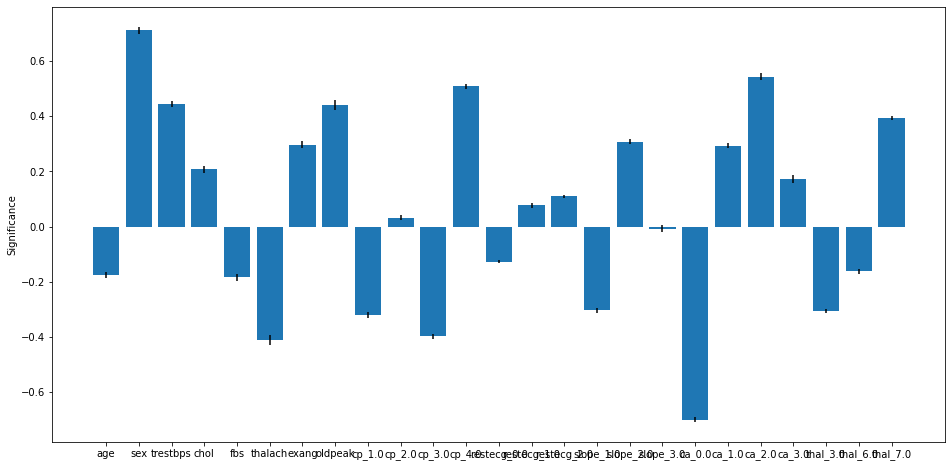

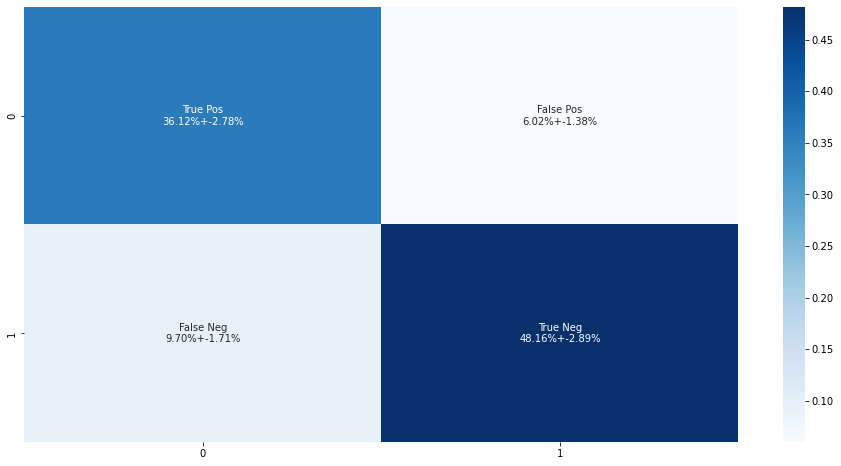

In [39]:
auc_method = pd.Series(data=[0.22309676, 0.98712277, 0.99301123, 0.19122663, 0.02735085,
       0.05562014, 0.92712093, 0.05472697, 0.98744254, 0.9479733 ,
       0.59695214, 0.13979256, 0.40132354, 0.16595288, 0.25278977,
       0.05369582, 0.38608986, 0.35394193, 0.00813035, 0.07217422,
       0.11149876, 0.01321473, 0.22629612, 0.7449708 , 0.99374396,
       0.02864016, 0.0033673 , 0.17926677, 0.41286987, 0.90971705,
       0.1818675 , 0.93139455, 0.01894175, 0.84875941, 0.01778417,
       0.18578179, 0.93704613, 0.96539684, 0.98975825, 0.21602995,
       0.97945648, 0.14271326, 0.34781708, 0.07011941, 0.03563784,
       0.8399752 , 0.0294948 , 0.96697785, 0.09924903, 0.12102782,
       0.0826904 , 0.5903122 , 0.60499104, 0.0425534 , 0.96108297,
       0.99453349, 0.822601  , 0.34403435, 0.50850898, 0.44551175,
       0.63667408, 0.04342403, 0.99291641, 0.00506723, 0.99073443,
       0.99577812, 0.22659791, 0.22912408, 0.98284834, 0.35240157,
       0.01718013, 0.96836127, 0.99384675, 0.52640726, 0.48079098,
       0.01853261, 0.99314624, 0.17850402, 0.16315524, 0.82794306,
       0.71767423, 0.24501027, 0.01814724, 0.69140621, 0.046938  ,
       0.01874313, 0.02628663, 0.06793401, 0.00790747, 0.48100421,
       0.99747602, 0.91687046, 0.01031141, 0.00490413, 0.90261171,
       0.97917078, 0.97985865, 0.59258688, 0.11132625, 0.09621641,
       0.01195924, 0.39437075, 0.05280798, 0.88964075, 0.16385429,
       0.92521596, 0.79391608, 0.99467952, 0.84827075, 0.68837579,
       0.93818529, 0.02348702, 0.82513559, 0.76839983, 0.27800074,
       0.02388   , 0.08901746, 0.97306772, 0.99575701, 0.92147054,
       0.98979133, 0.06975288, 0.99160827, 0.52960053, 0.05875005,
       0.99793787, 0.99219115, 0.04436808, 0.04632055, 0.2664104 ,
       0.3191032 , 0.03410793, 0.16686116, 0.01434984, 0.11555338,
       0.96443111, 0.97426652, 0.89319189, 0.14426535, 0.07883128,
       0.41425341, 0.04317057, 0.45495432, 0.19449583, 0.00833234,
       0.99568657, 0.00949411, 0.05383046, 0.02677909, 0.42249916,
       0.20134142, 0.10134276, 0.99245291, 0.97907229, 0.98160497,
       0.65738925, 0.87844131, 0.98440118, 0.60682775, 0.14077469,
       0.64963713, 0.02240248, 0.22485802, 0.12902428, 0.4996514 ,
       0.1740997 , 0.46007646, 0.0525142 , 0.98137357, 0.8094471 ,
       0.35347329, 0.32721163, 0.97120735, 0.9969732 , 0.90771114,
       0.97544228, 0.38431364, 0.15161411, 0.74901919, 0.96353413,
       0.27825952, 0.88372669, 0.07815666, 0.15679649, 0.16762443,
       0.86886698, 0.88125756, 0.92304203, 0.01878806, 0.99817385,
       0.9324414 , 0.05468174, 0.90454638, 0.79154973, 0.23898605,
       0.02192507, 0.04221689, 0.0351505 , 0.19975263, 0.61600679,
       0.04889319, 0.38957452, 0.98246118, 0.99514927, 0.92247612,
       0.07151789, 0.36538681, 0.00347943, 0.3907002 , 0.13282965,
       0.97642665, 0.57522303, 0.36175679, 0.00779893, 0.2228734 ,
       0.92917092, 0.16852985, 0.00275527, 0.0027051 , 0.00156379,
       0.99511703, 0.66080262, 0.01069638, 0.17303053, 0.07460171,
       0.91388239, 0.69489132, 0.01820665, 0.85351685, 0.23125401,
       0.25397225, 0.10364948, 0.98244998, 0.94376363, 0.56560073,
       0.06099566, 0.05037685, 0.0456873 , 0.01523817, 0.05352831,
       0.75187875, 0.01172907, 0.76587279, 0.83548857, 0.93541674,
       0.92378723, 0.08648592, 0.62274659, 0.99676964, 0.99374966,
       0.00565257, 0.42340739, 0.01095628, 0.36445719, 0.0730023 ,
       0.15900872, 0.22642889, 0.16390934, 0.04239369, 0.01090853,
       0.01363356, 0.98861764, 0.70210904, 0.62500298, 0.5103237 ,
       0.02377842, 0.97783543, 0.9383798 , 0.99474574, 0.33233456,
       0.21727653, 0.58166377, 0.25391707, 0.02407482, 0.50184614,
       0.30473569, 0.99058203, 0.01486034, 0.97072   , 0.04370911,
       0.93904704, 0.97572212, 0.94739148, 0.23493417, 0.140828  ,
       0.43230424, 0.0289183 , 0.63078549, 0.99047786, 0.15919325,
       0.03666935, 0.9857099 , 0.6578312 , 0.28255716, 0.99675627,
       0.99183783, 0.24923538],index=[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 167, 168, 169, 170,
       171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183,
       184, 185, 186, 187, 188, 189, 190, 191, 193, 194, 195, 196, 197,
       198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210,
       211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223,
       224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236,
       237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249,
       250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262,
       263, 264, 265, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276,
       277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 288, 289, 290,
       291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301])
log_all,result = loading_scores(X_encoded,y,True,estimator=logistic_estimator,edge=0.5);

# Next

In [ ]:
automated_leave_one_out(X_encoded,y)

  0%|          | 0/297 [00:00<?, ?it/s]

25

That's already a lot of over-fitting.

The question is: is it 'bad' overfitting?

I think with 'leave-one-out', everything is 'bad'. More than 1 is bad.

Let's take out chol, fbs, restecg and age.

In [ ]:
Xx_encoded = X_encoded.drop(columns = ['chol','fbs','restecg_0.0','restecg_1.0','restecg_2.0','age'])
automated_leave_one_out(Xx_encoded,y)

  0%|          | 0/297 [00:00<?, ?it/s]

22

Not much help.

Maybe I already knew this.

TPU: 'Couldn't connect to accelerator'

I could say: only 7 features.

In [ ]:
import tensorflow as tf
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
tf.config.experimental_connect_to_cluster(resolver)
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.experimental.TPUStrategy(resolver)

INFO:tensorflow:Clearing out eager caches


INFO:tensorflow:Clearing out eager caches


INFO:tensorflow:Initializing the TPU system: grpc://10.75.96.218:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.75.96.218:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


In [ ]:
@tf.function
def replica_fn(X,y,features):
  return automated_leave_one_out(X,y,features)
strategy.run(replica_fn, args=(X_encoded,y,X_encoded.columns))

  0%|          | 0/297 [00:00<?, ?it/s]

AttributeError: ignored

    NotImplementedError: Cannot convert a symbolic Tensor (TensorArrayV2Read/TensorListGetItem:0) to a numpy array. This error may indicate that you're trying to pass a Tensor to a NumPy call, which is not supported

That's enough for me.

In [ ]:
for i in np.arange(4,10,1):
  print(automated_leave_one_out(X_encoded,y,max_features=i))

  0%|          | 0/297 [00:00<?, ?it/s]

1


  0%|          | 0/297 [00:00<?, ?it/s]

4


  0%|          | 0/297 [00:00<?, ?it/s]

10


  0%|          | 0/297 [00:00<?, ?it/s]

14


  0%|          | 0/297 [00:00<?, ?it/s]

18


  0%|          | 0/297 [00:00<?, ?it/s]

19


In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=5))

  0%|          | 0/297 [00:00<?, ?it/s]

(4, [1, 285, 10, 1])


So even though there is 'overfitting', it's not bad.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=6))

  0%|          | 0/297 [00:00<?, ?it/s]

(10, [13, 2, 2, 1, 1, 1, 1, 5, 2, 269])


Again, not bad.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=7))

  0%|          | 0/297 [00:00<?, ?it/s]

(14, [13, 2, 2, 243, 3, 1, 2, 1, 1, 1, 1, 1, 3, 23])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=8))

  0%|          | 0/297 [00:00<?, ?it/s]

(18, [13, 2, 1, 1, 21, 3, 1, 1, 2, 1, 2, 1, 1, 3, 1, 2, 218, 23])


even though we found what we are looking for, using only 4 features is not going to happen.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=9))

  0%|          | 0/297 [00:00<?, ?it/s]

(19, [1, 13, 3, 160, 23, 2, 2, 3, 5, 1, 21, 1, 52, 1, 1, 2, 1, 1, 4])


This is why we do 80/20 and not leave-one-out.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=10))

  0%|          | 0/297 [00:00<?, ?it/s]

(23, [1, 13, 3, 159, 23, 1, 2, 1, 3, 5, 1, 1, 21, 1, 6, 1, 2, 1, 35, 11, 1, 1, 4])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=11))

  0%|          | 0/297 [00:00<?, ?it/s]

(25, [1, 13, 3, 159, 29, 23, 1, 2, 1, 3, 3, 5, 1, 1, 21, 1, 6, 1, 2, 1, 3, 11, 1, 1, 4])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,max_features=12))

  0%|          | 0/297 [00:00<?, ?it/s]

(25, [1, 13, 3, 159, 28, 23, 1, 2, 1, 3, 5, 1, 1, 21, 1, 6, 1, 2, 4, 1, 3, 11, 1, 1, 4])


The reason it's not changing is because most don't want so many features. A few want 10, 11, 12.

What train_test_split will make sure we are always in the 159/297 group?

If each person in test is a vote for one of the groups, we just need 'majority'.

Chance of 'majority':
```
n = 3: 1 - \sum_others ((n_i c 3) + (n_i c 2)*(297-n_i)*(296-n_i))/(297 c 3)
```
It depends on the next largest group, here 28 but also 23,21.
```
\approx 1 - \sum_others \sum_{i>j, i+j<=n}(n_i c i)(159 c j)*(297-159-n_i c n-i-j)/(297 c n)
```

In [ ]:
  print(automated_leave_one_out(X_encoded,y))

  0%|          | 0/297 [00:00<?, ?it/s]

(25, [1, 13, 3, 159, 28, 23, 1, 2, 1, 3, 5, 1, 1, 21, 1, 6, 1, 2, 4, 1, 3, 11, 1, 1, 4])


In [ ]:
1 - ((297-159)*(297-159-1)*(297-159-2)/6 + (159)*(297-159)*(297-159-1)/2)/(297*296*295/6)

0.5531209946464184

In [ ]:
1 - ((297-159)*(297-159-1)*(297-159-2)*(297-159-3)/24 + (159)*(297-159)*(297-159-1)*(297-159-2)/6)/(297*296*295*294/24)

0.7399987516210276

With n = 10 I'm sure it will be fine. Let's see.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 10))

  0%|          | 0/30 [00:00<?, ?it/s]

(19, [6, 1, 2, 1, 5, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 20))

  0%|          | 0/15 [00:00<?, ?it/s]

(13, [3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])


It doesn't look good for this.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 20,max_features=8))

  0%|          | 0/15 [00:00<?, ?it/s]

(14, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 20,max_features=5))

  0%|          | 0/15 [00:00<?, ?it/s]

(8, [5, 1, 1, 1, 3, 2, 1, 1])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 20,max_features=4))

  0%|          | 0/15 [00:00<?, ?it/s]

(4, [1, 9, 1, 4])


In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 10,max_features=4))

  0%|          | 0/30 [00:00<?, ?it/s]

(4, [24, 1, 4, 1])


In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 8,max_features=4))

  0%|          | 0/37 [00:00<?, ?it/s]

(2, [36, 1])


I cannot even find my good 4 features every time.

In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 5,max_features=4))

  0%|          | 0/59 [00:00<?, ?it/s]

(2, [58, 1])


In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 4,max_features=4))

  0%|          | 0/74 [00:00<?, ?it/s]

(2, [73, 1])


In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 3,max_features=4))

  0%|          | 0/99 [00:00<?, ?it/s]

(1, [99])


size_test = 3 finally gives the right answer.

You cannot have train/test > 100/1.

In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 1))
print(automated_leave_one_out(X_encoded,y,size_test = 2))
print(automated_leave_one_out(X_encoded,y,size_test = 3))

  0%|          | 0/297 [00:00<?, ?it/s]

(25, [6, 1, 21, 2, 4, 1, 1, 4, 3, 1, 3, 1, 1, 28, 1, 2, 1, 23, 1, 159, 3, 13, 5, 1, 11])


  0%|          | 0/148 [00:00<?, ?it/s]

(27, [1, 7, 13, 2, 1, 2, 1, 6, 1, 2, 1, 10, 1, 1, 1, 1, 1, 1, 16, 1, 2, 50, 3, 8, 7, 1, 7])


  0%|          | 0/99 [00:00<?, ?it/s]

(30, [1, 4, 6, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 8, 1, 1, 1, 1, 13, 1, 6, 1, 1, 20, 1, 12, 3, 1, 3])


It gets worse right away. The 159 becomes 50\*2 and then 20\*3.

In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 1))

  0%|          | 0/297 [00:00<?, ?it/s]

(25, [6, 1, 21, 2, 4, 1, 1, 4, 3, 1, 3, 1, 1, 28, 1, 2, 1, 23, 1, 159, 3, 13, 5, 1, 11], 0.8282828282828283)


That's really bad.

In [ ]:
print(automated_leave_one_out(X_encoded,y,size_test = 2))

  0%|          | 0/148 [00:00<?, ?it/s]

(24, [1, 5, 13, 2, 4, 4, 1, 3, 1, 3, 1, 12, 1, 2, 1, 1, 15, 1, 48, 3, 10, 5, 1, 10], 0.8249158249158249)


In [ ]:
for i in np.arange(3,30,1):
  print(automated_leave_one_out(X_encoded,y,size_test = i))

  0%|          | 0/99 [00:00<?, ?it/s]

(32, [1, 2, 9, 1, 1, 1, 1, 2, 1, 5, 1, 1, 2, 1, 1, 10, 1, 1, 1, 1, 1, 8, 1, 1, 1, 1, 20, 2, 12, 2, 1, 5], 0.8282828282828283)


  0%|          | 0/74 [00:00<?, ?it/s]

(27, [1, 4, 1, 5, 1, 1, 1, 1, 2, 1, 3, 1, 1, 1, 1, 6, 1, 1, 11, 1, 1, 11, 3, 9, 3, 1, 1], 0.8249158249158249)


  0%|          | 0/59 [00:00<?, ?it/s]

(23, [1, 1, 2, 4, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 9, 3, 1, 6, 1, 13, 1, 2], 0.8484848484848485)


  0%|          | 0/50 [00:00<?, ?it/s]

(24, [1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 4, 2, 4, 2, 9, 6, 2], 0.8282828282828283)


  0%|          | 0/42 [00:00<?, ?it/s]

(32, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 4, 3, 1, 2], 0.8181818181818182)


  0%|          | 0/37 [00:00<?, ?it/s]

(25, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 8, 1], 0.8249158249158249)


  0%|          | 0/33 [00:00<?, ?it/s]

(20, [1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 3, 1, 1, 3, 1, 6, 2, 1, 1, 1], 0.835016835016835)


  0%|          | 0/30 [00:00<?, ?it/s]

(20, [1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 2, 1, 1, 1, 1, 3, 5, 2], 0.835016835016835)


  0%|          | 0/27 [00:00<?, ?it/s]

(22, [1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 4, 1], 0.8215488215488216)


  0%|          | 0/25 [00:00<?, ?it/s]

(17, [1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 8, 1, 1], 0.8282828282828283)


  0%|          | 0/23 [00:00<?, ?it/s]

(17, [1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 6, 1, 1, 1, 1], 0.8417508417508418)


  0%|          | 0/21 [00:00<?, ?it/s]

(16, [1, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 3, 1, 1, 1], 0.835016835016835)


  0%|          | 0/20 [00:00<?, ?it/s]

(15, [1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5], 0.8316498316498316)


  0%|          | 0/19 [00:00<?, ?it/s]

(17, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1], 0.8249158249158249)


  0%|          | 0/17 [00:00<?, ?it/s]

(13, [1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 2, 1], 0.8282828282828283)


  0%|          | 0/16 [00:00<?, ?it/s]

(16, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8383838383838383)


  0%|          | 0/16 [00:00<?, ?it/s]

(16, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8114478114478114)


  0%|          | 0/15 [00:00<?, ?it/s]

(13, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1], 0.8080808080808081)


  0%|          | 0/14 [00:00<?, ?it/s]

(14, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8316498316498316)


  0%|          | 0/14 [00:00<?, ?it/s]

(13, [1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1], 0.8249158249158249)


  0%|          | 0/13 [00:00<?, ?it/s]

(10, [1, 1, 2, 1, 1, 1, 1, 3, 1, 1], 0.8215488215488216)


  0%|          | 0/12 [00:00<?, ?it/s]

(12, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8013468013468014)


  0%|          | 0/12 [00:00<?, ?it/s]

(10, [1, 1, 1, 1, 1, 1, 1, 3, 1, 1], 0.835016835016835)


  0%|          | 0/11 [00:00<?, ?it/s]

(11, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8215488215488216)


  0%|          | 0/11 [00:00<?, ?it/s]

(9, [1, 1, 1, 1, 1, 1, 1, 1, 3], 0.8013468013468014)


  0%|          | 0/11 [00:00<?, ?it/s]

(11, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8148148148148148)


  0%|          | 0/10 [00:00<?, ?it/s]

(10, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8181818181818182)


It's not getting better or worse.

In [ ]:
for i in np.arange(4,12,1):
  print(automated_leave_one_out(X_encoded,y,size_test = 10,max_features=i))

  0%|          | 0/30 [00:00<?, ?it/s]

(2, [26, 4], 0.8518518518518519)


  0%|          | 0/30 [00:00<?, ?it/s]

(5, [2, 6, 20, 1, 1], 0.835016835016835)


  0%|          | 0/30 [00:00<?, ?it/s]

(10, [16, 1, 1, 2, 1, 1, 1, 1, 5, 1], 0.8417508417508418)


  0%|          | 0/30 [00:00<?, ?it/s]

(14, [3, 1, 1, 1, 4, 2, 1, 1, 1, 1, 5, 7, 1, 1], 0.8316498316498316)


  0%|          | 0/30 [00:00<?, ?it/s]

(13, [1, 1, 1, 7, 1, 1, 1, 1, 1, 5, 8, 1, 1], 0.8383838383838383)


  0%|          | 0/30 [00:00<?, ?it/s]

(18, [1, 1, 1, 3, 3, 1, 2, 1, 1, 1, 1, 1, 3, 1, 6, 1, 1, 1], 0.8282828282828283)


  0%|          | 0/30 [00:00<?, ?it/s]

(23, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 5, 2, 1], 0.8484848484848485)


  0%|          | 0/30 [00:00<?, ?it/s]

(22, [2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 3, 1, 1, 2, 1, 1], 0.8282828282828283)


In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 1,max_features=4))

  0%|          | 0/297 [00:00<?, ?it/s]

(1, [297], 0.8518518518518519)


And that's the best we can do.

In [ ]:
  print(automated_leave_one_out(X_encoded,y,size_test = 1,max_features=4))

  0%|          | 0/297 [00:00<?, ?it/s]

{frozenset({'thalach', 'cp_4.0', 'thal_3.0', 'ca_0.0'})}
(1, [297], 0.8518518518518519)


I didn't think thalach and thal_3.0 would be there.

In [ ]:
X_encoded.describe()

,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,cp_1.0,cp_2.0,cp_3.0,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,ca_0.0,ca_1.0,ca_2.0,ca_3.0,thal_3.0,thal_6.0,thal_7.0
count,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000
mean,54.542088,0.676768,131.693603,247.350168,0.144781,149.599327,0.326599,1.055556,0.077441,0.164983,0.279461,0.478114,0.494949,0.013468,0.491582,0.468013,0.461279,0.070707,0.585859,0.218855,0.127946,0.067340,0.552189,0.060606,0.387205
std,9.049736,0.468500,17.762806,51.997583,0.352474,22.941562,0.469761,1.166123,0.267741,0.371792,0.449492,0.500364,0.500818,0.115462,0.500773,0.499818,0.499340,0.256768,0.493404,0.414168,0.334594,0.251033,0.498108,0.239009,0.487933
min,29.000000,0.000000,94.000000,126.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,120.000000,211.000000,0.000000,133.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,56.000000,1.000000,130.000000,243.000000,0.000000,153.000000,0.000000,0.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,61.000000,1.000000,140.000000,276.000000,0.000000,166.000000,1.000000,1.600000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,77.000000,1.000000,200.000000,564.000000,1.000000,202.000000,1.000000,6.200000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Before I didn't even have thalach and thal_3.0.

sex is not one of them.

Accuracy (test)= 0.8519+-0.0206
Acuracy (train)= 0.8519+-0.0001
R^2 (test)= 0.4189+-0.0582
R^2 (train)= 0.4426+-0.006
Sensitivity (test) = 0.8029+-0.034
Sensitivity (train) = 0.8029+-0.002
Specificity (test) = 0.8938+-0.0244
Specificity (train) = 0.8938+-0.0014
AUC = 0.8979


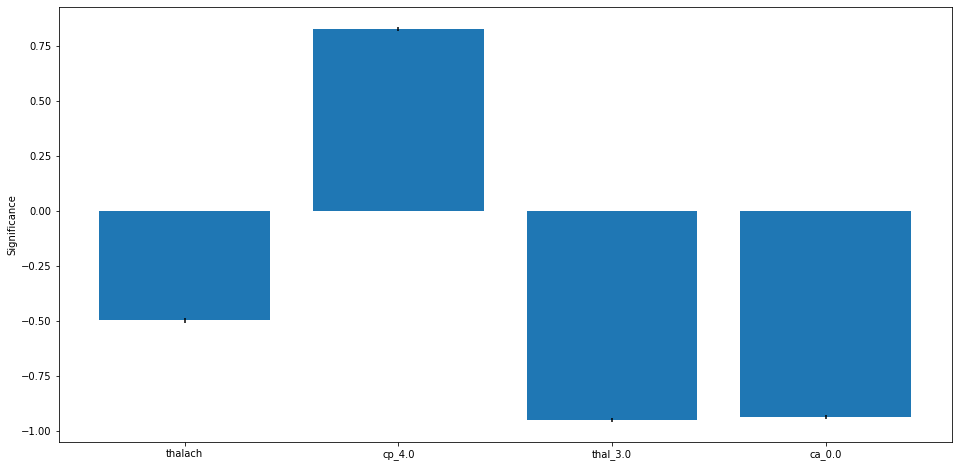

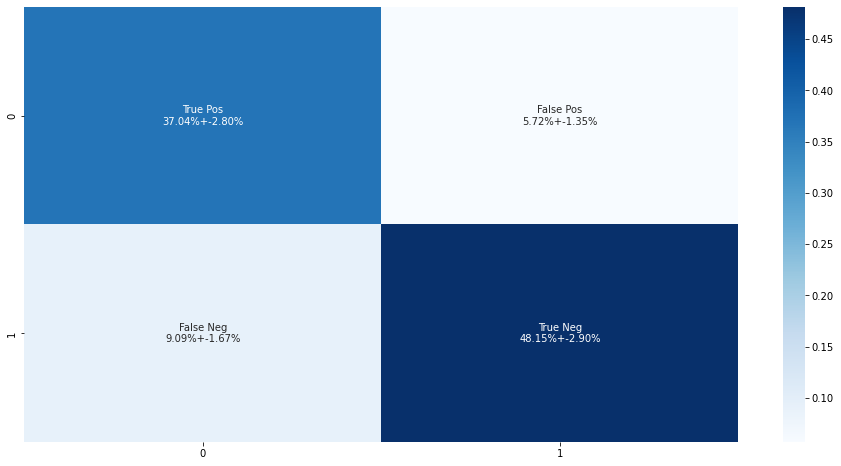

In [ ]:
log,result = loading_scores(X_encoded,y,True,features1=['thalach', 'cp_4.0', 'thal_3.0', 'ca_0.0'],estimator=logistic_estimator,edge=0.5);

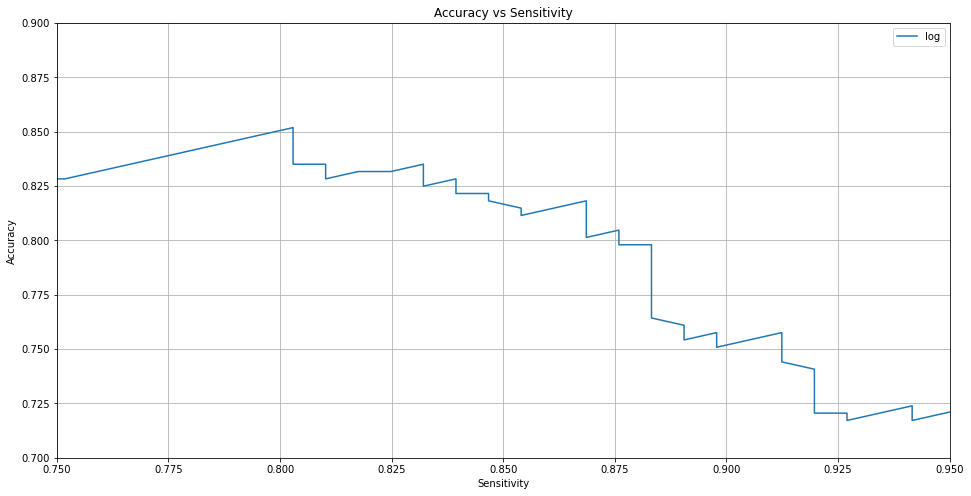

{'log': [[0.9562043795620438, 0.6801346801346801, 0.1],
  [0.9562043795620438, 0.6801346801346801, 0.10250000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.10500000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.10750000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.11000000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.11250000000000002],
  [0.9562043795620438, 0.6801346801346801, 0.11500000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.11750000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.12000000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.12250000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.12500000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.12750000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.13000000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.13250000000000003],
  [0.9562043795620438, 0.6868686868686869, 0.13500000000000004],
  [0.9562043795620438, 0.690235690

In [ ]:
sensitivity_accuracy(log=log)

It looks like there are no points between 'sensitivity = 0.75 and 0.80' but there are lots.

Looks like accuracy may be closer to 0.83.

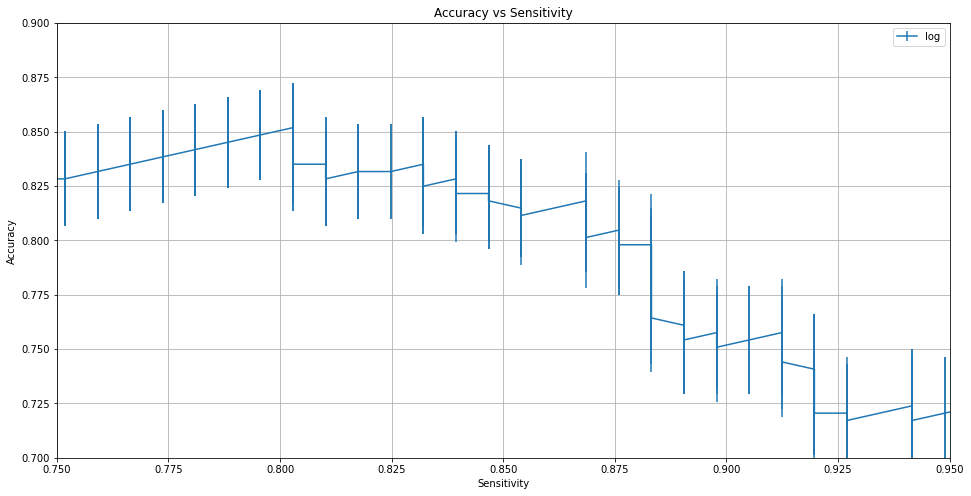

In [ ]:
sensitivity_accuracy(log=log,yerr=True);

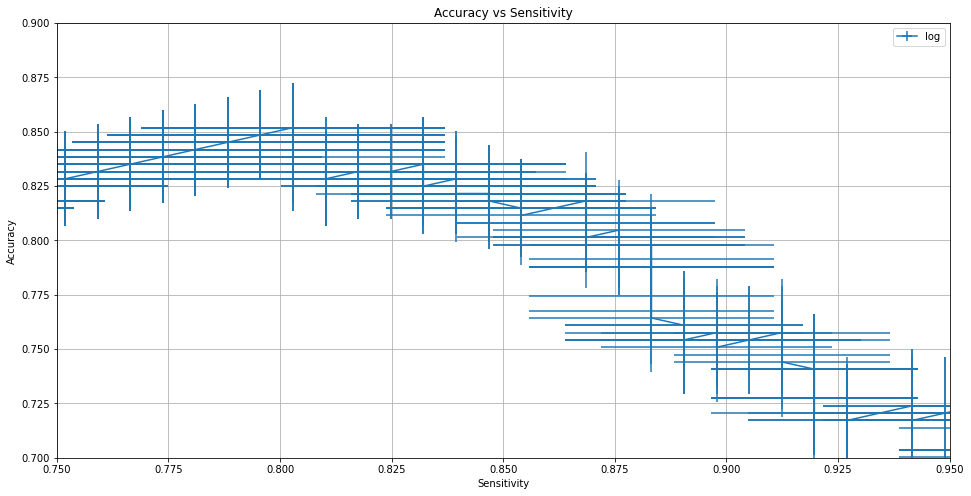

In [ ]:
sensitivity_accuracy(log=log,yerr=True,xerr=True);

xerr is 0.025 and yerr is also 0.025.

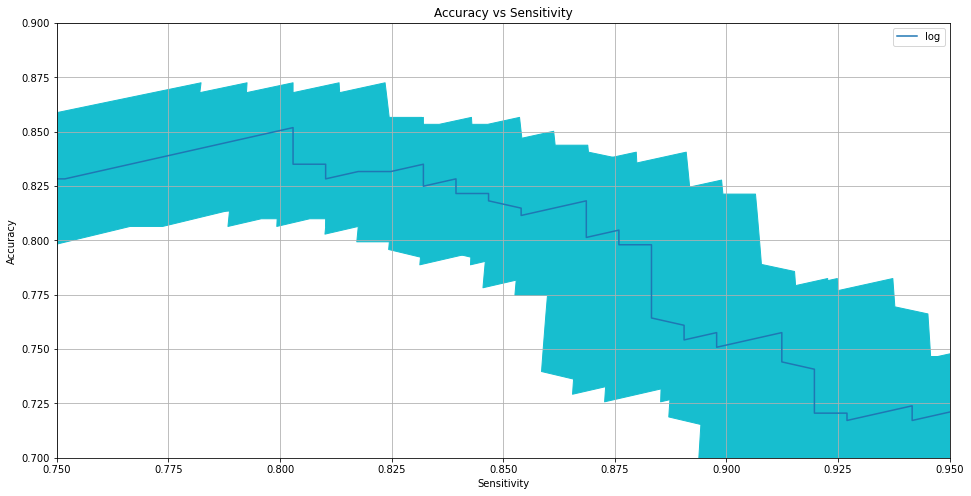

In [ ]:
sensitivity_accuracy(log=log,yerr=True,xerr=True);

I don't like this because you don't see how big xerr is.

I'm not sure what the best edge is. 

Accuracy (test)= 0.8418+-0.0212
Acuracy (train)= 0.8699+-0.0002
R^2 (test)= 0.4378+-0.0604
R^2 (train)= 0.5532+-0.006
Sensitivity (test) = 0.7883+-0.0349
Sensitivity (train) = 0.8191+-0.0019
Specificity (test) = 0.8875+-0.025
Specificity (train) = 0.9135+-0.0013
AUC = 0.9078


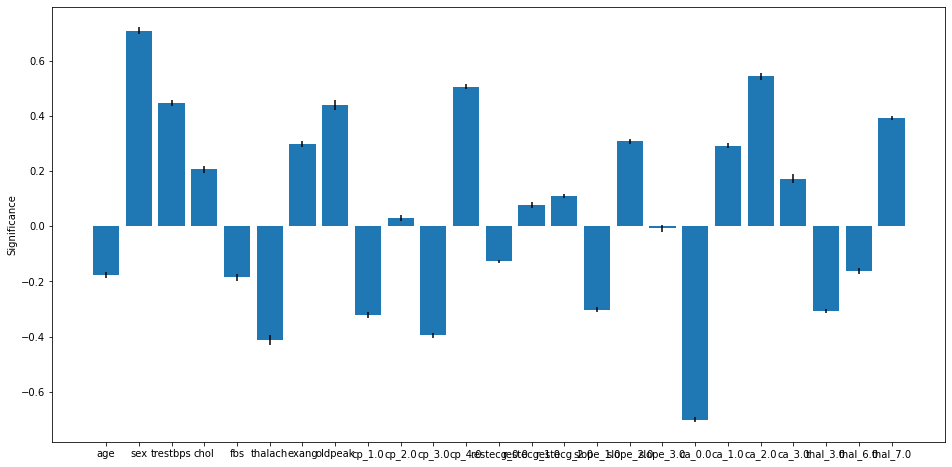

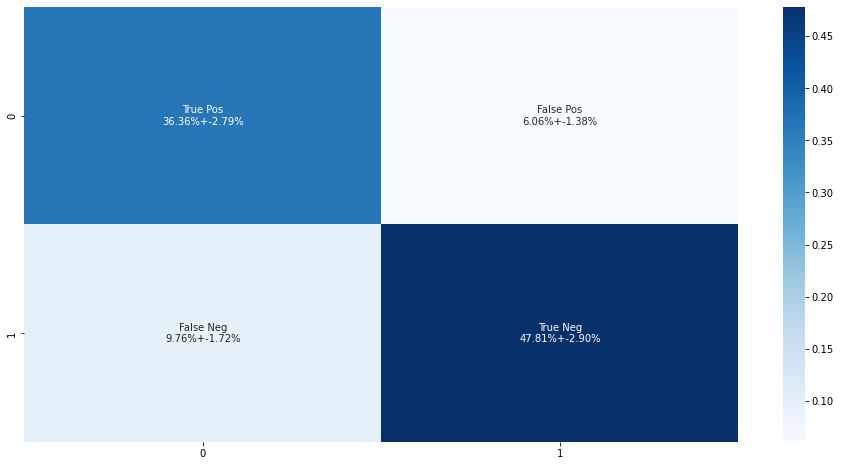

In [ ]:
log_all,result = loading_scores(X_encoded,y,True,estimator=logistic_estimator,edge=0.5);

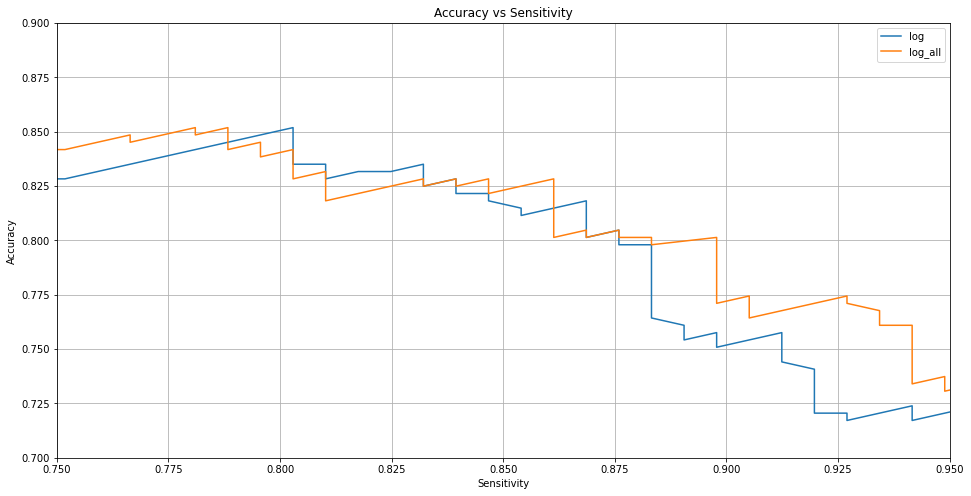

{'log': [[0.9562043795620438, 0.6801346801346801, 0.1],
  [0.9562043795620438, 0.6801346801346801, 0.10250000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.10500000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.10750000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.11000000000000001],
  [0.9562043795620438, 0.6801346801346801, 0.11250000000000002],
  [0.9562043795620438, 0.6801346801346801, 0.11500000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.11750000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.12000000000000002],
  [0.9562043795620438, 0.6835016835016835, 0.12250000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.12500000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.12750000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.13000000000000003],
  [0.9562043795620438, 0.6835016835016835, 0.13250000000000003],
  [0.9562043795620438, 0.6868686868686869, 0.13500000000000004],
  [0.9562043795620438, 0.690235690

In [ ]:
sensitivity_accuracy(log=log,log_all = log_all)

They are the same for sensitivity < 0.88 so we want to use the more simple one.

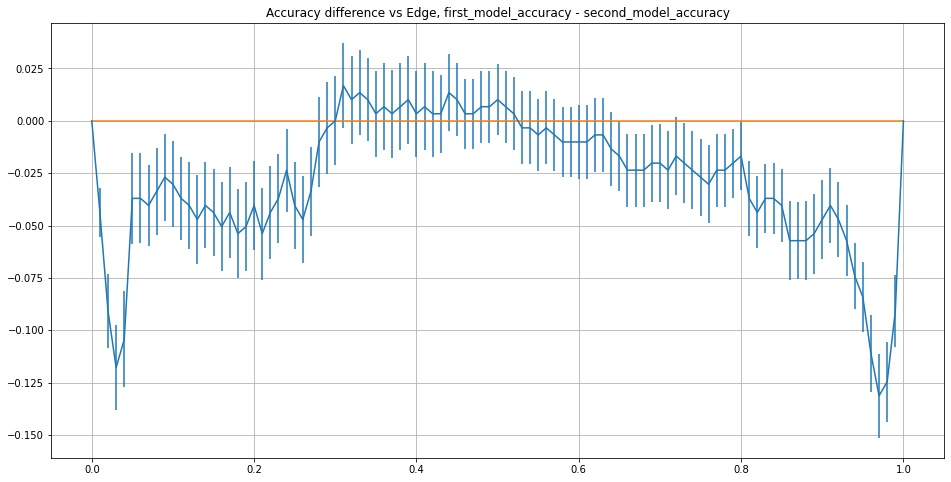

In [ ]:
delta_accuracy(log,log_all)

I want to use Pytorch to do this.

Also, is there a way to tell the Logistic Regression what Sensitivity you want (find the best model). If we can find that, then maybe we can find a model with more features.

Maybe a different cost function.

Or we could use AUC, not accuracy.

In [ ]:
print(automated_leave_k_out(X_encoded,y,size_test = 1))

  0%|          | 0/297 [00:00<?, ?it/s]

(43, [1, 1, 1, 1, 3, 1, 1, 2, 1, 32, 8, 1, 1, 2, 1, 2, 4, 1, 1, 1, 3, 1, 1, 1, 6, 2, 1, 1, 1, 1, 1, 1, 3, 23, 3, 2, 1, 1, 2, 1, 169, 5, 1], 0.8316498316498316)


There are 169 of the same. Seems similar. That's good but I should also be able to know the auc at the end.

In [ ]:
print(automated_leave_k_out(X_encoded,y,size_test = 10))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:98: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


  0%|          | 0/30 [00:00<?, ?it/s]

(25, [1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1], 0.8282828282828283, 0.891058394160584)


In [ ]:
for i in range(12):
  print(i+1)
  print(automated_leave_k_out(X_encoded,y,size_test = 10,max_features=i+1))

1


  0%|          | 0/30 [00:00<?, ?it/s]

(2, [26, 4], 0.7239057239057239, 0.6244753649635038)
2


  0%|          | 0/30 [00:00<?, ?it/s]

(4, [23, 2, 3, 2], 0.696969696969697, 0.7547673357664235)
3


  0%|          | 0/30 [00:00<?, ?it/s]

(2, [1, 29], 0.8484848484848485, 0.8571852189781022)
4


  0%|          | 0/30 [00:00<?, ?it/s]

(3, [4, 23, 3], 0.8282828282828283, 0.8967153284671534)
5


  0%|          | 0/30 [00:00<?, ?it/s]

(7, [15, 1, 1, 1, 1, 7, 4], 0.8215488215488216, 0.8924726277372262)
6


  0%|          | 0/30 [00:00<?, ?it/s]

(6, [1, 1, 2, 5, 1, 20], 0.835016835016835, 0.9006158759124088)
7


  0%|          | 0/30 [00:00<?, ?it/s]

(9, [1, 2, 1, 3, 1, 1, 16, 1, 4], 0.835016835016835, 0.8960994525547445)
8


  0%|          | 0/30 [00:00<?, ?it/s]

(12, [9, 2, 6, 1, 1, 1, 1, 5, 1, 1, 1, 1], 0.8249158249158249, 0.887271897810219)
9


  0%|          | 0/30 [00:00<?, ?it/s]

(11, [1, 2, 12, 2, 1, 1, 6, 2, 1, 1, 1], 0.8316498316498316, 0.9040145985401459)
10


  0%|          | 0/30 [00:00<?, ?it/s]

(10, [1, 2, 1, 19, 1, 1, 1, 1, 1, 2], 0.8484848484848485, 0.9083485401459853)
11


  0%|          | 0/30 [00:00<?, ?it/s]

(11, [3, 1, 9, 1, 2, 2, 6, 2, 1, 1, 2], 0.8484848484848485, 0.9116788321167884)
12


  0%|          | 0/30 [00:00<?, ?it/s]

(15, [4, 1, 2, 2, 1, 2, 4, 2, 2, 1, 1, 1, 1, 1, 5], 0.8552188552188552, 0.9130474452554743)


In [ ]:
for i in range(3):
  print(13+i)
  print(automated_leave_k_out(X_encoded,y,size_test = 10,max_features=13+i))

13


  0%|          | 0/30 [00:00<?, ?it/s]

(24, [1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2], 0.8417508417508418, 0.9088503649635037)
14


  0%|          | 0/30 [00:00<?, ?it/s]

(24, [1, 1, 2, 2, 1, 1, 1, 1, 4, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8451178451178452, 0.8995437956204381)
15


  0%|          | 0/30 [00:00<?, ?it/s]

(25, [1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2], 0.8484848484848485, 0.9087135036496351)


In [ ]:
for i in range(3):
  print(16+i)
  print(automated_leave_k_out(X_encoded,y,size_test = 10,max_features=16+i))

16


  0%|          | 0/30 [00:00<?, ?it/s]

(26, [1, 1, 1, 1, 1, 3, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1], 0.835016835016835, 0.8989051094890511)
17


  0%|          | 0/30 [00:00<?, ?it/s]

(29, [1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8316498316498316, 0.898448905109489)
18


  0%|          | 0/30 [00:00<?, ?it/s]

(28, [1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 0.8282828282828283, 0.8981295620437956)


It's interesting that it is still adding Features.

Also it seems that after 12 Features it starts 'overfitting'.

In [ ]:
for i in [1,2,3,5,8,10,20,30,40,50]:
  print(i)
  print(automated_leave_k_out(X_encoded,y,size_test = i,max_features=12,method='auc')) #it was AUC above, too

1


  0%|          | 0/297 [00:00<?, ?it/s]

(23, [1, 3, 2, 3, 3, 3, 1, 2, 1, 1, 1, 17, 2, 193, 44, 1, 3, 8, 1, 3, 2, 1, 1], 0.8417508417508418, 0.9086678832116789)
2


  0%|          | 0/148 [00:00<?, ?it/s]

(21, [2, 2, 4, 2, 1, 11, 1, 62, 37, 4, 9, 1, 1, 1, 1, 1, 1, 2, 1, 3, 1], 0.8484848484848485, 0.9119981751824817)
3


  0%|          | 0/99 [00:00<?, ?it/s]

(20, [1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 7, 39, 18, 4, 9, 1, 3, 3, 2, 1], 0.8417508417508418, 0.9104927007299269)
5


  0%|          | 0/59 [00:00<?, ?it/s]

(22, [2, 2, 1, 1, 1, 1, 1, 1, 6, 1, 14, 10, 1, 2, 6, 1, 1, 1, 2, 2, 1, 1], 0.8383838383838383, 0.9092153284671532)
8


  0%|          | 0/37 [00:00<?, ?it/s]

(18, [10, 1, 1, 1, 2, 2, 2, 2, 3, 1, 1, 1, 1, 1, 2, 1, 4, 1], 0.8417508417508418, 0.908029197080292)
10


  0%|          | 0/30 [00:00<?, ?it/s]

(14, [6, 1, 3, 2, 1, 1, 2, 3, 1, 1, 1, 6, 1, 1], 0.8484848484848485, 0.9109945255474452)
20


  0%|          | 0/15 [00:00<?, ?it/s]

(13, [1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1], 0.8451178451178452, 0.8986313868613139)
30


  0%|          | 0/10 [00:00<?, ?it/s]

(9, [1, 1, 2, 1, 1, 1, 1, 1, 1], 0.8417508417508418, 0.903147810218978)
40


  0%|          | 0/7 [00:00<?, ?it/s]

(7, [1, 1, 1, 1, 1, 1, 1], 0.8316498316498316, 0.8974452554744525)
50


  0%|          | 0/6 [00:00<?, ?it/s]

(6, [1, 1, 1, 1, 1, 1], 0.8518518518518519, 0.9067518248175183)


test_size doesn't matter.

now we can do a usage 'map'.

In [ ]:
automated_leave_k_out(X_encoded,y,size_test = 10,max_features=12,method='auc',usage_map=True)

  0%|          | 0/30 [00:00<?, ?it/s]

age            0.066667
sex            1.000000
trestbps       1.000000
chol           0.100000
fbs            0.166667
thalach        0.966667
exang          0.166667
oldpeak        1.000000
cp_1.0         0.000000
cp_2.0         1.000000
cp_3.0         0.000000
cp_4.0         1.000000
restecg_0.0    0.566667
restecg_1.0    0.000000
restecg_2.0    0.233333
slope_1.0      0.700000
slope_2.0      0.333333
slope_3.0      0.000000
ca_0.0         1.000000
ca_1.0         0.266667
ca_2.0         0.433333
ca_3.0         0.000000
thal_3.0       1.000000
thal_6.0       0.933333
thal_7.0       0.066667
dtype: float64

(18,
 [1, 4, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 1],
 0.8552188552188552,
 0.9088503649635037)

here leave-one-out is better.

In [ ]:
#warnings.filterwarnings('error')
auc_method = automated_leave_k_out(X_encoded,y,size_test = 1,max_features=12,method='auc',usage_map=True,intermediate_n=True)

  0%|          | 0/297 [00:00<?, ?it/s]

Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.5793795620437956
"Fraying":1, [297]
Length 2
{frozenset({'ca_0.0', 'thal_3.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1, [297]
Length 3
{frozenset({'ca_0.0', 'cp_4.0', 'thal_3.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1, [297]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8817062043795622
"Fraying":2, [286, 11]
Length 5
Accuracy = 0.8383838383838383
AUC = 0.8933850364963504
"Fraying":5, [2, 6, 280, 8, 1]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.9057937956204379
"Fraying":4, [3, 286, 1, 7]
Length 7
Accuracy = 0.8451178451178452
AUC = 0.9038321167883212
"Fraying":7, [2, 275, 8, 5, 3, 3, 1]
Length 8
Accuracy = 0.835016835016835
AUC = 0.9015967153284672
"Fraying":9, [2, 1, 2, 1, 3, 10, 1, 58, 219]
Length 9
Accuracy = 0.8383838383838383
AUC = 0.9007755474452555
"Fraying":11, [13, 8, 1, 46, 220, 1, 2, 3, 1, 1, 1]
Length 10
Accuracy = 0.8518518518518519
AUC 

thalach        1.000000
thal_3.0       1.000000
sex            1.000000
ca_0.0         1.000000
trestbps       1.000000
oldpeak        1.000000
cp_2.0         1.000000
cp_4.0         1.000000
thal_6.0       0.979798
slope_1.0      0.966330
restecg_0.0    0.848485
ca_2.0         0.707071
ca_1.0         0.228956
restecg_2.0    0.121212
slope_2.0      0.053872
exang          0.026936
chol           0.023569
thal_7.0       0.020202
fbs            0.013468
restecg_1.0    0.006734
slope_3.0      0.003367
cp_1.0         0.000000
cp_3.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

Ten features is the best using AUC. It also has the least fraying.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,size_test = 1,max_features=10,method='auc',usage_map=True,intermediate_n=True)

  0%|          | 0/297 [00:00<?, ?it/s]

Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.5793795620437956
"Fraying":1, [297]
Length 2
{frozenset({'ca_0.0', 'thal_3.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1, [297]
Length 3
{frozenset({'ca_0.0', 'cp_4.0', 'thal_3.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1, [297]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8817062043795622
"Fraying":2, [286, 11]
Length 5
Accuracy = 0.8383838383838383
AUC = 0.8933850364963504
"Fraying":5, [8, 2, 280, 1, 6]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.9057937956204379
"Fraying":4, [1, 7, 286, 3]
Length 7
Accuracy = 0.8451178451178452
AUC = 0.9038321167883212
"Fraying":7, [2, 275, 5, 3, 1, 8, 3]
Length 8
Accuracy = 0.835016835016835
AUC = 0.9015967153284672
"Fraying":9, [219, 3, 2, 10, 58, 2, 1, 1, 1]
Length 9
Accuracy = 0.8383838383838383
AUC = 0.9007755474452555
"Fraying":11, [3, 1, 1, 13, 1, 1, 46, 8, 1, 2, 220]
Length 10
Accuracy = 0.8518518518518519
AUC 

oldpeak        1.000000
thal_3.0       1.000000
sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
thalach        1.000000
cp_4.0         1.000000
cp_2.0         0.996633
thal_6.0       0.976431
slope_1.0      0.962963
slope_2.0      0.037037
thal_7.0       0.020202
fbs            0.003367
restecg_2.0    0.003367
chol           0.000000
exang          0.000000
restecg_0.0    0.000000
cp_1.0         0.000000
cp_3.0         0.000000
restecg_1.0    0.000000
slope_3.0      0.000000
ca_1.0         0.000000
ca_2.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

```
features10 = ['slope_1.0','ca_0.0','thal_7.0','cp_4.0','trestbps','sex','cp_2.0','oldpeak','slope_2.0','exang']
                   (x)        x         -        x          x       x      (x)      x          -          -
```
The features10 from before were really not great! It didn't have thal_3.0,thalach,thal_6.0 but it had thal_7.0,slope_2.0 and exang.

Accuracy (test)= 0.862+-0.02
Acuracy (train)= 0.8754+-0.0002
R^2 (test)= 0.4887+-0.0555
R^2 (train)= 0.5409+-0.0069
Sensitivity (test) = 0.8321+-0.0319
Sensitivity (train) = 0.8449+-0.0018
Specificity (test) = 0.8875+-0.025
Specificity (train) = 0.9015+-0.0014
AUC = 0.9206


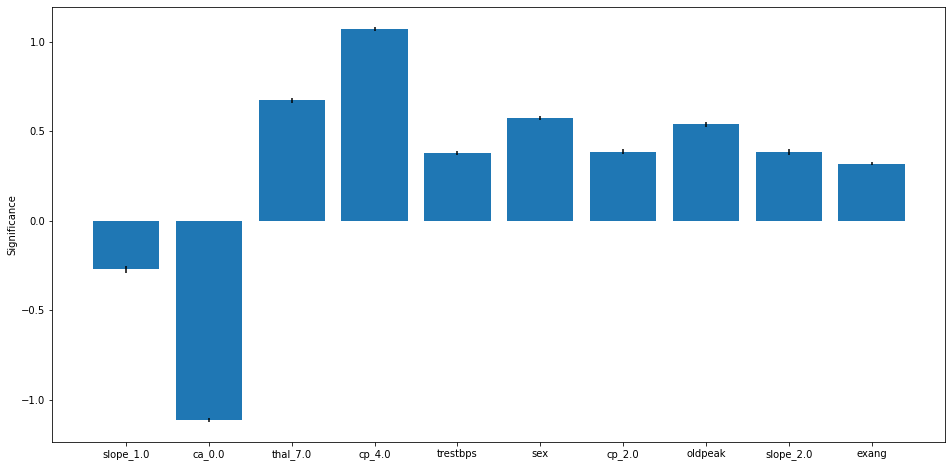

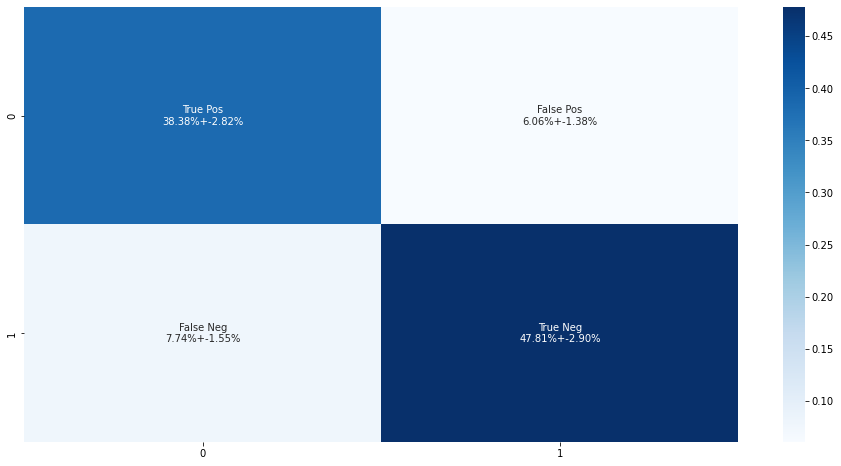

In [ ]:
before,_ = loading_scores(X_encoded,y,True,features1 = ['slope_1.0','ca_0.0','thal_7.0','cp_4.0','trestbps','sex','cp_2.0','oldpeak','slope_2.0','exang'],estimator=logistic_estimator,edge=0.5);

But it had a better AUC.

I want to do a sensitivity_accuracy with this, also delta_accuracy.

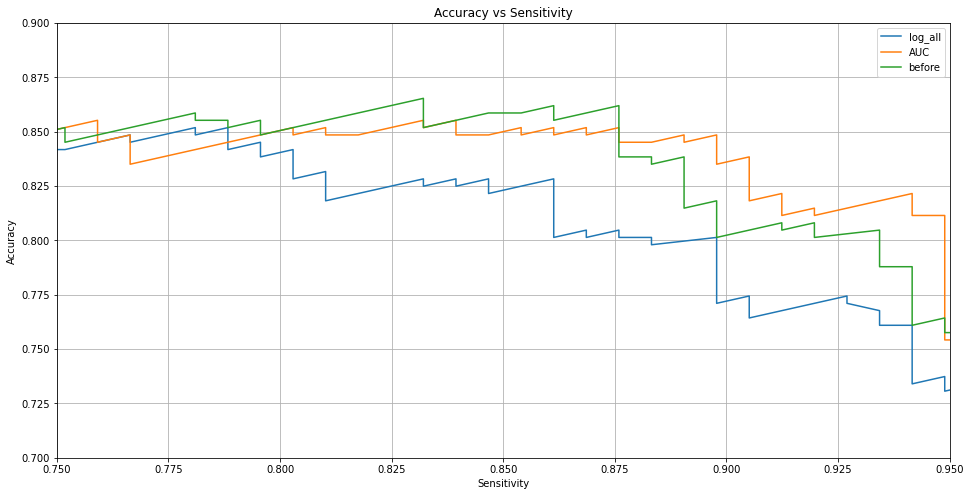

In [ ]:
sensitivity_accuracy(log_all = log_all,AUC = auc_method,before=before);

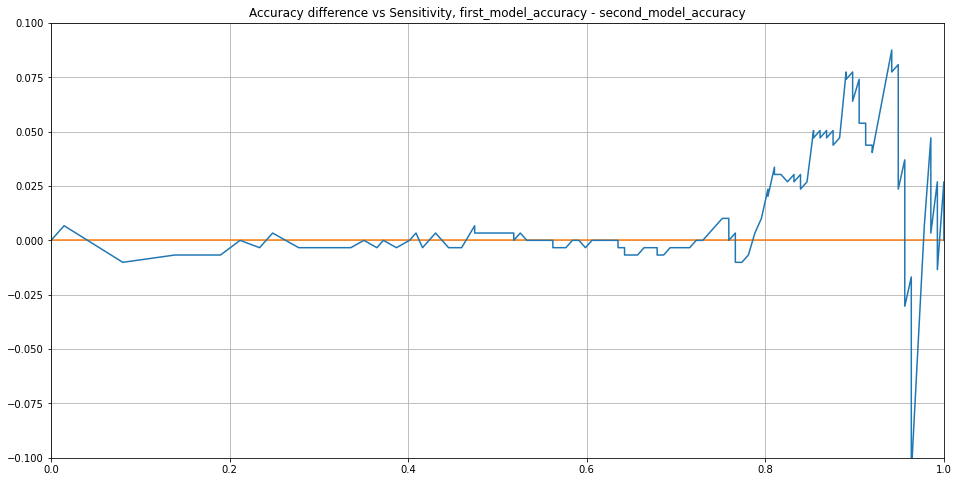

In [ ]:
sensitivity_delta_accuracy(auc_method,log_all);

Close to Sensitivity = 1.0 accuracy is dropping fast for both and one drops before the other, therefore you see these 'big spikes'. But at 0.9 that is not yet true.

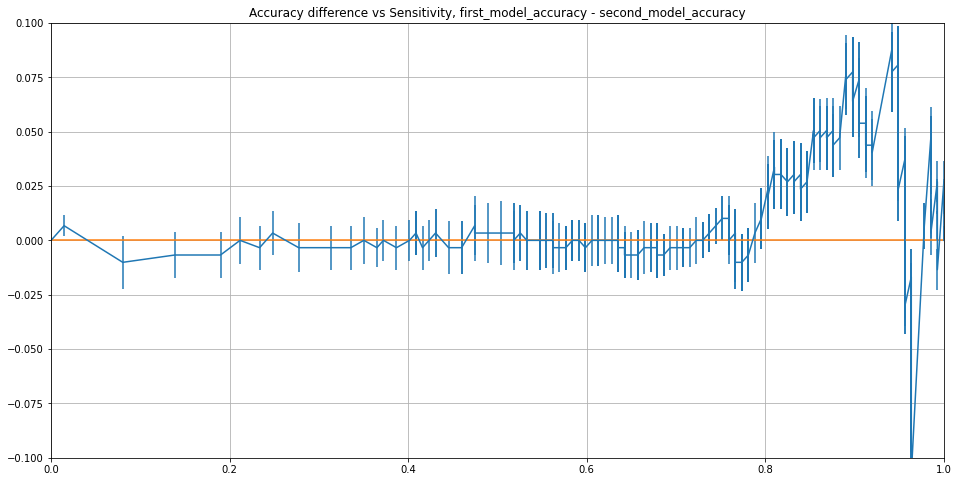

In [ ]:
sensitivity_delta_accuracy(auc_method,log_all,yerr=True);

But here we also have to look at 'xerr', or better 'radial error'.

When deciding which model is better, we give Sensitivity and Specificity equal "weight".


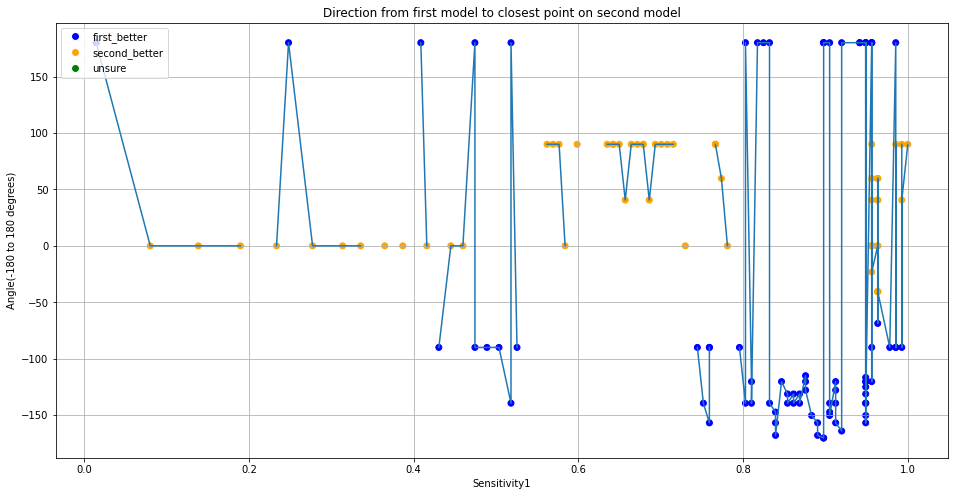

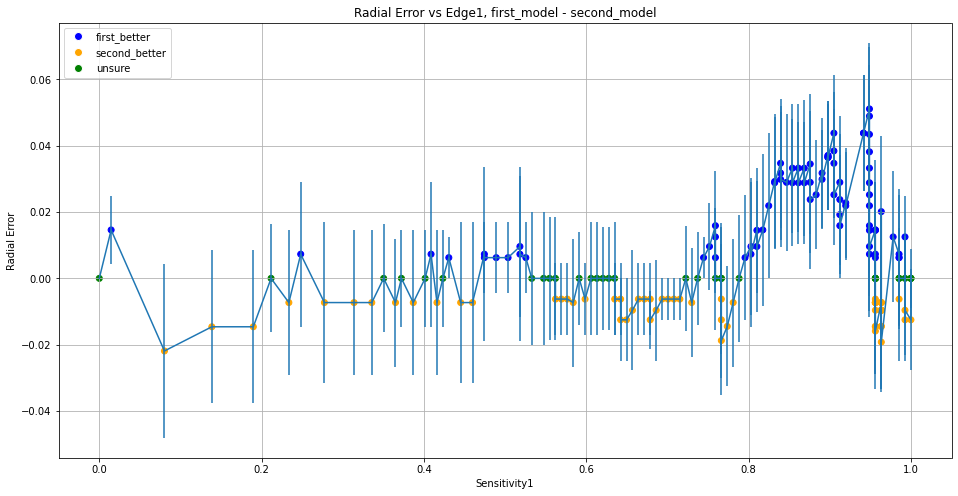

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:443: RuntimeWarning: invalid value encountered in double_scalars


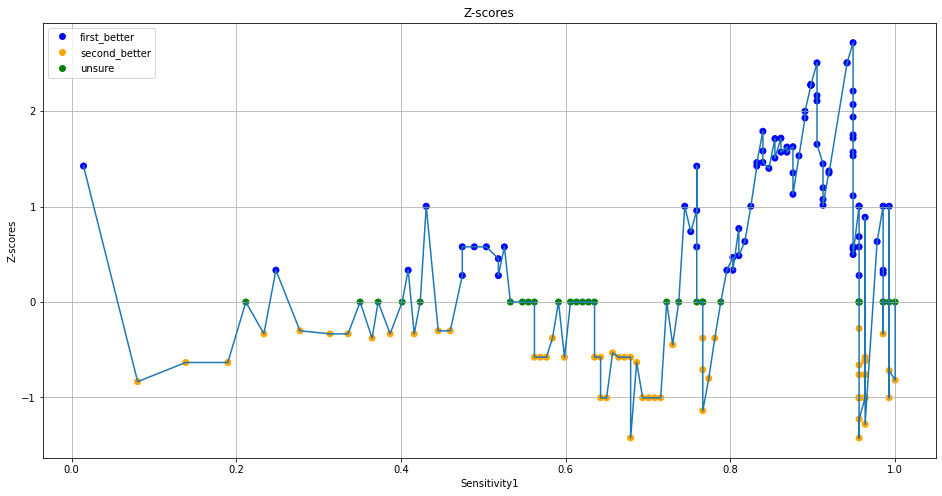

In [ ]:
radial_delta_accuracy(auc_method,log_all);

When deciding which model is better, we give Sensitivity and Specificity equal "weight".
'smooth' 9 points: We think about angles in two opposite buckets: model 1 better and model 2 better. Really these have to be added as Vectors.
'smooth': Use only for points with the same direction.


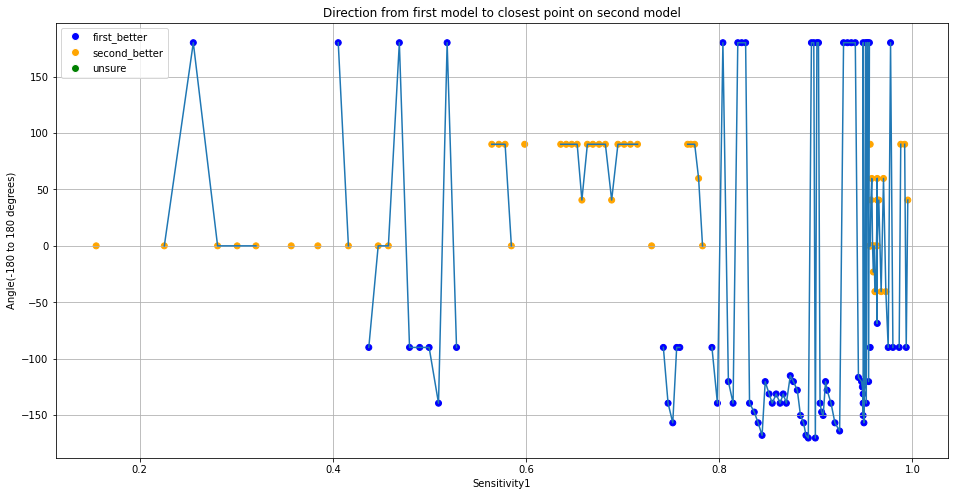

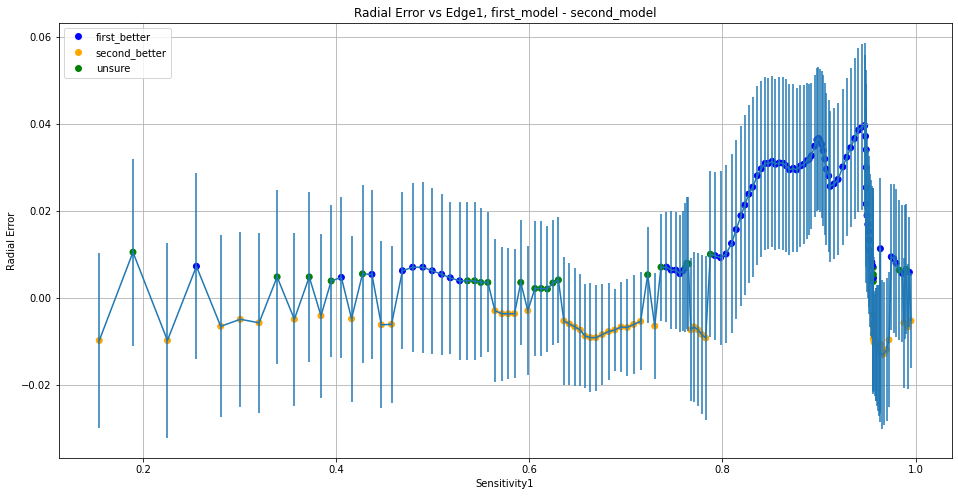

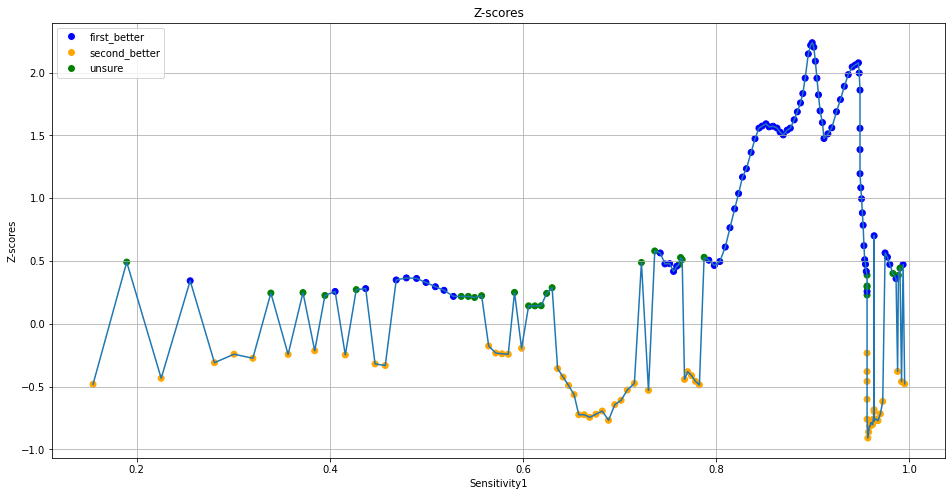

In [ ]:
radial_delta_accuracy(auc_method,log_all,smooth=4);

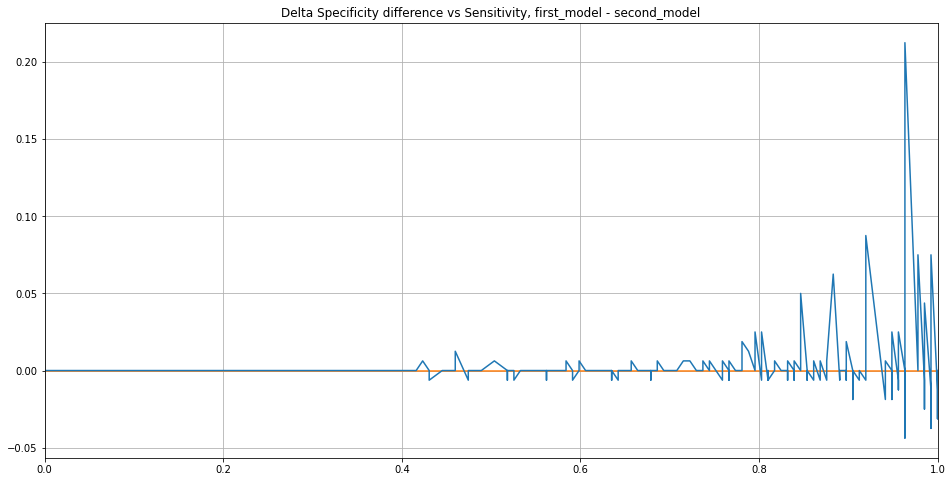

In [ ]:
Delta_sensitivity_delta_specificity(auc_method,log_all);

And what do we do now?

we have to redo delta_radial_accuracy and use Vectors.

When deciding which model is better, we give Sensitivity and Specificity equal "weight".


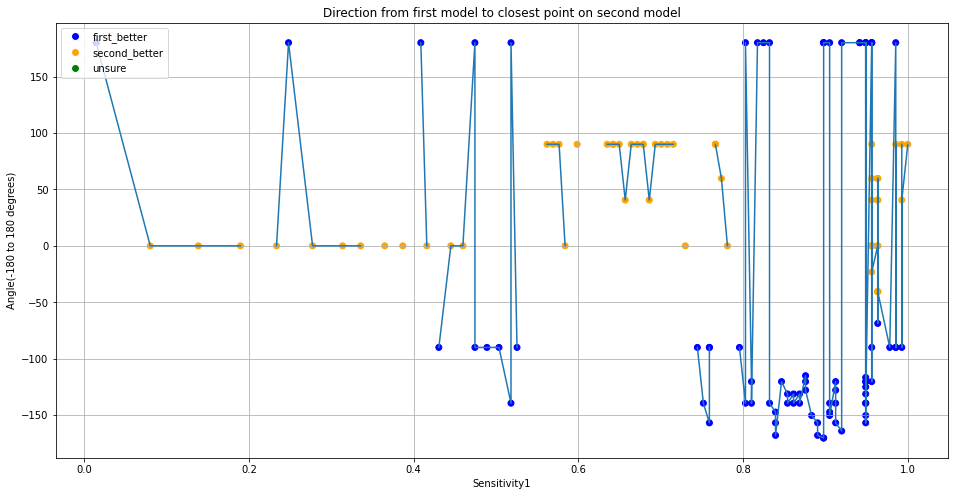

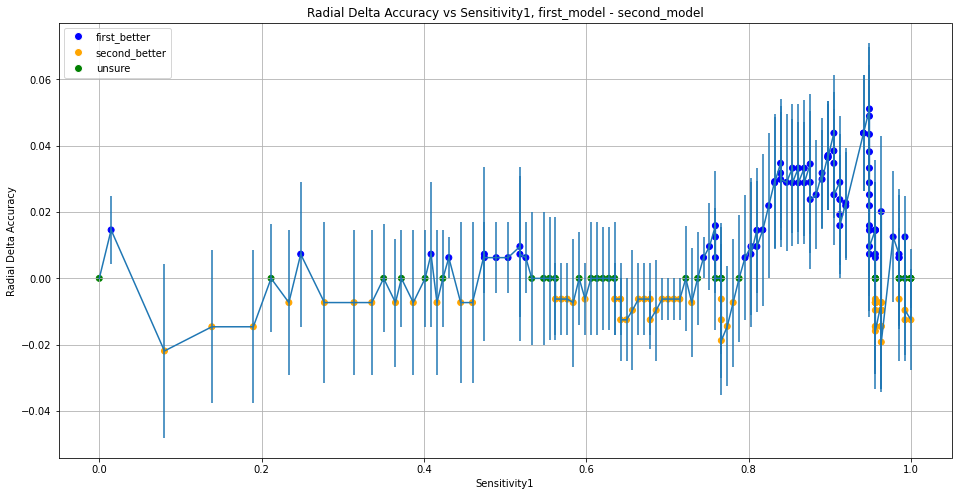

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:502: RuntimeWarning: invalid value encountered in double_scalars


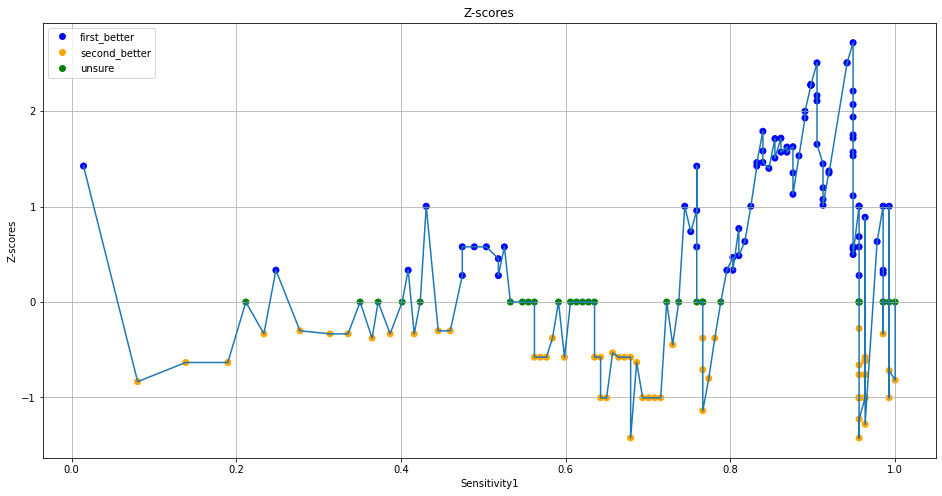

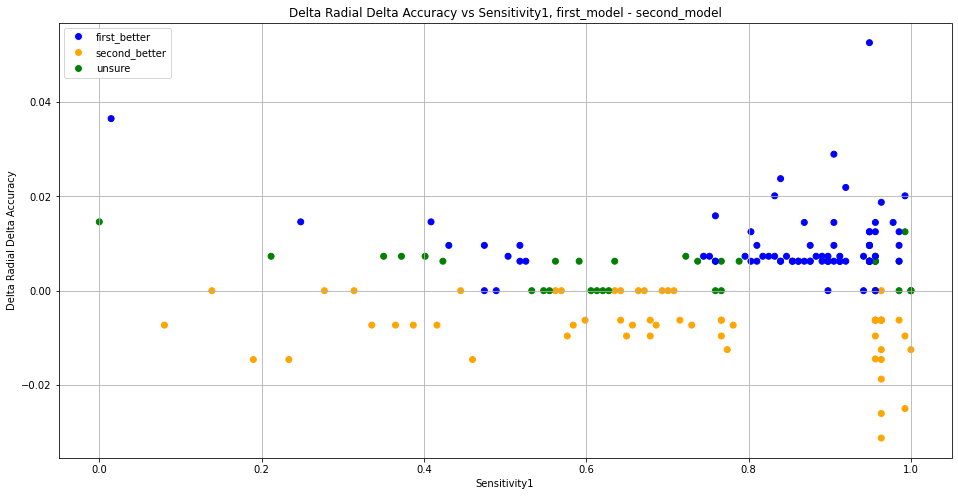

In [ ]:
radial_delta_accuracy(auc_method,log_all);

This is clearly not 'random'.

But the distance between the points is not the same and I do Delta(point1,point2).

We can also put edge1 on the X-Axis.

When deciding which model is better, we give Sensitivity and Specificity equal "weight".


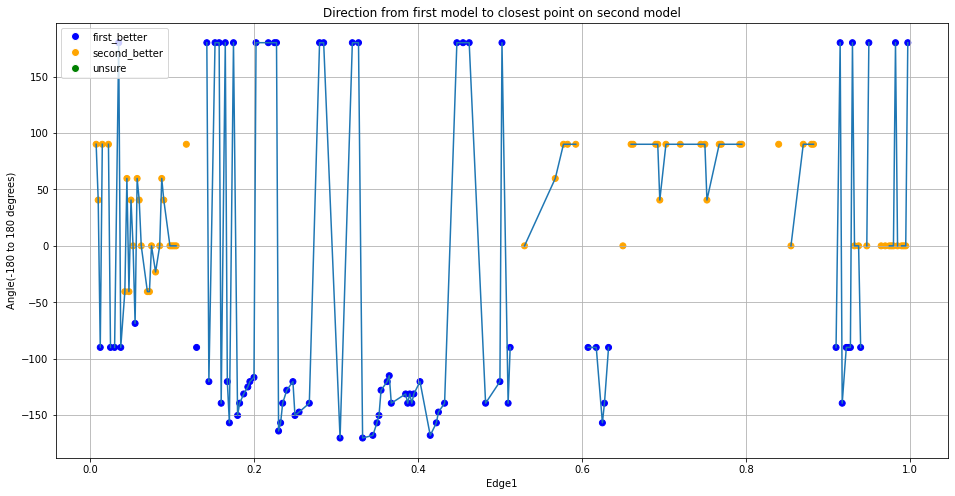

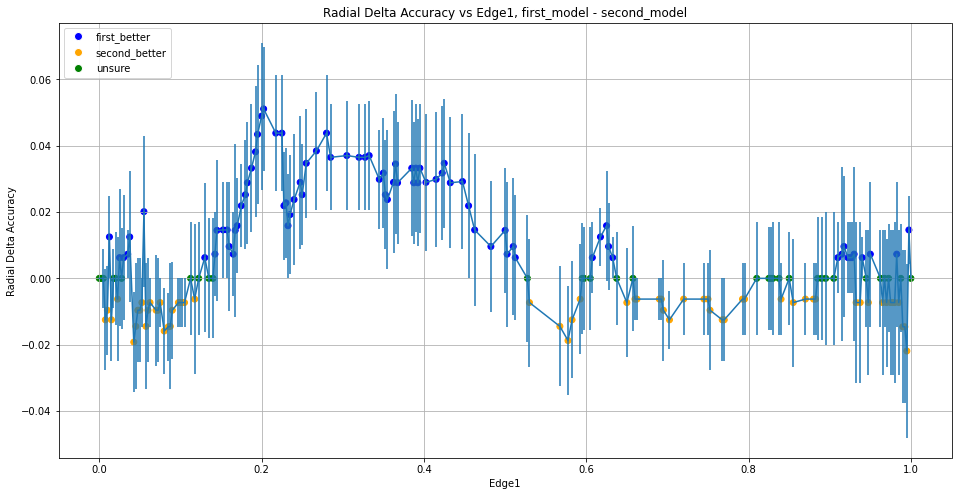

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:505: RuntimeWarning: invalid value encountered in double_scalars


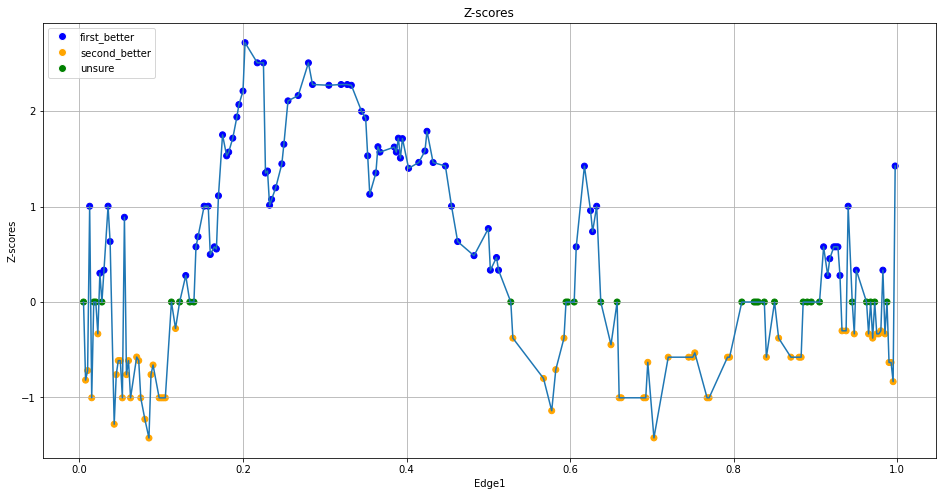

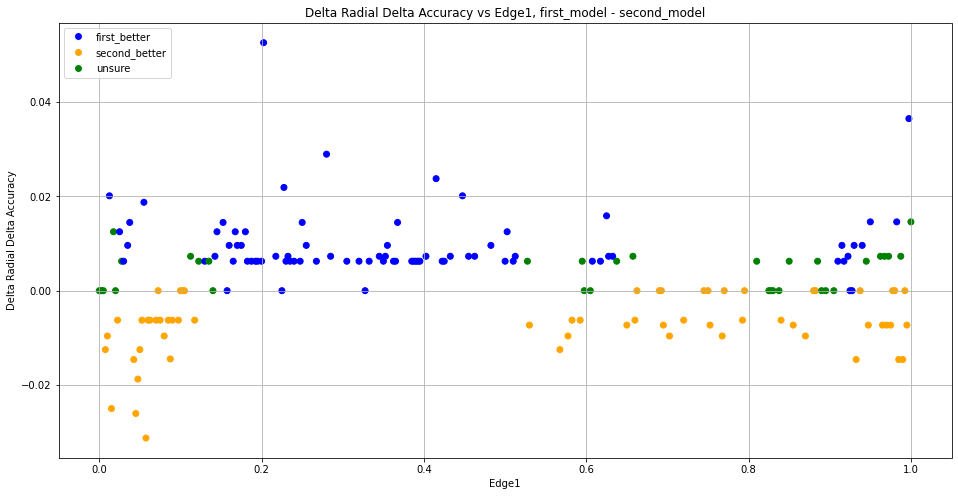

In [ ]:
result = radial_delta_accuracy(auc_method,log_all,sensitivity_x=False);

Maybe we can use ROC distance, not edge1 or specificity1. ROC distance may be the same as edge1.

In [ ]:
from scipy.stats import kstest, norm
ks_statistic, p_value = kstest(result['delta_rs'], 'norm')
print(ks_statistic, p_value)

0.4875350825656229 1.2344915361145904e-38


Here the p-value is 10^-38 < 0.05 so it is not Normal.

In [ ]:
from statsmodels.stats.diagnostic import lilliefors
lilliefors(result['delta_rs'])

(0.17462564137087966, 3.912680052396781e-14)

In [ ]:
from scipy.stats import shapiro
shapiro(result['delta_rs'])

(0.9213130474090576, 4.3801467342063916e-08)

This one is 10^-8 < 0.05.

let's change our data.

In [ ]:
random.shuffle(result['delta_rs'])
shapiro(result['delta_rs'])

(0.9213130474090576, 4.3801467342063916e-08)

That's not what I wanted. I wanted it to understand that sometimes all points are from the left side, sometimes all from the right side.

How many 0's I have is important here. But each point here is one person.

In [ ]:
print(len(result['delta_rs']))

174


But I have 297 people.


So some points are more than one person. That's why it's so strange. Let's make step smaller.

When deciding which model is better, we give Sensitivity and Specificity equal "weight".


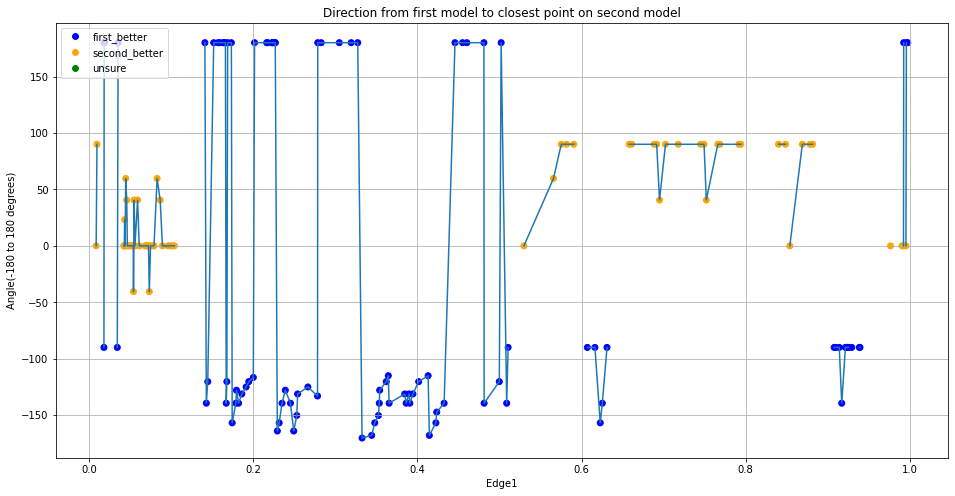

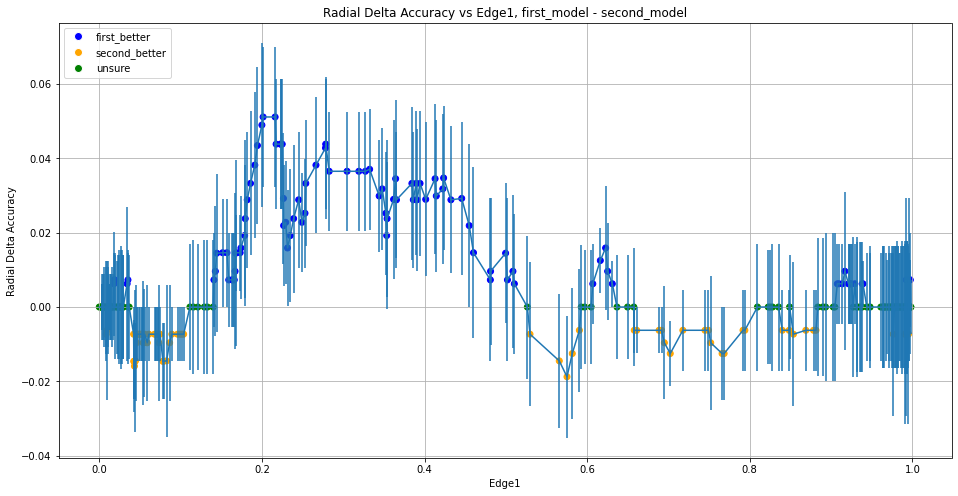

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:505: RuntimeWarning: invalid value encountered in double_scalars


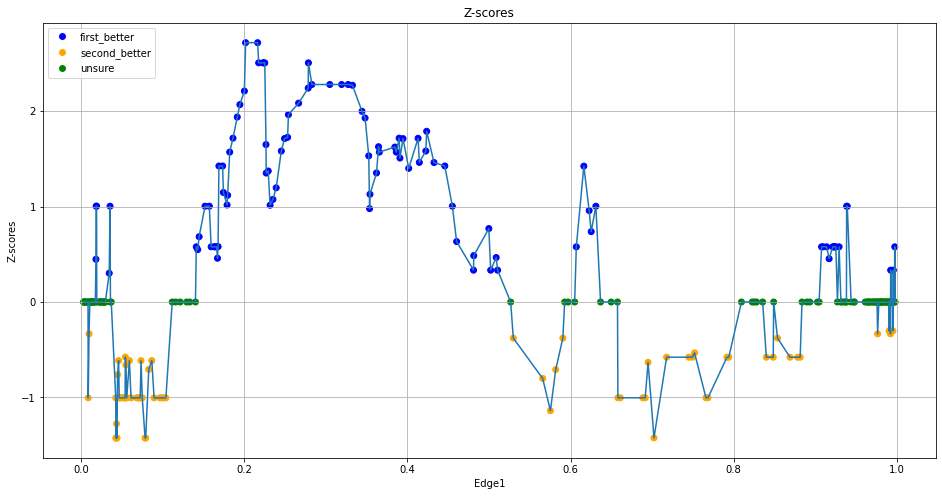

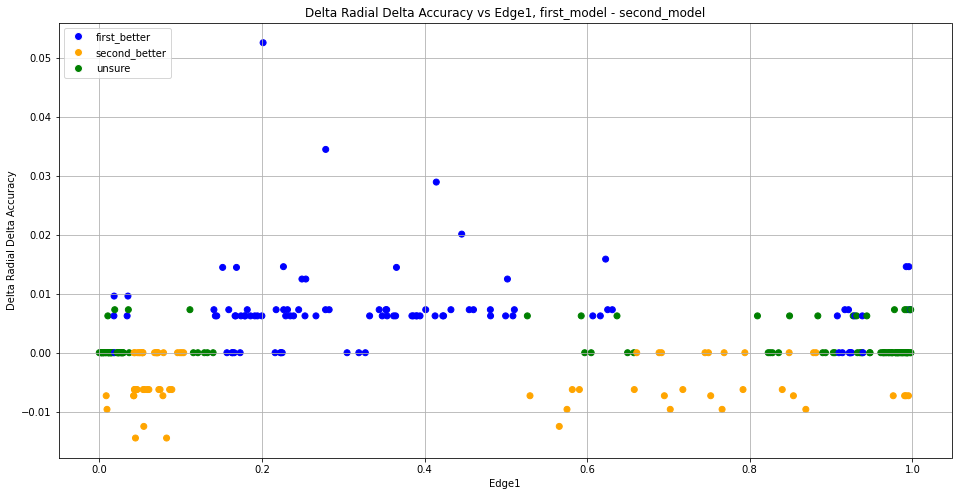

In [ ]:
result = radial_delta_accuracy(auc_method,log_all,sensitivity_x=False,step=0.00025);

In [ ]:
len(result['delta_rs'])

271

still not 297, but closer.

In [ ]:
shapiro(result['delta_rs'])

(0.7930917739868164, 2.9770912669788822e-18)

When deciding which model is better, we give Sensitivity and Specificity equal "weight".


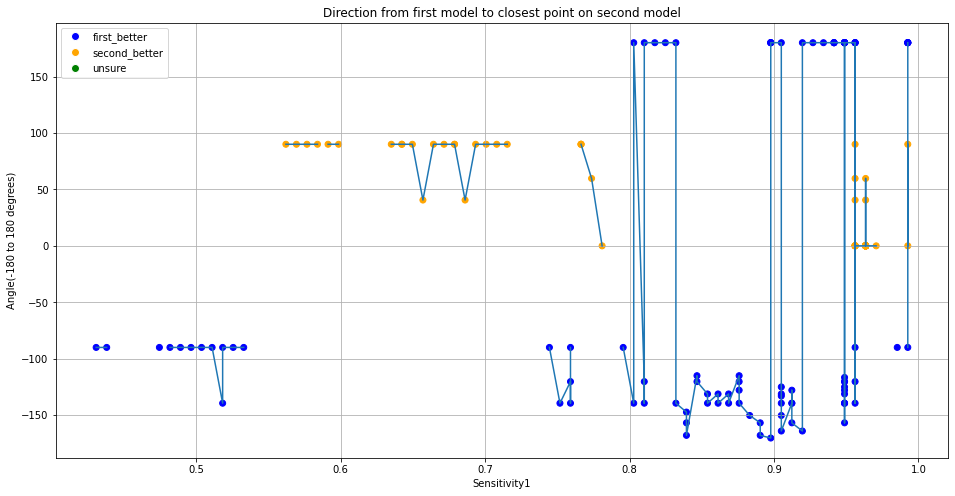

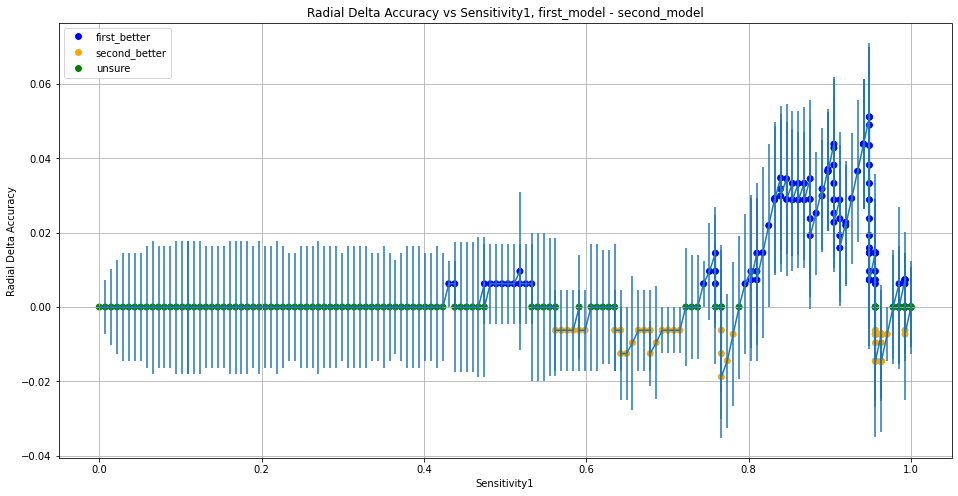

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:518: RuntimeWarning: invalid value encountered in double_scalars


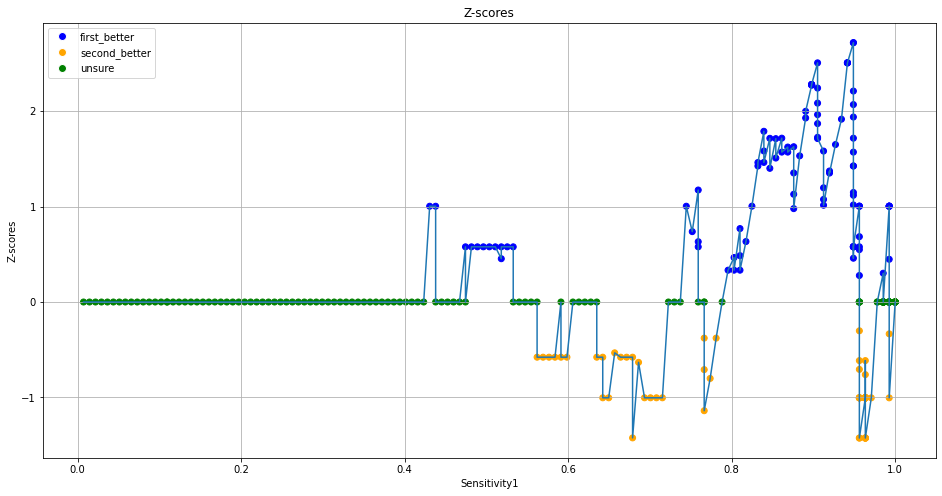

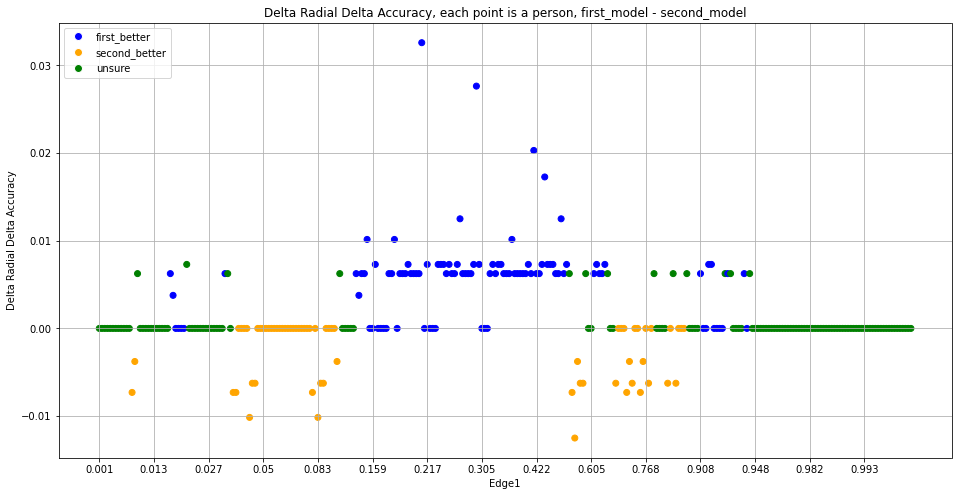

In [ ]:
result = radial_delta_accuracy(auc_method,log_all);

Much better now that I am not using step but going for each person, one person one point.

Also good that I'm now using 'signed delta_r'. It doesn't look different here.

Also good that I can still see the 'edge' at the end here.

Next, I want to do NN, then stable Features. Let's see if I can do 'fraying' for n_test = 6.

  0%|          | 0/50 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7542087542087542
AUC = 0.6301322992700731
"Fraying":2, [1, 49]
Length 2
Accuracy = 0.6936026936026936
AUC = 0.7822764598540145
"Fraying":3, [48, 1, 1]
Length 3
Accuracy = 0.8484848484848485
AUC = 0.8474680656934307
"Fraying":2, [49, 1]
Length 4
Accuracy = 0.835016835016835
AUC = 0.8839644160583942
"Fraying":3, [10, 39, 1]
Length 5
Accuracy = 0.8282828282828283
AUC = 0.8943202554744526
"Fraying":5, [32, 1, 9, 6, 2]
Length 6
Accuracy = 0.8316498316498316
AUC = 0.9014370437956205
"Fraying":6, [8, 1, 1, 38, 1, 1]
Length 7
Accuracy = 0.8417508417508418
AUC = 0.8989279197080292
"Fraying":8, [7, 1, 5, 2, 1, 1, 31, 2]
Length 8
Accuracy = 0.8383838383838383
AUC = 0.9026003649635037
"Fraying":9, [4, 19, 6, 2, 1, 1, 15, 1, 1]
Length 9
Accuracy = 0.8316498316498316
AUC = 0.8982208029197081
"Fraying":10, [11, 5, 22, 1, 4, 1, 2, 2, 1, 1]
Length 10
Accuracy = 0.8451178451178452
AUC = 0.9129105839416058
"Fraying":7, [7, 1, 1, 1, 1, 37, 2]
Length 11
Accuracy = 0.8552188552188552
A

cp_2.0         1.00
thal_3.0       1.00
sex            1.00
trestbps       1.00
ca_0.0         1.00
thalach        1.00
oldpeak        1.00
thal_6.0       1.00
cp_4.0         1.00
slope_1.0      0.94
exang          0.78
fbs            0.74
age            0.68
chol           0.66
restecg_0.0    0.66
ca_2.0         0.64
slope_2.0      0.60
ca_1.0         0.58
restecg_2.0    0.36
cp_1.0         0.20
restecg_1.0    0.18
slope_3.0      0.06
cp_3.0         0.00
ca_3.0         0.00
thal_7.0       0.00
dtype: float64

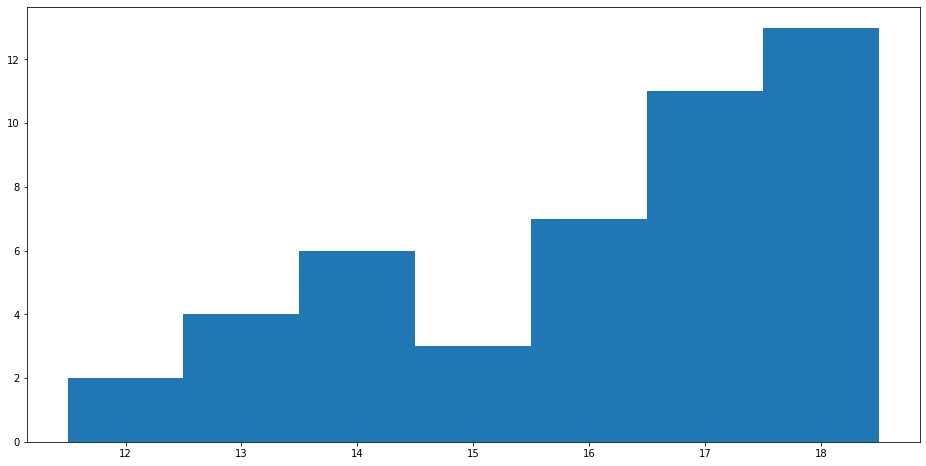

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,size_test = 6,method='auc',intermediate_n=True,usage_map=True)

Yes, you can.

It's also interesting that I can find out when it stopped by itself.

I really need to do Cross-Correlation to find n_features, otherwise I will get very bad answers. Let's try Accuracy.

  0%|          | 0/50 [00:00<?, ?it/s]

Length 1
Accuracy = 0.734006734006734
AUC = 0.6093293795620439
"Fraying":2, [47, 3]
Length 2
Accuracy = 0.7373737373737373
AUC = 0.7965556569343065
"Fraying":3, [5, 3, 42]
Length 3
Accuracy = 0.7912457912457912
AUC = 0.8520757299270074
"Fraying":3, [5, 1, 44]
Length 4
Accuracy = 0.8518518518518519
AUC = 0.8898722627737226
"Fraying":2, [5, 45]
Length 5
Accuracy = 0.8249158249158249
AUC = 0.8600821167883212
"Fraying":8, [1, 1, 1, 3, 2, 35, 1, 5]
Length 6
Accuracy = 0.7171717171717171
AUC = 0.7988138686131386
"Fraying":11, [1, 1, 3, 29, 1, 2, 1, 1, 1, 1, 1]
Length 7
Accuracy = 0.48484848484848486
AUC = 0.6249315693430657
"Fraying":12, [15, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1]
Length 8
Accuracy = 0.37373737373737376
AUC = 0.5760492700729928
"Fraying":9, [1, 1, 13, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.23905723905723905
AUC = 0.5268248175182482
"Fraying":6, [6, 1, 1, 1, 3, 1]
Length 10
Accuracy = 0.12457912457912458
AUC = 0.5092153284671533
"Fraying":4, [2, 1, 1, 3]
Length 11
Accuracy = 0.047

thal_3.0       1.00
ca_0.0         1.00
cp_4.0         1.00
thalach        0.90
restecg_1.0    0.70
ca_1.0         0.62
sex            0.42
chol           0.38
thal_6.0       0.24
trestbps       0.18
slope_2.0      0.14
cp_2.0         0.14
age            0.12
oldpeak        0.12
cp_1.0         0.10
fbs            0.06
exang          0.06
restecg_0.0    0.06
slope_1.0      0.04
slope_3.0      0.02
ca_2.0         0.02
cp_3.0         0.00
restecg_2.0    0.00
ca_3.0         0.00
thal_7.0       0.00
dtype: float64

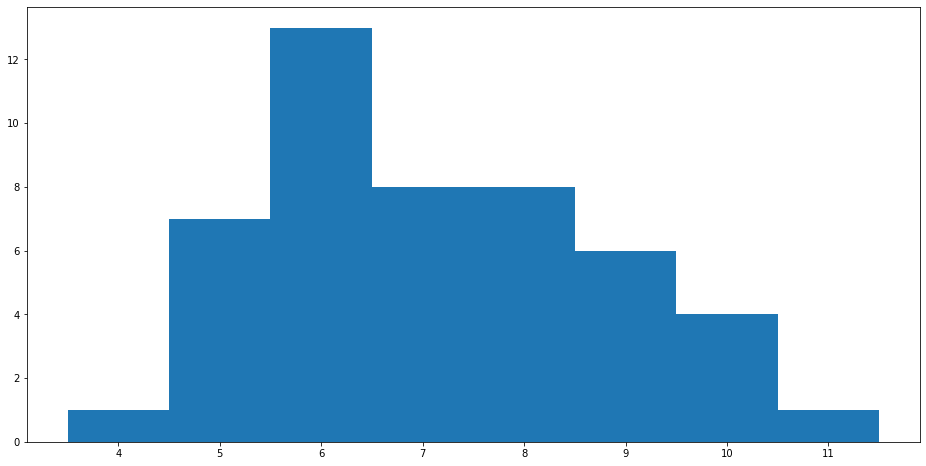

In [ ]:
accuracy_method = automated_leave_k_out(X_encoded,y,size_test = 6,method='accuracy',intermediate_n=True,usage_map=True)

Accuracy is faster.

And it stops much earlier.

Both accuracy and AUC cannot decide the right point to stop. Accuracy is too early and AUC is too late.

Accuracy is really bad. It's better to be too late than too early.

I just realized when I do cross-validation I should only use the training set to do it.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7003367003367004
AUC = 0.6730383211678833
"Fraying":0.54, [7, 1, 2]
Length 2
Accuracy = 0.7138047138047138
AUC = 0.77319799270073
"Fraying":0.26, [2, 4, 2, 1, 1]
Length 3
Accuracy = 0.7845117845117845
AUC = 0.8360401459854014
"Fraying":0.32, [1, 1, 1, 5, 2]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8923129562043796
"Fraying":0.3, [3, 4, 2, 1]
Length 5
Accuracy = 0.7441077441077442
AUC = 0.8199817518248176
"Fraying":0.17000000000000004, [3, 2, 1, 1, 1, 1]
Length 6
Accuracy = 0.7643097643097643
AUC = 0.8260264598540148
"Fraying":0.15, [1, 3, 1, 1, 1, 1, 1]
Length 7
Accuracy = 0.7474747474747475
AUC = 0.8264598540145984
"Fraying":0.12999999999999998, [1, 1, 2, 1, 2, 1, 1]
Length 8
Accuracy = 0.6599326599326599
AUC = 0.7340100364963504
"Fraying":0.08, [1, 1, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.5723905723905723
AUC = 0.6867700729927008
"Fraying":0.07, [1, 1, 1, 1, 1, 1, 1]
Length 10
Accuracy = 0.494949494949495
AUC = 0.6308850364963503
"Fraying":0.079999999999

ca_0.0         1.0
cp_4.0         1.0
thal_3.0       0.9
sex            0.9
trestbps       0.9
slope_1.0      0.7
thal_6.0       0.6
thalach        0.6
oldpeak        0.6
slope_2.0      0.5
cp_2.0         0.5
exang          0.4
fbs            0.4
chol           0.2
ca_1.0         0.2
ca_2.0         0.2
restecg_0.0    0.2
thal_7.0       0.1
restecg_2.0    0.1
age            0.1
cp_1.0         0.0
cp_3.0         0.0
restecg_1.0    0.0
slope_3.0      0.0
ca_3.0         0.0
dtype: float64

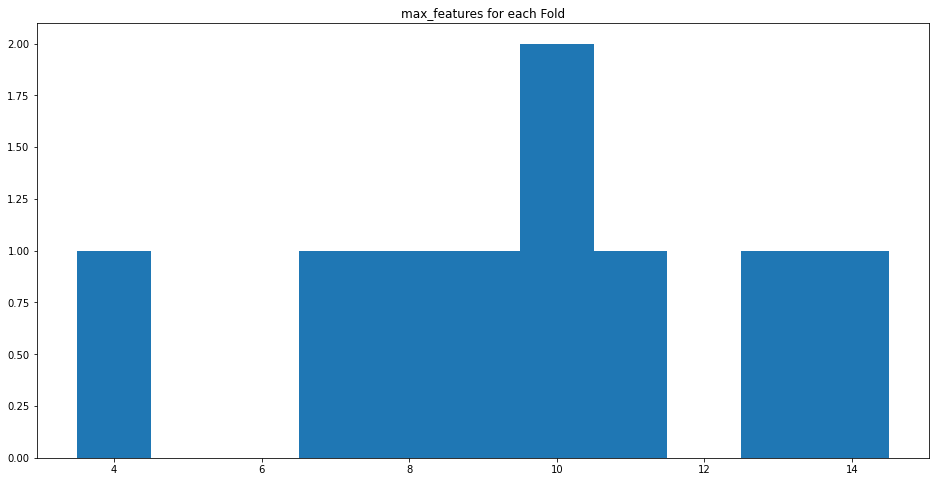

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

Does this mean that really 10 is not the best answer and that it changes or does it mean that I need to do less size_gridsearch_test.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/53 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7306397306397306
AUC = 0.7065009124087591
"Fraying":0.66, [8, 1, 1]
Length 2
Accuracy = 0.7138047138047138
AUC = 0.8077782846715329
"Fraying":0.54, [7, 1, 2]
Length 3
Accuracy = 0.835016835016835
AUC = 0.8647582116788322
"Fraying":0.68, [8, 2]
Length 4
Accuracy = 0.835016835016835
AUC = 0.9011861313868613
"Fraying":0.43999999999999995, [2, 6, 2]
Length 5
Accuracy = 0.8215488215488216
AUC = 0.8931341240875912
"Fraying":0.19999999999999998, [2, 1, 2, 1, 1, 3]
Length 6
Accuracy = 0.8282828282828283
AUC = 0.9008211678832118
"Fraying":0.24000000000000005, [1, 4, 1, 2, 1, 1]
Length 7
Accuracy = 0.8484848484848485
AUC = 0.9002737226277373
"Fraying":0.12000000000000001, [1, 1, 1, 1, 1, 2, 1, 1, 1]
Length 8
Accuracy = 0.8552188552188552
AUC = 0.9007527372262775
"Fraying":0.09999999999999999, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.6599326599326599
AUC = 0.7764370437956205
"Fraying":0.1, [1, 1, 1, 1, 1, 1, 2]
Length 10
Accuracy = 0.5824915824915825
AUC = 0.7036

thal_3.0       1.0
sex            1.0
trestbps       1.0
ca_0.0         1.0
cp_4.0         1.0
thalach        0.9
thal_6.0       0.8
oldpeak        0.7
slope_1.0      0.7
cp_2.0         0.7
ca_2.0         0.4
restecg_0.0    0.3
slope_2.0      0.3
fbs            0.3
exang          0.3
chol           0.2
thal_7.0       0.0
cp_1.0         0.0
cp_3.0         0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_3.0      0.0
ca_1.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

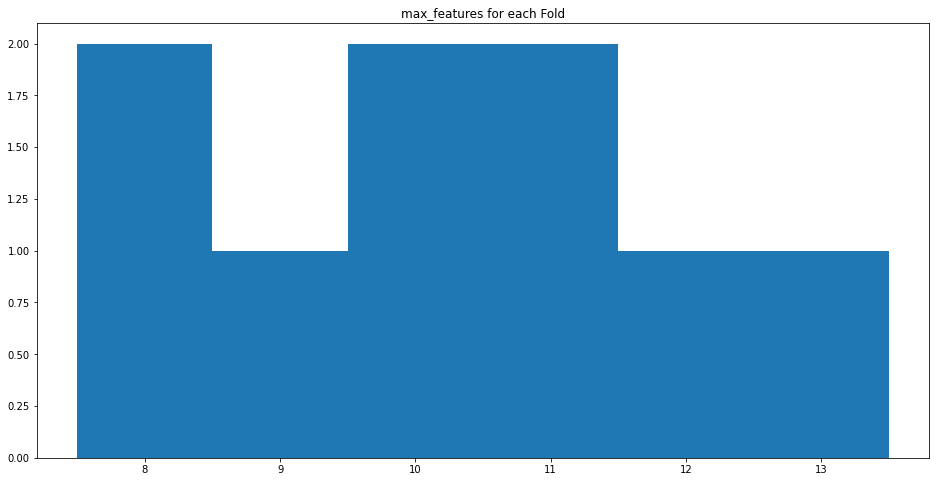

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=5)

So this really helped my AUC.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=1,no_cv=True)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

Length 1
Accuracy = 0.0707070707070707
AUC = 0.4891879562043795
"Fraying":0.01, [1]
Length 2
Accuracy = 0.0707070707070707
AUC = 0.4899406934306568
"Fraying":0.01, [1]
Length 3
Accuracy = 0.08080808080808081
AUC = 0.4904425182481751
"Fraying":0.01, [1]
Length 4
Accuracy = 0.08080808080808081
AUC = 0.49087591240875905
"Fraying":0.01, [1]
Length 5
Accuracy = 0.07744107744107744
AUC = 0.49085310218978095
"Fraying":0.01, [1]
Length 6
Accuracy = 0.08080808080808081
AUC = 0.49094434306569334
"Fraying":0.01, [1]
Length 7
Accuracy = 0.08080808080808081
AUC = 0.49087591240875905
"Fraying":0.01, [1]
Length 8
Accuracy = 0.08080808080808081
AUC = 0.4907846715328466
"Fraying":0.01, [1]
Length 9
Accuracy = 0.07744107744107744
AUC = 0.4905565693430656
"Fraying":0.01, [1]
Length 10
Accuracy = 0.07407407407407407
AUC = 0.490647810218978
"Fraying":0.01, [1]


ValueError: ignored

This Fold did choose n_features = 10, but the Accuracy was not good.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

[10]
Length 1
Accuracy = 0.7666666666666667
AUC = 0.7633928571428572
Length 2
Accuracy = 0.7333333333333333
AUC = 0.8526785714285714
Length 3
Accuracy = 0.9333333333333333
AUC = 0.953125
Length 4
Accuracy = 0.8666666666666667
AUC = 0.9910714285714286
Length 5
Accuracy = 0.9
AUC = 0.9910714285714286
Length 6
Accuracy = 0.9
AUC = 1.0
Length 7
Accuracy = 0.9
AUC = 0.9955357142857143
Length 8
Accuracy = 0.9
AUC = 1.0
Length 9
Accuracy = 0.9
AUC = 1.0
Length 10
Accuracy = 0.9
AUC = 1.0
Altogether:
Accuracy = 0.9
AUC = 1.0


cp_2.0         1.0
thal_3.0       1.0
sex            1.0
trestbps       1.0
ca_0.0         1.0
thalach        1.0
slope_1.0      1.0
oldpeak        1.0
thal_6.0       1.0
cp_4.0         1.0
thal_7.0       0.0
chol           0.0
fbs            0.0
exang          0.0
cp_1.0         0.0
restecg_0.0    0.0
cp_3.0         0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

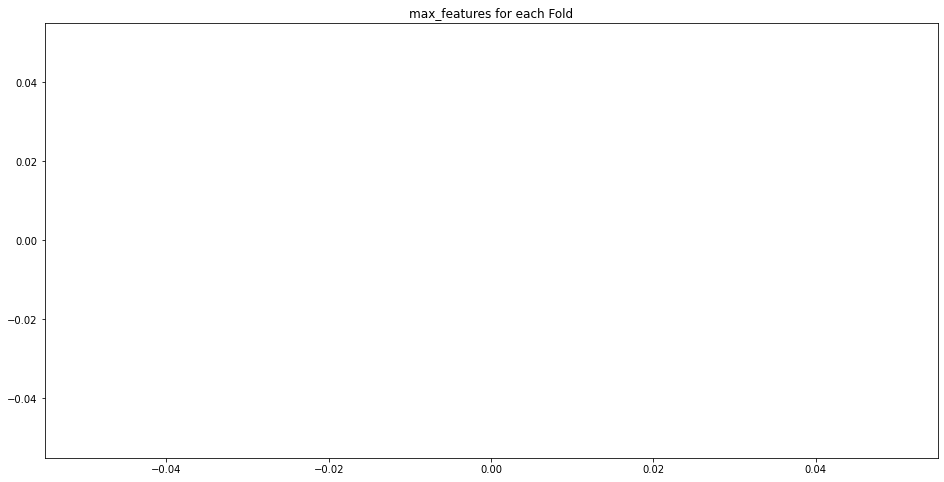

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=10,no_cv=True)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/267 [00:00<?, ?it/s]

  0%|          | 0/268 [00:00<?, ?it/s]

  0%|          | 0/268 [00:00<?, ?it/s]

  0%|          | 0/268 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7138047138047138
AUC = 0.6915602189781022
"Fraying":0.54, [7, 1, 2]
Length 2
Accuracy = 0.7474747474747475
AUC = 0.7950273722627736
"Fraying":0.42, [6, 1, 2, 1]
Length 3
Accuracy = 0.8282828282828283
AUC = 0.8628877737226276
"Fraying":0.66, [1, 8, 1]
Length 4
Accuracy = 0.8451178451178452
AUC = 0.8897354014598541
"Fraying":0.36, [1, 3, 5, 1]
Length 5
Accuracy = 0.8013468013468014
AUC = 0.8905109489051096
"Fraying":0.14, [1, 1, 2, 1, 1, 1, 1, 2]
Length 6
Accuracy = 0.8282828282828283
AUC = 0.8948220802919709
"Fraying":0.22000000000000003, [1, 1, 1, 1, 1, 4, 1]
Length 7
Accuracy = 0.6666666666666666
AUC = 0.756227189781022
"Fraying":0.09999999999999999, [1, 1, 1, 2, 1, 1, 1]
Length 8
Accuracy = 0.6801346801346801
AUC = 0.7577326642335767
"Fraying":0.08, [1, 1, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.5959595959595959
AUC = 0.7046304744525548
"Fraying":0.11000000000000001, [1, 1, 1, 2, 2]
Length 10
Accuracy = 0.5286195286195287
AUC = 0.6628193430656935
"Fraying":0.180

thal_3.0       1.0
sex            1.0
trestbps       1.0
ca_0.0         1.0
cp_4.0         1.0
oldpeak        0.8
slope_1.0      0.7
thalach        0.7
cp_2.0         0.7
thal_6.0       0.6
restecg_0.0    0.2
ca_2.0         0.2
slope_2.0      0.2
restecg_2.0    0.2
fbs            0.1
exang          0.1
thal_7.0       0.1
ca_1.0         0.1
cp_1.0         0.0
cp_3.0         0.0
restecg_1.0    0.0
slope_3.0      0.0
chol           0.0
ca_3.0         0.0
age            0.0
dtype: float64

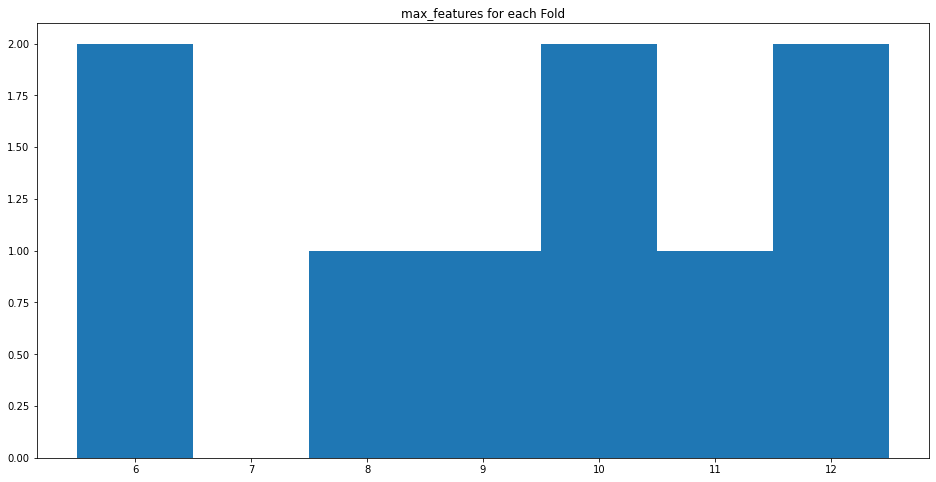

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=1)

That didn't make it any better.

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Length 1
Accuracy = 0.734006734006734
AUC = 0.6020985401459853
"Fraying":0.903476012640046, [56, 3]
Length 2
Accuracy = 0.6801346801346801
AUC = 0.7596031021897811
"Fraying":0.9023269175524274, [56, 2, 1]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8451414233576641
"Fraying":1.0, [59]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8855383211678831
"Fraying":0.7655846021258259, [8, 51]
Length 5
Accuracy = 0.835016835016835
AUC = 0.8950501824817518
"Fraying":0.6265440965239873, [46, 6, 2, 5]
Length 6
Accuracy = 0.8417508417508418
AUC = 0.9042427007299271
"Fraying":0.7581154840563057, [1, 6, 1, 51]
Length 7
Accuracy = 0.8215488215488216
AUC = 0.8995894160583943
"Fraying":0.5251364550416546, [3, 2, 1, 5, 42, 5]
Length 8
Accuracy = 0.797979797979798
AUC = 0.8867700729927008
"Fraying":0.3269175524274634, [1, 1, 6, 1, 29, 1, 16, 1]
Length 9
Accuracy = 0.7777777777777778
AUC = 0.850684306569343
"Fraying":0.2826773915541511, [6, 12, 4, 1, 1, 1, 2

thal_3.0       1.000000
sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
thal_6.0       0.966102
oldpeak        0.932203
thalach        0.915254
cp_2.0         0.915254
slope_1.0      0.864407
restecg_0.0    0.237288
slope_2.0      0.135593
restecg_2.0    0.101695
ca_1.0         0.067797
exang          0.067797
fbs            0.016949
thal_7.0       0.016949
cp_1.0         0.000000
cp_3.0         0.000000
restecg_1.0    0.000000
slope_3.0      0.000000
chol           0.000000
ca_2.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

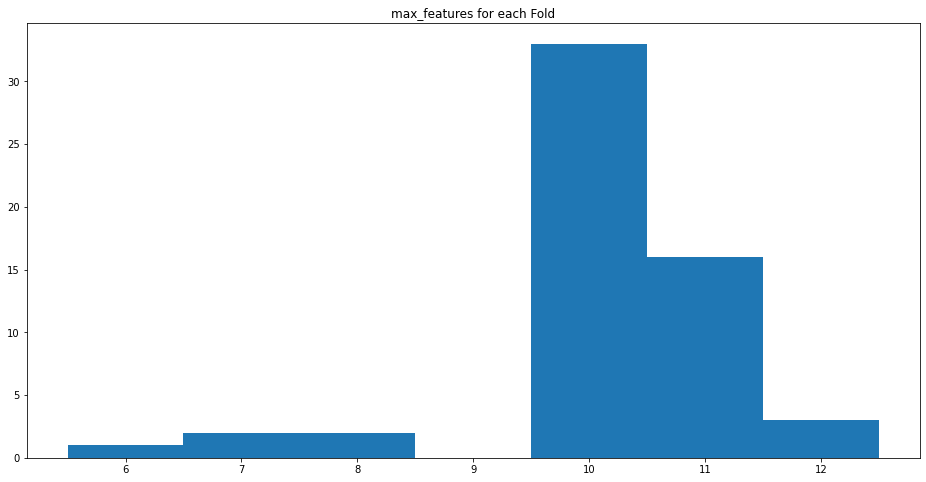

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)

Is there a way to find the Sample so that taking it out, the chance is highest that we don't want 10 Features?

We are still less good than log_all.

Maybe take out the one that makes most sense. That way, what's left makes less sense.

In [ ]:
np.max(auc_method)

0.99817385

  0%|          | 0/99 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7542087542087542
AUC = 0.6016651459854014
"Fraying":0.9800020406081013, [98, 1]
Length 2
Accuracy = 0.6801346801346801
AUC = 0.7591697080291971
"Fraying":0.9218447097234976, [95, 1, 3]
Length 3
Accuracy = 0.8417508417508418
AUC = 0.8413093065693431
"Fraying":0.9800020406081013, [1, 98]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8831888686131388
"Fraying":0.7847158453219059, [11, 87, 1]
Length 5
Accuracy = 0.835016835016835
AUC = 0.890419708029197
"Fraying":0.6792164064891337, [8, 2, 1, 1, 5, 1, 81]
Length 6
Accuracy = 0.8282828282828283
AUC = 0.903558394160584
"Fraying":0.7604326089174575, [1, 1, 86, 2, 1, 1, 7]
Length 7
Accuracy = 0.8181818181818182
AUC = 0.8544251824817519
"Fraying":0.5978981736557495, [76, 2, 2, 1, 8, 1, 1, 3]
Length 8
Accuracy = 0.8047138047138047
AUC = 0.8437728102189781
"Fraying":0.372921130496888, [1, 56, 1, 2, 8, 2, 2, 21]
Length 9
Accuracy = 0.8013468013468014
AUC = 0.8415374087591242
"Fraying":0.3588409345985103, [56, 1, 8, 2, 4, 2, 

thal_3.0       1.000000
sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
oldpeak        0.939394
thal_6.0       0.929293
cp_2.0         0.919192
thalach        0.919192
slope_1.0      0.888889
restecg_0.0    0.171717
slope_2.0      0.111111
restecg_2.0    0.040404
fbs            0.020202
thal_7.0       0.020202
ca_1.0         0.020202
exang          0.010101
slope_3.0      0.010101
chol           0.010101
cp_3.0         0.000000
cp_1.0         0.000000
restecg_1.0    0.000000
ca_2.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

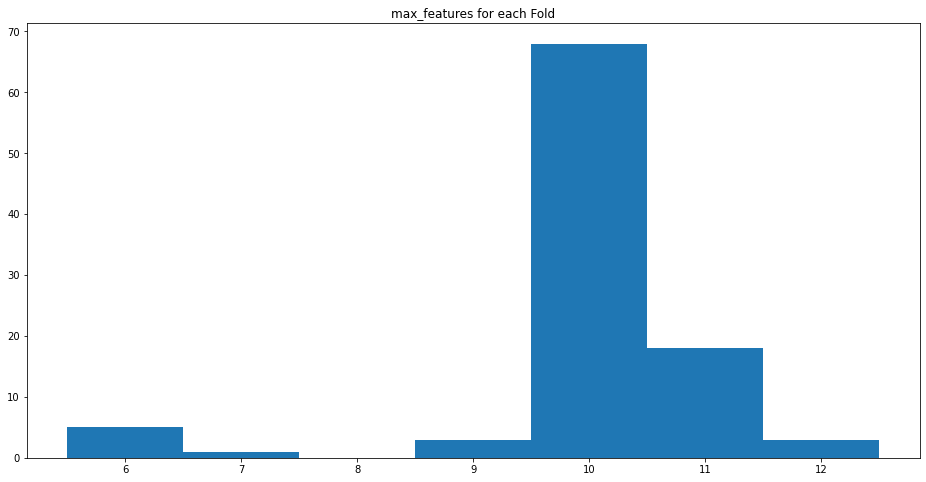

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 3,size_gridsearch_test=3)

close to 70/100. before it was 32/60. but our AUC became less.

I want to see length=25. 

also allowing to drop Features.

Let's try the new function.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7441077441077442
AUC = 0.7004333941605838
"Fraying":0.66, [8, 1, 1]
Length 2
Accuracy = 0.7205387205387206
AUC = 0.7989735401459854
"Fraying":0.45999999999999996, [1, 6, 3]
Length 3
Accuracy = 0.8282828282828283
AUC = 0.8641651459854015
"Fraying":0.58, [7, 3]
Length 4
Accuracy = 0.8451178451178452
AUC = 0.9058166058394161
"Fraying":0.45999999999999996, [1, 3, 6]
Length 5
Accuracy = 0.8417508417508418
AUC = 0.9037864963503649
"Fraying":0.2, [1, 2, 1, 3, 2, 1]
Length 6
Accuracy = 0.7474747474747475
AUC = 0.8214872262773724
"Fraying":0.29000000000000004, [1, 1, 5, 1, 1]
Length 7
Accuracy = 0.7542087542087542
AUC = 0.8163093065693431
"Fraying":0.13, [2, 1, 1, 1, 2, 1, 1]
Length 8
Accuracy = 0.6565656565656566
AUC = 0.7347855839416058
"Fraying":0.09999999999999999, [1, 1, 1, 1, 1, 2, 1]
Length 9
Accuracy = 0.6498316498316499
AUC = 0.7328695255474453
"Fraying":0.14, [1, 1, 3, 1, 1, 1]
Length 10
Accuracy = 0.6464646464646465
AUC = 0.7390510948905109
"Fraying":0.2, [1, 1,

thal_3.0       1.0
ca_0.0         1.0
slope_1.0      1.0
cp_4.0         1.0
sex            0.9
trestbps       0.9
oldpeak        0.9
thalach        0.8
thal_6.0       0.8
cp_2.0         0.7
exang          0.7
ca_1.0         0.6
fbs            0.6
slope_2.0      0.6
restecg_0.0    0.5
age            0.5
chol           0.4
ca_2.0         0.4
cp_1.0         0.3
restecg_1.0    0.2
restecg_2.0    0.1
cp_3.0         0.0
slope_3.0      0.0
ca_3.0         0.0
thal_7.0       0.0
dtype: float64

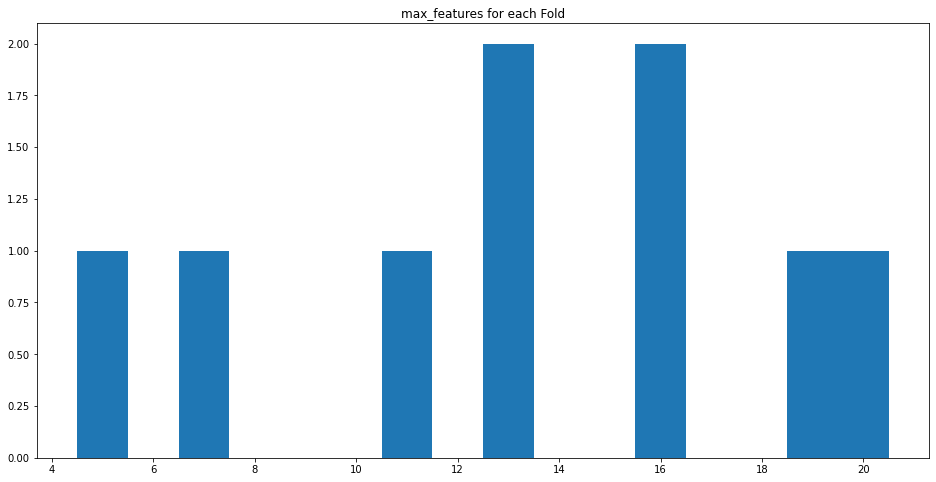

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

Between 5 and 20 Features were chosen here. But the result is correct.

Let's try keep_going.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Length 1
Accuracy = 0.6936026936026936
AUC = 0.6417198905109489
"Fraying":0.54, [7, 2, 1]
Length 2
Accuracy = 0.696969696969697
AUC = 0.7801551094890511
"Fraying":0.52, [1, 7, 1, 1]
Length 3
Accuracy = 0.8114478114478114
AUC = 0.8631614963503649
"Fraying":0.54, [7, 2, 1]
Length 4
Accuracy = 0.835016835016835
AUC = 0.8977645985401461
"Fraying":0.33999999999999997, [2, 2, 1, 5]
Length 5
Accuracy = 0.8148148148148148
AUC = 0.8934534671532848
"Fraying":0.18000000000000002, [1, 1, 2, 3, 1, 1, 1]
Length 6
Accuracy = 0.8249158249158249
AUC = 0.8967153284671534
"Fraying":0.18000000000000002, [1, 1, 3, 1, 1, 2, 1]
Length 7
Accuracy = 0.8316498316498316
AUC = 0.8989963503649635
"Fraying":0.16, [3, 1, 1, 1, 1, 1, 1, 1]
Length 8
Accuracy = 0.8316498316498316
AUC = 0.9046760948905109
"Fraying":0.09999999999999999, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.8282828282828283
AUC = 0.9017791970802919
"Fraying":0.12000000000000001, [1, 1, 1, 1, 1, 1, 2, 1, 1]
Length 10
Accuracy = 0.8282828282

thal_3.0       1.0
sex            1.0
trestbps       1.0
ca_0.0         1.0
cp_4.0         1.0
thalach        0.9
slope_1.0      0.9
oldpeak        0.9
cp_2.0         0.9
thal_6.0       0.8
ca_2.0         0.7
exang          0.7
restecg_0.0    0.6
slope_2.0      0.6
restecg_2.0    0.6
cp_1.0         0.5
age            0.5
restecg_1.0    0.5
slope_3.0      0.5
ca_1.0         0.5
cp_3.0         0.4
fbs            0.4
thal_7.0       0.4
chol           0.3
ca_3.0         0.3
dtype: float64

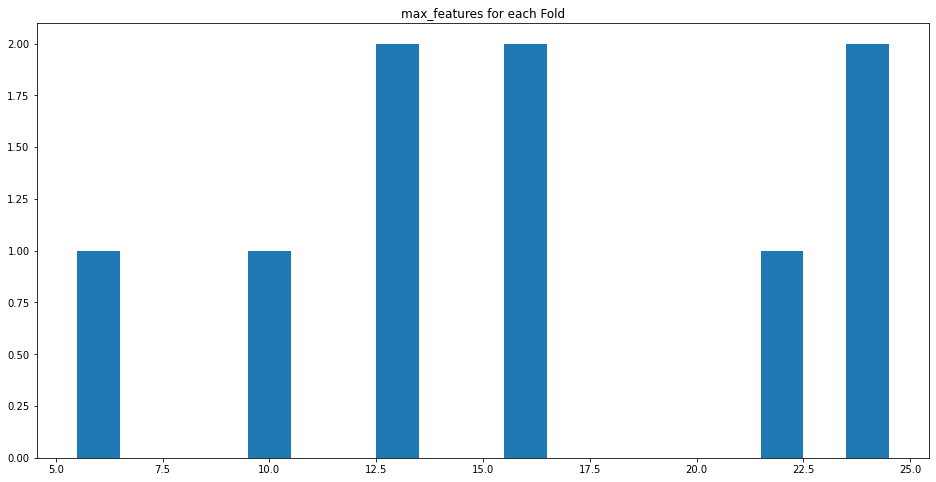

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

Using keep_going takes 50% longer. But I found a way to make it 60% faster. Now keep_going is not going to be slower than not keep_going.

and keep_going has an auc of 0.91 for 80/20 train_test_split.

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.6301094890510949
"Fraying":1.0, [59]
Length 2
Accuracy = 0.696969696969697
AUC = 0.7811587591240876
"Fraying":0.9666762424590635, [58, 1]
Length 3
Accuracy = 0.8451178451178452
AUC = 0.847103102189781
"Fraying":0.9666762424590635, [58, 1]
Length 4
Accuracy = 0.8249158249158249
AUC = 0.8858804744525548
"Fraying":0.6908934214306234, [10, 1, 48]
Length 5
Accuracy = 0.8215488215488216
AUC = 0.8902144160583942
"Fraying":0.5133582303935651, [2, 2, 41, 7, 7]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.900022810218978
"Fraying":0.6776788279230107, [1, 2, 48, 1, 7]
Length 7
Accuracy = 0.8383838383838383
AUC = 0.8986541970802919
"Fraying":0.5449583453030739, [1, 43, 1, 1, 1, 1, 5, 3, 3]
Length 8
Accuracy = 0.8282828282828283
AUC = 0.8956888686131387
"Fraying":0.260557311117495, [3, 22, 1, 1, 3, 6, 1, 2, 19, 1]
Length 9
Accuracy = 0.8316498316498316
AUC = 0.9002737226277372
"Fraying":0.31054294742889976, [27, 7, 17, 3, 1,

thal_3.0       1.000000
sex            1.000000
ca_0.0         1.000000
trestbps       1.000000
cp_4.0         1.000000
thal_6.0       0.949153
cp_2.0         0.949153
thalach        0.949153
oldpeak        0.949153
slope_1.0      0.864407
restecg_0.0    0.338983
slope_2.0      0.237288
restecg_2.0    0.237288
ca_1.0         0.135593
fbs            0.118644
ca_2.0         0.118644
exang          0.101695
thal_7.0       0.084746
restecg_1.0    0.084746
age            0.084746
cp_1.0         0.067797
cp_3.0         0.067797
chol           0.067797
slope_3.0      0.067797
ca_3.0         0.067797
dtype: float64

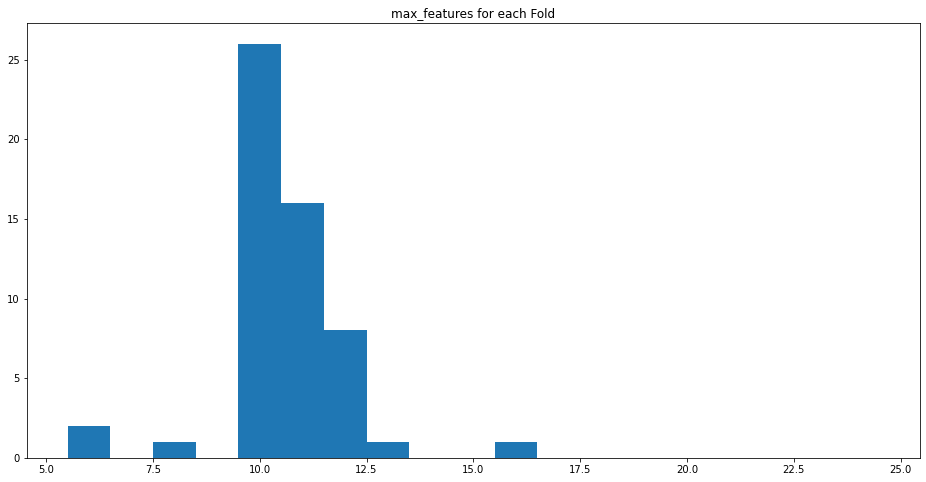

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)

if altogether is mostly 10,11 and 12 max_features, why is its auc so much worse?

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

19


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

19


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

13


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

8


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

8


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

24
Length 1
Accuracy = 0.7542087542087542
AUC = 0.6148494525547447
"Fraying":0.9666762424590635, [58, 1]
Length 2
Accuracy = 0.7003367003367004
AUC = 0.7590100364963503
"Fraying":0.8707268026429187, [1, 2, 1, 55]
Length 3
Accuracy = 0.8417508417508418
AUC = 0.8395985401459855
"Fraying":0.9339270324619362, [57, 1, 1]
Length 4
Accuracy = 0.8316498316498316
AUC = 0.8876140510948908
"Fraying":0.7368572249353633, [50, 8, 1]
Length 5
Accuracy = 0.8181818181818182
AUC = 0.8895529197080293
"Fraying":0.5725366274059178, [1, 5, 44, 2, 1, 1, 5]
Length 6
Accuracy = 0.8417508417508418
AUC = 0.9015967153284672
"Fraying":0.6983625395001436, [5, 1, 1, 1, 1, 1, 49]
Length 7
Accuracy = 0.8484848484848485
AUC = 0.9004105839416058
"Fraying":0.5903476012640045, [2, 1, 3, 3, 2, 1, 1, 45, 1]
Length 8
Accuracy = 0.8249158249158249
AUC = 0.8994981751824818
"Fraying":0.3668486067222063, [1, 1, 2, 15, 2, 32, 4, 1, 1]
Length 9
Accuracy = 0.8249158249158249
AUC = 0.900228102189781
"Fraying":0.32950301637460494, [1

thal_3.0       1.000000
sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
thal_6.0       0.949153
oldpeak        0.915254
cp_2.0         0.898305
thalach        0.898305
slope_1.0      0.881356
restecg_0.0    0.254237
slope_2.0      0.152542
ca_2.0         0.101695
restecg_2.0    0.084746
chol           0.067797
thal_7.0       0.067797
exang          0.050847
restecg_1.0    0.050847
fbs            0.050847
age            0.050847
ca_1.0         0.033898
cp_1.0         0.016949
slope_3.0      0.016949
ca_3.0         0.016949
cp_3.0         0.000000
dtype: float64

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

8


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

25


  0%|          | 0/58 [00:00<?, ?it/s]

15


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

16


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

13


  0%|          | 0/58 [00:00<?, ?it/s]

14


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

15


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

16


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

15


  0%|          | 0/58 [00:00<?, ?it/s]

10
Length 1
Accuracy = 0.7508417508417509
AUC = 0.605793795620438
"Fraying":0.9345015800057455, [57, 2]
Length 2
Accuracy = 0.6936026936026936
AUC = 0.7683622262773723
"Fraying":0.9345015800057455, [2, 57]
Length 3
{frozenset({'ca_0.0', 'cp_4.0', 'thal_3.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8441377737226277
"Fraying":1.0, [59]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8883667883211679
"Fraying":0.6966388968687159, [48, 11]
Length 5
Accuracy = 0.8316498316498316
AUC = 0.8890967153284671
"Fraying":0.49784544671071534, [9, 7, 40, 1, 1, 1]
Length 6
Accuracy = 0.835016835016835
AUC = 0.9036268248175183
"Fraying":0.6546969261706406, [8, 1, 2, 1, 47]
Length 7
Accuracy = 0.8451178451178452
AUC = 0.9021441605839415
"Fraying":0.4754380925021545, [1, 9, 1, 1, 39, 1, 7]
Length 8
Accuracy = 0.835016835016835
AUC = 0.8997718978102189
"Fraying":0.334099396725079, [1, 13, 1, 3, 30, 9, 1, 1]
Length 9
Accuracy = 0.835016835016835
AUC = 0.8961222627737226
"Fraying":0.2841137604136742, [5, 1, 

thal_3.0       1.000000
sex            1.000000
ca_0.0         1.000000
trestbps       1.000000
cp_4.0         1.000000
thal_6.0       0.898305
cp_2.0         0.864407
thalach        0.864407
oldpeak        0.864407
slope_1.0      0.830508
restecg_0.0    0.355932
slope_2.0      0.220339
ca_2.0         0.169492
restecg_2.0    0.118644
ca_1.0         0.118644
exang          0.118644
fbs            0.101695
age            0.084746
chol           0.050847
slope_3.0      0.033898
thal_7.0       0.033898
cp_1.0         0.016949
cp_3.0         0.016949
restecg_1.0    0.016949
ca_3.0         0.016949
dtype: float64

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

6


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

23


  0%|          | 0/73 [00:00<?, ?it/s]

12


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

25


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

17


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

12


  0%|          | 0/73 [00:00<?, ?it/s]

25


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

25


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

17


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

9


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

6


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

12


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

11


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10


  0%|          | 0/73 [00:00<?, ?it/s]

10
Length 1
Accuracy = 0.7542087542087542
AUC = 0.6054060218978101
"Fraying":0.9733382030679328, [73, 1]
Length 2
Accuracy = 0.696969696969697
AUC = 0.7809762773722628
"Fraying":0.9733382030679328, [1, 73]
Length 3
Accuracy = 0.8417508417508418
AUC = 0.8444799270072993
"Fraying":0.9733382030679328, [73, 1]
Length 4
Accuracy = 0.8215488215488216
AUC = 0.8860401459854016
"Fraying":0.7432432432432433, [63, 10, 1]
Length 5
Accuracy = 0.8282828282828283
AUC = 0.8872034671532847
"Fraying":0.6124908692476261, [8, 6, 57, 1, 2]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.9006843065693431
"Fraying":0.7344777209642075, [7, 1, 1, 1, 1, 63]
Length 7
Accuracy = 0.8383838383838383
AUC = 0.8996806569343067
"Fraying":0.6468224981738495, [1, 1, 7, 1, 2, 59, 1, 2]
Length 8
Accuracy = 0.835016835016835
AUC = 0.8971259124087592
"Fraying":0.34477720964207453, [1, 3, 19, 2, 38, 1, 8, 2]
Length 9
Accuracy = 0.8282828282828283
AUC = 0.8973540145985403
"Fraying":0.3195763330898466, [12, 7, 38, 1, 1, 3, 1, 10

thal_3.0       1.000000
sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
oldpeak        0.972973
thal_6.0       0.959459
thalach        0.959459
cp_2.0         0.959459
slope_1.0      0.878378
restecg_0.0    0.229730
slope_2.0      0.202703
restecg_2.0    0.189189
ca_2.0         0.094595
fbs            0.094595
chol           0.081081
age            0.081081
ca_1.0         0.081081
exang          0.067568
thal_7.0       0.067568
cp_1.0         0.054054
cp_3.0         0.054054
restecg_1.0    0.054054
slope_3.0      0.054054
ca_3.0         0.040541
dtype: float64

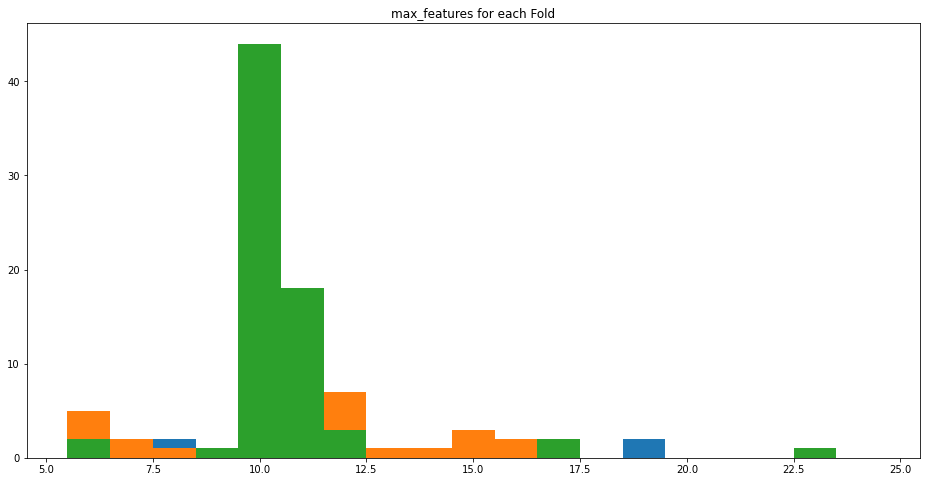

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)
auc_method = automated_leave_k_out(X_encoded,y,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)
auc_method = automated_leave_k_out(X_encoded,y,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 4,size_gridsearch_test=4)

It is a lot better with size_test = 4. We finally do better than 25 Features. size_test = 4 is the green one.

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Length 1
Accuracy = 0.7306397306397306
AUC = 0.8118841240875913
"Fraying":0.5555555555555556, [2, 1]
Length 2
Accuracy = 0.8215488215488216
AUC = 0.8687956204379563
"Fraying":0.5555555555555556, [1, 2]
Length 3
Accuracy = 0.8451178451178452
AUC = 0.8994753649635037
"Fraying":0.5555555555555556, [1, 2]
Length 4
Accuracy = 0.8451178451178452
AUC = 0.897536496350365
"Fraying":0.5555555555555556, [2, 1]
Length 5
Accuracy = 0.8451178451178452
AUC = 0.9022810218978102
"Fraying":0.3333333333333333, [1, 1, 1]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.9075501824817518
"Fraying":0.3333333333333333, [1, 1, 1]
Length 7
Accuracy = 0.8484848484848485
AUC = 0.9096487226277373
"Fraying":0.3333333333333333, [1, 1, 1]
Length 8
Accuracy = 0.8451178451178452
AUC = 0.9111313868613138
"Fraying":0.3333333333333333, [1, 1, 1]
Length 9
Accuracy = 0.8484848484848485
AUC = 0.9119981751824818
"Fraying":0.3333333333333333, [1, 1, 1]
Length 10
Accuracy = 0.835016835016835
AUC = 0.9096259124087591
"Fraying":0.3

ca_0.0         1.000000
cp_4.0         1.000000
thal_3.0       0.666667
oldpeak        0.666667
slope_1.0      0.333333
thal_7.0       0.000000
cp_2.0         0.000000
sex            0.000000
trestbps       0.000000
chol           0.000000
fbs            0.000000
thalach        0.000000
exang          0.000000
cp_1.0         0.000000
restecg_0.0    0.000000
cp_3.0         0.000000
thal_6.0       0.000000
restecg_1.0    0.000000
restecg_2.0    0.000000
slope_2.0      0.000000
slope_3.0      0.000000
ca_1.0         0.000000
ca_2.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

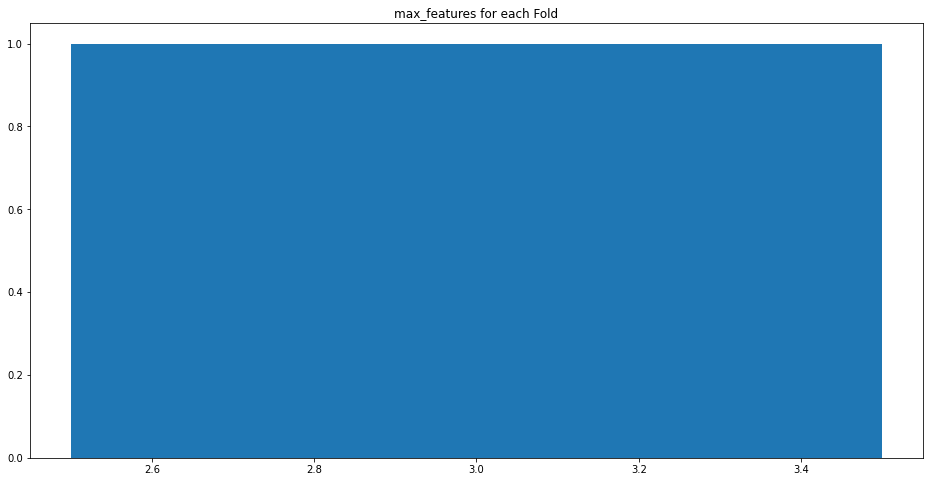

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 100,size_gridsearch_test=100)

3 features or 25 features is the same result.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Length 1
Accuracy = 0.6936026936026936
AUC = 0.7764826642335766
"Fraying":0.45999999999999996, [6, 3, 1]
Length 2
Accuracy = 0.8282828282828283
AUC = 0.8581660583941606
"Fraying":0.58, [3, 7]
Length 3
Accuracy = 0.8316498316498316
AUC = 0.895301094890511
"Fraying":0.66, [1, 8, 1]
Length 4
Accuracy = 0.8417508417508418
AUC = 0.8964872262773722
"Fraying":0.42000000000000004, [4, 1, 5]
Length 5
Accuracy = 0.8282828282828283
AUC = 0.9000684306569343
"Fraying":0.4, [1, 1, 6, 1, 1]
Length 6
Accuracy = 0.8417508417508418
AUC = 0.8978102189781022
"Fraying":0.22, [1, 1, 1, 1, 1, 1, 4]
Length 7
Accuracy = 0.8552188552188552
AUC = 0.8971259124087593
"Fraying":0.14, [2, 1, 1, 1, 2, 1, 1, 1]
Length 8
Accuracy = 0.8619528619528619
AUC = 0.9005474452554745
"Fraying":0.24000000000000002, [3, 2, 3, 1, 1]
Length 9
Accuracy = 0.8417508417508418
AUC = 0.8978102189781023
"Fraying":0.22000000000000006, [4, 1, 1, 1, 1, 1, 1]
Length 10
Accuracy = 0.8316498316498316
AUC = 0.8950273722627737
"Fraying":0.3000000

sex            1.0
ca_0.0         1.0
cp_4.0         1.0
thal_3.0       0.9
oldpeak        0.9
trestbps       0.8
cp_2.0         0.7
slope_2.0      0.7
slope_1.0      0.7
thal_6.0       0.7
thalach        0.6
restecg_0.0    0.4
exang          0.4
chol           0.3
fbs            0.3
age            0.3
restecg_2.0    0.3
ca_2.0         0.3
restecg_1.0    0.2
ca_1.0         0.2
thal_7.0       0.2
cp_1.0         0.1
ca_3.0         0.1
cp_3.0         0.0
slope_3.0      0.0
dtype: float64

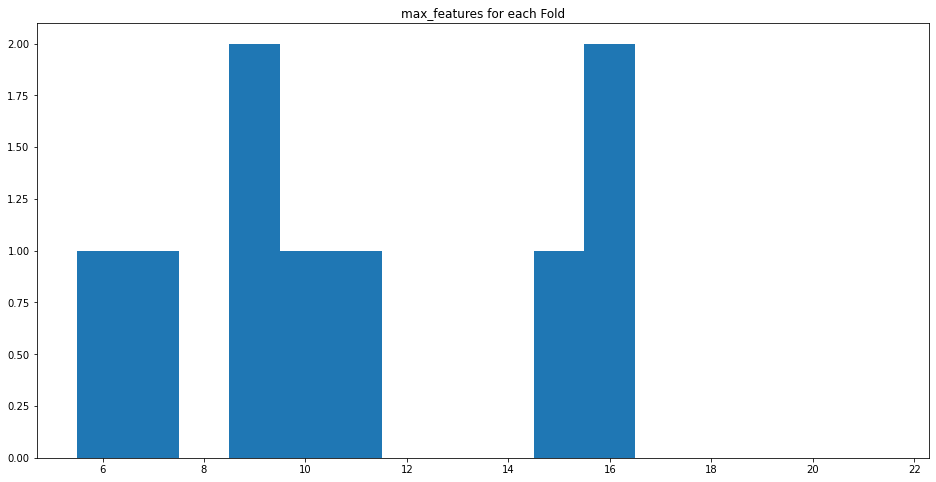

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

Looks like step_forward_selection is not better.

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Length 1
Accuracy = 0.6902356902356902
AUC = 0.759146897810219
"Fraying":0.9345015800057455, [57, 2]
Length 2
Accuracy = 0.8484848484848485
AUC = 0.8431341240875914
"Fraying":0.841424877908647, [3, 2, 54]
Length 3
{frozenset({'cp_4.0', 'ca_0.0', 'thal_3.0'})}
Accuracy = 0.8249158249158249
AUC = 0.8810675182481753
"Fraying":1.0, [59]
Length 4
Accuracy = 0.8249158249158249
AUC = 0.887933394160584
"Fraying":0.7184717035334673, [10, 49]
Length 5
Accuracy = 0.835016835016835
AUC = 0.8996806569343064
"Fraying":0.7064062051134731, [3, 7, 49]
Length 6
Accuracy = 0.8383838383838383
AUC = 0.8989507299270073
"Fraying":0.6546969261706406, [1, 1, 8, 2, 47]
Length 7
Accuracy = 0.835016835016835
AUC = 0.8974452554744525
"Fraying":0.262855501292732, [1, 1, 1, 1, 3, 4, 17, 2, 4, 24, 1]
Length 8
Accuracy = 0.8316498316498316
AUC = 0.8973540145985401
"Fraying":0.27204826199368004, [14, 1, 1, 7, 3, 26, 1, 1, 2, 3]
Length 9
Accuracy = 0.8451178451178452
AUC = 0.911587591240876
"Fraying":0.4604998563631141,

sex            1.000000
ca_0.0         1.000000
cp_4.0         1.000000
trestbps       0.983051
oldpeak        0.966102
cp_2.0         0.949153
thal_3.0       0.915254
slope_1.0      0.830508
thal_6.0       0.762712
thalach        0.491525
slope_2.0      0.220339
thal_7.0       0.152542
chol           0.101695
exang          0.101695
fbs            0.067797
restecg_0.0    0.067797
ca_1.0         0.067797
ca_2.0         0.067797
age            0.067797
restecg_2.0    0.033898
restecg_1.0    0.016949
ca_3.0         0.016949
cp_1.0         0.000000
cp_3.0         0.000000
slope_3.0      0.000000
dtype: float64

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Length 1
Accuracy = 0.6936026936026936
AUC = 0.7682025547445255
"Fraying":0.9666762424590635, [58, 1]
Length 2
Accuracy = 0.8451178451178452
AUC = 0.8465100364963505
"Fraying":0.9023269175524274, [2, 1, 56]
Length 3
Accuracy = 0.8316498316498316
AUC = 0.8843065693430658
"Fraying":0.9666762424590635, [1, 58]
Length 4
Accuracy = 0.835016835016835
AUC = 0.8938868613138686
"Fraying":0.7184717035334673, [10, 49]
Length 5
Accuracy = 0.8417508417508418
AUC = 0.9031934306569344
"Fraying":0.7087043952887101, [1, 1, 8, 49]
Length 6
Accuracy = 0.8451178451178452
AUC = 0.9023266423357664
"Fraying":0.6604424016087331, [9, 3, 47]
Length 7
Accuracy = 0.8316498316498316
AUC = 0.8994069343065693
"Fraying":0.2933065211146222, [2, 1, 5, 1, 21, 2, 4, 23]
Length 8
Accuracy = 0.835016835016835
AUC = 0.896213503649635
"Fraying":0.23068083883941395, [1, 17, 1, 1, 1, 7, 1, 1, 2, 2, 21, 1, 3]
Length 9
Accuracy = 0.8451178451178452
AUC = 0.9133667883211679
"Fraying":0.38580867566791155, [35, 1, 6, 1, 1, 8, 2, 3,

sex            1.000000
ca_0.0         1.000000
cp_4.0         1.000000
thal_3.0       0.949153
trestbps       0.949153
oldpeak        0.881356
slope_1.0      0.864407
cp_2.0         0.847458
thal_6.0       0.813559
thalach        0.440678
slope_2.0      0.220339
restecg_0.0    0.118644
exang          0.118644
fbs            0.101695
thal_7.0       0.101695
ca_1.0         0.101695
ca_2.0         0.101695
restecg_2.0    0.067797
chol           0.067797
age            0.067797
restecg_1.0    0.050847
ca_3.0         0.050847
cp_3.0         0.016949
cp_1.0         0.016949
slope_3.0      0.000000
dtype: float64

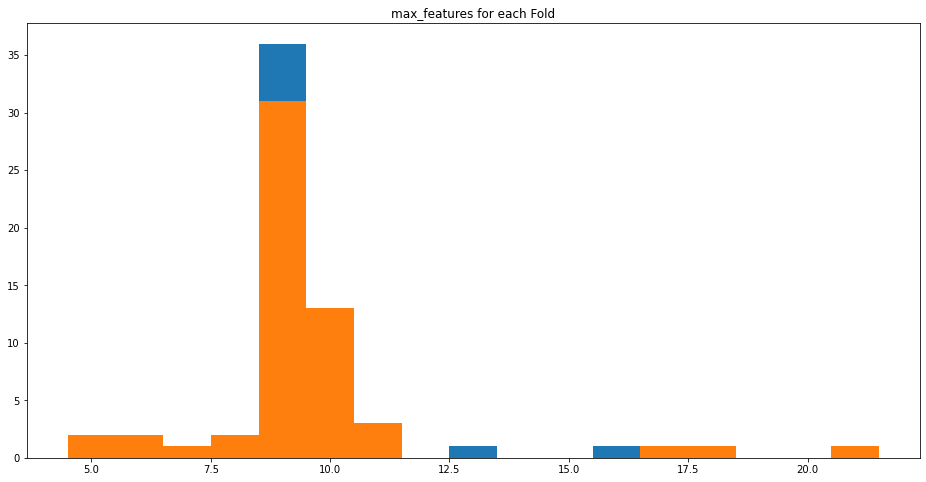

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)

It seems that here we don't have 10 really good Features like before.

<table>
  <tr>
    <th></th>
    <th>Before</th>
    <th>Now</th>
  </tr>
  <tr>
    <td>1.00</td>
    <td>5</td>
    <td>3</td>
  </tr>
  <tr>
    <td>0.90 - 0.99 </td>
    <td>4</td>
    <td>2-4</td>
  </tr>
  <tr>
    <td>0.80 - 0.89 </td>
    <td>1</td>
    <td>1-4</td>
  </tr>
  <tr>
    <td>0.70 - 0.79 </td>
    <td>0</td>
    <td>0-1</td>
  </tr>
  <tr>
    <td>Total</td>
    <td>10</td>
    <td>9</td>
  </tr>
</table>

max_features = 9 has the highest AUC.

Looks like we only have 6.5 hours.

next 
*   AUC 'error'
*   TPU
*   Make own R^2 function

If we don't know if we need 4 or 25 Features, adding more features doesn't make much sense.

*   Find better Features.



Let's use bootstrap to get AUC error.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

10


  0%|          | 0/9 [00:00<?, ?it/s]

8


  0%|          | 0/9 [00:00<?, ?it/s]

9


  0%|          | 0/9 [00:00<?, ?it/s]

22


  0%|          | 0/9 [00:00<?, ?it/s]

13


  0%|          | 0/9 [00:00<?, ?it/s]

6


  0%|          | 0/9 [00:00<?, ?it/s]

4


  0%|          | 0/9 [00:00<?, ?it/s]

14


  0%|          | 0/9 [00:00<?, ?it/s]

10


  0%|          | 0/9 [00:00<?, ?it/s]

9
Length 1
Accuracy = 0.7003367003367004
AUC = 0.7922673357664234
"Fraying":0.68, [2, 8]
Length 2
Accuracy = 0.835016835016835
AUC = 0.870734489051095
"Fraying":0.54, [2, 1, 7]
Length 3
Accuracy = 0.8215488215488216
AUC = 0.8968521897810219
"Fraying":0.8200000000000001, [9, 1]
Length 4
Accuracy = 0.835016835016835
AUC = 0.8911496350364964
"Fraying":0.52, [6, 4]
Length 5
Accuracy = 0.8215488215488216
AUC = 0.8904653284671534
"Fraying":0.24000000000000005, [1, 4, 1, 1, 1, 2]
Length 6
Accuracy = 0.8215488215488216
AUC = 0.8891195255474452
"Fraying":0.16, [1, 1, 1, 1, 1, 1, 1, 3]
Length 7
Accuracy = 0.8181818181818182
AUC = 0.8882299270072993
"Fraying":0.12000000000000001, [1, 1, 1, 1, 2, 1, 1, 1, 1]
Length 8
Accuracy = 0.835016835016835
AUC = 0.8878877737226277
"Fraying":0.09999999999999999, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Length 9
Accuracy = 0.8282828282828283
AUC = 0.8950273722627736
"Fraying":0.12000000000000001, [1, 1, 1, 1, 1, 1, 2, 1, 1]
Length 10
Accuracy = 0.8316498316498316
AUC = 

thal_3.0       1.0
ca_0.0         1.0
cp_4.0         1.0
sex            0.9
slope_1.0      0.8
oldpeak        0.7
trestbps       0.7
thal_6.0       0.7
thalach        0.6
cp_2.0         0.6
exang          0.4
ca_2.0         0.3
slope_2.0      0.3
fbs            0.3
restecg_0.0    0.2
chol           0.2
age            0.2
restecg_2.0    0.2
restecg_1.0    0.1
ca_1.0         0.1
ca_3.0         0.1
thal_7.0       0.1
cp_1.0         0.0
cp_3.0         0.0
slope_3.0      0.0
dtype: float64

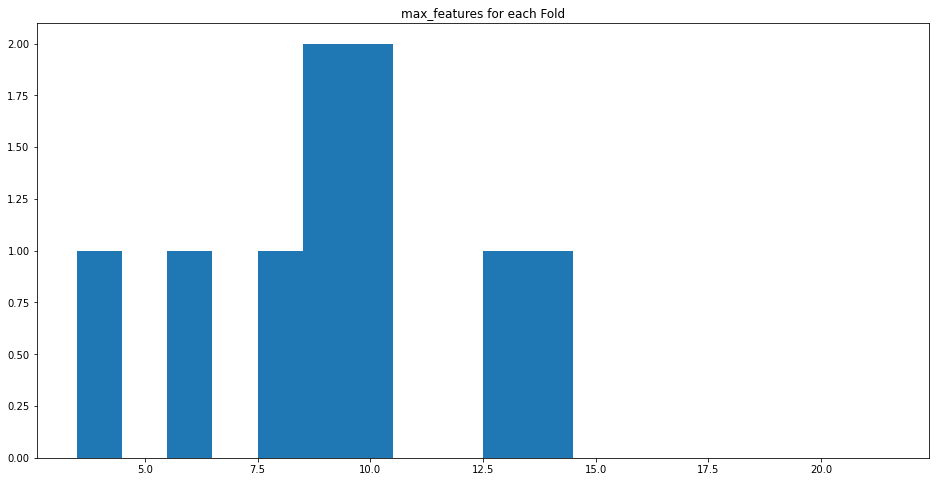

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

Looks like TPU is too difficult.

The 2-layer Architecture is also difficult.

Accuracy (test)= 0.7879+-0.0237
Acuracy (train)= 0.7879+-0.0001
R^2 (test)= 0.3204+-0.057
R^2 (train)= 0.3433+-0.007
Sensitivity (test) = 0.8029+-0.034
Sensitivity (train) = 0.8029+-0.002
Specificity (test) = 0.775+-0.033
Specificity (train) = 0.775+-0.0019
AUC = 0.8314


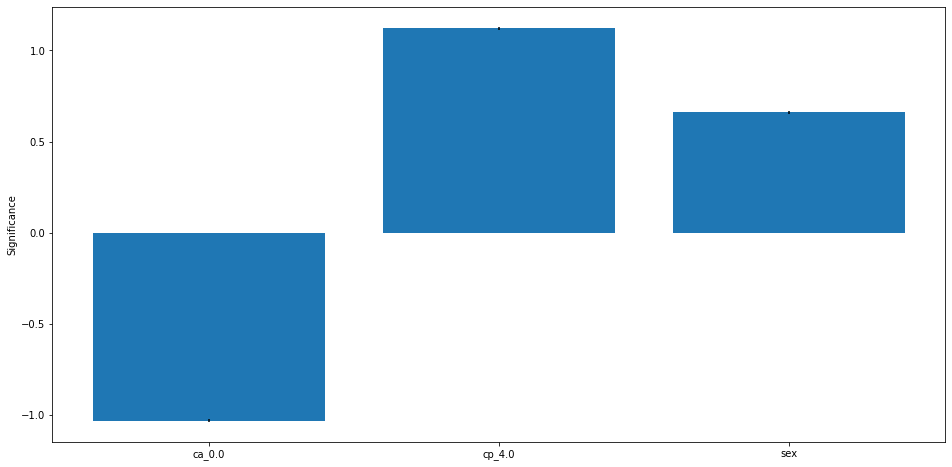

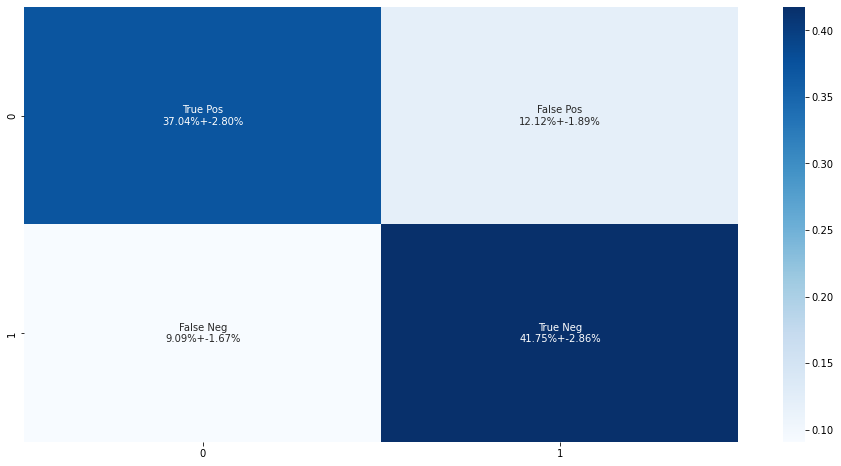

In [ ]:
loading_scores(X_encoded,y,True,features1=['ca_0.0','cp_4.0','sex'],estimator=logistic_estimator,edge=0.5);

Even though all models use these three Features, you actually can't use them to make a model.

  0%|          | 0/297 [00:00<?, ?it/s]

3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1.0, [297]
Length 2
{frozenset({'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1.0, [297]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8282828282828283
AUC = 0.881706204379562
"Fraying":1.0, [297]
Altogether:
Accuracy = 0.8282828282828283
AU

thal_3.0       1.0
ca_0.0         1.0
cp_4.0         1.0
thal_7.0       0.0
cp_3.0         0.0
sex            0.0
trestbps       0.0
chol           0.0
fbs            0.0
thalach        0.0
exang          0.0
oldpeak        0.0
cp_1.0         0.0
cp_2.0         0.0
restecg_0.0    0.0
thal_6.0       0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_1.0      0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

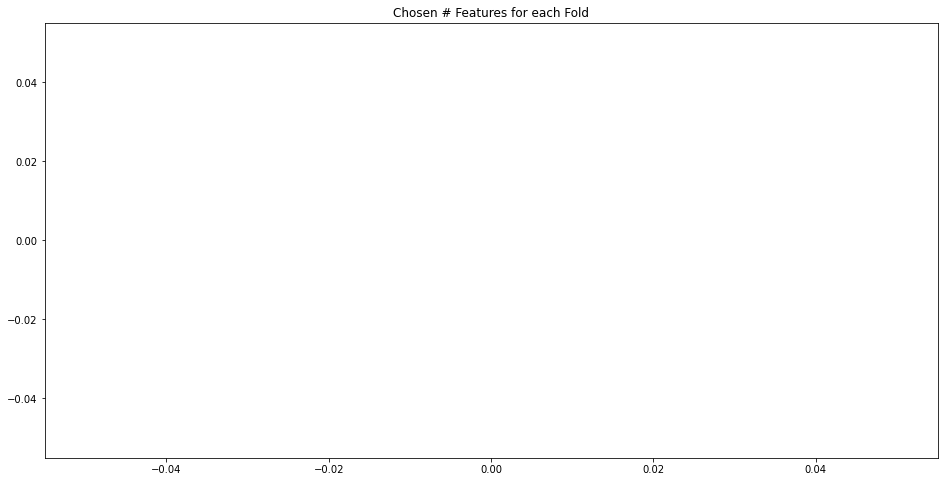

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',target_features=3,metric='auc',intermediate_n=True,usage_map=True,size_test = 1,size_gridsearch_test=1)

            0
0    0.307316
1    0.744805
2    0.957216
3    0.054609
4    0.054609
..        ...
297  0.739635
298  0.286092
299  0.957216
300  0.957216
301  0.293600

[297 rows x 1 columns]
Accuracy (test)= 0.8485+-0.0208
Acuracy (train)= 0.8485+-0.0001
R^2 (test)= 0.4089+-0.0583
R^2 (train)= 0.4281+-0.0062
Sensitivity (test) = 0.7956+-0.0345
Sensitivity (train) = 0.7956+-0.002
Specificity (test) = 0.8938+-0.0244
Specificity (train) = 0.8938+-0.0014
AUC = 0.8475


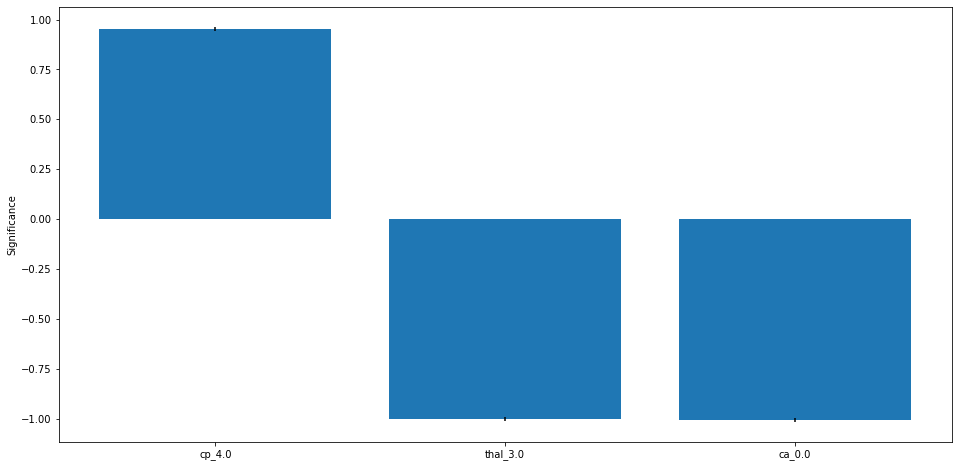

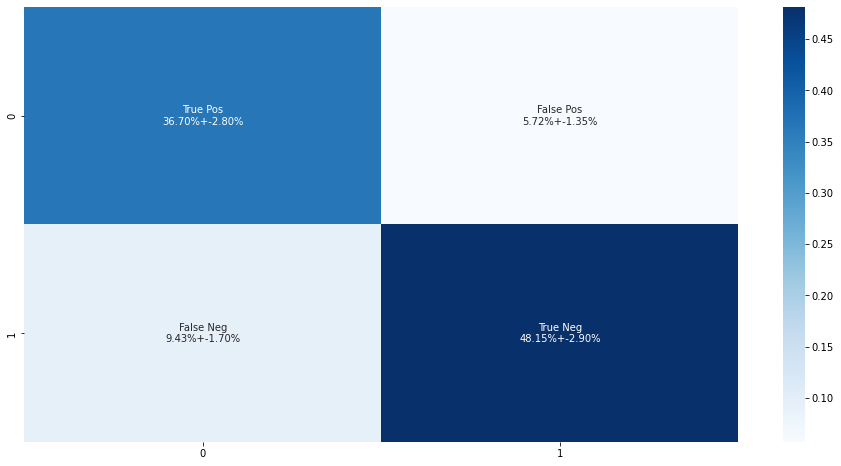

In [ ]:
_,results = loading_scores(X_encoded,y,True,features1=['cp_4.0', 'thal_3.0', 'ca_0.0'],estimator=logistic_estimator,edge=0.5);

why is the AUC here different?

accuracy is also a bit different.

  0%|          | 0/297 [00:00<?, ?it/s]

3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1.0, [297]
Length 2
{frozenset({'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1.0, [297]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8282828282828283
AUC = 0.881706204379562
"Fraying":1.0, [297]
0      0.413959
1      0.868385
2      0.977

thal_3.0       1.0
ca_0.0         1.0
cp_4.0         1.0
thal_7.0       0.0
cp_3.0         0.0
sex            0.0
trestbps       0.0
chol           0.0
fbs            0.0
thalach        0.0
exang          0.0
oldpeak        0.0
cp_1.0         0.0
cp_2.0         0.0
restecg_0.0    0.0
thal_6.0       0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_1.0      0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

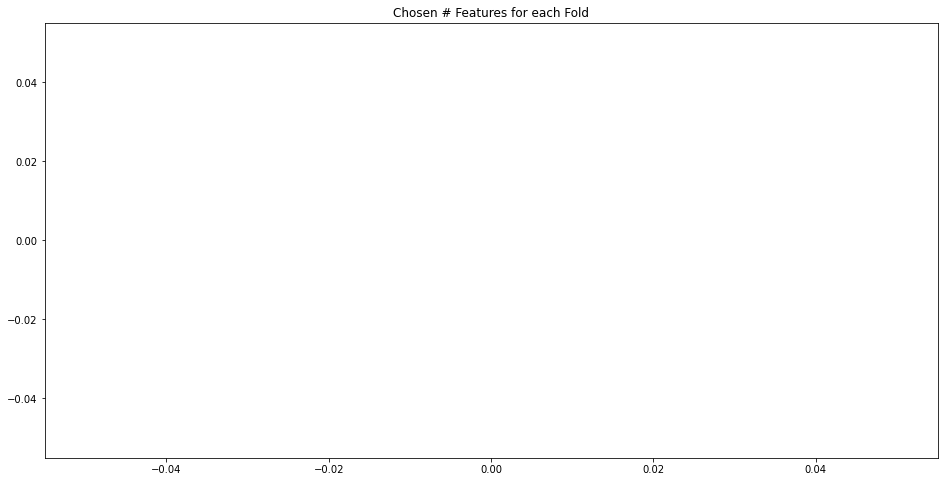

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',target_features=3,metric='auc',intermediate_n=True,usage_map=True,size_test = 1)

The numbers are actually different.

  0%|          | 0/297 [00:00<?, ?it/s]

3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.5793795620437956
"Fraying":1.0, [297]
Length 2
{frozenset({'thal_3.0', 'ca_0.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1.0, [297]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1.0, [297]
0      0.300756
1      0.752907
2      0.96

thal_3.0       1.0
ca_0.0         1.0
cp_4.0         1.0
thal_7.0       0.0
cp_3.0         0.0
sex            0.0
trestbps       0.0
chol           0.0
fbs            0.0
thalach        0.0
exang          0.0
oldpeak        0.0
cp_1.0         0.0
cp_2.0         0.0
restecg_0.0    0.0
thal_6.0       0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_1.0      0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

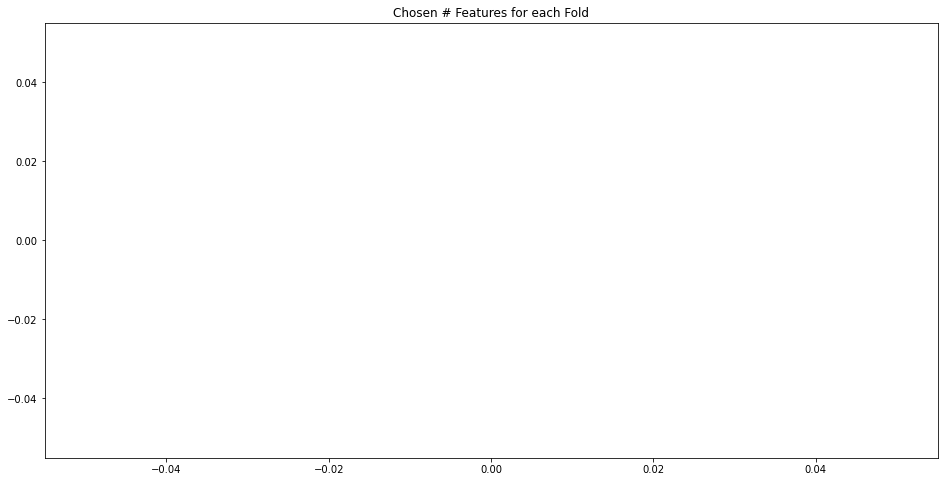

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='forward_selection',target_features=3,metric='auc',intermediate_n=True,usage_map=True,size_test = 1)

It's because of the backward_selection.

The backward_selection didn't update the metrics, only the Features. It won't change anything except the metrics.

This is the last thing I'm going to do today.

  0%|          | 0/297 [00:00<?, ?it/s]

3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.5793795620437956
"Fraying":1.0, [297]
Length 2
{frozenset({'thal_3.0', 'ca_0.0'})}
Accuracy = 0.6801346801346801
AUC = 0.7748175182481751
"Fraying":1.0, [297]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8475364963503651
"Fraying":1.0, [297]
Altogether:
Accuracy = 0.8484848484848485
A

thal_3.0       1.0
ca_0.0         1.0
cp_4.0         1.0
thal_7.0       0.0
cp_3.0         0.0
sex            0.0
trestbps       0.0
chol           0.0
fbs            0.0
thalach        0.0
exang          0.0
oldpeak        0.0
cp_1.0         0.0
cp_2.0         0.0
restecg_0.0    0.0
thal_6.0       0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_1.0      0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

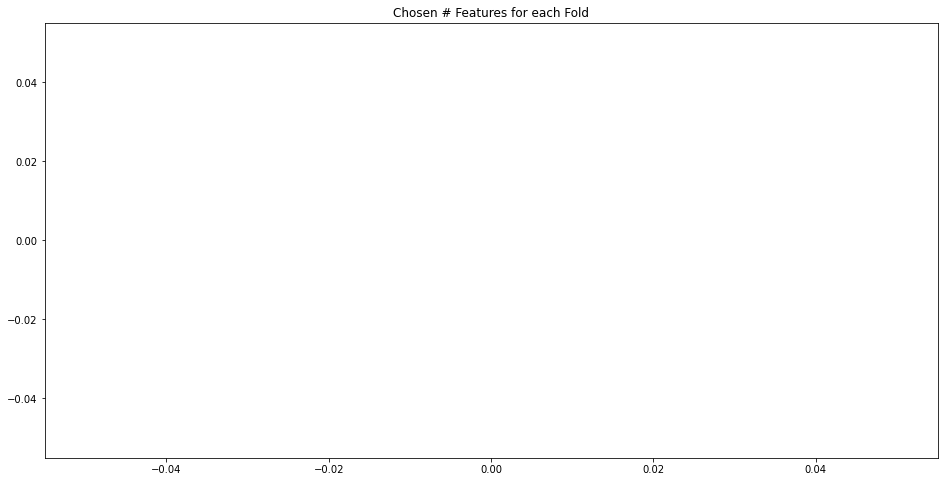

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',target_features=3,metric='auc',intermediate_n=True,usage_map=True,size_test = 1)

The two are the same now.

The bootstrap at the end makes it a bit different. That's good, too.

  0%|          | 0/297 [00:00<?, ?it/s]

25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
25
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.5793795620437956
"Fraying":1.0, [297

thal_7.0       1.0
cp_4.0         1.0
sex            1.0
trestbps       1.0
chol           1.0
fbs            1.0
thalach        1.0
exang          1.0
oldpeak        1.0
cp_1.0         1.0
cp_2.0         1.0
cp_3.0         1.0
restecg_0.0    1.0
thal_6.0       1.0
restecg_1.0    1.0
restecg_2.0    1.0
slope_1.0      1.0
slope_2.0      1.0
slope_3.0      1.0
ca_0.0         1.0
ca_1.0         1.0
ca_2.0         1.0
ca_3.0         1.0
thal_3.0       1.0
age            1.0
dtype: float64

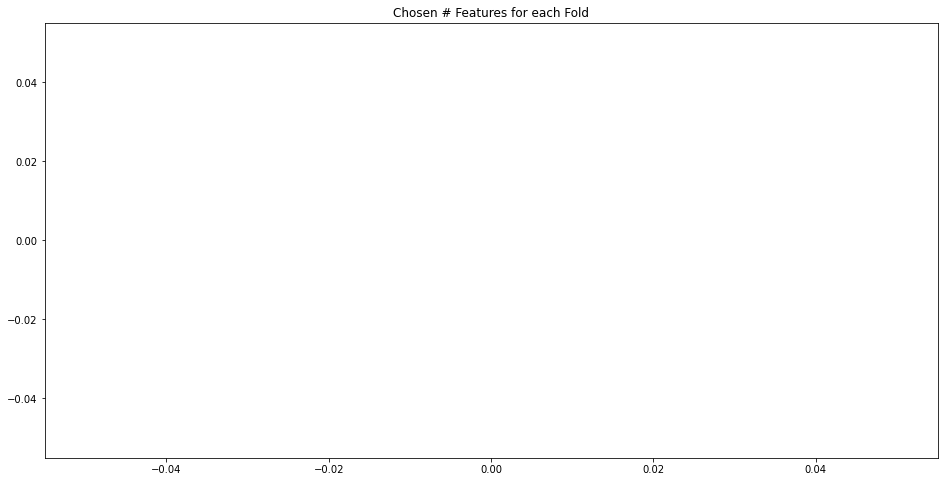

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',target_features=25,metric='auc',intermediate_n=True,usage_map=True,size_test = 1)

With the error on AUC 0.02, we know that between 4 and 25 features are good. Also we can use the 'trend' to know that you need 5 (because it is still going up for 5 Features).

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

15


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

18


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11
Length 1
Accuracy = 0.7542087542087542
AUC = 0.6223083941605839
"Fraying":0.9666762424590635, [1, 58]
Length 2
Accuracy = 0.7003367003367004
AUC = 0.7701642335766424
"Fraying":0.8718758977305372, [55, 3, 1]
Length 3
{frozenset({'thal_3.0', 'ca_0.0', 'cp_4.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8434306569343066
"Fraying":1.0, [59]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8878649635036496
"Fraying":0.7414536052858374, [9, 50]
Length 5
Accuracy = 0.8316498316498316
AUC = 0.8999315693430656
"Fraying":0.7328353921286986, [1, 1, 7, 50]
Length 6
Accuracy = 0.8383838383838383
AUC = 0.8989279197080292
"Fraying":0.6018385521401897, [4, 45, 1, 2, 7]
Length 7
Accuracy = 0.8249158249158249
AUC = 0.8916742700729927
"Fraying":0.26975007181844296, [1, 3, 1, 1, 1, 6, 2, 16, 1, 25, 2]
Length 8
Accuracy = 0.8316498316498316
AUC = 0.8952098540145986
"Fraying":0.2869864981327205, [1, 1, 1, 26, 7, 1, 2, 1, 3, 16]
Length 9
Accuracy = 0.835016835016835
AUC = 0.9026003649635037
"Fraying":0.423154

sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
oldpeak        0.983051
cp_2.0         0.966102
thalach        0.915254
thal_3.0       0.881356
thal_6.0       0.864407
slope_1.0      0.847458
slope_2.0      0.186441
restecg_0.0    0.152542
thal_7.0       0.135593
exang          0.101695
restecg_2.0    0.067797
ca_1.0         0.033898
fbs            0.033898
ca_2.0         0.033898
cp_3.0         0.016949
cp_1.0         0.016949
chol           0.016949
restecg_1.0    0.000000
slope_3.0      0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

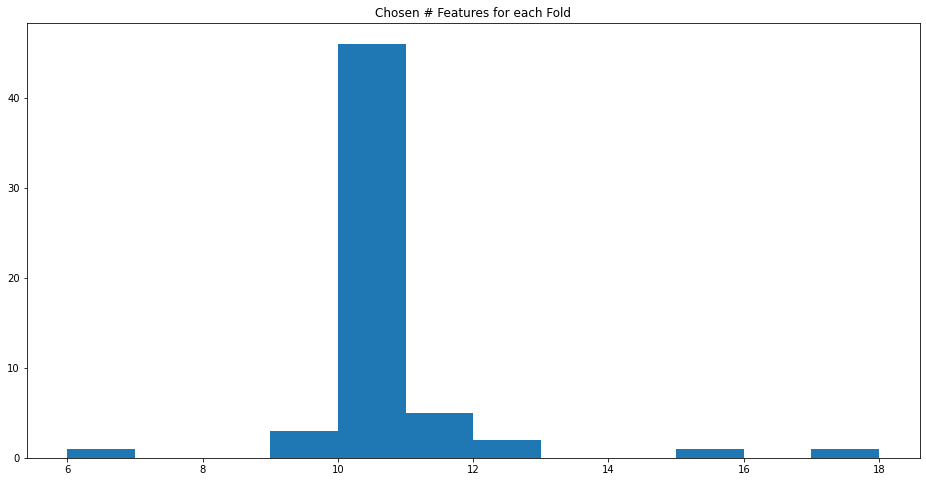

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

11


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

9


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

14


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

12


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

24


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

6


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

25


  0%|          | 0/58 [00:00<?, ?it/s]

6
Length 1
Accuracy = 0.7441077441077442
AUC = 0.6151916058394161
"Fraying":0.9345015800057455, [2, 57]
Length 2
Accuracy = 0.6868686868686869
AUC = 0.7664461678832117
"Fraying":0.8718758977305372, [55, 3, 1]
Length 3
{frozenset({'thal_3.0', 'ca_0.0', 'cp_4.0'})}
Accuracy = 0.8484848484848485
AUC = 0.850661496350365
"Fraying":1.0, [59]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8847399635036498
"Fraying":0.8172938810686584, [6, 53]
Length 5
Accuracy = 0.8451178451178452
AUC = 0.8952326642335766
"Fraying":0.7810973858086757, [52, 1, 1, 3, 2]
Length 6
Accuracy = 0.8417508417508418
AUC = 0.9054288321167883
"Fraying":0.7000861821315714, [49, 1, 1, 3, 5]
Length 7
Accuracy = 0.8451178451178452
AUC = 0.9008667883211678
"Fraying":0.4530307382935938, [1, 1, 2, 14, 1, 2, 1, 37]
Length 8
Accuracy = 0.8316498316498316
AUC = 0.8942062043795621
"Fraying":0.2783682849755818, [1, 4, 1, 1, 1, 29, 3, 4, 3, 1, 3, 8]
Length 9
Accuracy = 0.8451178451178452
AUC = 0.9016879562043795
"Fraying":0.474288997

sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
oldpeak        0.932203
slope_1.0      0.932203
thal_3.0       0.915254
thalach        0.898305
cp_2.0         0.898305
thal_6.0       0.864407
thal_7.0       0.118644
restecg_0.0    0.118644
slope_2.0      0.118644
restecg_2.0    0.084746
cp_3.0         0.050847
cp_1.0         0.050847
exang          0.050847
fbs            0.050847
ca_2.0         0.050847
restecg_1.0    0.033898
slope_3.0      0.033898
ca_1.0         0.033898
chol           0.033898
ca_3.0         0.033898
age            0.033898
dtype: float64

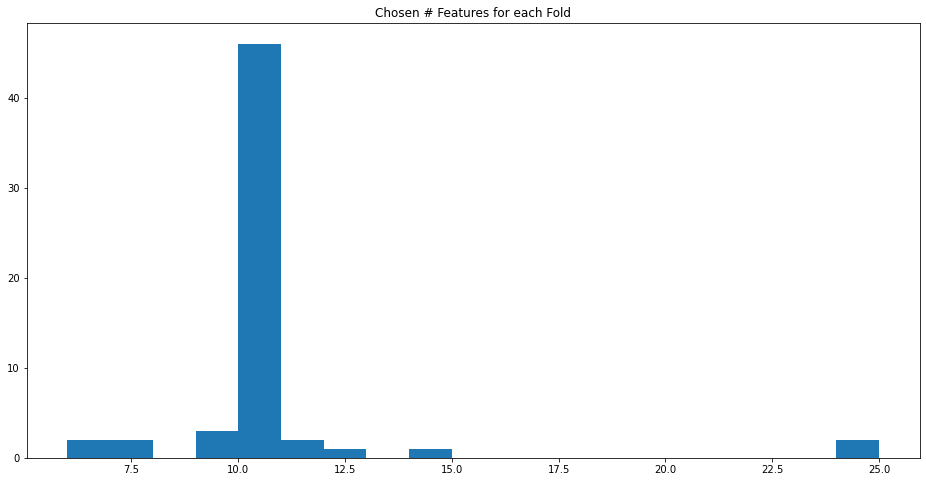

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5)

much better now

# best up to now

  0%|          | 0/74 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

11


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

9


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

6


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

9


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

9


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

11


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

9


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

8


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

9


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

11


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

7


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

6


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10


  0%|          | 0/98 [00:00<?, ?it/s]

10
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.6099908759124086
"Fraying":1.0, [74]
Length 2
Accuracy = 0.6767676767676768
AUC = 0.7543567518248174
"Fraying":0.8962746530314097, [2, 70, 2]
Length 3
{frozenset({'cp_4.0', 'thal_3.0', 'ca_0.0'})}
Accuracy = 0.8484848484848485
AUC = 0.8422445255474452
"Fraying":1.0, [74]
Length 4
Accuracy = 0.835016835016835
AUC = 0.8886177007299272
"Fraying":0.710372534696859, [13, 61]
Length 5
Accuracy = 0.8282828282828283
AUC = 0.898448905109489
"Fraying":0.710372534696859, [61, 13]
Length 6
Accuracy = 0.835016835016835
AUC = 0.9041058394160585
"Fraying":0.6059167275383491, [3, 2, 56, 13]
Length 7
Accuracy = 0.835016835016835
AUC = 0.8970346715328467
"Fraying":0.3089846603360117, [34, 6, 21, 1, 2, 7, 1, 2]
Length 8
Accuracy = 0.8451178451178452
AUC = 0.8980383211678832
"Fraying":0.21402483564645727, [28, 1, 1, 1, 15, 2, 1, 10, 2, 4, 5, 3, 1]
Length 9
Accuracy = 0.8484848484848485
AUC = 0.9081204379562043
"Fraying":0.38641344

sex            1.000000
trestbps       1.000000
ca_0.0         1.000000
cp_4.0         1.000000
oldpeak        0.972973
cp_2.0         0.959459
thalach        0.878378
thal_3.0       0.810811
slope_1.0      0.810811
thal_6.0       0.770270
thal_7.0       0.189189
slope_2.0      0.189189
restecg_0.0    0.121622
restecg_2.0    0.054054
exang          0.013514
fbs            0.013514
ca_2.0         0.013514
restecg_1.0    0.000000
cp_3.0         0.000000
cp_1.0         0.000000
slope_3.0      0.000000
ca_1.0         0.000000
chol           0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

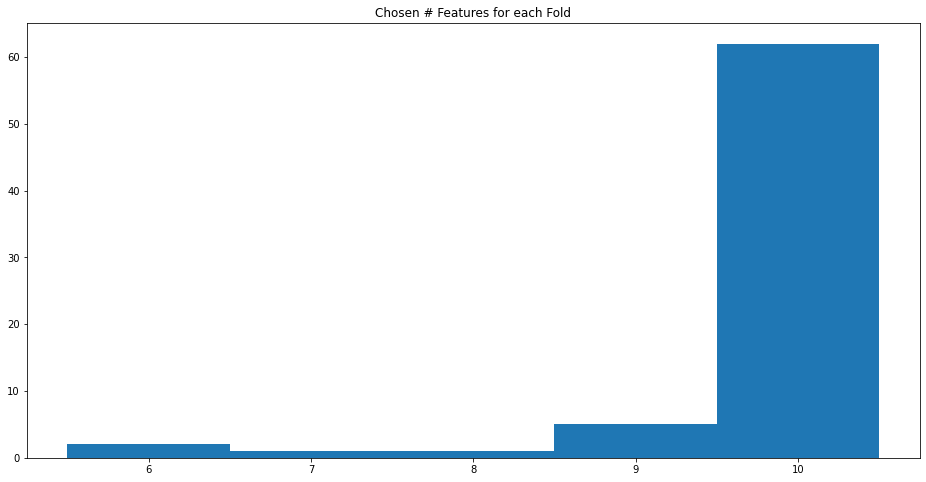

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 4,size_gridsearch_test=3)

#continue

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

10


  0%|          | 0/9 [00:00<?, ?it/s]

9


  0%|          | 0/9 [00:00<?, ?it/s]

7


  0%|          | 0/9 [00:00<?, ?it/s]

5


  0%|          | 0/9 [00:00<?, ?it/s]

8


  0%|          | 0/9 [00:00<?, ?it/s]

6


  0%|          | 0/9 [00:00<?, ?it/s]

3


  0%|          | 0/9 [00:00<?, ?it/s]

4


  0%|          | 0/9 [00:00<?, ?it/s]

4


  0%|          | 0/9 [00:00<?, ?it/s]

3
Length 1
Accuracy = 0.7037037037037037
AUC = 0.6861770072992701
"Fraying":0.52, [1, 1, 7, 1]
Length 2
Accuracy = 0.6936026936026936
AUC = 0.7922217153284672
"Fraying":0.54, [1, 2, 7]
Length 3
Accuracy = 0.835016835016835
AUC = 0.8660812043795622
"Fraying":0.66, [1, 8, 1]
Length 4
Accuracy = 0.8316498316498316
AUC = 0.8971487226277373
"Fraying":0.45999999999999996, [1, 6, 3]
Length 5
Accuracy = 0.8417508417508418
AUC = 0.9019160583941606
"Fraying":0.42, [1, 1, 2, 6]
Length 6
Accuracy = 0.8282828282828283
AUC = 0.9034671532846715
"Fraying":0.30000000000000004, [1, 1, 1, 5, 1, 1]
Length 7
Accuracy = 0.8417508417508418
AUC = 0.902463503649635
"Fraying":0.12000000000000001, [1, 1, 1, 1, 1, 1, 1, 2, 1]
Length 8
Accuracy = 0.8451178451178452
AUC = 0.9051094890510949
"Fraying":0.16, [1, 1, 1, 1, 3, 1, 1, 1]
Length 9
Accuracy = 0.8518518518518519
AUC = 0.9128877737226277
"Fraying":0.22000000000000006, [4, 1, 1, 1, 1, 1, 1]
Length 10
Accuracy = 0.8518518518518519
AUC = 0.9174726277372264
"Fray

ca_0.0         1.0
cp_4.0         1.0
thal_3.0       0.9
oldpeak        0.5
sex            0.5
slope_1.0      0.5
trestbps       0.4
thalach        0.4
thal_6.0       0.2
cp_2.0         0.2
thal_7.0       0.1
ca_1.0         0.1
slope_2.0      0.1
chol           0.0
fbs            0.0
exang          0.0
restecg_0.0    0.0
cp_1.0         0.0
cp_3.0         0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_3.0      0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

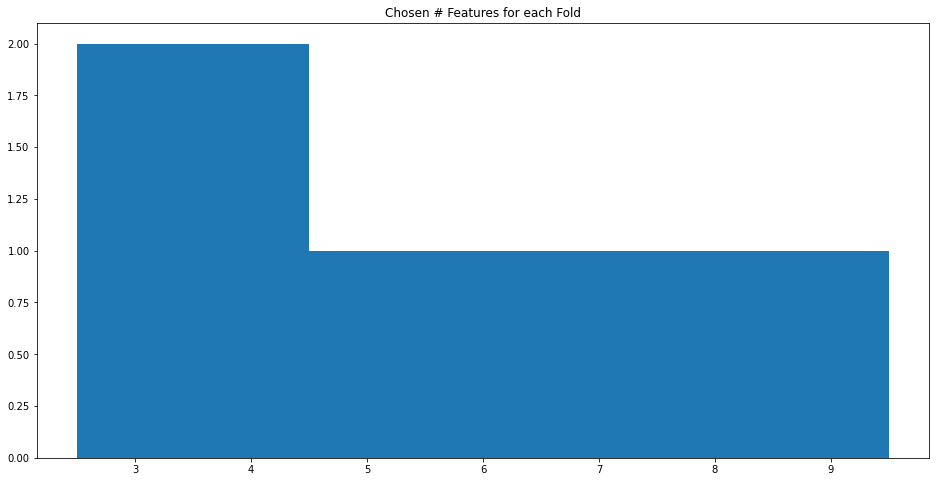

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30,gridsearch_metric = 'accuracy')

maybe we should use fraying, not AUC.

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

11


  0%|          | 0/9 [00:00<?, ?it/s]

12


  0%|          | 0/9 [00:00<?, ?it/s]

12


  0%|          | 0/9 [00:00<?, ?it/s]

11


  0%|          | 0/9 [00:00<?, ?it/s]

12


  0%|          | 0/9 [00:00<?, ?it/s]

11


  0%|          | 0/9 [00:00<?, ?it/s]

10


  0%|          | 0/9 [00:00<?, ?it/s]

11


  0%|          | 0/9 [00:00<?, ?it/s]

12


  0%|          | 0/9 [00:00<?, ?it/s]

13
Length 1
Accuracy = 0.7003367003367004
AUC = 0.6460310218978103
"Fraying":0.54, [1, 7, 2]
"Binomial Fraying":13.5
Length 2
Accuracy = 0.6734006734006734
AUC = 0.7598312043795621
"Fraying":0.34, [2, 2, 5, 1]
"Binomial Fraying":102.00000000000001
Length 3
Accuracy = 0.835016835016835
AUC = 0.8566377737226278
"Fraying":0.8200000000000001, [1, 9]
"Binomial Fraying":1886.0000000000002
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8960766423357664
"Fraying":0.68, [8, 2]
"Binomial Fraying":8602.0
Length 5
Accuracy = 0.8148148148148148
AUC = 0.8949817518248175
"Fraying":0.42, [1, 1, 6, 2]
"Binomial Fraying":22314.6
Length 6
Accuracy = 0.8282828282828283
AUC = 0.9008895985401459
"Fraying":0.24000000000000002, [2, 1, 1, 4, 1, 1]
"Binomial Fraying":42504.0
Length 7
Accuracy = 0.8114478114478114
AUC = 0.9001824817518248
"Fraying":0.18, [1, 1, 1, 2, 1, 1, 3]
"Binomial Fraying":86526.0
Length 8
Accuracy = 0.8249158249158249
AUC = 0.8960994525547445
"Fraying":0.18000000000000002, [1, 1, 1, 1, 1, 

sex            1.0
trestbps       1.0
ca_0.0         1.0
cp_4.0         1.0
oldpeak        0.9
thal_3.0       0.9
thalach        0.9
thal_6.0       0.9
slope_1.0      0.8
cp_2.0         0.8
ca_1.0         0.3
chol           0.3
slope_2.0      0.3
exang          0.3
restecg_0.0    0.2
fbs            0.2
thal_7.0       0.1
cp_1.0         0.1
cp_3.0         0.1
restecg_2.0    0.1
ca_2.0         0.1
ca_3.0         0.1
age            0.1
restecg_1.0    0.0
slope_3.0      0.0
dtype: float64

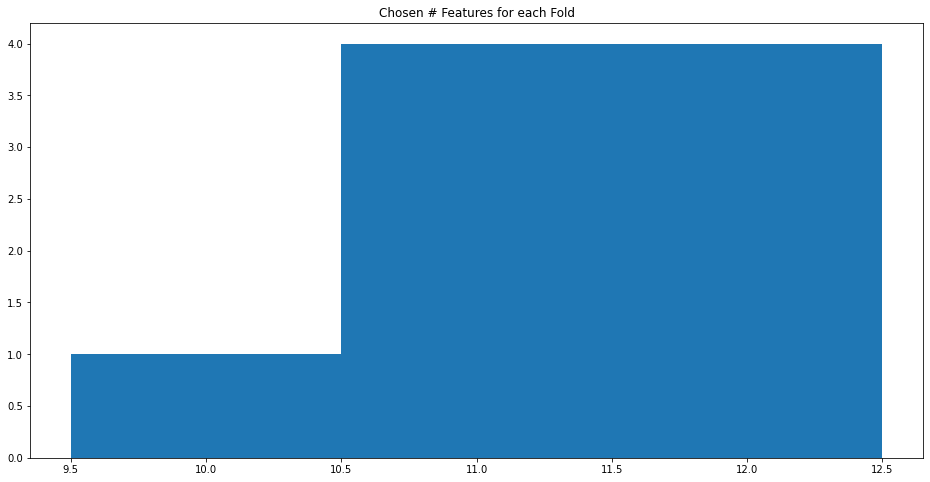

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30,gridsearch_metric = 'binomial_fraying')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

25


  0%|          | 0/9 [00:00<?, ?it/s]

16


  0%|          | 0/9 [00:00<?, ?it/s]

6


  0%|          | 0/9 [00:00<?, ?it/s]

25


  0%|          | 0/9 [00:00<?, ?it/s]

25


  0%|          | 0/9 [00:00<?, ?it/s]

8


  0%|          | 0/9 [00:00<?, ?it/s]

12


  0%|          | 0/9 [00:00<?, ?it/s]

13


  0%|          | 0/9 [00:00<?, ?it/s]

6


  0%|          | 0/9 [00:00<?, ?it/s]

16
Length 1
Accuracy = 0.7306397306397306
AUC = 0.6766423357664233
"Fraying":0.68, [8, 2]
"Binomial Fraying":17.0
Length 2
Accuracy = 0.6936026936026936
AUC = 0.7862910583941606
"Fraying":0.52, [1, 1, 7, 1]
"Binomial Fraying":156.0
Length 3
Accuracy = 0.8215488215488216
AUC = 0.8639826642335766
"Fraying":0.68, [2, 8]
"Binomial Fraying":1564.0
Length 4
Accuracy = 0.835016835016835
AUC = 0.8976505474452555
"Fraying":0.52, [6, 4]
"Binomial Fraying":6578.0
Length 5
Accuracy = 0.8383838383838383
AUC = 0.8989735401459854
"Fraying":0.3, [1, 3, 4, 2]
"Binomial Fraying":15939.0
Length 6
Accuracy = 0.8383838383838383
AUC = 0.8962363138686131
"Fraying":0.2, [1, 3, 2, 1, 2, 1]
"Binomial Fraying":35420.0
Length 7
Accuracy = 0.8282828282828283
AUC = 0.8965100364963505
"Fraying":0.24, [1, 1, 3, 2, 3]
"Binomial Fraying":115368.0
Length 8
Accuracy = 0.8282828282828283
AUC = 0.8958941605839417
"Fraying":0.16, [1, 1, 2, 2, 1, 1, 2]
"Binomial Fraying":173052.0
Length 9
Accuracy = 0.8282828282828283
AUC = 

thal_3.0       1.0
sex            1.0
ca_0.0         1.0
cp_4.0         1.0
oldpeak        0.9
cp_2.0         0.8
slope_2.0      0.8
thalach        0.8
trestbps       0.7
thal_6.0       0.7
restecg_0.0    0.6
slope_1.0      0.6
exang          0.6
chol           0.5
fbs            0.5
age            0.5
ca_1.0         0.5
ca_2.0         0.4
ca_3.0         0.4
thal_7.0       0.4
cp_1.0         0.3
cp_3.0         0.3
restecg_1.0    0.3
restecg_2.0    0.3
slope_3.0      0.3
dtype: float64

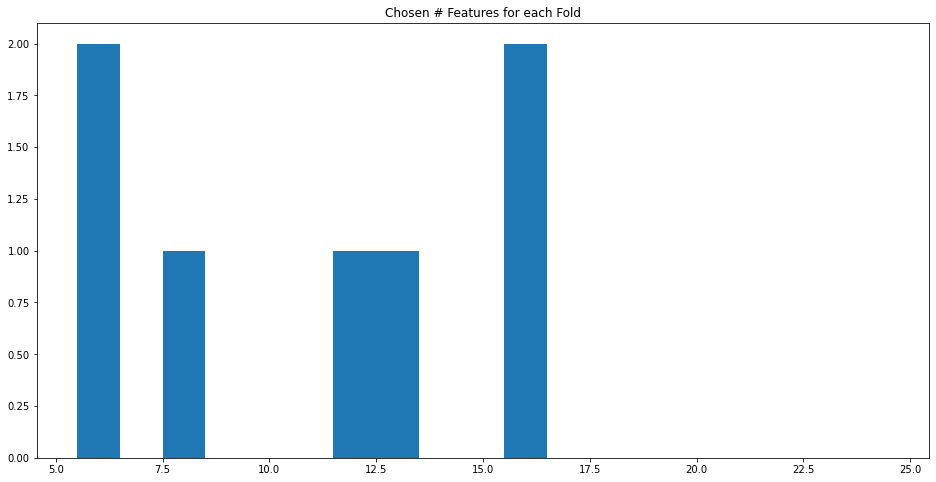

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30,gridsearch_metric = 'auc')

Binomial Fraying could be a lot better than auc.

but we had to change it to be Fraying only because it always chose 12 or 13.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=30,gridsearch_metric = 'binomial_fraying')

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

10


  0%|          | 0/10 [00:00<?, ?it/s]

8


  0%|          | 0/10 [00:00<?, ?it/s]

7


  0%|          | 0/10 [00:00<?, ?it/s]

10


  0%|          | 0/10 [00:00<?, ?it/s]

9


  0%|          | 0/10 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,gridsearch_metric = 'binomial_fraying')

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

10


  0%|          | 0/58 [00:00<?, ?it/s]

8


  0%|          | 0/58 [00:00<?, ?it/s]

7


  0%|          | 0/58 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

if we use fraying alone, we get 7 or 8 too often.

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

9


  0%|          | 0/284 [00:00<?, ?it/s]

7


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

8


  0%|          | 0/284 [00:00<?, ?it/s]

11


  0%|          | 0/284 [00:00<?, ?it/s]

14


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

7


  0%|          | 0/284 [00:00<?, ?it/s]

5


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

8


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

13


  0%|          | 0/284 [00:00<?, ?it/s]

7


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/284 [00:00<?, ?it/s]

10


  0%|          | 0/285 [00:00<?, ?it/s]

10


  0%|          | 0/285 [00:00<?, ?it/s]

10
Length 1
{frozenset({'thal_3.0'})}
Accuracy = 0.7643097643097643
AUC = 0.691309306569343
"Fraying":1.0, [23]
Length 2
Accuracy = 0.6936026936026936
AUC = 0.7789917883211679
"Fraying":0.6446124763705103, [1, 18, 4]
Length 3
Accuracy = 0.835016835016835
AUC = 0.8489507299270074
"Fraying":0.8374291115311909, [1, 1, 21]
Length 4
Accuracy = 0.8282828282828283
AUC = 0.8843750000000001
"Fraying":0.553875236294896, [1, 6, 16]
Length 5
Accuracy = 0.8114478114478114
AUC = 0.8909671532846716
"Fraying":0.4026465028355388, [14, 1, 3, 1, 1, 2, 1]
Length 6
Accuracy = 0.8383838383838383
AUC = 0.900410583941606
"Fraying":0.3610586011342155, [3, 3, 1, 1, 1, 1, 13]
Length 7
Accuracy = 0.8484848484848485
AUC = 0.8905565693430656
"Fraying":0.17202268431001888, [1, 2, 1, 1, 3, 2, 8, 1, 1, 1, 2]
Length 8
Accuracy = 0.8417508417508418
AUC = 0.8972171532846716
"Fraying":0.20604914933837423, [1, 1, 1, 1, 3, 3, 9, 1, 1, 2]
Length 9
Accuracy = 0.8451178451178452
AUC = 0.8981751824817518
"Fraying":0.18714555765

cp_4.0         1.000000
sex            1.000000
ca_0.0         1.000000
oldpeak        0.913043
thal_3.0       0.869565
trestbps       0.869565
cp_2.0         0.869565
thalach        0.739130
slope_1.0      0.739130
thal_6.0       0.652174
slope_2.0      0.260870
thal_7.0       0.173913
exang          0.130435
restecg_0.0    0.130435
restecg_2.0    0.086957
ca_1.0         0.043478
fbs            0.043478
cp_3.0         0.000000
restecg_1.0    0.000000
cp_1.0         0.000000
slope_3.0      0.000000
chol           0.000000
ca_2.0         0.000000
ca_3.0         0.000000
age            0.000000
dtype: float64

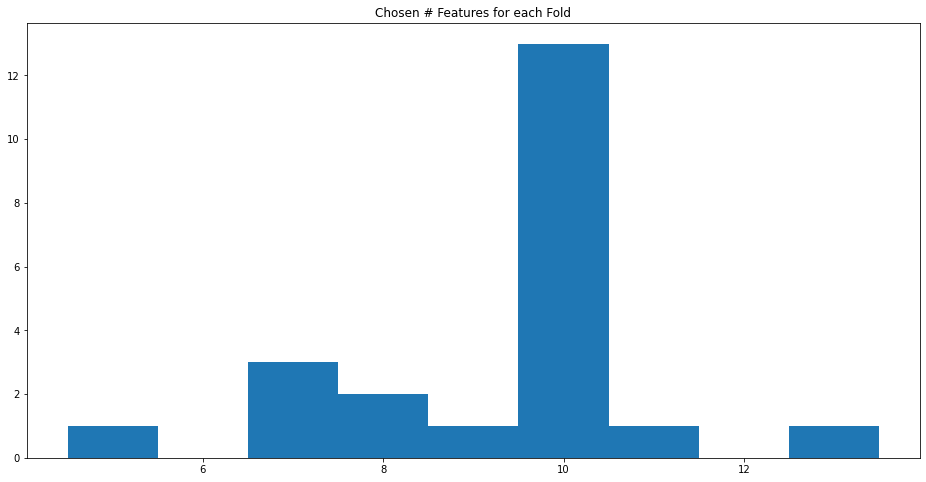

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 13,size_gridsearch_test=1)

So it doesn't make sense to have more votes. You need a bigger 'training set', it doesn't matter which way.

for the fourth Feature, we should use (A or B) so that we keep 'fraying' = 1. This can be done inside A_train.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'slope_1.0', 'oldpeak'})], 5: [frozenset({'slope_1.0', 'sex'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_1.0', 'oldpeak'}), frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'cp_2.0', 'sex'}), frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'ca_1.0', 'sex'})], 7: [frozenset({'sex', 'trestbps'}), frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'ca_1.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: [], 10: [frozenset({'restecg_2.0', 'cp_2.0'}), frozenset({'thalach', 'ca_1.0'}), frozenset({'trestbps', 'restecg_0.0'})], 11: [frozenset({'thalach', 'restecg_0.0'}), frozenset({'thalach', 'cp_1.0'}), frozenset({'thalach', 'exang'}), frozenset({'cp_1.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'exang'}), frozenset({'cp_1.0', 'exang'})], 12: [], 13: [frozenset({'ca_2.0', 'exang'}), frozenset({'fbs', 'restecg_0.0'})], 14: [], 15: [], 16: [], 17: [], 18: [], 19: []

  0%|          | 0/9 [00:00<?, ?it/s]

{1: [], 2: [], 3: [frozenset({'cp_4.0', 'thal_3.0'}), frozenset({'cp_4.0', 'oldpeak'})], 4: [], 5: [frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'restecg_0.0', 'trestbps'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'restecg_2.0', 'trestbps'}), frozenset({'restecg_2.0', 'cp_2.0'}), frozenset({'trestbps', 'cp_2.0'})], 6: [frozenset({'sex', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'trestbps'})], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 25: []}
17


  0%|          | 0/9 [00:00<?, ?it/s]

{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'cp_4.0', 'ca_0.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 'oldpeak'}), frozenset({'slope_1.0', 'oldpeak'})], 5: [frozenset({'sex', 'cp_3.0'}), frozenset({'sex', 'trestbps'}), frozenset({'sex', 'slope_2.0'}), frozenset({'trestbps', 'cp_3.0'})], 6: [], 7: [frozenset({'trestbps', 'chol'}), frozenset({'fbs', 'ca_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'ca_2.0', 'cp_2.0'})], 8: [], 9: [frozenset({'chol', 'thal_6.0'})], 10: [frozenset({'ca_2.0', 'chol'}), frozenset({'ca_3.0', 'thal_6.0'})], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 25: []}
10


  0%|          | 0/9 [00:00<?, ?it/s]

{1: [], 2: [], 3: [], 4: [frozenset({'thalach', 'slope_1.0'}), frozenset({'slope_1.0', 'oldpeak'}), frozenset({'slope_1.0', 'exang'}), frozenset({'thalach', 'oldpeak'}), frozenset({'thalach', 'exang'}), frozenset({'oldpeak', 'exang'})], 5: [frozenset({'slope_1.0', 'oldpeak'}), frozenset({'sex', 'slope_1.0'}), frozenset({'exang', 'slope_1.0'}), frozenset({'trestbps', 'slope_1.0'}), frozenset({'sex', 'oldpeak'}), frozenset({'thalach', 'sex'}), frozenset({'thalach', 'restecg_0.0'}), frozenset({'exang', 'oldpeak'}), frozenset({'trestbps', 'oldpeak'}), frozenset({'exang', 'sex'}), frozenset({'sex', 'trestbps'}), frozenset({'restecg_0.0', 'sex'}), frozenset({'trestbps', 'exang'})], 6: [frozenset({'thalach', 'slope_2.0'}), frozenset({'slope_1.0', 'oldpeak'}), frozenset({'sex', 'trestbps'})], 7: [], 8: [frozenset({'chol', 'thal_6.0'}), frozenset({'cp_2.0', 'exang'})], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 

  0%|          | 0/9 [00:00<?, ?it/s]

{1: [], 2: [], 3: [], 4: [frozenset({'thalach', 'slope_1.0'}), frozenset({'slope_1.0', 'oldpeak'}), frozenset({'slope_1.0', 'exang'}), frozenset({'thalach', 'oldpeak'}), frozenset({'thalach', 'exang'}), frozenset({'oldpeak', 'exang'})], 5: [frozenset({'thalach', 'sex'}), frozenset({'thalach', 'slope_2.0'}), frozenset({'exang', 'oldpeak'}), frozenset({'trestbps', 'oldpeak'}), frozenset({'sex', 'slope_2.0'}), frozenset({'trestbps', 'exang'})], 6: [], 7: [frozenset({'thalach', 'trestbps'}), frozenset({'restecg_2.0', 'trestbps'}), frozenset({'trestbps', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'})], 8: [frozenset({'cp_2.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'restecg_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'trestbps'}), frozenset({'slope_2.0', 'thal_6.0'})], 9: [frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'slope_1.0', 'cp_2.0'}),

  0%|          | 0/9 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 1,size_gridsearch_test=3,no_cv=True)

  0%|          | 0/297 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps

cp_2.0         1.0
thal_3.0       1.0
sex            1.0
trestbps       1.0
ca_0.0         1.0
thalach        1.0
slope_1.0      1.0
oldpeak        1.0
thal_6.0       1.0
cp_4.0         1.0
thal_7.0       0.0
chol           0.0
fbs            0.0
exang          0.0
cp_1.0         0.0
restecg_0.0    0.0
cp_3.0         0.0
restecg_1.0    0.0
restecg_2.0    0.0
slope_2.0      0.0
slope_3.0      0.0
ca_1.0         0.0
ca_2.0         0.0
ca_3.0         0.0
age            0.0
dtype: float64

So we get 2 new Features, {'slope_1.0', 'oldpeak'} and {'slope_2.0', 'slope_1.0'}. Only the second one is Categorical so we add slope_1.0 OR slope_2.0.

The problem is only slope_1.0 or slope_2.0 is really bad and doesn't do anything. It is the last Feature added.

Also, it is the same as slope_3.0 and slope_3.0 is not important.

The best thing to do may be to look at each gen and decide if it had the second Feature later. Even if one did, don't use it (2,3,4,...?)

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 1,size_gridsearch_test=3,no_cv=True)

  0%|          | 0/297 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

frozenset({'ca_0.0', 'thal_3.0', 'oldpeak', 'cp_4.0'})
frozenset({'slope_1.0', 'ca_0.0', 'thal_3.0', 'trestbps', 'sex', 'cp_4.0'})
frozenset({'slope_1.0', 'ca_0.0', 'thal_3.0', 'oldpeak', 'trestbps', 'sex', 'cp_4.0'})
frozenset({'slope_1.0', 'ca_0.0', 'thal_3.0', 'oldpeak', 'trestbps', 'sex', 'cp_4.0'})
frozenset({'slope_1.0', 'ca_0.0', 'thal_3.0', 'trestbps', 'thalach', 'sex', 'cp_4.0'})
frozenset({'slope_1.0', 'ca_0.0', 'thal_3.0', 'oldpeak', 'trestbps', 'sex', 'cp_4.0'})
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1

slope_2.0                 1.0
exang or cp_2.0           1.0
sex                       1.0
trestbps                  1.0
fbs or thal_6.0           1.0
thal_3.0                  1.0
slope_1.0                 1.0
cp_4.0                    1.0
oldpeak                   1.0
ca_0.0                    1.0
thal_6.0 or cp_2.0        0.0
cp_2.0                    0.0
exang                     0.0
cp_1.0                    0.0
thalach                   0.0
fbs                       0.0
chol                      0.0
cp_3.0                    0.0
restecg_2.0               0.0
restecg_0.0               0.0
restecg_1.0               0.0
slope_3.0                 0.0
ca_1.0                    0.0
ca_2.0                    0.0
ca_3.0                    0.0
thal_6.0                  0.0
thal_7.0                  0.0
slope_1.0 or slope_2.0    0.0
fbs or cp_2.0             0.0
age                       0.0
dtype: float64

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

slope_1.0 exang
restecg_0.0 slope_1.0
exang sex
exang restecg_2.0
thal_6.0 restecg_0.0
thal_6.0 cp_2.0
exang thal_6.0
exang cp_1.0
restecg_0.0 cp_2.0
thal_6.0 cp_1.0
restecg_2.0 cp_2.0
restecg_2.0 restecg_0.0
exang thal_7.0
cp_2.0 restecg_0.0
{1: [], 2: [], 3: [], 4: [frozenset({'slope_1.0', 'exang'})], 5: [frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'sex', 'exang'})], 6: [], 7: [], 8: [frozenset({'exang', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_1.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_1.0'})], 9: [], 10: [frozenset({'restecg_2.0', 'cp_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'thal_7.0', 'exang'}), frozenset({'restecg_0.0', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'sex', 'exang'}), frozenset({'thal_6.0', 'cp_1.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}

  0%|          | 0/9 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 exang
sex exang
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'exang', 'slope_2.0'}), frozenset({'sex', 'exang'})], 6: []}
{frozenset({'sex', 'exang'}), frozenset({'exang', 'slope_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or exang', 'exang or slope_2.0', 'ca_0.0 or cp_4.0',
       'sex or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'cp_4.0']
['thal_3.0']
['thal_3.0', 'cp_4.0']
['thal_3.0', 'cp_4.0', 'ca_0.0']
['thal_3.0', 'cp_4.0']
['thal_3.0', 'cp_4.0', 'ca_0.0']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'oldpeak']
['cp_4.0', 'ca_0.0', 't

  0%|          | 0/9 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_1.0 slope_2.0
slope_2.0 sex
thal_6.0 fbs
cp_2.0 fbs
cp_2.0 restecg_0.0
fbs restecg_0.0
ca_2.0 restecg_0.0
cp_2.0 restecg_0.0
fbs exang
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'sex', 'slope_2.0'})], 6: [], 7: [frozenset({'fbs', 'thal_6.0'})], 8: [], 9: [frozenset({'fbs', 'cp_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'fbs', 'restecg_0.0'})], 10: [frozenset({'ca_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'fbs', 'exang'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'ca_2.0', 'restecg_0.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'exang'}), frozenset({'fbs', 'restecg_0.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'reste

  0%|          | 0/9 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
slope_2.0 slope_1.0
slope_2.0 exang
restecg_0.0 slope_1.0
restecg_0.0 exang
slope_1.0 exang
cp_2.0 exang
cp_2.0 thal_6.0
exang thal_6.0
thal_6.0 cp_2.0
ca_3.0 exang
restecg_2.0 restecg_0.0
ca_3.0 restecg_0.0
ca_3.0 ca_1.0
ca_3.0 exang
restecg_0.0 ca_1.0
restecg_0.0 exang
ca_1.0 exang
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'slope_1.0', 'exang'})], 6: [], 7: [frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [], 9: [], 10: [frozenset({'ca_3.0', 'exang'})], 11: [frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'ca_3.0', 'restecg_0.0'}), frozenset({'ca_3.0', 'ca_1.0'}), frozenset({'ca_3.0', 'exang'}), frozenset({'restecg_0.0', 'ca_1.0'}), frozenset({'exang', 'restecg_0.0'}), froze

  0%|          | 0/9 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 cp_3.0
slope_2.0 sex
cp_2.0 ca_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'cp_3.0', 'slope_2.0'}), frozenset({'sex', 'slope_2.0'})], 6: [], 7: [], 8: [], 9: [frozenset({'ca_2.0', 'cp_2.0'})], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: []}
{frozenset({'sex', 'slope_2.0'}), frozenset({'cp_3.0', 'slope_2.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or slope_2.0', 'cp_3.0 or slope_2.0', 'ca_2.0 or cp_2.0',
       'thal_7.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.

  0%|          | 0/9 [00:00<?, ?it/s]

thal_3.0 thal_7.0
thal_3.0 ca_0.0
cp_4.0 ca_0.0
thal_7.0 ca_0.0
cp_4.0 ca_0.0
slope_1.0 slope_2.0
sex cp_3.0
{1: [], 2: [frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_7.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'cp_3.0', 'sex'})], 6: [], 7: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_7.0'}), frozenset({'ca_0.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_7.0 or thal_3.0', 'cp_3.0 or sex',
       'ca_0.0 or cp_

  0%|          | 0/9 [00:00<?, ?it/s]

thal_7.0 thal_3.0
slope_2.0 slope_1.0
restecg_0.0 slope_1.0
slope_2.0 cp_2.0
slope_2.0 restecg_0.0
cp_2.0 restecg_0.0
ca_1.0 ca_2.0
{1: [], 2: [frozenset({'thal_7.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'})], 6: [], 7: [frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'})], 8: [], 9: [], 10: [], 11: [], 12: [frozenset({'ca_2.0', 'ca_1.0'})], 13: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'ca_2.0', 'ca_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2

  0%|          | 0/9 [00:00<?, ?it/s]

cp_4.0 thal_3.0
{1: [], 2: [frozenset({'thal_3.0', 'cp_4.0'})], 3: [], 4: []}
{frozenset({'thal_3.0', 'cp_4.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_3.0 or cp_4.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
5
['ca_0.0', 'cp_4

  0%|          | 0/9 [00:00<?, ?it/s]

ca_0.0 cp_4.0
thal_3.0 ca_0.0
thal_3.0 sex
thal_3.0 thal_7.0
sex thal_7.0
thal_3.0 slope_2.0
thal_6.0 fbs
thal_6.0 cp_2.0
fbs cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [frozenset({'ca_0.0', 'thal_3.0'})], 4: [frozenset({'sex', 'thal_3.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'sex', 'thal_7.0'})], 5: [frozenset({'thal_3.0', 'slope_2.0'})], 6: [], 7: [frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'sex', 'thal_3.0'}), frozenset({'sex', 'thal_7.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_3.0', 'slope_2.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 

  0%|          | 0/9 [00:00<?, ?it/s]

cp_4.0 thal_3.0
slope_1.0 slope_2.0
thal_3.0 thal_7.0
restecg_0.0 cp_3.0
thal_6.0 ca_3.0
restecg_0.0 exang
{1: [], 2: [frozenset({'thal_3.0', 'cp_4.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'cp_3.0', 'restecg_0.0'})], 6: [], 7: [], 8: [], 9: [frozenset({'ca_3.0', 'thal_6.0'})], 10: [], 11: [frozenset({'exang', 'restecg_0.0'})], 12: [], 13: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_3.0', 'cp_4.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'ca_3.0', 'thal_6.0'}), frozenset({'cp_3.0', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_3.0 or cp_4.0', 'thal_7.0

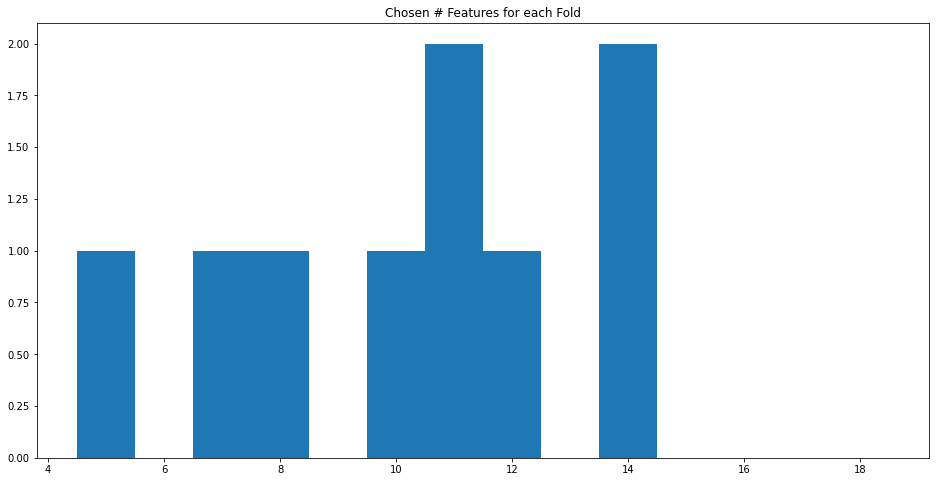

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 30,size_gridsearch_test=30,no_cv=False)

It could be a lot worse.

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 sex
slope_2.0 slope_1.0
cp_2.0 slope_2.0
sex slope_1.0
slope_1.0 slope_2.0
cp_2.0 sex
fbs cp_2.0
exang cp_2.0
fbs cp_2.0
fbs thal_6.0
cp_2.0 thal_6.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 exang
thal_6.0 exang
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'fbs', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: [frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'f

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 sex
slope_2.0 thal_6.0
cp_2.0 exang
cp_2.0 exang
slope_1.0 thal_6.0
slope_1.0 slope_2.0
thal_6.0 slope_2.0
exang cp_2.0
thal_6.0 exang
thal_6.0 cp_2.0
slope_2.0 slope_1.0
restecg_0.0 cp_2.0
thal_6.0 exang
cp_2.0 exang
exang cp_2.0
exang restecg_2.0
restecg_2.0 ca_2.0
restecg_2.0 restecg_0.0
restecg_2.0 exang
exang ca_2.0
ca_2.0 fbs
ca_2.0 cp_2.0
ca_2.0 restecg_0.0
ca_2.0 exang
restecg_0.0 exang
fbs cp_2.0
restecg_0.0 thal_6.0
restecg_0.0 thal_3.0
thal_7.0 restecg_2.0
thal_7.0 fbs
thal_7.0 restecg_0.0
restecg_2.0 restecg_0.0
restecg_2.0 fbs
restecg_2.0 restecg_0.0
thal_6.0 thal_3.0
fbs restecg_0.0
ca_2.0 ca_1.0
fbs thal_7.0
fbs cp_1.0
thal_7.0 cp_1.0
slope_1.0 restecg_0.0
slope_1.0 restecg_2.0
slope_1.0 exang
restecg_0.0 restecg_2.0
slope_1.0 fbs
slope_1.0 restecg_2.0
fbs restecg_2.0
restecg_0.0 fbs
restecg_2.0 ca_1.0
restecg_0.0 slope_1.0
restecg_0.0 thal_6.0
restecg_2.0 thal_6.0
restecg_0.0 fbs
restecg_2.0 thal_7.0
slope_1.0 thal_6.0
slope_1.0 f

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
exang thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [], 6: [], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or exang', 'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: []}
{frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', '

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'th

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 slope_1.0
sex cp_2.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'ca_0.0 or cp_4.0', 'sex or cp_2.0',
       'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 sex
cp_2.0 exang
cp_2.0 thal_6.0
exang thal_6.0
thal_6.0 cp_2.0
exang thal_6.0
thal_6.0 exang
cp_2.0 thal_6.0
restecg_2.0 cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [], 7: [frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'})], 8: [], 9: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'restecg_2.0', 'cp_2.0'})]}
{frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'restecg_2.0', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',


  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
thal_3.0 thal_7.0
slope_2.0 restecg_2.0
cp_2.0 thal_6.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'restecg_2.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_1.0 slope_2.0
exang cp_2.0
exang thal_6.0
cp_2.0 thal_6.0
thal_6.0 restecg_2.0
thal_6.0 exang
thal_6.0 cp_2.0
restecg_2.0 exang
restecg_2.0 cp_2.0
ca_2.0 thal_6.0
exang cp_2.0
cp_2.0 ca_2.0
restecg_0.0 thal_6.0
restecg_0.0 cp_2.0
thal_6.0 cp_2.0
cp_2.0 restecg_0.0
cp_3.0 cp_2.0
exang cp_2.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [], 6: [], 7: [], 8: [frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'restecg_2.0'}), frozenset({'restecg_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: [frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 slope_1.0
thal_6.0 exang
exang cp_2.0
exang fbs
cp_2.0 fbs
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'thal_6.0', 'exang'})], 8: [frozenset({'exang', 'cp_2.0'}), frozenset({'fbs', 'exang'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'exang'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 slope_1.0
cp_2.0 thal_6.0
cp_2.0 fbs
thal_6.0 restecg_0.0
thal_6.0 fbs
cp_2.0 exang
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', '

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_6.0 cp_2.0
thal_6.0 ca_2.0
cp_2.0 ca_2.0
restecg_0.0 ca_2.0
restecg_0.0 ca_2.0
exang ca_3.0
thal_3.0 slope_2.0
ca_2.0 ca_3.0
ca_2.0 restecg_2.0
ca_2.0 restecg_0.0
ca_2.0 exang
exang ca_3.0
exang slope_2.0
ca_3.0 slope_2.0
ca_3.0 restecg_2.0
ca_3.0 restecg_0.0
ca_3.0 exang
restecg_2.0 restecg_0.0
restecg_2.0 exang
restecg_0.0 exang
exang ca_1.0
exang slope_2.0
ca_3.0 ca_2.0
slope_2.0 exang
slope_2.0 fbs
restecg_0.0 ca_2.0
restecg_0.0 exang
restecg_0.0 ca_3.0
restecg_0.0 slope_2.0
ca_2.0 slope_1.0
ca_1.0 slope_2.0
ca_2.0 exang
ca_2.0 ca_3.0
ca_2.0 slope_2.0
exang fbs
exang ca_3.0
exang slope_2.0
ca_3.0 slope_2.0
restecg_0.0 ca_1.0
restecg_0.0 slope_2.0
exang thal_3.0
ca_2.0 slope_1.0
ca_1.0 slope_2.0
exang slope_2.0
fbs restecg_0.0
fbs exang
fbs ca_1.0
fbs slope_2.0
slope_1.0 ca_1.0
restecg_0.0 exang
restecg_0.0 ca_1.0
restecg_0.0 slope_2.0
restecg_2.0 exang
restecg_2.0 ca_1.0
exang ca_1.0
ca_3.0 ca_2.0
ca_3.0 slope_2.0
exang slope_2.0
exang ca_1.0
exang ca_1.0
ca_2.0 

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'sex or slope_1.0', 'ca_0.0 or cp_4.0',
 

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 slope_1.0
cp_2.0 exang
cp_2.0 thal_6.0
cp_2.0 exang
exang thal_6.0
cp_2.0 thal_6.0
thal_6.0 exang
thal_6.0 ca_2.0
exang cp_2.0
thal_6.0 cp_2.0
thal_6.0 exang
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'ca_2.0'})], 9: [frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'res

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
sex cp_2.0
cp_2.0 thal_6.0
thal_6.0 cp_2.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 exang
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', '

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 slope_1.0
restecg_0.0 sex
sex thal_7.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'sex', 'thal_7.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'thal_7.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 slope_1.0
cp_2.0 sex
cp_2.0 thal_6.0
sex cp_2.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'sex', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'sex or cp_2.0', 'thal_6.0 or cp_2.0',
       'thal_7.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
fbs cp_2.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [], 9: [frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'fbs or cp_2.0', 'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'slope_1.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'slope_1.0']


  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
cp_2.0 sex
cp_2.0 fbs
ca_2.0 thal_6.0
cp_2.0 fbs
cp_2.0 thal_6.0
fbs thal_6.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [], 6: [frozenset({'sex', 'cp_2.0'})], 7: [], 8: [frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'})], 9: [frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})]}
{frozenset({'sex', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or cp_2.0', 'fbs or cp_2.0', 'thal_7.0 or thal_3.0',
       'thal_6.0 or ca_2.0', 'fbs or thal_6.0', 'thal_

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 slope_1.0
restecg_0.0 sex
thal_6.0 cp_2.0
thal_6.0 cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})], 6: [], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0',
       'thal_6.0 or cp_2.0', 'sex or restecg_0.0'],
      dtype='object')
[]
['

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
restecg_0.0 restecg_2.0
restecg_0.0 slope_1.0
restecg_0.0 sex
restecg_2.0 slope_1.0
cp_2.0 sex
restecg_2.0 sex
cp_2.0 restecg_0.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [frozenset({'sex', 'cp_2.0'}), frozenset({'sex', 'restecg_2.0'})], 7: [frozenset({'restecg_0.0', 'cp_2.0'})], 8: [], 9: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'sex', 'restecg_2.0'

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
restecg_0.0 sex
slope_2.0 slope_1.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'sex or restecg_0.0', 'thal_6.0 or cp_2.0',
       'sex or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0',

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_1.0 slope_2.0
slope_2.0 sex
slope_2.0 restecg_2.0
sex restecg_2.0
restecg_2.0 sex
slope_1.0 slope_2.0
restecg_2.0 restecg_0.0
restecg_2.0 thal_6.0
thal_6.0 restecg_2.0
thal_6.0 restecg_0.0
restecg_2.0 restecg_0.0
restecg_0.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'sex', 'restecg_2.0'})], 6: [frozenset({'sex', 'restecg_2.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: [], 10: [frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_0.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'th

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 sex
restecg_0.0 exang
sex exang
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'sex', 'exang'})]}
{frozenset({'exang', 'restecg_0.0'}), frozenset({'sex', 'exang'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'exang or restecg_0.0', 'sex or exang', 'sex or restecg_0.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'sex or exang', '

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
exang restecg_0.0
exang thal_7.0
exang sex
restecg_0.0 thal_7.0
restecg_0.0 sex
thal_7.0 sex
exang restecg_0.0
exang thal_6.0
restecg_0.0 sex
thal_6.0 sex
restecg_0.0 thal_6.0
restecg_0.0 thal_6.0
thal_6.0 restecg_0.0
thal_6.0 exang
thal_6.0 cp_2.0
restecg_0.0 exang
restecg_0.0 cp_2.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'thal_7.0', 'exang'}), frozenset({'sex', 'exang'}), frozenset({'thal_7.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'thal_7.0', 'sex'})], 6: [frozenset({'exang', 'restecg_0.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'sex', 'thal_6.0'}), frozenset({'thal_6.0', 'restecg_0.0'})], 7: [frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'restecg_0.

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_1.0 slope_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0',
       'thal_6.0 or cp_2.0', 'sex or slope_2.0'],
      dtype='object')
[]
['thal_3.0']

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
sex slope_1.0
slope_2.0 slope_1.0
thal_6.0 fbs
fbs cp_2.0
fbs thal_6.0
cp_2.0 thal_6.0
cp_2.0 fbs
cp_2.0 thal_6.0
thal_6.0 fbs
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'fbs', 'thal_6.0'})], 8: [frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestb

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
cp_2.0 sex
thal_6.0 fbs
thal_6.0 cp_2.0
restecg_0.0 cp_2.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
   

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
restecg_0.0 sex
cp_2.0 thal_6.0
cp_2.0 exang
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'exang or cp_2.0', 'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0',
       'thal_6.0 or cp_2.0', 'sex or restecg_0.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0'

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 slope_1.0
cp_2.0 thal_6.0
exang cp_2.0
cp_2.0 ca_2.0
cp_2.0 cp_3.0
ca_2.0 cp_3.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: [frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'cp_3.0', 'ca_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'cp_3.0', 'ca_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0'

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
exang restecg_0.0
exang sex
restecg_0.0 sex
cp_2.0 sex
thal_6.0 cp_2.0
slope_1.0 slope_2.0
cp_2.0 thal_6.0
exang cp_2.0
exang thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'sex', 'exang'}), frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'exang'}), frozenset({'sex', 'cp_2.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 restecg_0.0
cp_2.0 sex
thal_6.0 cp_2.0
cp_2.0 exang
cp_2.0 thal_6.0
ca_2.0 thal_6.0
exang cp_2.0
thal_6.0 cp_2.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 restecg_0.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'})], 6: [frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'})]}
{frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_6.0 or cp_2.0', 'sex or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'oldpeak']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'oldpeak']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'oldpeak', 'sex or slope_2.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'oldpeak']
['ca_0.0

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 restecg_2.0
restecg_2.0 sex
cp_2.0 sex
cp_2.0 thal_6.0
cp_2.0 thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'restecg_2.0', 'slope_2.0'})], 6: [frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'sex', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or cp_2.0', 'thal_7.0 or thal_3.0', 'sex or restecg_2.0',
       'restecg_2.0 or slope_2.0',

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 restecg_0.0
slope_2.0 sex
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
restecg_0.0 sex
restecg_0.0 restecg_2.0
restecg_0.0 slope_1.0
restecg_0.0 sex
sex restecg_2.0
sex slope_1.0
restecg_2.0 slope_1.0
restecg_0.0 cp_2.0
restecg_0.0 sex
restecg_0.0 restecg_2.0
slope_2.0 cp_2.0
sex thal_7.0
slope_1.0 slope_2.0
cp_2.0 sex
cp_2.0 restecg_2.0
sex restecg_2.0
thal_6.0 exang
thal_6.0 cp_2.0
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'}), froz

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
exang sex
sex slope_1.0
slope_2.0 slope_1.0
thal_6.0 exang
thal_6.0 cp_2.0
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'exang'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'exang'}), frozenset({'sex', 'slope_1.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'sl

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'exang or cp_2.0', 'ca_0.0 or cp_4.0',
       'thal_6.0 or exang', 'thal_6.0 or cp_2.0', 'sex or slope_2.0

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 cp_3.0
exang sex
cp_3.0 sex
slope_2.0 slope_1.0
cp_2.0 exang
cp_2.0 ca_1.0
thal_6.0 ca_2.0
thal_6.0 exang
exang cp_2.0
exang ca_2.0
ca_2.0 exang
cp_2.0 ca_2.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'cp_3.0', 'slope_2.0'}), frozenset({'sex', 'exang'})], 6: [frozenset({'cp_3.0', 'sex'})], 7: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'ca_2.0'}), frozenset({'exang', 'ca_2.0'}), frozenset({'ca_2.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'exang'}), frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'ca_2.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'ca_0.

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
cp_2.0 sex
exang cp_2.0
exang thal_6.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'})], 6: [frozenset({'sex', 'cp_2.0'})], 7: [], 8: [frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'sex', 'cp_2.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or cp_2.0', 'restecg_0.0 or slope_2.0', 'exang or cp_2.0',
       'thal_6.0 or exang', 'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [], 6: [], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'thal_6.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'ca_0.0 or cp_4.0', 'thal_6.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', '

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
cp_2.0 thal_6.0
exang thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
sex restecg_2.0
sex slope_1.0
restecg_2.0 slope_1.0
restecg_2.0 thal_6.0
slope_1.0 slope_2.0
thal_6.0 fbs
thal_6.0 cp_2.0
cp_2.0 thal_6.0
fbs cp_2.0
cp_2.0 restecg_2.0
restecg_0.0 restecg_2.0
restecg_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'restecg_2.0', 'cp_2.0'})], 8: [], 9: [frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_2.0'})], 10: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'fbs', 'cp_2.0'}), 

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'sex or slope_1.0', 'ca_0.0 or cp_4.0',
       'thal_6.0 or cp_2.0', 'sex or s

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
slope_2.0 sex
slope_2.0 slope_1.0
restecg_0.0 sex
restecg_0.0 slope_1.0
sex slope_1.0
fbs cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'sex', 'slope_1.0'})], 6: [], 7: [], 8: [], 9: [frozenset({'fbs', 'cp_2.0'})], 10: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       '

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 cp_3.0
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
sex cp_3.0
sex restecg_2.0
sex slope_1.0
cp_3.0 restecg_2.0
cp_3.0 slope_1.0
restecg_2.0 slope_1.0
slope_1.0 cp_3.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'cp_3.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'cp_3.0', 'restecg_2.0'}), frozenset({'cp_3.0', 'slope_1.0'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [], 7: [], 8: [frozenset({'cp_3.0', 'slope_1.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'cp_3.0', 'slope_1.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'cp_3.0', 'restecg_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'rest

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 slope_1.0
thal_3.0 thal_7.0
exang sex
exang thal_6.0
restecg_0.0 sex
slope_1.0 thal_6.0
slope_1.0 slope_2.0
cp_2.0 thal_6.0
slope_2.0 slope_1.0
cp_2.0 thal_6.0
thal_6.0 slope_2.0
cp_2.0 exang
cp_2.0 ca_2.0
thal_6.0 cp_2.0
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
exang ca_2.0
cp_2.0 thal_6.0
restecg_2.0 slope_1.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'sex', 'exang'})], 6: [frozenset({'thal_6.0', 'exang'}), frozenset({'sex', 'restecg_0.0'})], 7: [], 8: [frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'slope_2.0'})], 9: [frozenset({'exang', 'cp_2.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'restecg_2.0', 's

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
restecg_2.0 slope_1.0
restecg_2.0 sex
sex cp_2.0
cp_2.0 sex
cp_2.0 thal_6.0
fbs cp_2.0
thal_6.0 cp_2.0
cp_2.0 slope_1.0
cp_2.0 slope_2.0
slope_1.0 slope_2.0
cp_2.0 ca_2.0
cp_2.0 thal_6.0
ca_2.0 thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'})], 8: [frozenset({'slope_1.0', 'cp_2.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'fbs', 

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
thal_6.0 fbs
thal_6.0 exang
fbs exang
fbs thal_6.0
fbs exang
cp_2.0 thal_6.0
cp_2.0 fbs
thal_6.0 exang
thal_6.0 fbs
thal_6.0 fbs
exang slope_1.0
exang fbs
thal_6.0 cp_2.0
thal_6.0 fbs
fbs cp_2.0
fbs slope_2.0
thal_6.0 exang
cp_2.0 fbs
cp_2.0 slope_2.0
slope_2.0 cp_2.0
slope_2.0 exang
thal_7.0 fbs
thal_7.0 restecg_2.0
thal_7.0 restecg_0.0
thal_7.0 exang
exang ca_2.0
fbs restecg_2.0
fbs restecg_0.0
cp_2.0 exang
fbs exang
restecg_2.0 restecg_0.0
restecg_2.0 exang
restecg_0.0 exang
fbs restecg_0.0
restecg_0.0 exang
restecg_0.0 restecg_2.0
restecg_0.0 thal_7.0
restecg_0.0 slope_2.0
exang restecg_2.0
exang thal_7.0
exang slope_2.0
restecg_2.0 thal_7.0
restecg_2.0 slope_2.0
restecg_0.0 restecg_2.0
thal_7.0 slope_2.0
exang fbs
restecg_0.0 restecg_2.0
restecg_2.0 restecg_0.0
restecg_2.0 ca_1.0
restecg_2.0 slope_2.0
restecg_0.0 ca_1.0
exang slope_2.0
restecg_0.0 slope_2.0
slope_2.0 ca_2.0
slope_2.0 

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
thal_3.0 thal_7.0
slope_2.0 slope_1.0
slope_2.0 cp_2.0
cp_3.0 sex
slope_1.0 cp_2.0
thal_6.0 sex
thal_6.0 cp_2.0
sex cp_2.0
thal_6.0 cp_3.0
cp_2.0 sex
slope_2.0 slope_1.0
cp_3.0 cp_2.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
sex cp_2.0
sex thal_6.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'slope_1.0', 'cp_2.0'})], 6: [frozenset({'sex', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'cp_2.0'}), frozenset({'sex', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_2.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
thal_3.0 thal_7.0
fbs exang
fbs cp_2.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [], 6: [], 7: [frozenset({'fbs', 'exang'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'fbs', 'exang'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'fbs or exang', 'fbs or cp_2.0', 'thal_7.0 or thal_3.0',
       'exang or cp_2.0', 'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.

  0%|          | 0/58 [00:00<?, ?it/s]

cp_2.0 sex
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'sex', 'cp_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'sex', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['cp_4.0', 'ca_0.0', 'slope_1.0', 'thal_3.0', 'sex or cp_2.0', 'tres

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_1.0 slope_2.0
slope_2.0 sex
slope_1.0 slope_2.0
thal_6.0 fbs
thal_6.0 cp_2.0
thal_6.0 ca_2.0
fbs cp_2.0
fbs ca_2.0
cp_2.0 ca_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'sex', 'slope_2.0'})], 6: [], 7: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'ca_2.0'}), frozenset({'ca_2.0', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'ca_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [], 6: []}
{frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
thal_6.0 ca_1.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
ca_1.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
cp_2.0 ca_1.0
thal_6.0 ca_1.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'ca_1.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'ca_1.0', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_1.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'thal_6.0', 'ca_1.0'}), frozenset({'ca_1.0', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
thal_6.0 cp_2.0
cp_2.0 exang
cp_2.0 thal_6.0
cp_2.0 fbs
cp_2.0 thal_6.0
thal_6.0 fbs
cp_2.0 exang
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'sex', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
thal_3.0 ca_0.0
thal_3.0 thal_7.0
slope_1.0 slope_2.0
restecg_0.0 sex
thal_6.0 exang
fbs cp_2.0
cp_2.0 thal_6.0
exang cp_2.0
{1: [], 2: [frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'sex', 'restecg_0.0'})], 7: [frozenset({'thal_6.0', 'exang'})], 8: [frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'thal_6.0', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 slope_1.0
{1: [], 2: [frozenset({'ca_0.0', 'thal_3.0'}), frozenset({'ca_0.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'ca_0.0', 'cp_4.0'}), frozenset({'ca_0.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'ca_0.0 or cp_4.0', 'ca_0.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4

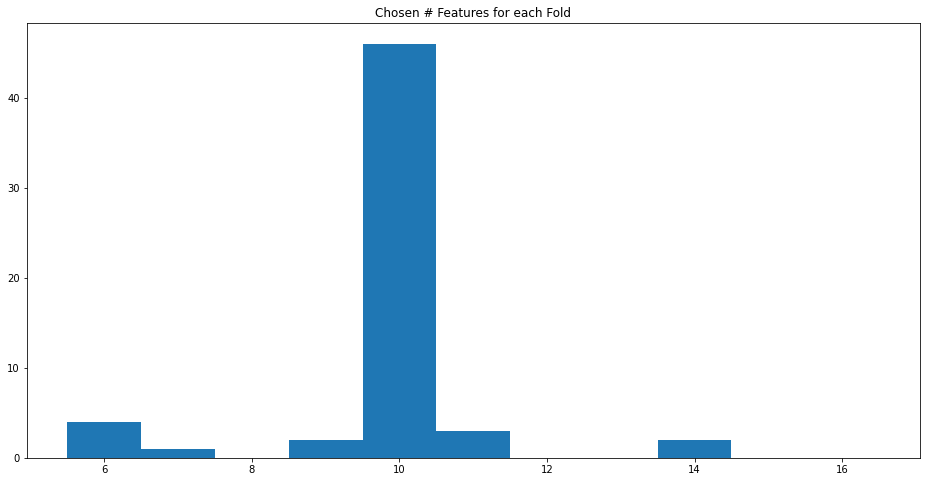

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,no_cv=False,or_features=True)

AUC is 89.3, less than 90.6 so this doesn't work.

now we are more 嚴格 and use decider.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,no_cv=False,or_features=True)

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
sex cp_2.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
restecg_2.0 sex
thal_6.0 fbs
cp_2.0 cp_3.0
cp_2.0 thal_6.0
cp_2.0 fbs
thal_6.0 fbs
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'sex', 'restecg_2.0'})], 7: [frozenset({'fbs', 'thal_6.0'})], 8: [frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'fbs', 'cp_2.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'fbs', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'cp_3.0 or cp_2.0', 'fbs or cp_2.0',
       'sex or restecg_2.0', 'fbs or thal_6.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
restecg_0.0 sex
restecg_0.0 cp_2.0
restecg_0.0 thal_6.0
cp_2.0 thal_6.0
cp_2.0 exang
thal_6.0 cp_2.0
cp_2.0 exang
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})], 6: [], 7: [], 8: [frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'exang', 'cp_2.0'})], 9: [frozenset({'exang', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or restecg_0.0', 'exang or cp_2.0',
       'sex or restecg_0.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']


  0%|          | 0/58 [00:00<?, ?it/s]

exang thal_6.0
cp_2.0 exang
cp_2.0 thal_6.0
exang thal_6.0
cp_2.0 exang
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_6.0 or exang', 'exang or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0'

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_1.0 slope_2.0
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
restecg_0.0 thal_7.0
restecg_0.0 sex
restecg_2.0 slope_1.0
thal_7.0 sex
cp_2.0 sex
cp_2.0 restecg_2.0
cp_2.0 sex
restecg_2.0 sex
sex restecg_0.0
sex cp_2.0
restecg_0.0 sex
restecg_0.0 cp_2.0
thal_6.0 cp_2.0
thal_6.0 exang
sex cp_2.0
cp_2.0 exang
{1: [], 2: [], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'thal_7.0', 'sex'})], 6: [frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'})], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'thal_7.0', 'sex'}), frozenset(

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'})], 6: [], 7: [], 8: [], 9: []}
{frozenset({'restecg_0.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'restecg_0.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 restecg_0.0
slope_2.0 sex
slope_2.0 slope_1.0
restecg_0.0 sex
restecg_0.0 slope_1.0
sex slope_1.0
cp_2.0 sex
slope_1.0 restecg_0.0
slope_1.0 slope_2.0
restecg_0.0 slope_2.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_0.0'})], 6: [frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'slope_2.0'})], 7: [], 8: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',


  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 slope_1.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
cp_2.0 thal_6.0
exang thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'exang'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or exang', 'exang or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_1.0 slope_2.0
cp_2.0 sex
thal_6.0 cp_2.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: [], 10: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']


  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
restecg_0.0 sex
slope_2.0 slope_1.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'sex or restecg_0.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 sex
slope_2.0 slope_1.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
exang thal_6.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
cp_2.0 exang
restecg_2.0 exang
restecg_2.0 restecg_0.0
restecg_0.0 fbs
restecg_0.0 thal_6.0
fbs thal_6.0
exang restecg_0.0
restecg_0.0 thal_6.0
restecg_0.0 thal_6.0
restecg_0.0 ca_1.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [frozenset({'exang', 'cp_2.0'})], 9: [], 10: [frozenset({'exang', 'restecg_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'fbs', 'restecg_0.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'restecg_0.0', 'ca_1.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'ca_1.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'restecg_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'fbs', 'restecg_0.0'})}
Index(['

  0%|          | 0/58 [00:00<?, ?it/s]

thal_6.0 cp_2.0
cp_2.0 exang
thal_6.0 exang
thal_6.0 cp_2.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 exang
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_6.0 or exang', 'exang or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'oldpeak']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'oldpeak']


  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_1.0 slope_2.0
slope_1.0 slope_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [frozenset({'slope_1.0', 'slope_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'tha

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
thal_7.0 thal_3.0
slope_1.0 slope_2.0
slope_2.0 slope_1.0
thal_6.0 cp_2.0
exang cp_2.0
cp_2.0 thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'exang', 'cp_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'thal_7.0', 'thal_3.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'exang or cp_2.0', 'thal_7.0 or thal_3.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'th

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_2.0 slope_1.0
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 fbs
cp_2.0 thal_6.0
thal_6.0 fbs
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [frozenset({'fbs', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'fbs', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'fbs or thal_6.0', 'fbs or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
restecg_0.0 sex
thal_6.0 exang
cp_2.0 thal_6.0
thal_6.0 ca_2.0
cp_2.0 ca_2.0
thal_6.0 restecg_2.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'thal_6.0', 'exang'})], 8: [frozenset({'thal_6.0', 'ca_2.0'})], 9: [frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'})]}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'exang'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or restecg_2.0',
       'thal_6.0 or ca_2.0', 'ca_2.0 or cp_2.0', 'thal_6.0 or exang'],
      dtype='obj

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
slope_2.0 slope_1.0
slope_2.0 slope_1.0
cp_2.0 sex
thal_6.0 fbs
thal_6.0 ca_1.0
thal_6.0 ca_2.0
fbs ca_1.0
fbs ca_2.0
ca_1.0 ca_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
ca_2.0 ca_1.0
{1: [], 2: [], 3: [], 4: [frozenset({'thal_7.0', 'thal_3.0'})], 5: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'fbs', 'thal_6.0'}), frozenset({'fbs', 'ca_1.0'}), frozenset({'fbs', 'ca_2.0'}), frozenset({'ca_2.0', 'ca_1.0'})], 8: [frozenset({'ca_2.0', 'ca_1.0'})], 9: [], 10: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'fbs', 'ca_1.0'}), frozenset({'thal_7.0', 'thal_3.0'}), frozenset({'fbs', 'ca_2.0'}), frozenset({'ca_2.0', 'ca_1.0'}), frozenset({'fbs', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', '

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 slope_1.0
sex cp_2.0
thal_6.0 cp_3.0
thal_6.0 cp_2.0
cp_3.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'cp_3.0', 'cp_2.0'})], 8: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'cp_3.0', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'cp_3.0 or thal_6.0', 'cp_3.0 or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']


  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
cp_2.0 sex
cp_2.0 thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']

  0%|          | 0/58 [00:00<?, ?it/s]

thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
set()
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0'

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
restecg_0.0 sex
restecg_0.0 restecg_2.0
restecg_0.0 slope_1.0
slope_2.0 sex
slope_2.0 restecg_2.0
slope_2.0 slope_1.0
exang sex
sex restecg_2.0
sex slope_1.0
restecg_2.0 slope_1.0
cp_2.0 sex
slope_1.0 slope_2.0
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'restecg_2.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'exang'}), frozenset({'slope_1.0', 'restecg_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'exang'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_2.0', 'restecg_0.0'}), frozenset({'sex', 'exang'}), frozenset({'thal_6.0', 'exang'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'restecg_2.0', 'slope_2.0'})}
Index([

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
slope_2.0 restecg_0.0
slope_2.0 sex
slope_2.0 slope_1.0
restecg_0.0 sex
restecg_0.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
slope_2.0 restecg_0.0
slope_1.0 restecg_0.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
thal_6.0 restecg_0.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'})], 7: [], 8: [frozenset({'thal_6.0', 'restecg_0.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'slope_1.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
   

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
restecg_0.0 sex
restecg_0.0 thal_6.0
restecg_0.0 restecg_2.0
restecg_0.0 cp_3.0
sex thal_6.0
sex restecg_2.0
sex cp_3.0
thal_6.0 restecg_2.0
thal_6.0 cp_3.0
restecg_2.0 cp_3.0
restecg_2.0 cp_2.0
restecg_2.0 restecg_0.0
restecg_2.0 thal_6.0
cp_2.0 restecg_0.0
cp_2.0 thal_6.0
restecg_0.0 thal_6.0
cp_3.0 sex
cp_3.0 restecg_2.0
thal_6.0 fbs
thal_6.0 exang
thal_6.0 cp_2.0
fbs exang
fbs cp_2.0
exang cp_2.0
exang cp_2.0
exang fbs
thal_6.0 cp_2.0
restecg_2.0 thal_6.0
cp_2.0 fbs
thal_6.0 exang
cp_2.0 thal_6.0
cp_2.0 thal_6.0
ca_1.0 exang
ca_1.0 ca_2.0
exang ca_2.0
restecg_0.0 ca_1.0
restecg_0.0 restecg_2.0
ca_1.0 restecg_2.0
ca_1.0 exang
exang restecg_1.0
thal_7.0 fbs
thal_7.0 ca_2.0
thal_7.0 slope_2.0
thal_7.0 exang
thal_7.0 restecg_0.0
slope_2.0 exang
slope_2.0 restecg_0.0
ca_2.0 slope_2.0
ca_2.0 ca_1.0
ca_2.0 restecg_2.0
ca_2.0 exang
fbs ca_2.0
fbs slope_2.0
fbs exang
fbs restecg_0.0
ca_2.0 slope_2.0
ca_2.0 exang
ca_2.0 restecg_0.0
restecg_0.0 exang
ca_1.0 ca_2.

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
cp_4.0 ca_0.0
slope_1.0 slope_2.0
slope_1.0 slope_2.0
{1: [], 2: [], 3: [], 4: [frozenset({'slope_1.0', 'slope_2.0'})], 5: [], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_2.0 slope_1.0
cp_2.0 thal_6.0
thal_6.0 cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'slope_1.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0', 'cp_4.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'trestbps']
['ca_0.0', 'cp_4.0'

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
sex slope_1.0
sex restecg_0.0
slope_1.0 slope_2.0
thal_6.0 sex
thal_6.0 cp_2.0
thal_6.0 cp_2.0
thal_6.0 restecg_0.0
cp_2.0 restecg_0.0
ca_2.0 cp_2.0
cp_2.0 restecg_0.0
cp_2.0 thal_6.0
thal_6.0 ca_2.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'restecg_0.0'})], 8: [frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'})], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'restecg_0.0', 'cp_2.0'}), frozenset({'thal_6.0', 'ca_2.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0',

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_2.0 slope_1.0
sex slope_1.0
slope_1.0 slope_2.0
thal_6.0 cp_2.0
thal_6.0 cp_2.0
cp_2.0 thal_6.0
cp_2.0 thal_6.0
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_1.0', 'slope_2.0'})], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0',

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
slope_1.0 slope_2.0
cp_2.0 sex
thal_6.0 exang
thal_6.0 cp_2.0
exang cp_2.0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'slope_1.0', 'slope_2.0'})], 7: [frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: []}
{frozenset({'slope_1.0', 'slope_2.0'}), frozenset({'thal_6.0', 'exang'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_1.0 or slope_2.0', 'thal_6.0 or exang', 'exang or cp_2.0'],
      dtype='object')
[]
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['thal_3.0', 'ca_0.0']
['thal_3.0', 'ca_0.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
[

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 restecg_0.0
slope_2.0 sex
restecg_0.0 sex
thal_6.0 restecg_2.0
thal_6.0 cp_2.0
thal_6.0 restecg_2.0
thal_6.0 exang
slope_1.0 slope_2.0
restecg_2.0 exang
restecg_2.0 cp_2.0
restecg_0.0 restecg_2.0
restecg_2.0 restecg_0.0
restecg_2.0 thal_6.0
thal_6.0 restecg_0.0
thal_6.0 cp_2.0
restecg_0.0 thal_6.0
restecg_2.0 ca_2.0
restecg_2.0 fbs
restecg_2.0 restecg_0.0
ca_2.0 fbs
ca_2.0 restecg_0.0
thal_6.0 restecg_0.0
restecg_0.0 ca_1.0
restecg_0.0 restecg_2.0
fbs restecg_0.0
ca_1.0 restecg_2.0
fbs ca_1.0
ca_1.0 fbs
fbs ca_2.0
restecg_0.0 restecg_2.0
fbs ca_3.0
fbs exang
fbs thal_7.0
fbs ca_1.0
fbs ca_2.0
ca_2.0 ca_3.0
ca_2.0 exang
ca_2.0 thal_7.0
ca_2.0 ca_1.0
exang ca_2.0
exang slope_1.0
exang fbs
exang restecg_2.0
exang restecg_0.0
exang restecg_0.0
ca_3.0 exang
ca_3.0 thal_7.0
ca_3.0 ca_1.0
thal_7.0 thal_6.0
ca_2.0 slope_1.0
ca_2.0 fbs
ca_2.0 restecg_2.0
ca_2.0 restecg_0.0
exang thal_7.0
exang ca_1.0
thal_7.0 ca_1.0
slope_1.0 fbs
slope_1.0 restecg_2.0
slope_1.0 restecg_0.0
fbs restecg

  0%|          | 0/58 [00:00<?, ?it/s]

and now we use history decider.

but we have to tell it how many times it's allowed to miss the other Feature. Usually, we get 50-58 misses for when it doesn't appear again and 0-10 misses for when it does.

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
30
sex restecg_0.0
53
sex cp_2.0
1
exang thal_6.0
52
exang cp_2.0
58
thal_6.0 cp_2.0
6
thal_6.0 cp_2.0
6
thal_6.0 cp_2.0
6
cp_2.0 thal_6.0
6
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'})], 6: [frozenset({'sex', 'restecg_0.0'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or 

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
slope_2.0 slope_1.0
57
thal_6.0 cp_2.0
10
cp_2.0 thal_6.0
10
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or thal_6.0', 'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'thal_3.0', 'cp_4.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'trestbps', 'oldpe

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
7
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
58
slope_2.0 slope_1.0
58
slope_2.0 sex
42
slope_1.0 sex
16
slope_1.0 slope_2.0
58
thal_6.0 cp_3.0
46
thal_6.0 cp_3.0
46
thal_6.0 cp_2.0
11
cp_2.0 thal_6.0
11
cp_3.0 cp_2.0
57
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_3.0', 'thal_6.0'})], 8: [frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_3.0', 'cp_2.0'})], 9: []}
{frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 't

  0%|          | 0/58 [00:00<?, ?it/s]

sex slope_2.0
41
slope_2.0 slope_1.0
57
thal_6.0 fbs
52
thal_6.0 cp_2.0
7
cp_2.0 ca_1.0
49
cp_2.0 fbs
57
cp_2.0 thal_6.0
7
fbs cp_2.0
57
ca_1.0 fbs
10
ca_1.0 thal_6.0
48
fbs thal_6.0
52
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [], 8: [frozenset({'fbs', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'ca_1.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'fbs', 'ca_1.0'}), frozenset({'thal_6.0', 'ca_1.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'thal_6.0', 'ca_1.0'}), frozenset({'fbs', 'ca_1.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'ca_1.0'}), frozenset({'cp_2.0', 'fbs'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0'

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
6
cp_4.0 ca_0.0
0
restecg_0.0 slope_2.0
29
restecg_0.0 cp_2.0
20
restecg_0.0 sex
18
slope_2.0 cp_2.0
19
slope_2.0 sex
17
cp_2.0 sex
2
restecg_0.0 sex
18
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
7
restecg_2.0 restecg_0.0
55
restecg_2.0 restecg_0.0
55
restecg_2.0 thal_6.0
42
restecg_2.0 ca_1.0
16
restecg_0.0 thal_6.0
19
restecg_0.0 ca_1.0
41
thal_6.0 restecg_0.0
19
thal_6.0 ca_1.0
50
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'slope_2.0', 'sex'})], 6: [frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 7: [], 8: [], 9: [frozenset({'cp_2.0', 'thal_6.0'})], 10: [frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'ca_1.0', 'restecg_2.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
16
cp_4.0 ca_0.0
0
sex restecg_0.0
47
restecg_0.0 slope_2.0
13
restecg_0.0 slope_1.0
45
slope_2.0 slope_1.0
58
sex cp_2.0
0
cp_2.0 restecg_0.0
47
thal_6.0 cp_2.0
17
restecg_0.0 cp_2.0
47
cp_2.0 thal_6.0
17
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
4
cp_4.0 ca_0.0
0
sex slope_1.0
10
sex slope_2.0
48
slope_1.0 slope_2.0
58
slope_2.0 slope_1.0
58
exang thal_6.0
45
exang fbs
8
thal_6.0 fbs
53
thal_6.0 cp_2.0
8
cp_2.0 fbs
55
cp_2.0 thal_6.0
8
cp_2.0 fbs
55
fbs thal_6.0
53
thal_6.0 cp_2.0
8
exang fbs
8
exang cp_2.0
53
exang cp_2.0
53
cp_2.0 thal_6.0
8
fbs thal_6.0
53
fbs cp_2.0
55
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'fbs'}), frozenset({'fbs', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'fbs', 'thal_6.0'})], 9: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'fbs'}), frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'}), f

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
sex restecg_0.0
52
restecg_0.0 slope_2.0
19
restecg_0.0 sex
52
slope_2.0 sex
43
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
9
thal_6.0 ca_2.0
49
thal_6.0 cp_2.0
9
cp_2.0 thal_6.0
9
cp_2.0 ca_2.0
58
ca_2.0 cp_2.0
58
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'sex'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'cp_2.0'})], 9: [frozenset({'ca_2.0', 'cp_2.0'})]}
{frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak'

  0%|          | 0/58 [00:00<?, ?it/s]

sex slope_1.0
17
sex slope_2.0
40
slope_1.0 slope_2.0
57
slope_2.0 slope_1.0
57
thal_6.0 cp_2.0
4
thal_6.0 cp_2.0
4
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [], 8: [], 9: []}
{frozenset({'sex', 'slope_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or slope_2.0', 'slope_2.0 or slope_1.0', 'sex or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0',

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
58
exang thal_6.0
51
exang cp_2.0
57
thal_6.0 cp_2.0
8
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'exang or thal_6.0', 'cp_2.0 or thal_6.0', 'exang or cp_2.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0'

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
58
slope_1.0 slope_2.0
58
exang thal_6.0
51
exang thal_6.0
51
exang fbs
3
exang cp_2.0
54
thal_6.0 fbs
48
thal_6.0 cp_2.0
9
fbs cp_2.0
57
thal_6.0 cp_2.0
9
thal_6.0 ca_2.0
53
thal_6.0 fbs
48
cp_2.0 fbs
57
cp_2.0 thal_6.0
9
ca_1.0 exang
4
cp_2.0 ca_2.0
54
cp_2.0 fbs
57
ca_2.0 fbs
5
fbs thal_6.0
48
{1: [], 2: [], 3: [], 4: [frozenset({'slope_2.0', 'slope_1.0'})], 5: [], 6: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'exang', 'thal_6.0'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'ca_2.0', 'fbs'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
6
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
58
slope_2.0 sex
22
thal_6.0 cp_2.0
8
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'sex'})], 6: [], 7: [], 8: [], 9: [frozenset({'cp_2.0', 'thal_6.0'})]}
{frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or sex', 'thal_3.0 or thal_7.0', 'cp_2.0 or thal_6.0',
       'thal_3.0 or ca_0.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'oldpeak', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'oldpeak', 'sl

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
27
restecg_0.0 slope_1.0
32
restecg_0.0 sex
56
slope_2.0 slope_1.0
57
slope_2.0 sex
33
slope_1.0 sex
24
slope_1.0 slope_2.0
57
sex cp_2.0
1
cp_2.0 thal_6.0
8
thal_6.0 cp_2.0
8
exang thal_6.0
49
exang cp_2.0
57
thal_6.0 cp_2.0
8
cp_2.0 thal_6.0
8
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 thal_3.0
1
cp_2.0 ca_2.0
53
cp_2.0 fbs
58
ca_2.0 fbs
5
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'ca_2.0', 'fbs'})]}
{frozenset({'cp_2.0', 'fbs'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'ca_2.0', 'fbs'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or fbs', 'ca_2.0 or cp_2.0', 'ca_2.0 or fbs'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['cp_4.0', 'ca_0.0', 'slope_1.0', 'sex', 'thal_3.0', 'thalach', 'trestbps']
['c

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
17
restecg_0.0 slope_1.0
41
restecg_0.0 sex
56
slope_2.0 slope_1.0
58
slope_2.0 sex
43
slope_1.0 sex
15
slope_2.0 slope_1.0
58
thal_6.0 cp_2.0
4
cp_2.0 cp_3.0
57
cp_2.0 fbs
57
cp_2.0 thal_6.0
4
cp_3.0 fbs
2
cp_3.0 thal_6.0
55
fbs thal_6.0
53
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [], 7: [], 8: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'cp_3.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
3
cp_4.0 ca_0.0
0
slope_2.0 slope_1.0
58
restecg_2.0 sex
57
thal_6.0 cp_2.0
5
cp_2.0 thal_6.0
5
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'sex', 'restecg_2.0'})], 7: [], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'sex', 'restecg_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or restecg_2.0', 'slope_2.0 or slope_1.0', 'cp_2.0 or thal_6.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
8
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
58
thal_6.0 slope_2.0
39
slope_1.0 slope_2.0
58
sex thal_6.0
8
cp_3.0 sex
58
cp_3.0 cp_2.0
58
sex cp_2.0
0
cp_2.0 thal_6.0
8
thal_6.0 cp_2.0
8
thal_6.0 cp_2.0
8
cp_2.0 thal_6.0
8
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'sex', 'thal_6.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'cp_3.0', 'cp_2.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'cp_3.0', 'sex'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'sex', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thal

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
sex slope_2.0
50
slope_1.0 slope_2.0
58
thal_6.0 fbs
52
slope_2.0 slope_1.0
58
slope_2.0 thal_6.0
44
slope_1.0 thal_6.0
14
cp_2.0 thal_6.0
6
restecg_0.0 thal_6.0
53
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_2.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'fbs', 'thal_6.0'})], 8: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'thal_6.0', 'restecg_0.0'})], 9: []}
{frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.

  0%|          | 0/58 [00:00<?, ?it/s]

sex slope_1.0
25
sex slope_2.0
33
slope_1.0 slope_2.0
58
slope_2.0 slope_1.0
58
thal_6.0 cp_2.0
6
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'slope_1.0'}), frozenset({'sex', 'slope_2.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'sex', 'slope_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or slope_2.0', 'cp_2.0 or thal_6.0', 'slope_2.0 or slope_1.0',
       'sex or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
7
cp_4.0 ca_0.0
0
slope_2.0 slope_1.0
57
slope_2.0 sex
52
slope_1.0 sex
5
slope_1.0 slope_2.0
57
fbs cp_2.0
57
thal_6.0 cp_2.0
8
thal_6.0 ca_2.0
50
cp_2.0 fbs
57
cp_2.0 thal_6.0
8
cp_2.0 ca_2.0
58
fbs thal_6.0
51
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'fbs'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'ca_2.0', 'thal_6.0'})}
In

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
sex exang
49
slope_2.0 slope_1.0
58
sex cp_2.0
5
thal_6.0 cp_2.0
7
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'exang', 'sex'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'sex', 'cp_2.0'})], 7: [], 8: [], 9: [frozenset({'cp_2.0', 'thal_6.0'})]}
{frozenset({'sex', 'cp_2.0'}), frozenset({'exang', 'sex'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or cp_2.0', 'exang or sex', 'slope_2.0 or slope_1.0',
       'cp_2.0 or thal_6.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'exang or sex', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'exang or sex', 'slope_1.0', 'thal

  0%|          | 0/58 [00:00<?, ?it/s]

sex cp_2.0
2
thal_6.0 cp_2.0
11
cp_2.0 thal_6.0
11
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or thal_6.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps', 'thalach']
['cp_4.0', 'ca_0.0', 'slope_1.0', 'thal_3.0', 'sex', 'thal_6.0', 'trestbps', 'thalach']
['cp_4.0', 'ca_0.0', 'thal_3.0',

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
9
cp_4.0 ca_0.0
0
slope_1.0 slope_2.0
58
sex cp_2.0
3
exang thal_6.0
45
exang cp_2.0
54
thal_6.0 cp_2.0
15
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: []}
{frozenset({'exang', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'exang or thal_6.0', 'thal_3.0 or ca_0.0', 'slope_2.0 or slope_1.0',
       'cp_2.0 or thal_6.0', 'exang or cp_2.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'tha

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 restecg_2.0
53
restecg_0.0 slope_2.0
18
restecg_0.0 slope_1.0
40
restecg_0.0 cp_2.0
19
restecg_0.0 sex
19
restecg_2.0 slope_2.0
41
restecg_2.0 slope_1.0
17
restecg_2.0 cp_2.0
44
restecg_2.0 sex
44
slope_2.0 slope_1.0
58
slope_2.0 cp_2.0
13
slope_2.0 sex
13
slope_1.0 cp_2.0
45
slope_1.0 sex
45
cp_2.0 sex
0
sex cp_2.0
0
restecg_2.0 thal_6.0
44
exang cp_2.0
52
thal_6.0 restecg_0.0
19
thal_6.0 exang
54
restecg_0.0 exang
41
slope_1.0 slope_2.0
58
restecg_0.0 thal_6.0
19
restecg_0.0 thal_6.0
19
exang restecg_0.0
41
exang restecg_2.0
14
restecg_0.0 exang
41
restecg_0.0 restecg_2.0
53
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'restecg_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'cp_2.0', 'restecg_2.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'slope_

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
58
thal_3.0 thal_7.0
58
exang thal_6.0
49
exang thal_6.0
49
exang fbs
3
exang cp_2.0
58
exang cp_2.0
58
exang thal_6.0
49
thal_6.0 fbs
52
thal_6.0 cp_2.0
9
cp_2.0 thal_6.0
9
fbs cp_2.0
55
{1: [], 2: [], 3: [], 4: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'thal_3.0', 'thal_7.0'})], 5: [], 6: [], 7: [frozenset({'exang', 'thal_6.0'})], 8: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'})], 9: []}
{frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
restecg_0.0 slope_2.0
9
restecg_0.0 slope_1.0
49
slope_2.0 slope_1.0
58
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
6
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'restecg_0.0 or slope_1.0', 'cp_2.0 or thal_6.0',
       'slope_2.0 or slope_1.0', 'slope_2.0 or restecg_0.0'],
      dtype='object')
['thal_3.0']
['tha

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
17
restecg_0.0 slope_1.0
41
restecg_0.0 sex
52
slope_2.0 slope_1.0
58
slope_2.0 sex
47
slope_1.0 sex
11
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
6
cp_2.0 fbs
58
cp_2.0 thal_6.0
6
fbs thal_6.0
52
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 's

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
5
cp_4.0 thal_3.0
5
cp_4.0 ca_0.0
0
restecg_0.0 slope_2.0
40
restecg_0.0 slope_1.0
18
restecg_0.0 cp_2.0
41
restecg_0.0 sex
42
slope_2.0 slope_1.0
58
slope_2.0 cp_2.0
3
slope_2.0 sex
4
slope_1.0 cp_2.0
55
slope_1.0 sex
54
cp_2.0 sex
1
cp_2.0 exang
33
thal_6.0 cp_2.0
6
exang thal_6.0
35
exang cp_2.0
33
thal_6.0 cp_2.0
6
exang restecg_0.0
38
exang thal_6.0
35
restecg_0.0 thal_6.0
43
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'thal_3.0', 'cp_4.0'})], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'})], 6: [], 7: [frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'ex

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
exang thal_6.0
38
cp_2.0 exang
50
thal_6.0 cp_2.0
14
exang cp_2.0
50
thal_6.0 exang
38
thal_6.0 cp_2.0
14
exang cp_2.0
50
cp_2.0 thal_6.0
14
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'exang or thal_6.0', 'cp_2.0 or thal_6.0', 'exang or cp_2.0'],
      dtype='object')
['thal_3.0']
['thal_

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
14
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
58
thal_3.0 thal_7.0
58
slope_1.0 slope_2.0
58
slope_1.0 sex
35
slope_2.0 sex
23
slope_2.0 slope_1.0
58
exang thal_6.0
47
exang cp_2.0
52
thal_6.0 cp_2.0
15
cp_2.0 thal_6.0
15
thal_6.0 cp_2.0
15
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [frozenset({'thal_3.0', 'thal_7.0'})], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [], 8: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: [frozenset({'cp_2.0', 'thal_6.0'})]}
{frozenset({'exang', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
8
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
58
slope_2.0 sex
49
slope_1.0 slope_2.0
58
exang thal_6.0
49
exang cp_2.0
57
thal_6.0 cp_2.0
8
thal_6.0 cp_2.0
8
cp_2.0 thal_6.0
8
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'sex'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'exang', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
4
cp_4.0 ca_0.0
0
slope_1.0 slope_2.0
58
cp_3.0 sex
57
exang thal_6.0
50
exang cp_2.0
52
cp_3.0 cp_2.0
57
thal_6.0 cp_2.0
6
thal_6.0 cp_2.0
6
thal_6.0 exang
50
thal_6.0 cp_2.0
6
exang cp_2.0
52
exang cp_2.0
52
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'cp_3.0', 'sex'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'cp_2.0'})], 9: []}
{frozenset({'cp_3.0', 'sex'}), frozenset({'exang', 'thal_6.0'}), frozenset({'cp_3.0', 'cp_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'r

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
0
cp_4.0 ca_0.0
0
sex slope_1.0
0
sex slope_2.0
0
slope_1.0 slope_2.0
0
slope_1.0 slope_2.0
0
thal_6.0 exang
0
thal_6.0 cp_2.0
18
cp_2.0 fbs
18
cp_2.0 thal_6.0
18
fbs thal_6.0
0
fbs ca_2.0
0
fbs ca_1.0
0
fbs restecg_0.0
0
fbs restecg_2.0
0
cp_2.0 exang
18
ca_2.0 ca_1.0
0
ca_2.0 restecg_0.0
0
ca_2.0 restecg_2.0
0
ca_1.0 restecg_0.0
0
ca_1.0 restecg_2.0
0
ca_1.0 restecg_0.0
0
exang fbs
0
exang restecg_2.0
0
exang restecg_0.0
0
restecg_2.0 restecg_0.0
0
restecg_0.0 restecg_2.0
0
fbs restecg_2.0
0
fbs exang
0
fbs slope_2.0
0
fbs ca_3.0
0
restecg_0.0 fbs
0
restecg_0.0 restecg_2.0
0
exang slope_1.0
0
restecg_0.0 ca_2.0
0
exang ca_2.0
0
exang slope_1.0
0
exang restecg_0.0
0
exang ca_2.0
0
fbs restecg_2.0
0
fbs ca_2.0
0
exang slope_1.0
0
exang ca_2.0
0
restecg_2.0 ca_2.0
0
slope_1.0 ca_2.0
0
slope_2.0 ca_1.0
0
slope_2.0 exang
0
slope_2.0 ca_2.0
0
slope_2.0 ca_1.0
0
slope_2.0 fbs
0
slope_1.0 ca_2.0
0
exang ca_2.0
0
exang ca_1.0
0
exang fbs
0
fbs slope_2.0
0
ca_2.0 ca_1.0
0
ca_2.

  0%|          | 0/58 [00:00<?, ?it/s]

{1: [], 2: [], 3: [], 4: []}
set()
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
5
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'sex', 'thal_3.0', 'thalach', 'trestbps']
['cp_4.0', 'ca_0.0', 'slope_1.0', 'sex', 'thal_3.0', 'thalach', 'trestbps', 'thal_6.0']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.0', 'cp_2.0', 'thal_6.0', 'thalach', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.0', 'cp_2.0', 'oldpeak', 'thal_6.0', 'thalach', 'trestbps']
['cp_4.0', 'ca_0.0', 'sex', 'thal_3.

  0%|          | 0/58 [00:00<?, ?it/s]

sex thal_7.0
23
sex restecg_0.0
10
sex exang
2
sex restecg_2.0
18
sex cp_3.0
27
thal_7.0 restecg_0.0
23
thal_7.0 exang
23
thal_7.0 restecg_2.0
27
thal_7.0 cp_3.0
34
restecg_0.0 exang
12
restecg_0.0 restecg_2.0
28
restecg_0.0 cp_3.0
27
exang restecg_2.0
20
exang cp_3.0
25
restecg_2.0 cp_3.0
33
thal_6.0 sex
10
thal_6.0 cp_3.0
31
thal_6.0 exang
12
cp_3.0 restecg_2.0
33
cp_3.0 exang
25
cp_3.0 restecg_0.0
27
sex restecg_0.0
10
sex exang
2
sex thal_6.0
10
restecg_2.0 exang
20
restecg_2.0 restecg_0.0
28
exang restecg_0.0
12
sex cp_3.0
27
sex restecg_0.0
10
sex cp_3.0
27
sex exang
2
slope_1.0 cp_3.0
26
restecg_0.0 cp_3.0
27
restecg_0.0 sex
10
cp_3.0 sex
27
restecg_0.0 exang
12
restecg_0.0 thal_6.0
18
cp_3.0 exang
25
exang thal_6.0
12
cp_3.0 restecg_0.0
27
exang thal_6.0
12
sex thal_6.0
10
sex restecg_0.0
10
cp_2.0 cp_3.0
47
cp_2.0 thal_6.0
22
exang thal_7.0
23
exang restecg_0.0
12
exang sex
2
fbs cp_2.0
28
fbs thal_6.0
30
fbs exang
24
cp_2.0 thal_6.0
22
cp_2.0 exang
22
cp_2.0 cp_3.0
47
sex exa

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
restecg_0.0 restecg_2.0
7
restecg_0.0 slope_2.0
14
restecg_2.0 slope_2.0
9
sex restecg_0.0
53
sex restecg_2.0
56
restecg_0.0 sex
53
restecg_0.0 restecg_2.0
7
cp_2.0 thal_6.0
6
slope_2.0 slope_1.0
58
slope_2.0 slope_1.0
58
cp_2.0 thal_6.0
6
thal_6.0 cp_2.0
6
ca_2.0 exang
3
exang thal_6.0
52
ca_2.0 cp_2.0
57
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'restecg_2.0'})], 6: [frozenset({'sex', 'restecg_0.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'restecg_0.0', 'restecg_2.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 8: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'ca_2.0', 'cp_2.0'})]}
{frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'slope_2.0', 'restecg_2.0'}), frozenset({'slope_2.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 slope_2.0
40
restecg_0.0 slope_1.0
18
restecg_0.0 sex
51
slope_2.0 slope_1.0
58
slope_2.0 sex
11
slope_1.0 sex
47
thal_6.0 restecg_0.0
53
restecg_2.0 restecg_0.0
9
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [], 7: [], 8: [], 9: [frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'restecg_2.0'})]}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 ca_0.0
10
cp_4.0 ca_0.0
0
sex thal_7.0
48
sex restecg_0.0
49
sex exang
52
restecg_0.0 slope_2.0
8
restecg_0.0 slope_1.0
50
thal_7.0 restecg_0.0
3
thal_7.0 exang
10
slope_2.0 slope_1.0
58
restecg_0.0 exang
11
restecg_0.0 cp_2.0
48
restecg_0.0 sex
49
sex exang
52
cp_2.0 sex
1
exang restecg_0.0
11
exang thal_6.0
48
cp_2.0 restecg_0.0
48
thal_6.0 exang
48
thal_6.0 cp_2.0
11
exang cp_2.0
53
cp_2.0 thal_6.0
11
exang cp_2.0
53
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [frozenset({'sex', 'thal_7.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'exang', 'sex'}), frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'exang', 'thal_7.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'exang', 'restecg_0.0'})], 6: [frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'exang', 'sex'}), frozenset({'exang', 'restecg_0.0'})], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'restecg_

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
{1: [], 2: [], 3: [], 4: [], 5: [], 6: []}
set()
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'oldpeak', 'trestbps']
7
['ca_0.0', 'cp_4.0', 'thal_3.0', 'sex', 'slope_1.0', 'oldpeak', 'trestbps', 'thal_6.0']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.0', 'oldpeak', 'trestbps', 'cp_2.0', 'thal_6.0']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.0', 'oldpeak', 'trestbps', 'cp_2.0', 'thal_6.0', 'thalach']
['cp_4

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
58
cp_2.0 thal_6.0
3
thal_6.0 cp_2.0
3
thal_6.0 cp_2.0
3
{1: [], 2: [], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [], 6: [], 7: [], 8: [], 9: []}
{frozenset({'thal_3.0', 'thal_7.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_3.0 or thal_7.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'sex', 'thal_3.0', 'trestbps', 'thalach']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'trestbps', 'thalach', 'thal_6.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'sex

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
57
thal_6.0 cp_2.0
3
cp_2.0 thal_6.0
3
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [], 8: [], 9: []}
{frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'cp_2.0', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
2
cp_4.0 ca_0.0
0
sex slope_1.0
4
sex restecg_2.0
58
thal_6.0 cp_2.0
2
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [frozenset({'sex', 'restecg_2.0'})], 7: [], 8: [], 9: []}
{frozenset({'sex', 'restecg_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'sex or restecg_2.0'],
      dtype='object')
['thal_3.0']
['thal_3.0', 'ca_0.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'thalach', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'slope_1.0', 'sex', 'thalach', 'trestbps', 'thal_6.0']
['cp_4.0', 'ca_0.0', 'thal_3.0'

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
58
slope_2.0 sex
27
slope_1.0 slope_2.0
58
sex cp_2.0
0
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
10
{1: [], 2: [], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'sex'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or sex', 'thal_3.0 or thal_7.0', 'cp_2.0 or thal_6.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
56
slope_1.0 slope_2.0
56
cp_2.0 sex
0
sex cp_2.0
0
exang thal_6.0
50
exang cp_2.0
53
cp_2.0 sex
0
thal_6.0 cp_2.0
3
restecg_0.0 restecg_2.0
52
restecg_0.0 fbs
41
thal_6.0 restecg_0.0
19
exang restecg_0.0
41
{1: [], 2: [], 3: [], 4: [frozenset({'slope_2.0', 'slope_1.0'})], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})], 8: [], 9: [], 10: [frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'fbs', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'exang', 'restecg_0.0'})]}
{frozenset({'fbs', 'restecg_0.0'}), frozenset({'thal_6.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'restecg_2.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'restecg_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restec

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 thal_3.0
4
slope_1.0 slope_2.0
58
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: []}
{frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'trestbps', 'thalach']
7
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'trestbps', 'oldpeak', 'thalach']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'trestbps', 'thal_6.0

  0%|          | 0/58 [00:00<?, ?it/s]

sex slope_2.0
8
slope_1.0 slope_2.0
9
sex cp_2.0
5
cp_2.0 exang
6
thal_6.0 cp_2.0
10
exang cp_2.0
6
fbs ca_2.0
8
ca_2.0 exang
8
ca_2.0 ca_1.0
30
ca_2.0 restecg_0.0
19
ca_2.0 restecg_2.0
31
ca_2.0 exang
8
ca_2.0 restecg_0.0
19
ca_1.0 restecg_0.0
29
ca_1.0 restecg_2.0
29
ca_1.0 exang
24
slope_2.0 exang
9
restecg_0.0 restecg_2.0
36
restecg_0.0 exang
13
restecg_2.0 exang
27
restecg_2.0 slope_2.0
30
exang thal_7.0
10
restecg_2.0 thal_7.0
27
restecg_2.0 restecg_0.0
36
restecg_2.0 fbs
31
exang ca_1.0
24
restecg_2.0 ca_2.0
31
restecg_2.0 ca_1.0
29
restecg_0.0 slope_1.0
15
restecg_0.0 ca_2.0
19
slope_1.0 exang
2
slope_2.0 restecg_0.0
22
slope_2.0 exang
9
slope_1.0 restecg_0.0
15
slope_1.0 ca_2.0
8
slope_2.0 thal_7.0
15
slope_2.0 restecg_0.0
22
slope_2.0 fbs
9
slope_2.0 ca_2.0
9
slope_2.0 ca_1.0
29
exang restecg_0.0
13
thal_7.0 ca_1.0
22
thal_7.0 restecg_0.0
21
thal_7.0 fbs
12
thal_7.0 ca_2.0
12
thal_7.0 ca_1.0
22
exang ca_2.0
8
restecg_0.0 fbs
15
exang ca_1.0
24
restecg_0.0 ca_2.0
19
restecg_0.

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
6
cp_4.0 ca_0.0
0
cp_2.0 thal_6.0
7
cp_2.0 thal_6.0
7
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'thal_3.0', 'ca_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or thal_6.0', 'thal_3.0 or ca_0.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'trestbps']
['cp_4.0', 

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
58
thal_3.0 thal_7.0
58
slope_2.0 sex
34
slope_1.0 slope_2.0
58
slope_1.0 slope_2.0
58
sex cp_2.0
0
thal_7.0 thal_3.0
58
thal_6.0 cp_2.0
13
thal_6.0 cp_2.0
13
thal_6.0 ca_2.0
45
cp_2.0 thal_6.0
13
cp_2.0 ca_2.0
58
{1: [], 2: [], 3: [frozenset({'thal_3.0', 'thal_7.0'})], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'sex'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'cp_2.0'})], 9: []}
{frozenset({'ca_2.0', 'cp_2.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'ca_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'c

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
58
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})]}
{frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
6
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'slope_1.0', 'sex', 'oldpeak', 'cp_2.0', 'trestbps']
['cp_4.0', 'ca_0.0', 'thal_3.0', 'sex', 'slope_1.0', 'oldpeak', 'cp_2.0', 'trestbps', 'thal_6.0']
['cp_4.0', 'c

  0%|          | 0/58 [00:00<?, ?it/s]

sex thal_7.0
50
slope_2.0 slope_1.0
58
sex cp_2.0
1
thal_6.0 cp_2.0
9
exang cp_2.0
57
thal_6.0 exang
48
cp_2.0 fbs
57
cp_2.0 thal_6.0
9
fbs thal_6.0
50
thal_6.0 cp_2.0
9
exang cp_2.0
57
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'thal_7.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [], 7: [frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'exang', 'cp_2.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'})], 9: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})]}
{frozenset({'fbs', 'thal_6.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'thal_7.0'}), frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.

  0%|          | 0/58 [00:00<?, ?it/s]

thal_3.0 thal_7.0
57
cp_2.0 exang
56
thal_6.0 cp_2.0
8
thal_6.0 cp_2.0
8
cp_2.0 thal_6.0
8
{1: [], 2: [], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [], 6: [], 7: [frozenset({'exang', 'cp_2.0'})], 8: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_3.0 or thal_7.0', 'cp_2.0 or thal_6.0', 'exang or cp_2.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0'

  0%|          | 0/58 [00:00<?, ?it/s]

sex cp_2.0
1
cp_2.0 fbs
58
cp_2.0 thal_6.0
8
fbs thal_6.0
50
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'})], 9: []}
{frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or fbs', 'cp_2.0 or thal_6.0', 'fbs or thal_6.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex']
['ca_0.0', 'cp_4.0', 'slope_1.0', 'thal_3.0', 'sex', 'trestbps']
['ca_0.0', 'cp_4.0', 'thal_3.0', 'slope_1.0', 'sex', 'fbs or 

  0%|          | 0/58 [00:00<?, ?it/s]

ca_0.0 thal_3.0
6
cp_4.0 ca_0.0
0
thal_3.0 thal_7.0
56
slope_2.0 slope_1.0
58
slope_2.0 sex
49
slope_1.0 sex
9
slope_1.0 slope_2.0
58
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
8
{1: [], 2: [frozenset({'thal_3.0', 'ca_0.0'})], 3: [], 4: [frozenset({'thal_3.0', 'thal_7.0'})], 5: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [], 9: []}
{frozenset({'thal_3.0', 'ca_0.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'thal_3.0', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'tha

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 sex
29
slope_2.0 slope_1.0
57
slope_2.0 cp_2.0
28
slope_2.0 thal_6.0
30
slope_2.0 exang
29
exang thal_6.0
49
exang cp_2.0
53
slope_1.0 cp_2.0
31
slope_1.0 thal_6.0
29
slope_1.0 exang
30
slope_2.0 slope_1.0
57
thal_6.0 cp_2.0
10
cp_2.0 thal_6.0
10
cp_2.0 exang
53
thal_6.0 exang
49
slope_1.0 slope_2.0
57
thal_6.0 cp_2.0
10
slope_1.0 exang
30
slope_2.0 exang
29
thal_6.0 cp_2.0
10
exang ca_2.0
6
exang cp_2.0
53
thal_6.0 exang
49
slope_1.0 slope_2.0
57
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'sex'})], 6: [], 7: [], 8: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'cp_2.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'exang', 'slope_2.0'}), frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'slope_1.0'}), frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'exang', 'slope_1.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', '

  0%|          | 0/58 [00:00<?, ?it/s]

restecg_0.0 sex
57
slope_1.0 slope_2.0
57
thal_6.0 cp_2.0
10
thal_6.0 cp_2.0
10
slope_2.0 slope_1.0
57
slope_2.0 thal_6.0
51
slope_1.0 thal_6.0
8
cp_2.0 thal_6.0
10
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'restecg_0.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'thal_6.0', 'slope_1.0'}), frozenset({'slope_2.0', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'sex', 'restecg_0.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',

  0%|          | 0/58 [00:00<?, ?it/s]

slope_1.0 slope_2.0
58
cp_2.0 thal_6.0
5
cp_2.0 sex
0
sex cp_2.0
0
thal_6.0 fbs
52
thal_6.0 cp_2.0
5
thal_6.0 cp_2.0
5
fbs cp_2.0
57
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'cp_2.0', 'thal_6.0'})], 7: [frozenset({'fbs', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'fbs'})], 8: [], 9: []}
{frozenset({'cp_2.0', 'fbs'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'fbs', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'cp_2.0 or fbs', 'cp_2.0 or thal_6.0', 'fbs or thal_6.0',
       'slope_2.0 or slope_1.0'],
      dtype='object')
['thal_3.0']
['ca_0.0', 'thal_3.0']
['ca_0.0'

  0%|          | 0/58 [00:00<?, ?it/s]

slope_2.0 slope_1.0
58
slope_2.0 sex
49
slope_1.0 sex
9
slope_1.0 slope_2.0
58
thal_6.0 cp_2.0
8
exang thal_6.0
50
exang cp_2.0
56
thal_6.0 cp_2.0
8
thal_6.0 cp_2.0
8
cp_2.0 thal_6.0
8
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'sex', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'})], 7: [frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'exang', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'exang', 'thal_6.0'}), frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'slope_1.0'}), frozenset({'slope_2.0', 'sex'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'exang', 'cp_2.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0'

  0%|          | 0/58 [00:00<?, ?it/s]

cp_4.0 ca_0.0
0
restecg_0.0 restecg_2.0
3
restecg_0.0 slope_2.0
13
restecg_0.0 slope_1.0
45
restecg_2.0 slope_2.0
14
restecg_2.0 slope_1.0
44
slope_2.0 slope_1.0
58
slope_1.0 slope_2.0
58
restecg_0.0 sex
56
restecg_0.0 sex
56
restecg_0.0 cp_2.0
55
sex cp_2.0
1
cp_2.0 restecg_0.0
55
cp_2.0 thal_6.0
11
thal_6.0 cp_2.0
11
restecg_0.0 thal_6.0
48
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'slope_2.0', 'restecg_0.0'}), frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_2.0', 'restecg_2.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'slope_2.0', 'slope_1.0'})], 6: [frozenset({'slope_2.0', 'slope_1.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'sex', 'restecg_0.0'}), frozenset({'cp_2.0', 'restecg_0.0'})], 7: [frozenset({'cp_2.0', 'restecg_0.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'thal_6.0', 'restecg_0.0'})], 8: []}
{frozenset({'restecg_0.0', 'slope_1.0'}), frozenset({'slope_1.0', 'restecg_2.0'}), frozenset({'slope_2.0',

  0%|          | 0/58 [00:00<?, ?it/s]

thal_7.0 sex
51
sex restecg_2.0
54
thal_6.0 cp_2.0
7
thal_6.0 cp_2.0
7
thal_6.0 restecg_2.0
51
thal_6.0 cp_2.0
7
cp_2.0 thal_6.0
7
{1: [], 2: [], 3: [], 4: [], 5: [frozenset({'sex', 'thal_7.0'}), frozenset({'sex', 'restecg_2.0'})], 6: [], 7: [frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 8: [frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'cp_2.0', 'thal_6.0'}), frozenset({'cp_2.0', 'thal_6.0'})], 9: []}
{frozenset({'thal_6.0', 'restecg_2.0'}), frozenset({'sex', 'restecg_2.0'}), frozenset({'sex', 'thal_7.0'}), frozenset({'cp_2.0', 'thal_6.0'})}
Index(['age', 'sex', 'trestbps', 'chol', 'fbs', 'thalach', 'exang', 'oldpeak',
       'cp_1.0', 'cp_2.0', 'cp_3.0', 'cp_4.0', 'restecg_0.0', 'restecg_1.0',
       'restecg_2.0', 'slope_1.0', 'slope_2.0', 'slope_3.0', 'ca_0.0',
       'ca_1.0', 'ca_2.0', 'ca_3.0', 'thal_3.0', 'thal_6.0', 'thal_7.0',
       'thal_6.0 or restecg_2.0', 'sex or restecg_2.0', 'sex or thal_7.0',
       'cp_2.0 or thal_6.0'],
      dtype='obj

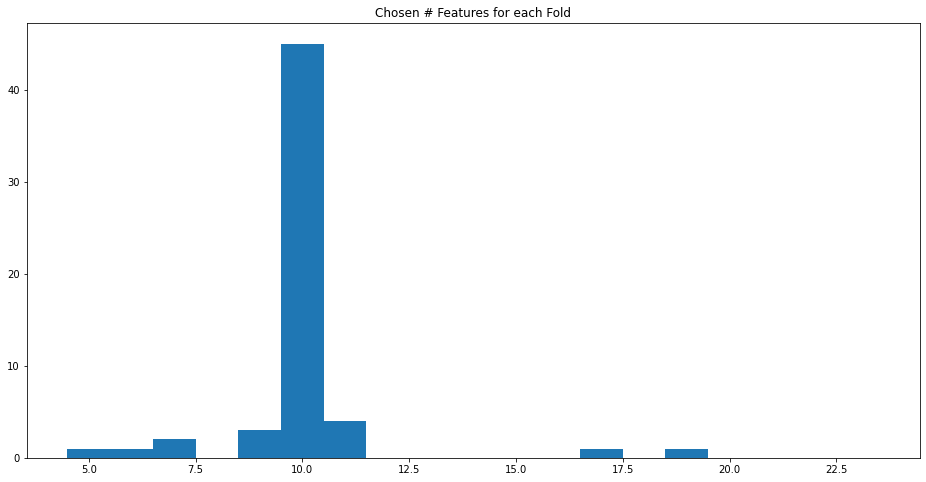

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',decider_misses = 10,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,no_cv=False,or_features=True)

AUC = 0.8930477963979331 also less good.

another idea is to see if a Feature's position in x_fit jumped by more than 5 after another Feature was added.

In [ ]:
import multiprocessing

#parallel

def worker(worker_id,*args):
  automated_leave_k_out(X_encoded,y,method='step_forward_selection',decider_type = abc, decider_misses = 5,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,no_cv=False,or_features=True)
  #outcome.append(make_trees(gens[int(nr_folds*worker_id/multiprocessing.cpu_count()):int(nr_folds*(worker_id+1)/multiprocessing.cpu_count())]))

#manager = multiprocessing.Manager()
#list_of_dicts = manager.list()

process = {}
process[0] = multiprocessing.Process(
    target=worker, args=[0,'jump'])
process[0].start()
process[1] = multiprocessing.Process(
    target=worker, args=[1,'history'])
process[1].start()
# for i in range(multiprocessing.cpu_count()):
#   process[i] = multiprocessing.Process(
#     target=worker, args=[i,abc])
#   process[i].start()
#for i in range(multiprocessing.cpu_count()):
#  process[i].join()

#list_of_dicts = [item for sublist in list(list_of_dicts) for item in sublist]

this doesn't do anything.

In [ ]:
automated_leave_k_out(X_encoded,y,method='step_forward_selection',decider_type = 'jump',decider_min_jumps = 5,keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=5,no_cv=False,or_features=True)

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
['chol', 'restecg_0.0']
['restecg_2.0', 'exang']
['ca_2.0', 'ca_1.0']
['chol', 'ca_1.0']
['cp_3.0', 'cp_1.0']
['cp_2.0', 'cp_4.0']
['cp_3.0', 'cp_4.0']
['age', 'ca_0.0']
['ca_1.0', 'ca_0.0']
['ca_2.0', 'ca_0.0']
['thal_7.0', 'thal_3.0']
['ca_3.0', 'thal_3.0']
['slope_2.0', 'slope_1.0']
['cp_3.0', 'sex']
['ca_2.0', 'sex']
['restecg_0.0', 'trestbps']
['restecg_1.0', 'trestbps']
['age', 'trestbps']
['chol', 'thalach']
['restecg_2.0', 'thalach']
['thal_7.0', 'thal_6.0']
['slope_3.0', 'thalach']
['slope_2.0', 'thalach']
['exang', 'thalach']
['restecg_2.0', 'restecg_0.0']
['restecg_1.0', 'restecg_0.0']
['ca_3.0', 'restecg_0.0']
['chol', 'exang']
['ca_2.0', 'ca_1.0']
['restecg_2.0', 'chol']
['restecg_1.0', 'chol']
['sex', 'thal_3.0']
['thal_7.0', 'thal_3.0']
['age', 'ca_0.0']
['ca_2.0', 'ca_0.0']
['cp_3.0', 'cp_4.0']
['cp_2.0', 'cp_4.0']
['ca_1.0', 'oldpeak']
['cp_1.0', 'oldpeak']
['thalach', 'slope_1.0']
['slope_2.0', 'slope_1.0']
['ca_3.0',

TypeError: ignored

it makes no sense that the the longest Features are first, and only 2 features at the end. Also, why is there no 1 Feature.

we can also take out Feature_1 and Feature_2 and use Feature_1 OR Feature_2.

we also have to decide if we want A | B or A | ~B.

because every person is so important, we should look at the 6 people we took out.

https://towardsdatascience.com/preprocessing-encode-and-knn-impute-all-categorical-features-fast-b05f50b4dfaa

In [ ]:
!pip install fancyimpute
from fancyimpute import KNN

In [ ]:
missing = df.loc[(df["ca"]=="?") | (df["thal"]=="?")]
missing

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,?,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,?,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,?,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,?,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,?,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,?,3.0,0


First we need to separate y from X so we don't cheat.

In [ ]:
missing_X = missing.drop(columns='num')
missing_X

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,?
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,?,3.0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,?,7.0
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,?
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,?,7.0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,?,3.0


there is a question if we can use num when missing is part of training data.

maybe but then we have to one-hot-encode everything 300 times. Let's first do it this way.

In [ ]:
df.replace({'?': np.nan},inplace=True)

In [ ]:
# impute data and convert 
imputer = KNN()
encode_data = pd.DataFrame(imputer.fit_transform(df),columns = df.columns)

Imputing row 1/303 with 0 missing, elapsed time: 0.022
Imputing row 101/303 with 0 missing, elapsed time: 0.023
Imputing row 201/303 with 0 missing, elapsed time: 0.024
Imputing row 301/303 with 0 missing, elapsed time: 0.024


In [ ]:
encode_data.iloc[missing.index]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,5.031354,0.0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.571262,3.000000,0.0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.595020,7.000000,1.0
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.506268,2.0
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.525690,7.000000,0.0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000,0.0


Here the KNN did not understand that ca can only be 0,1,2,3 and thal can only be 3,6,7.

In [ ]:
# impute data and convert 
imputer = KNN()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
encode_data.iloc[missing.index]

Imputing row 1/303 with 0 missing, elapsed time: 0.020
Imputing row 101/303 with 0 missing, elapsed time: 0.021
Imputing row 201/303 with 0 missing, elapsed time: 0.022
Imputing row 301/303 with 0 missing, elapsed time: 0.022


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,5.050191
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.593409,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.601413,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.488679
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.520808,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000


There is no change if num is used or not used here so let's not use it.

In [ ]:
from fancyimpute import KNN, NuclearNormMinimization, SoftImpute, BiScaler
imputer = KNN()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = NuclearNormMinimization()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = SoftImpute()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = BiScaler()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

Imputing row 1/303 with 0 missing, elapsed time: 0.023
Imputing row 101/303 with 0 missing, elapsed time: 0.025
Imputing row 201/303 with 0 missing, elapsed time: 0.025
Imputing row 301/303 with 0 missing, elapsed time: 0.026


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,5.050191
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.593409,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.601413,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.488679
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.520808,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000


OverflowError: ignored

In [ ]:
imputer = SoftImpute()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = BiScaler()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

[SoftImpute] Max Singular Value of X_init = 5651.612223
[SoftImpute] Iter 1: observed MAE=2.123357 rank=4
[SoftImpute] Iter 2: observed MAE=2.123520 rank=4
[SoftImpute] Iter 3: observed MAE=2.123523 rank=4
[SoftImpute] Stopped after iteration 3 for lambda=113.032244


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,4.416006
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.501171,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.588925,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,4.259879
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,0.636372,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.260286,3.000000


AttributeError: ignored

In [ ]:
imputer = SoftImpute()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = KNN(k=2)
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = KNN(k=3)
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])
imputer = KNN(k=4)
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

[SoftImpute] Max Singular Value of X_init = 5651.612223
[SoftImpute] Iter 1: observed MAE=2.123357 rank=4
[SoftImpute] Iter 2: observed MAE=2.123520 rank=4
[SoftImpute] Iter 3: observed MAE=2.123523 rank=4
[SoftImpute] Stopped after iteration 3 for lambda=113.032244


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,4.416006
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.501171,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.588925,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,4.259879
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,0.636372,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.260286,3.000000


Imputing row 1/303 with 0 missing, elapsed time: 0.029
Imputing row 101/303 with 0 missing, elapsed time: 0.031
Imputing row 201/303 with 0 missing, elapsed time: 0.032
Imputing row 301/303 with 0 missing, elapsed time: 0.033


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,4.548357
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.826609,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,1.000000,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.000000
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.000000,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000


Imputing row 1/303 with 0 missing, elapsed time: 0.022
Imputing row 101/303 with 0 missing, elapsed time: 0.024
Imputing row 201/303 with 0 missing, elapsed time: 0.024
Imputing row 301/303 with 0 missing, elapsed time: 0.025


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,5.067434
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.612520,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.668710,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.000000
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.528353,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000


Imputing row 1/303 with 0 missing, elapsed time: 0.021
Imputing row 101/303 with 0 missing, elapsed time: 0.022
Imputing row 201/303 with 0 missing, elapsed time: 0.023
Imputing row 301/303 with 0 missing, elapsed time: 0.023


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.000000,5.390687
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.684030,3.000000
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.530929,7.000000
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.000000,3.000000
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.790186,7.000000
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.000000,3.000000


In [ ]:
imputer = KNN(k=1)
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

Imputing row 1/303 with 0 missing, elapsed time: 0.022
Imputing row 101/303 with 0 missing, elapsed time: 0.023
Imputing row 201/303 with 0 missing, elapsed time: 0.024
Imputing row 301/303 with 0 missing, elapsed time: 0.024


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.0,7.0
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,3.0
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,1.0,7.0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.0,3.0


one is too slow (nuclear_norm, and one doesn't work.)

In [ ]:
imputer = BiScaler()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num').values),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

TypeError: ignored

In [ ]:
imputer = SoftImpute()
encode_data = pd.DataFrame(imputer.fit_transform(df.drop(columns='num')),columns = df.drop(columns='num').columns)
display(encode_data.iloc[missing.index])

This one can do Categorical data.

In [ ]:
import datawig

In [ ]:
df_with_missing_imputed = datawig.SimpleImputer.complete(df.drop(columns='num'))

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

In [ ]:
display(df_with_missing_imputed.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0


So it did thal, but not ca.

In [ ]:
df_with_missing_imputed_2 = datawig.SimpleImputer.complete(df_with_missing_imputed)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

In [ ]:
display(df_with_missing_imputed_2.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.0,7.0
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,0.0,7.0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.0,3.0


Now let's see if anything changes if I use 'num'.

In [ ]:
df_with_missing_imputed = datawig.SimpleImputer.complete(df)
df_with_missing_imputed_2 = datawig.SimpleImputer.complete(df_with_missing_imputed)
display(df_with_missing_imputed_2.iloc[missing.index])

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0


In [ ]:
df_with_missing_imputed_2 = datawig.SimpleImputer.complete(df_with_missing_imputed)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

In [ ]:
display(df_with_missing_imputed_2.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0


In [ ]:
df_with_missing_imputed_3 = datawig.SimpleImputer.complete(df_with_missing_imputed_2)
display(df_with_missing_imputed_3.iloc[missing.index])

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dis

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0


In [ ]:
display(df_with_missing_imputed_3.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,3.0,0
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0,0
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,0.0,7.0,1
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,7.0,2
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,0.0,7.0,0
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,0.0,3.0,0


thal is the same. ca is also the same.

now let's change num

In [ ]:
y_mask = df['num'] > 0
df['num'][y_mask] = 1
df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,1
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,1
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,1
301,57.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,2.0,1.0,3.0,1


In [ ]:
imputer = datawig.SimpleImputer(
    input_columns=df.columns.drop('thal'), # column(s) containing information about the column we want to impute
    output_column='thal', # the column we'd like to impute values for
    )

#Fit an imputer model on the train data
imputer.fit(train_df=df)

#Impute missing values and return original dataframe with predictions
imputed = imputer.predict(df)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if isinstance(result, Series):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-define

In [ ]:
display(imputed.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,thal_imputed,thal_imputed_proba
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,NaN,0,3.0,0.983912
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0,3.0,0.809178
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1,7.0,0.869803
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,NaN,1,7.0,0.885281
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0,7.0,0.411060
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0,3.0,0.899606


This is nice, here we see that the chance for thal to be 3.0 and then 7.0 is 98% and 88.5%.

In [ ]:
imputer = datawig.SimpleImputer(
    input_columns=df.columns.drop('ca'), # column(s) containing information about the column we want to impute
    output_column='ca', # the column we'd like to impute values for
    )

#Fit an imputer model on the train data
imputer.fit(train_df=df)

#Impute missing values and return original dataframe with predictions
imputed = imputer.predict(df)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if isinstance(result, Series):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be

In [ ]:
display(imputed.iloc[missing.index])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,ca_imputed,ca_imputed_proba
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,NaN,0,0.0,0.803429
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0,0.0,0.735482
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1,0.0,0.490887
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,NaN,1,0.0,0.539573
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0,0.0,0.733280
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0,0.0,0.941546


and the chance for ca to be 0 is 73.5%, 49%, 73% and 94%. Maybe don't keep the 49% one?

In [ ]:
imputer = datawig.SimpleImputer(
    input_columns=df.columns.drop(['ca','num']), # column(s) containing information about the column we want to impute
    output_column='ca', # the column we'd like to impute values for
    )

#Fit an imputer model on the train data
imputer.fit(train_df=df)

#Impute missing values and return original dataframe with predictions
imputed = imputer.predict(df)
display(imputed.iloc[missing.index])

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if isinstance(result, Series):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-define

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,ca_imputed,ca_imputed_proba
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,NaN,0,0.0,0.859764
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0,0.0,0.752241
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1,0.0,0.705511
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,NaN,1,0.0,0.749157
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0,0.0,0.688256
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0,0.0,0.946137


now the chances are 75%, 70%, 69% and 94%. 

Either way, with num or without num, we get the same Imputed Value but the chances change a bit (but not enough to change the answer).

In [ ]:
imputer = datawig.SimpleImputer(
    input_columns=df.columns.drop(['thal','num']), # column(s) containing information about the column we want to impute
    output_column='thal', # the column we'd like to impute values for
    )

#Fit an imputer model on the train data
imputer.fit(train_df=df)

#Impute missing values and return original dataframe with predictions
imputed = imputer.predict(df)
display(imputed.iloc[missing.index])

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if isinstance(result, Series):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4213: FutureWarning: 'is_extension_type' is deprecated and will be removed in a future version.  Use 'is_extension_array_dtype' instead.
  if callable(index) or is_dict_like(index):
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-define

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,thal_imputed,thal_imputed_proba
87,53.0,0.0,3.0,128.0,216.0,0.0,2.0,115.0,0.0,0.0,1.0,0.0,NaN,0,3.0,0.987169
166,52.0,1.0,3.0,138.0,223.0,0.0,0.0,169.0,0.0,0.0,1.0,NaN,3.0,0,3.0,0.759907
192,43.0,1.0,4.0,132.0,247.0,1.0,2.0,143.0,1.0,0.1,2.0,NaN,7.0,1,7.0,0.729427
266,52.0,1.0,4.0,128.0,204.0,1.0,0.0,156.0,1.0,1.0,2.0,0.0,NaN,1,7.0,0.713283
287,58.0,1.0,2.0,125.0,220.0,0.0,0.0,144.0,0.0,0.4,2.0,NaN,7.0,0,7.0,0.518275
302,38.0,1.0,3.0,138.0,175.0,0.0,0.0,173.0,0.0,0.0,1.0,NaN,3.0,0,3.0,0.865717


same story with thal. Not using 'num' changes the chances but it doesn't change the Imputed Values. The chances now are 99% and 71%.

I don't think we want all of these. If we have 85% Accuracy, we don't want 'bad data' with a chance of 50% being right.

For now, let's take the 94%, the 98% and the 88.5%. But without num, that actually is only 71%, not 88.5%, so we only use two new points.

In [ ]:
auc_method = automated_leave_k_out(X_encoded,y,method='step_forward_selection',keep_going=True,metric='auc',intermediate_n=True,usage_map=True,gridsearch=True,size_test = 5,size_gridsearch_test=3)

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/99 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

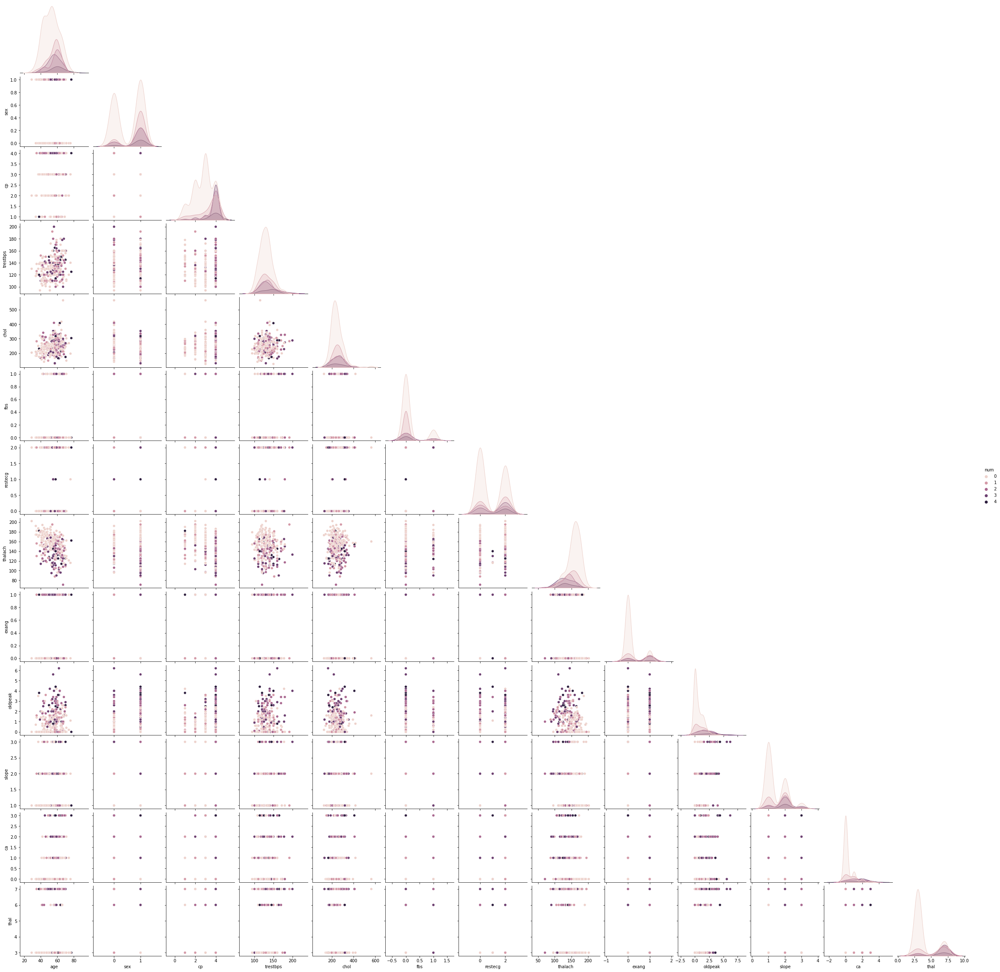

In [41]:
sns.pairplot(df, corner=True, hue = 'num')

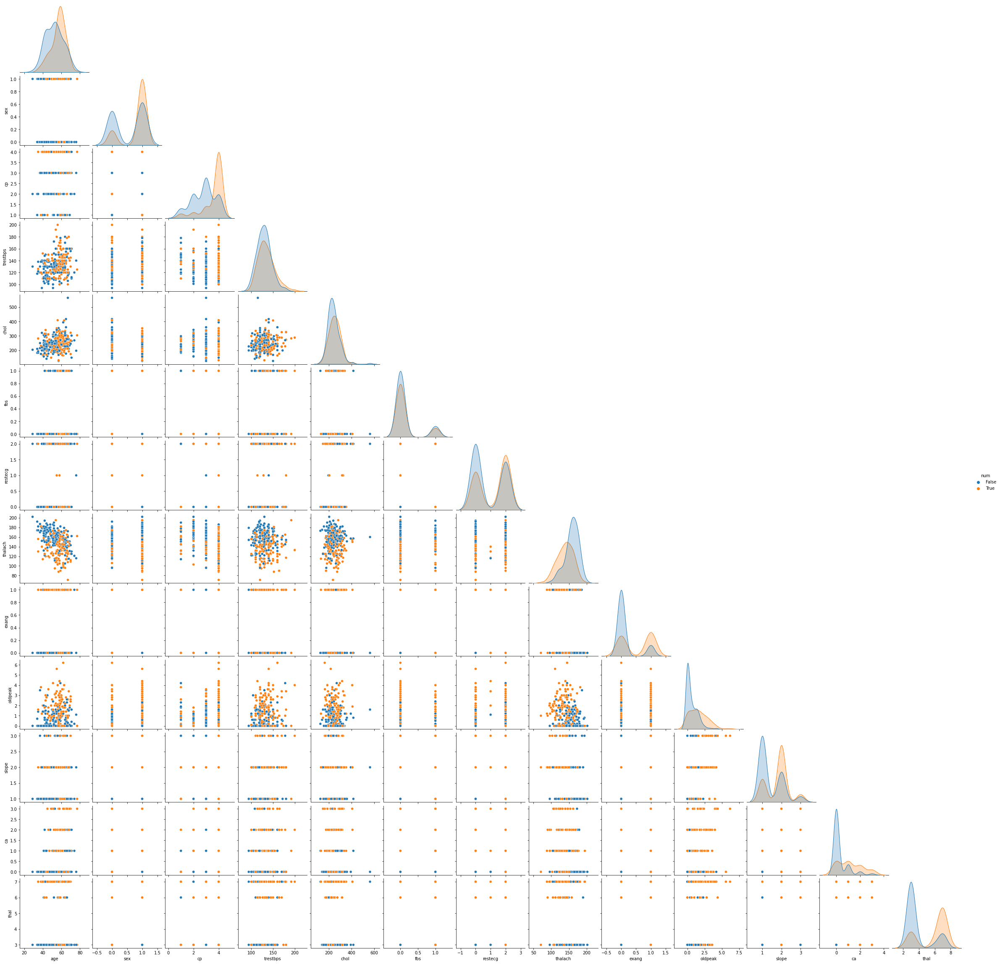

In [45]:
df2 = copy.deepcopy(df)
df2.num = df2.num.apply(lambda row: row > 0)
sns.pairplot(df2, corner=True, hue = 'num')

this pairplot doesn't seem useful for categorical vs categorical because it only puts the most recent dot on top.

maybe first look at num > 1?

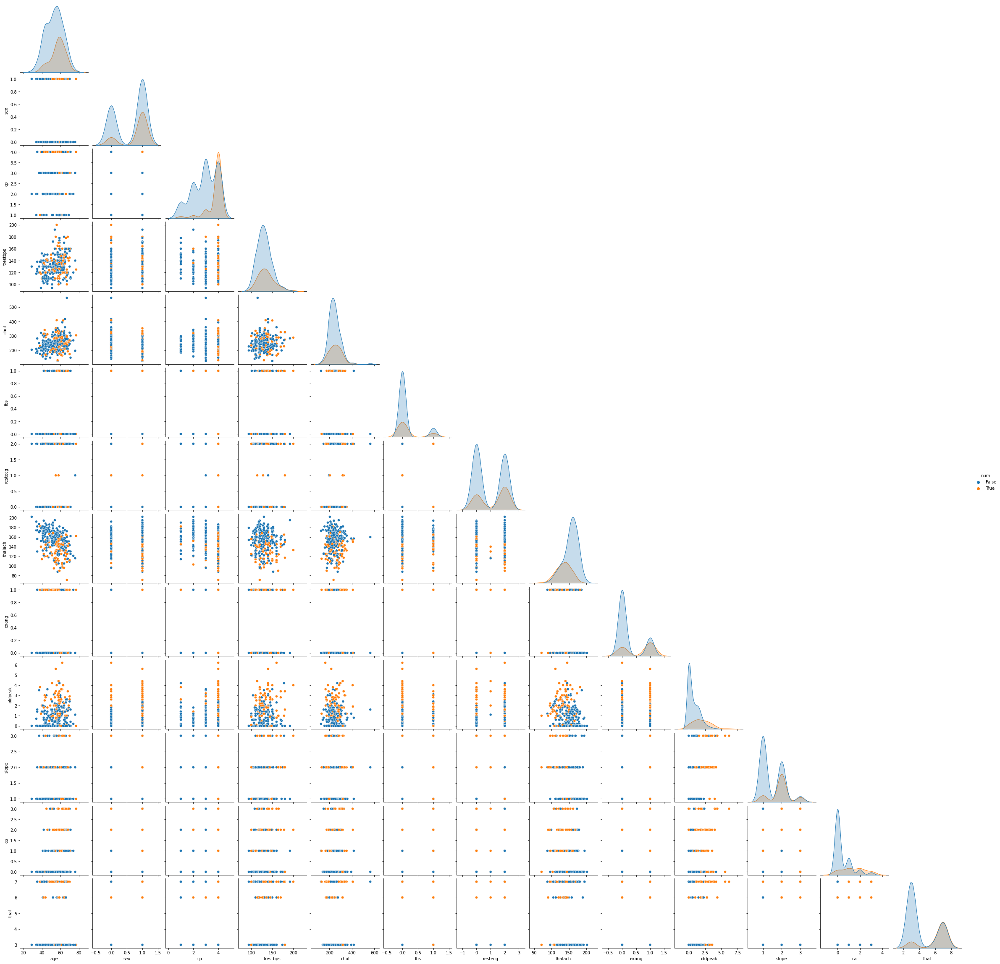

In [46]:
df3 = copy.deepcopy(df)
df3.num = df3.num.apply(lambda row: row > 1)
sns.pairplot(df3, corner=True, hue = 'num')

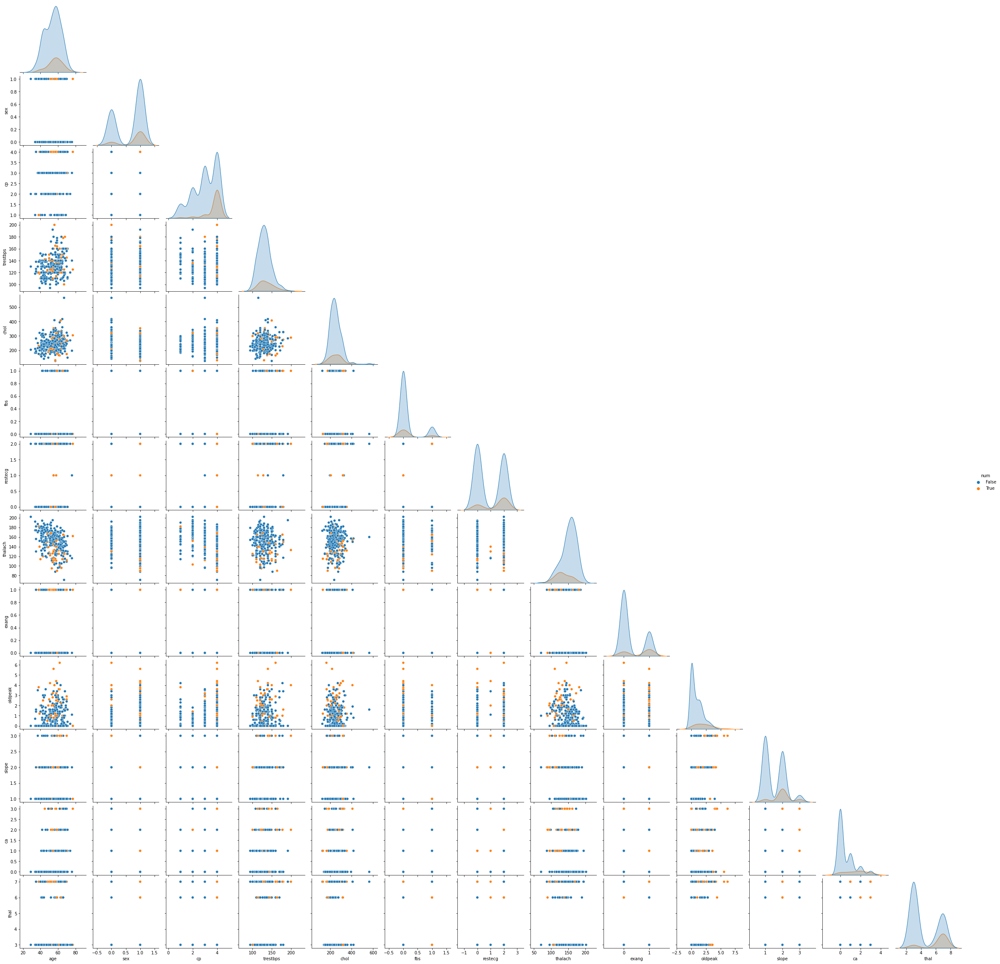

In [47]:
df4 = copy.deepcopy(df)
df4.num = df4.num.apply(lambda row: row > 2)
sns.pairplot(df4, corner=True, hue = 'num')